In [1]:
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms, datasets
from torch.autograd import Variable 
from torch.utils import data
import torchvision.transforms.functional as TF
import torch.nn.functional as F

import h5py 
import numpy as np
import matplotlib.pyplot as plt

torch.manual_seed(0)

import torchvision.transforms as transforms

def one_hot_channels(label):
  if isinstance(label, int):
    temp = np.zeros((1,14,96,64))
    temp[0,label] = np.ones((96,64))
  else:
    temp = np.zeros((len(label),14,96,64))
    for id in range(len(label)):
      temp[id,label[id].cpu()] = np.ones((96,64))
  return np.float32(temp)


class ConEncoder(nn.Module):
    def __init__(self, input_dim, middle_dim, hidden_dim, z_dim):
        super().__init__()
        
        self.model_conv = nn.Sequential(
            nn.Conv2d(in_channels=input_dim+14, out_channels=int(middle_dim/2), kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(int(middle_dim/2)),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Conv2d(in_channels=int(middle_dim/2), out_channels=middle_dim, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(middle_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Conv2d(in_channels=middle_dim, out_channels=hidden_dim, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.10)
        )

        self.fc_mu = nn.Linear(hidden_dim * 12 * 8, z_dim)
        self.fc_logvar = nn.Linear(hidden_dim * 12 * 8, z_dim)

    def forward(self, x, c):
        x =  torch.cat([x, torch.tensor(one_hot_channels(c)).to(device)], 1)
        x = self.model_conv(x)
        x = x.view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

class LSTMDecoder(nn.Module):
    def __init__(self, z_dim, middle_dim, hidden_dim, output_dim):
        super().__init__()
        
        self.model_linear = nn.Sequential(
            
            nn.Linear(z_dim+14, int(middle_dim/2)),
            nn.BatchNorm1d(int(middle_dim/2)),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(int(middle_dim/2), middle_dim),
            nn.BatchNorm1d(middle_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.10)
        )

        self.lstm = nn.LSTM(z_dim, hidden_dim*hidden_dim, batch_first=True)

        self.model_conv = nn.Sequential(
            
            nn.ConvTranspose2d(1,1,stride=4, kernel_size=8, padding=2, output_padding=0, dilation=1),
            nn.BatchNorm2d(1),
            #nn.LeakyReLU(),
            nn.Dropout(0.10),
            #nn.ConvTranspose2d(1,1,stride=2, kernel_size=5),
            #nn.BatchNorm2d(1),
            #nn.LeakyReLU(),
            #nn.Dropout(0.10),
            #nn.ConvTranspose2d(1,1,stride=2, kernel_size=3),
            #nn.BatchNorm2d(1),
            #nn.LeakyReLU(),
            #nn.Dropout(0.10),
            #nn.ConvTranspose2d(1,1,stride=2, kernel_size=4),
            #nn.BatchNorm2d(1)
        )

        #self.softmax = nn.Softmax()
        self.sigmoid = nn.Sigmoid()

    def forward(self, z, hidden):
        #x, hidden = self.lstm(z, hidden)
        #x = self.fc(x)
        #print(z)
        #x = self.model_linear(z)
        x, hidden = self.lstm(z, hidden)
        #print(x.shape)
        x = torch.reshape(x, (-1,1,30,30))
        x = self.model_conv(x)
        #print(x.shape)
        return self.sigmoid(x), hidden

class LDecoder(nn.Module):
    def __init__(self, z_dim, middle_dim, hidden_dim, output_dim):
        super().__init__()
        
        self.model_linear = nn.Sequential(
            nn.Linear(z_dim+14, middle_dim),
            nn.BatchNorm1d(middle_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(middle_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(hidden_dim, 16*24),
            nn.BatchNorm1d(16*24),
            nn.LeakyReLU(),
            nn.Dropout(0.10)
        )

        #self.lstm = nn.LSTM(z_dim, hidden_dim*hidden_dim, batch_first=True)

        self.model_conv = nn.Sequential(
            
            #nn.ConvTranspose2d(1,1,stride=2, kernel_size=4, padding=1, output_padding=0, dilation=1),
            #nn.BatchNorm2d(1),
            #nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.ConvTranspose2d(1,4,stride=2, kernel_size=4, padding=1, output_padding=0, dilation=1),
            nn.BatchNorm2d(4),
            nn.LeakyReLU(),
            nn.Dropout2d(0.10),
            nn.ConvTranspose2d(4,2,stride=2, kernel_size=4, padding=1, output_padding=0, dilation=1),
            nn.BatchNorm2d(2),
            nn.Dropout2d(0.10),
            nn.Conv2d(in_channels=2, out_channels=1, kernel_size=3, stride=1, padding=1)
        )

        #self.softmax = nn.Softmax()
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        #x, hidden = self.lstm(z, hidden)
        #x = self.fc(x)
        #print(z)
        x = self.model_linear(z)
        #x, hidden = self.lstm(z, hidden)
        #print(x.shape)
        x = torch.reshape(x, (-1,1,24,16))
        x = self.model_conv(x)
        #print(x.shape)
        return self.sigmoid(x)

class LinDecoder(nn.Module):
    def __init__(self, z_dim, middle_dim, hidden_dim, output_dim):
        super().__init__()
        
        self.model_linear = nn.Sequential(
            nn.Linear(z_dim+14, middle_dim),
            nn.BatchNorm1d(middle_dim),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(middle_dim, 16*24),
            nn.BatchNorm1d(16*24),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(16*24, 16*48),
            nn.BatchNorm1d(16*48),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(16*48, 32*48),
            nn.BatchNorm1d(32*48),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(32*48, 32*96),
            nn.BatchNorm1d(32*96),
            nn.LeakyReLU(),
            nn.Dropout(0.10),
            nn.Linear(32*96, 64*96),
            nn.BatchNorm1d(64*96),
            nn.Dropout(0.10)
        )

        #self.lstm = nn.LSTM(z_dim, hidden_dim*hidden_dim, batch_first=True)

        self.model_conv = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=1, kernel_size=3, stride=1, padding=1)
        )

        #self.softmax = nn.Softmax()
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        #x, hidden = self.lstm(z, hidden)
        #x = self.fc(x)
        #print(z)
        x = self.model_linear(z)
        #x, hidden = self.lstm(z, hidden)
        #print(x.shape)
        x = torch.reshape(x, (-1,1,96,64))
        x = self.model_conv(x)
        #print(x.shape)
        return self.sigmoid(x)

class VAE(nn.Module):
    def __init__(self, input_dim, middle_dim, hidden_dim, z_dim, output_dim):
        super().__init__()
        
        self.encoder = ConEncoder(input_dim, middle_dim, hidden_dim, z_dim)
        self.decoder = LinDecoder(z_dim, middle_dim, hidden_dim, output_dim)
        
    def forward(self, x, c, hidden=None):
        mu, logvar = self.encoder(x, c)
        z = self.reparameterize(mu, logvar)
        #print(z, z.shape)
        #x_recon, hidden = self.decoder(z.unsqueeze(1), hidden)
        if isinstance(c, int):
          c = torch.tensor(c).to(device)
        z = torch.cat([z, F.one_hot(c,14)], 1)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

input_dim = 1
middle_dim = 24*2
hidden_dim = 30
z_dim = 16*2
output_dim = 96*64

model = VAE(input_dim,middle_dim, hidden_dim, z_dim, output_dim)


In [10]:
import time

In [11]:
def loss_fn(x_recon, x, mu, logvar):
    #print('this',x.shape, x_recon.shape)
    #print(x,x_recon)
    recon_loss = F.binary_cross_entropy(x_recon.view(-1, output_dim), x.view(-1, output_dim), reduction='sum')
    kl_loss = -0.5 * torch.sum(1 + logvar - mu**2 - logvar.exp())
    #kl_loss = torch.mean(-0.5*torch.sum(1+logvar - mu**2 - logvar.exp(), dim=1), dim = 0)
    return 100.0*recon_loss + kl_loss, recon_loss, kl_loss

def train(model, dataloader, optimizer, device):
    model.train()
    train_loss = 0
    train_rloss, train_kloss = 0,0
    for x, c in dataloader:
        x = x.to(device)
        c = c.to(device)
        optimizer.zero_grad()
        x_recon, mu, logvar = model(x,c)
        loss, rloss, kloss = loss_fn(x_recon, x, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        train_rloss += rloss.item()
        train_kloss += kloss.item()
        optimizer.step()
    return train_loss / len(dataloader.dataset), train_rloss / len(dataloader.dataset), train_kloss / len(dataloader.dataset)

def validate(model, dataloader, device):
    model.eval()
    val_loss = 0
    val_rloss, val_kloss = 0, 0
    with torch.no_grad():
        for x, c in dataloader:
            x = x.to(device)
            c = c.to(device)
            x_recon, mu, logvar = model(x,c)
            loss, rloss, kloss = loss_fn(x_recon, x, mu, logvar)#.item()
            val_loss += loss.item()
            val_rloss += rloss.item()
            val_kloss += kloss.item()
    return val_loss / len(dataloader.dataset), val_rloss / len(dataloader.dataset), val_kloss / len(dataloader.dataset)

def train_vae(model, dataloader, num_epochs, device='cpu'):
    optimizer = optim.Adam(model.parameters(), lr=1e-4, capturable=True)

    trainl, trainrl, trainkl, vall, valrl, valkl = [], [], [], [], [], []
    for epoch in range(num_epochs):
        start = time.time()

        train_loss, train_rloss, train_kloss = train(model, dataloader, optimizer, device)
        val_loss, val_rloss, val_kloss = validate(model, dataloader, device)
        trainl += [train_loss]
        trainrl += [train_rloss]
        trainkl += [train_kloss]
        vall += [val_loss]
        valrl += [val_rloss]
        valkl += [val_kloss]
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}")
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))
        
        img = trainset[0][0].unsqueeze(0).to(device)
        lb = torch.tensor([trainset[0][1]]).to(device)
        model.eval()
        with torch.no_grad():
            rec_img, _, _  = model.forward(img, lb)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 2, figsize=(12,6))
        axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        # Save figures
        if (epoch+1)%100==0:
          plt.savefig("cVAE_{}_epochs.png".format(epoch+1), format="png")
        plt.show()
        plt.close()
        if (epoch+1)%100==0:
          torch.save({
            'epoch': epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'trainl': trainl,
            'vall': vall,
            }, "cVAE_noemi_{}_epochs_checkpoint.pt".format(epoch+1))
        

        # Save network parameters
        torch.save(model.state_dict(), 'model_params.pth')
        #torch.save(decoder.state_dict(), 'decoder_params.pth')
    return trainl, trainrl, trainkl, vall, valrl, valkl

In [3]:
class Normalize(transforms.Normalize):
    def __init__(self, feature_min, feature_max):
        self.min = torch.tensor(feature_min, dtype=torch.float32)
        self.range = torch.tensor(feature_max, dtype=torch.float32) - self.min

    def __call__(self, tensor):
        return (tensor - self.min) / self.range

class RotationTransform():
    """Rotate by 90 degrees."""

    def __init__(self):
        self.angle = 90

    def __call__(self, x):
        return TF.rotate(x, self.angle)

In [4]:
class HDF5Dataset(Dataset):

    transform = transforms.Compose([
        #transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(4538.7563,7507.9136),
        #RotationTransform()
        #transforms.Normalize((0.5), (0.5))
    ])
                   
    def __init__(self, h5_path):
        self.h5_path = h5_path #'/content/processed_data_pp.h5'
        f = h5py.File(h5_path, 'r')
        self.mDoppler = f['mDoppler'][:,:,:]
        #self.rdn = f['rdn']
        self.label = np.array(f['labels'], dtype='str')
        self.length = len(self.label)
        self.labels_dict = {'fall on floor of room': 0, 'get in  bed': 1,
                   'get out  bed': 2, 'lie in bed': 3,
                   'roll in bed': 4, 'sit down on bed': 5,
                   'sit down on chair': 6, 'sit in bed': 7,
                   'stand up from bed': 8, 'stand up from chair': 9,
                   'stand up from floor of room': 10, 'walk to bed': 11,
                   'walk to chair': 12, 'walk to room': 13}

    def __getitem__(self, index): #to enable indexing
        doppler = self.mDoppler[index]
        #radar = self.rdn[index]
        label = self.label[index]
        numerical_label = self.labels_dict[label]

        # transform to PIL image
        #image = Image.fromarray(pixels.astype('uint8'), 'RGB') # assume your data is  uint8 rgb

        # transformation here
        # torchvision PIL transformations accepts one image as input
        #radar = self.transform(radar).astype(np.uint8)
        doppler = np.float32(doppler)
        doppler = self.transform(doppler)#.astype(np.uint8))
        return (
                #radar,
                doppler,
               # label,
                numerical_label
        )

    def __len__(self):
        return self.length

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
trainset = HDF5Dataset('/content/drive/MyDrive/PatientActivityRecognition/all_new_data_wrap.h5')
dataloader = torch.utils.data.DataLoader(trainset, shuffle=True, batch_size=32)

In [7]:
model

VAE(
  (encoder): ConEncoder(
    (model_conv): Sequential(
      (0): Conv2d(15, 24, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.1, inplace=False)
      (4): Conv2d(24, 48, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.01)
      (7): Dropout(p=0.1, inplace=False)
      (8): Conv2d(48, 30, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (9): BatchNorm2d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.01)
      (11): Dropout(p=0.1, inplace=False)
    )
    (fc_mu): Linear(in_features=2880, out_features=32, bias=True)
    (fc_logvar): Linear(in_features=2880, out_features=32, bias=True)
  )
  (decoder): LinDecoder(
    (model_lin

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        # nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.xavier_uniform_(m.weight.data)
    if classname.find('Linear') != -1:
        #nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.xavier_uniform_(m.weight.data)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.2)
        nn.init.constant_(m.bias.data, 0)

Epoch 1/500, Train Loss: 447522.2943, Validation Loss: 443245.3876
Time for epoch 1 is 14.719514608383179 sec


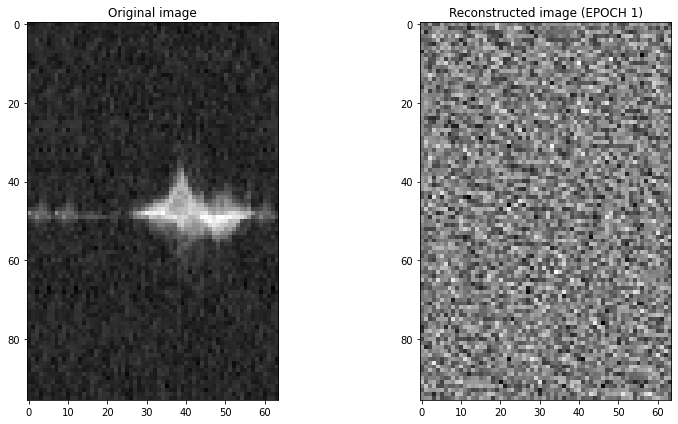

Epoch 2/500, Train Loss: 431357.7657, Validation Loss: 492779.1307
Time for epoch 2 is 8.472392082214355 sec


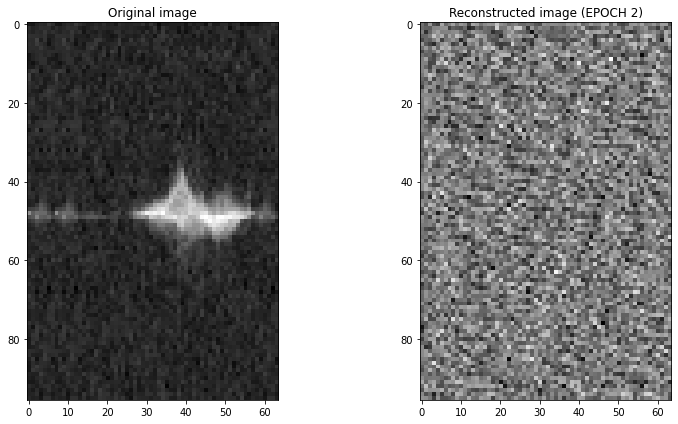

Epoch 3/500, Train Loss: 423020.3556, Validation Loss: 499177.8278
Time for epoch 3 is 9.663299798965454 sec


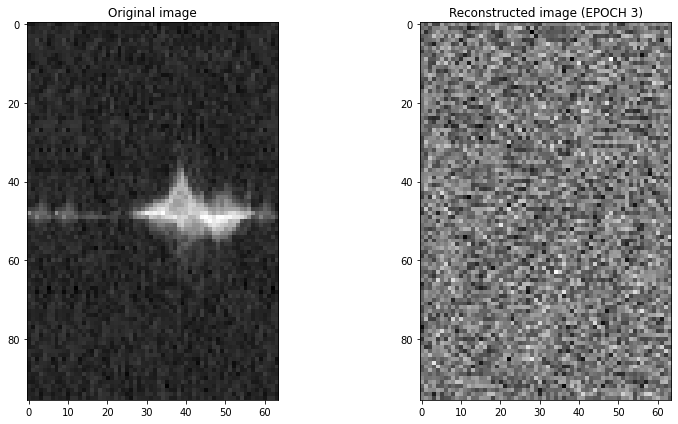

Epoch 4/500, Train Loss: 413532.2365, Validation Loss: 546829.8799
Time for epoch 4 is 9.388003587722778 sec


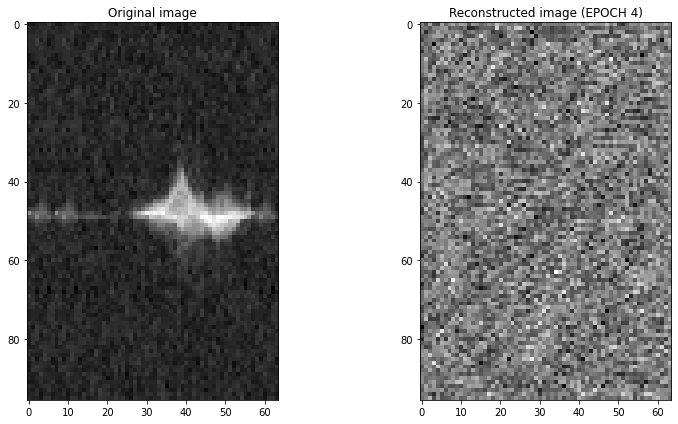

Epoch 5/500, Train Loss: 402349.4014, Validation Loss: 440797.5418
Time for epoch 5 is 9.172979831695557 sec


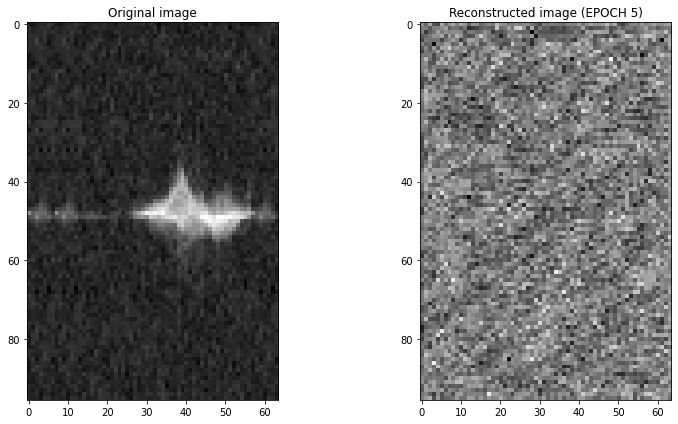

Epoch 6/500, Train Loss: 389707.7553, Validation Loss: 371919.7556
Time for epoch 6 is 8.530452013015747 sec


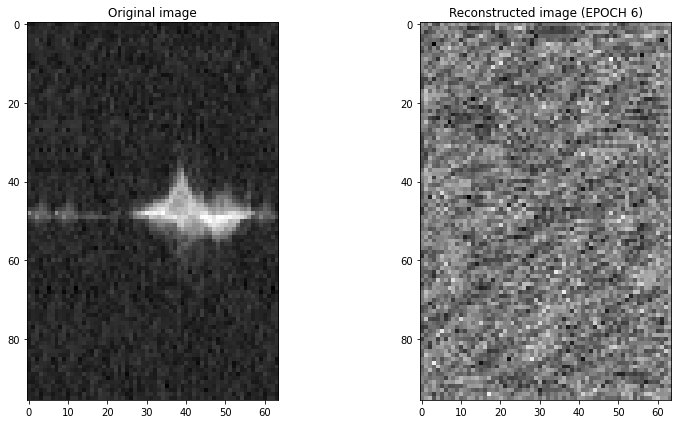

Epoch 7/500, Train Loss: 375051.8539, Validation Loss: 482522.8817
Time for epoch 7 is 8.93444013595581 sec


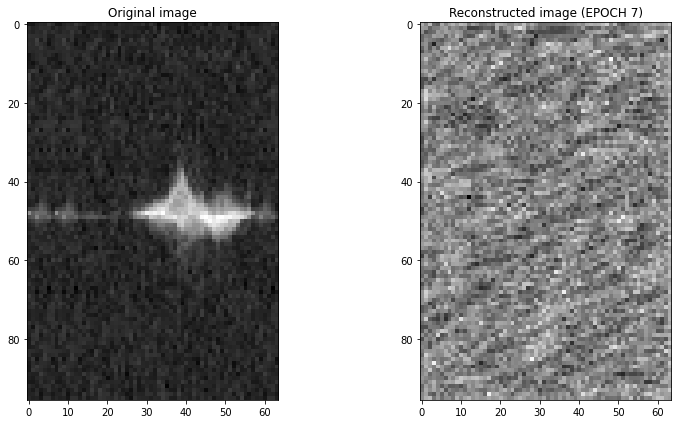

Epoch 8/500, Train Loss: 358018.6294, Validation Loss: 438765.8004
Time for epoch 8 is 8.897709131240845 sec


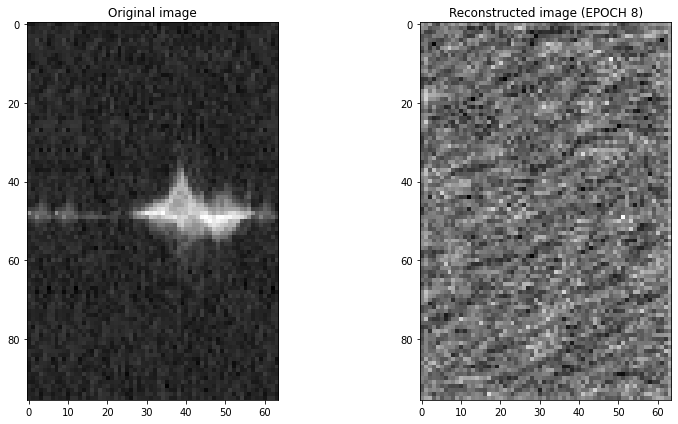

Epoch 9/500, Train Loss: 338858.9775, Validation Loss: 431836.0279
Time for epoch 9 is 9.161720037460327 sec


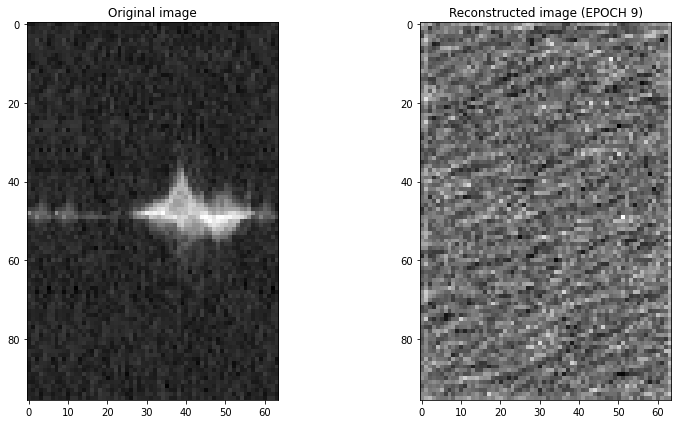

Epoch 10/500, Train Loss: 317896.6650, Validation Loss: 568671.4059
Time for epoch 10 is 8.548091173171997 sec


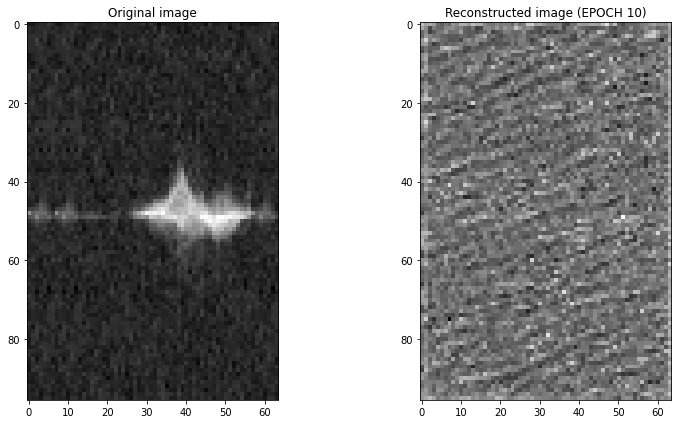

Epoch 11/500, Train Loss: 296729.4517, Validation Loss: 347683.3424
Time for epoch 11 is 9.093031167984009 sec


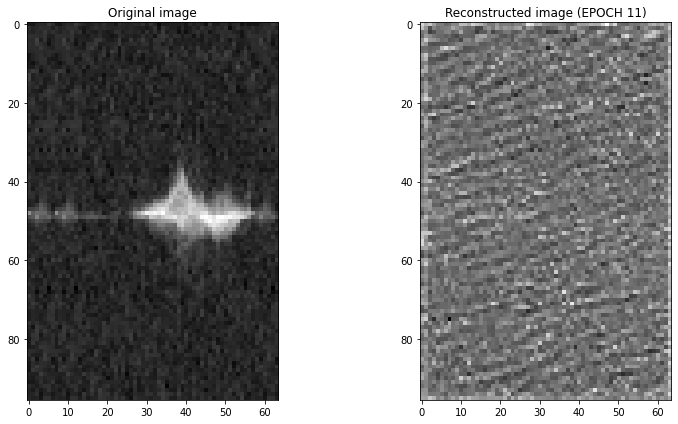

Epoch 12/500, Train Loss: 277212.8431, Validation Loss: 276822.4063
Time for epoch 12 is 9.115125894546509 sec


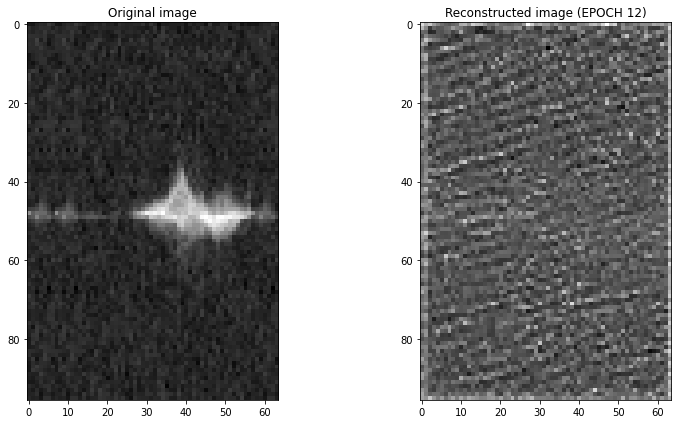

Epoch 13/500, Train Loss: 259637.0583, Validation Loss: 251871.1188
Time for epoch 13 is 8.854866027832031 sec


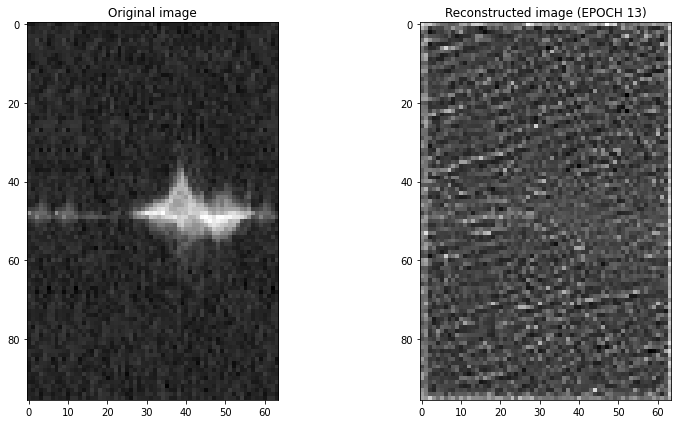

Epoch 14/500, Train Loss: 244007.5858, Validation Loss: 243717.9230
Time for epoch 14 is 8.650714635848999 sec


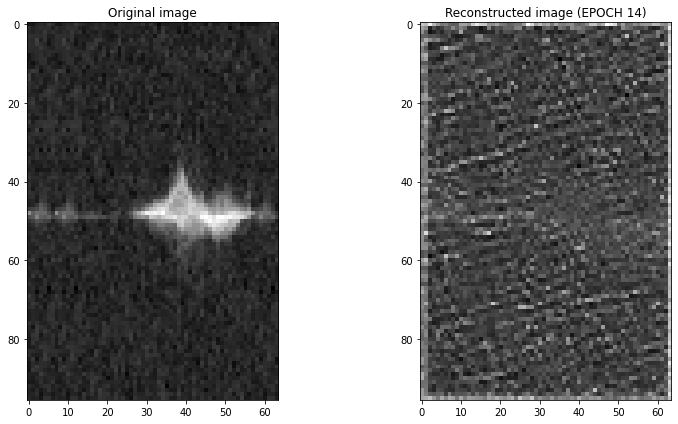

Epoch 15/500, Train Loss: 229831.6648, Validation Loss: 219427.4363
Time for epoch 15 is 9.117806911468506 sec


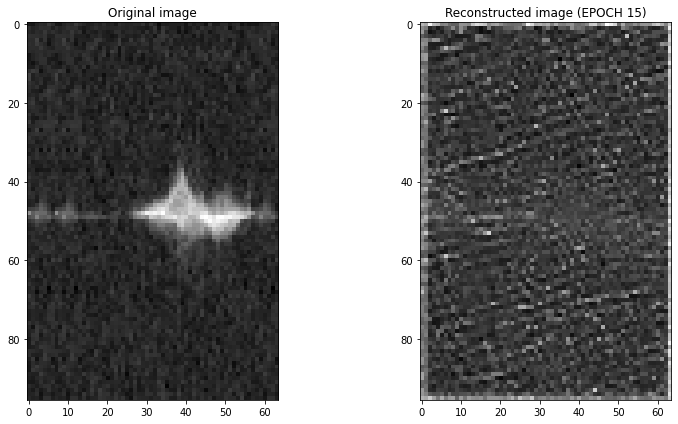

Epoch 16/500, Train Loss: 217512.1126, Validation Loss: 209817.7188
Time for epoch 16 is 9.210264444351196 sec


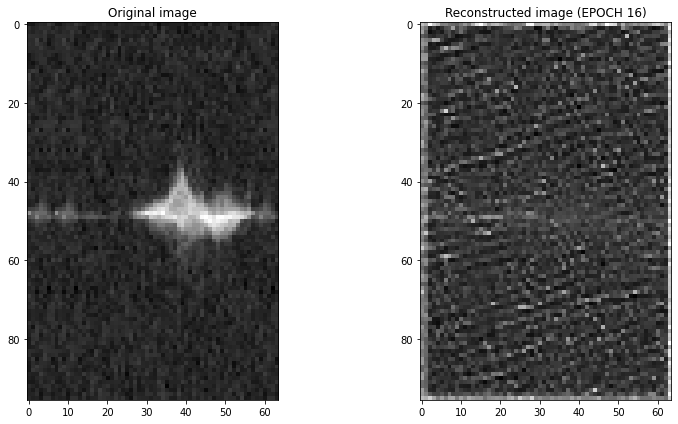

Epoch 17/500, Train Loss: 206425.9552, Validation Loss: 200059.1775
Time for epoch 17 is 8.758437633514404 sec


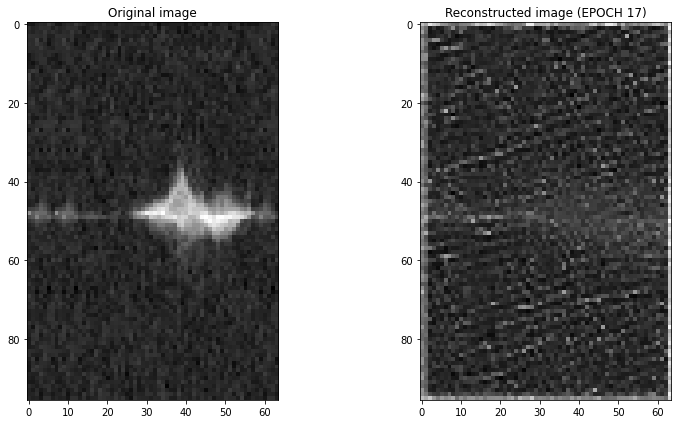

Epoch 18/500, Train Loss: 196938.7423, Validation Loss: 193789.9378
Time for epoch 18 is 9.669657945632935 sec


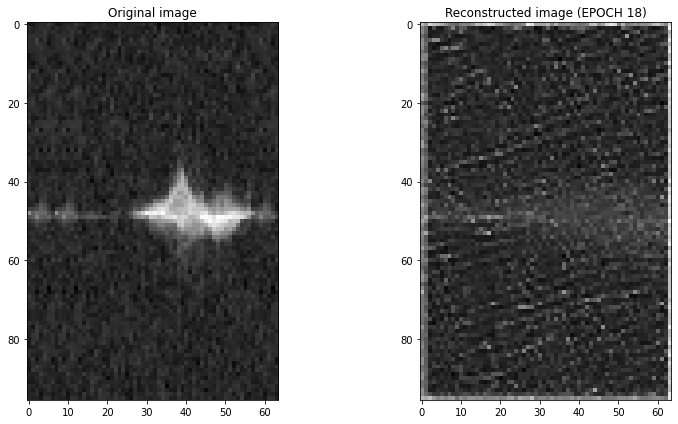

Epoch 19/500, Train Loss: 188565.5232, Validation Loss: 181667.2981
Time for epoch 19 is 9.035608053207397 sec


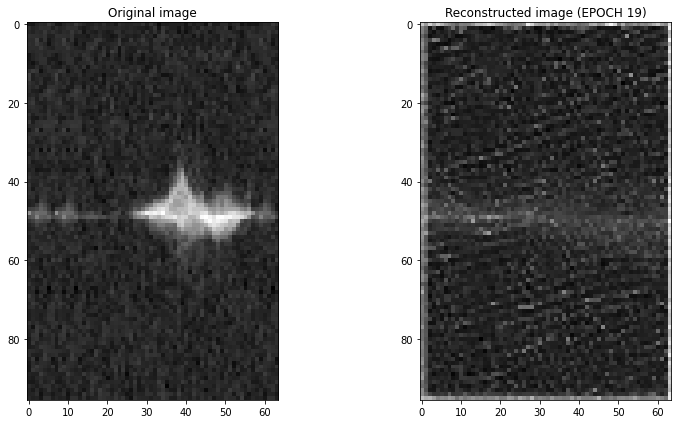

Epoch 20/500, Train Loss: 181495.3825, Validation Loss: 193058.1686
Time for epoch 20 is 9.033549070358276 sec


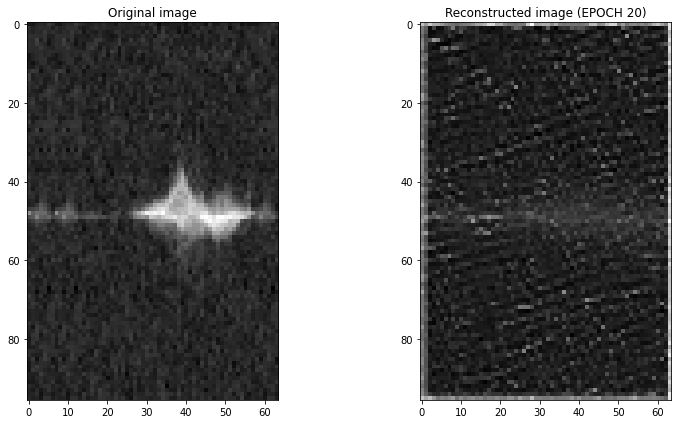

Epoch 21/500, Train Loss: 175697.6716, Validation Loss: 172274.2643
Time for epoch 21 is 8.57854175567627 sec


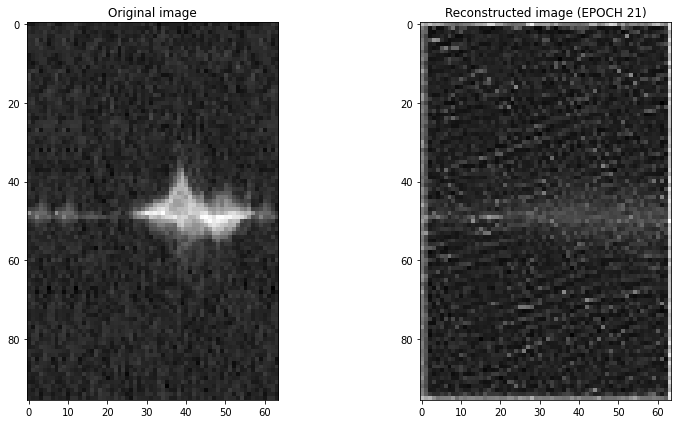

Epoch 22/500, Train Loss: 170633.3670, Validation Loss: 164475.3761
Time for epoch 22 is 9.135063648223877 sec


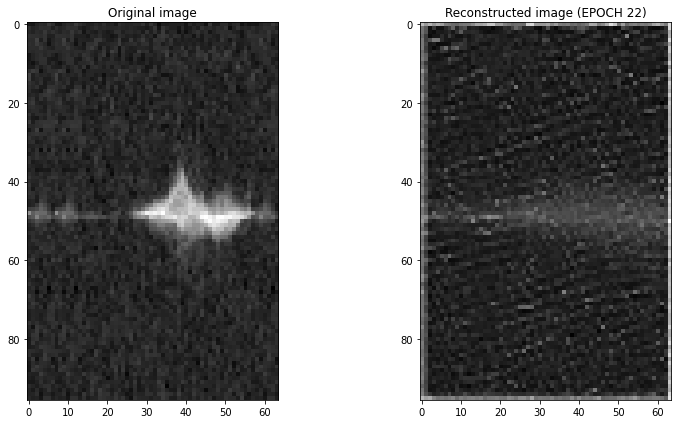

Epoch 23/500, Train Loss: 166257.5952, Validation Loss: 158852.4260
Time for epoch 23 is 9.214117765426636 sec


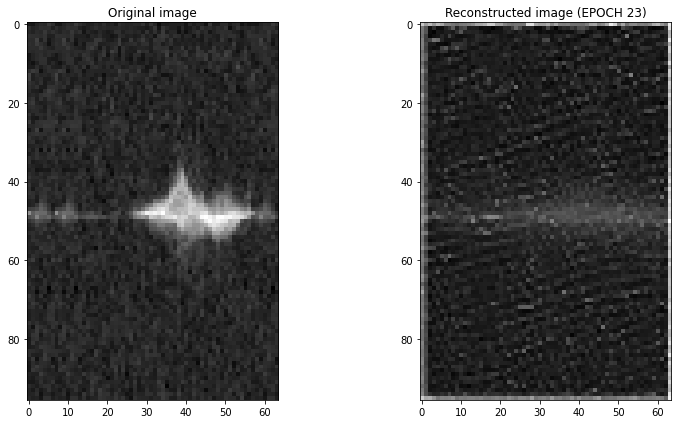

Epoch 24/500, Train Loss: 162677.3613, Validation Loss: 157303.1794
Time for epoch 24 is 8.664863586425781 sec


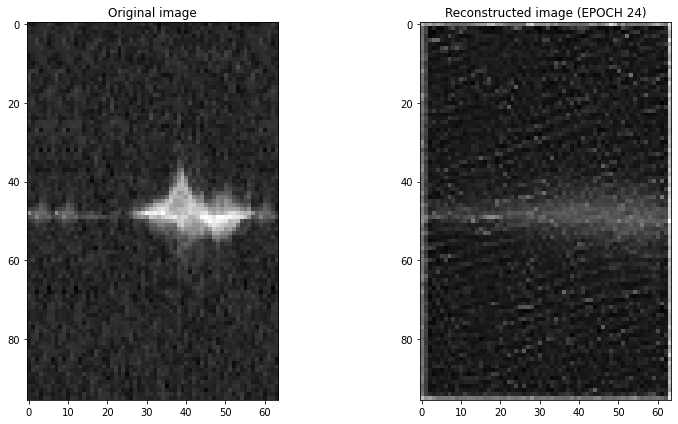

Epoch 25/500, Train Loss: 159695.8534, Validation Loss: 153177.0673
Time for epoch 25 is 8.791923522949219 sec


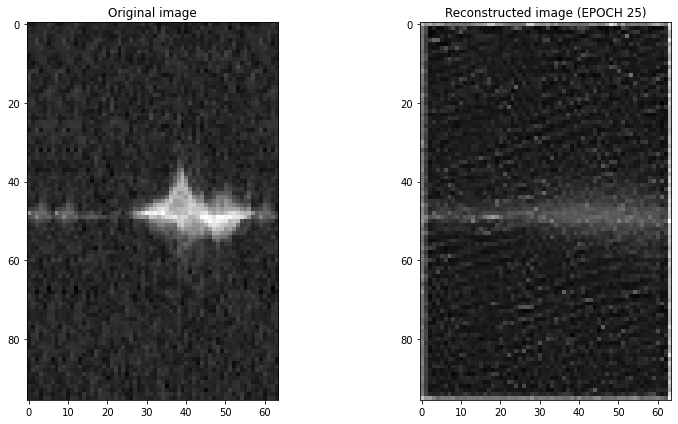

Epoch 26/500, Train Loss: 157226.7058, Validation Loss: 156407.5107
Time for epoch 26 is 9.039864778518677 sec


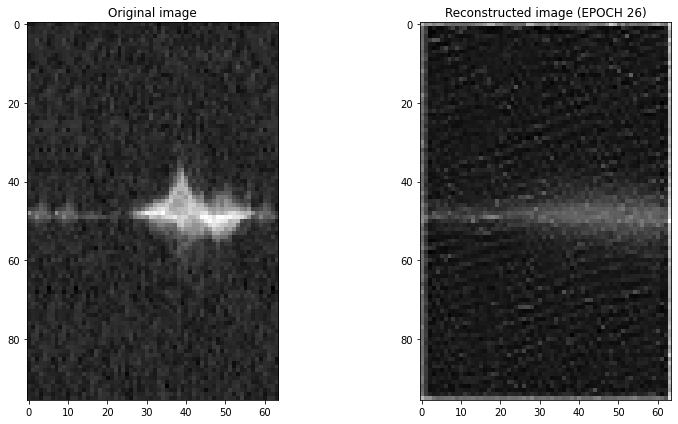

Epoch 27/500, Train Loss: 155126.8283, Validation Loss: 151582.8434
Time for epoch 27 is 9.184088706970215 sec


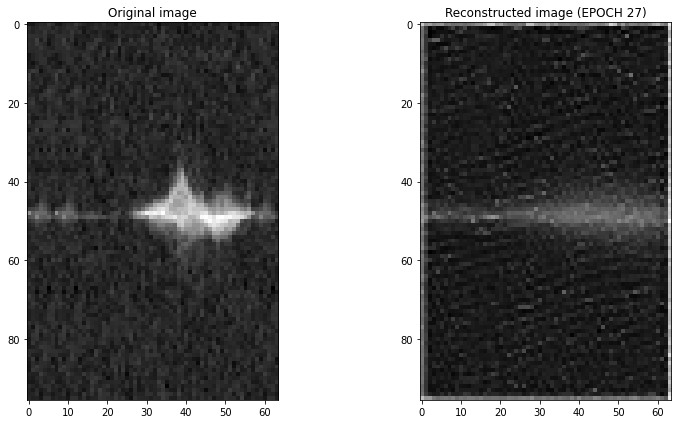

Epoch 28/500, Train Loss: 153498.2725, Validation Loss: 149003.0861
Time for epoch 28 is 8.661558866500854 sec


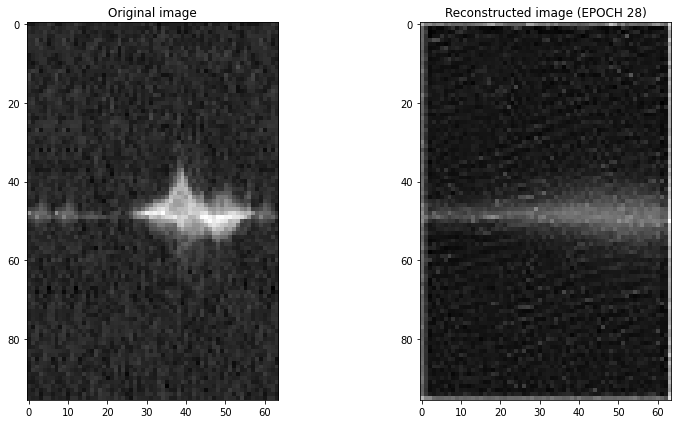

Epoch 29/500, Train Loss: 152361.3863, Validation Loss: 145528.8134
Time for epoch 29 is 8.910988092422485 sec


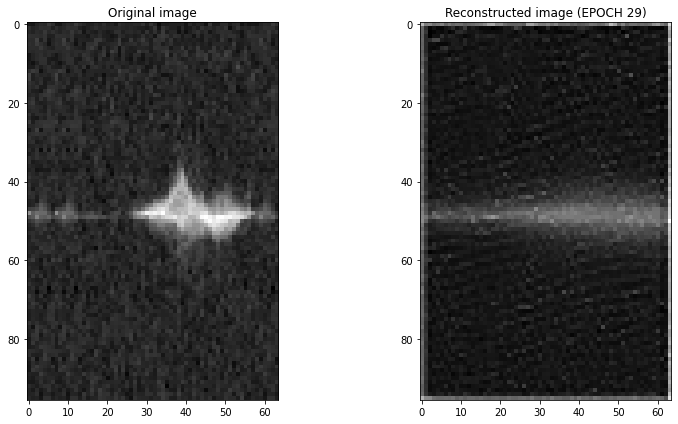

Epoch 30/500, Train Loss: 151166.3989, Validation Loss: 151724.3048
Time for epoch 30 is 9.003082752227783 sec


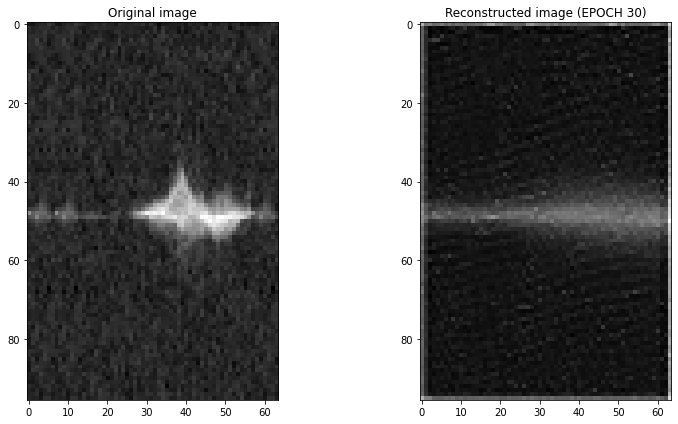

Epoch 31/500, Train Loss: 150234.5529, Validation Loss: 148484.8127
Time for epoch 31 is 9.140071153640747 sec


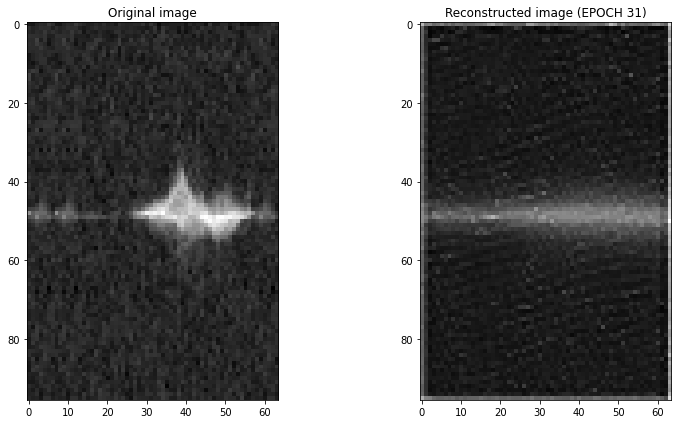

Epoch 32/500, Train Loss: 149517.2402, Validation Loss: 146852.0753
Time for epoch 32 is 8.479973793029785 sec


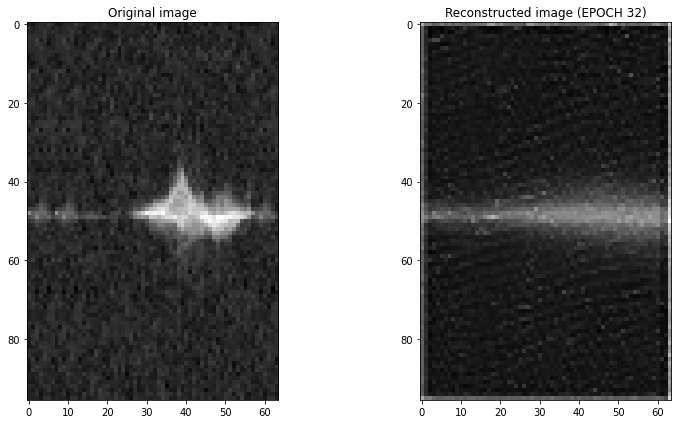

Epoch 33/500, Train Loss: 148865.4080, Validation Loss: 146044.7479
Time for epoch 33 is 8.924561262130737 sec


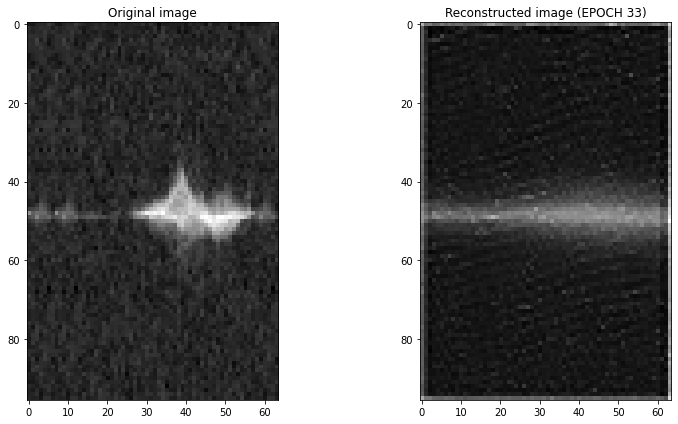

Epoch 34/500, Train Loss: 148427.6722, Validation Loss: 150605.3962
Time for epoch 34 is 9.074329376220703 sec


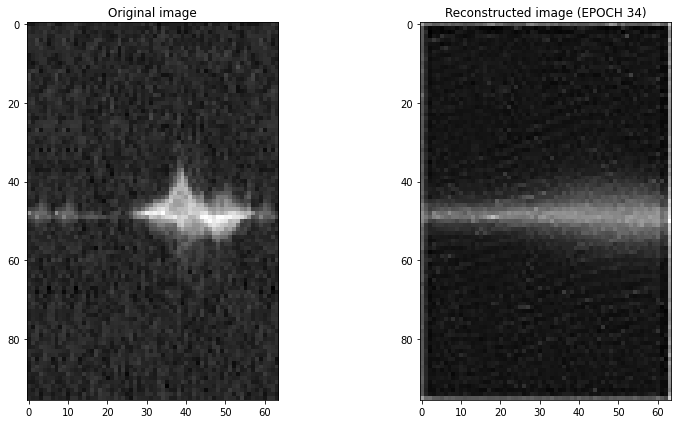

Epoch 35/500, Train Loss: 148086.2738, Validation Loss: 143121.8628
Time for epoch 35 is 8.905861139297485 sec


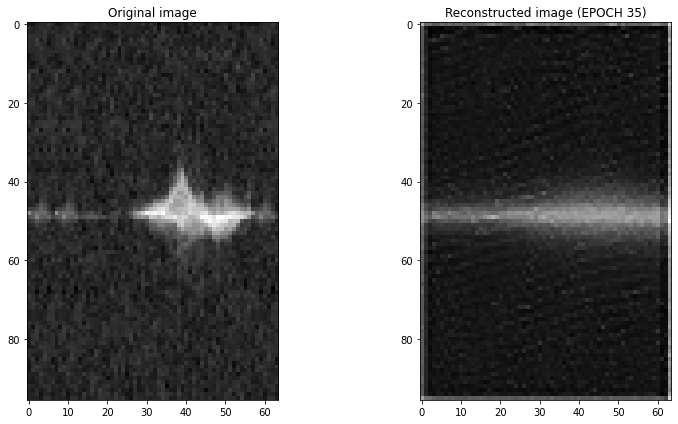

Epoch 36/500, Train Loss: 147785.1755, Validation Loss: 146221.8874
Time for epoch 36 is 8.591859579086304 sec


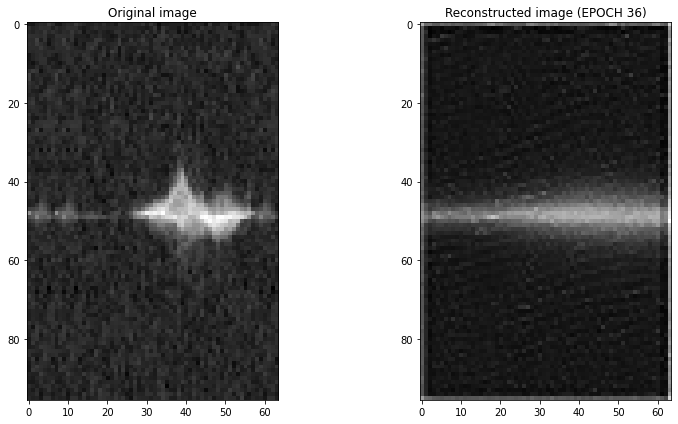

Epoch 37/500, Train Loss: 147447.1955, Validation Loss: 152167.6149
Time for epoch 37 is 9.094265460968018 sec


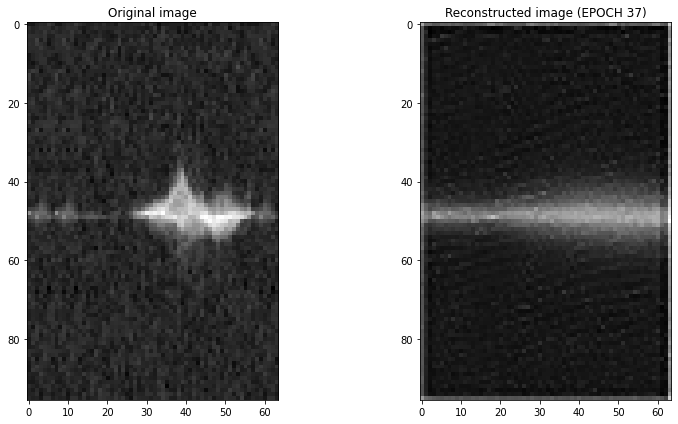

Epoch 38/500, Train Loss: 147212.2413, Validation Loss: 146045.6993
Time for epoch 38 is 9.420222520828247 sec


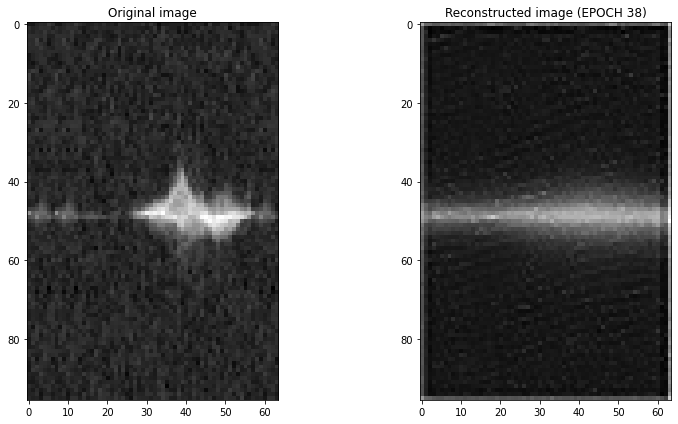

Epoch 39/500, Train Loss: 146978.9171, Validation Loss: 147363.5315
Time for epoch 39 is 9.770186424255371 sec


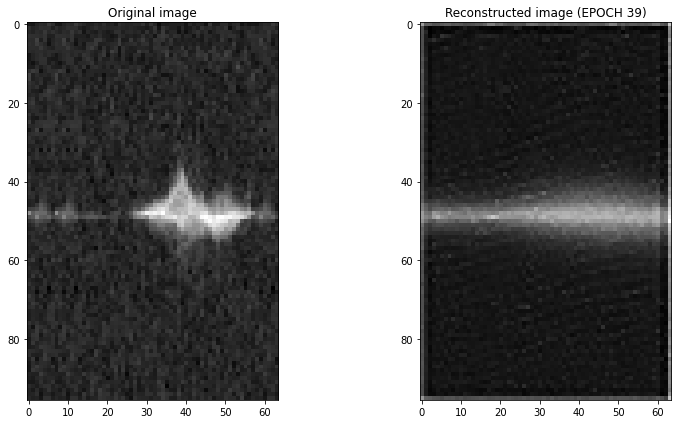

Epoch 40/500, Train Loss: 146780.1781, Validation Loss: 146074.1288
Time for epoch 40 is 9.128687143325806 sec


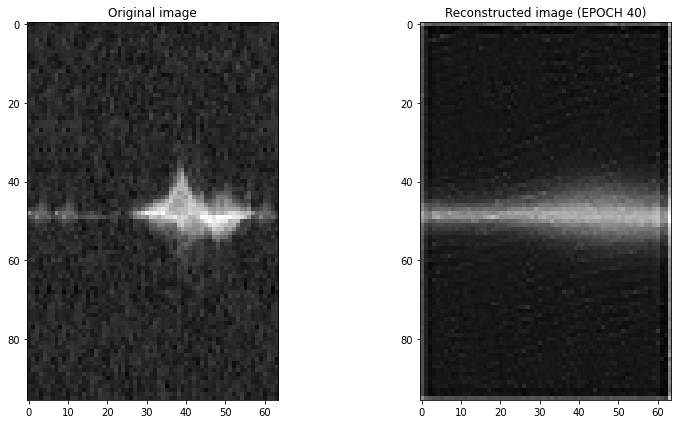

Epoch 41/500, Train Loss: 146568.5321, Validation Loss: 147752.0772
Time for epoch 41 is 9.194847583770752 sec


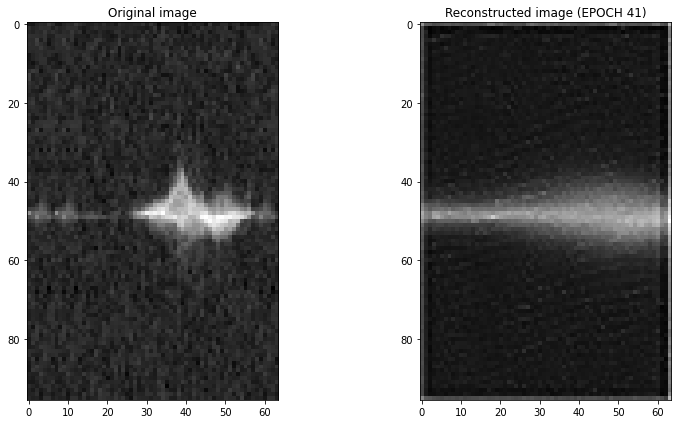

Epoch 42/500, Train Loss: 146381.7930, Validation Loss: 145984.9026
Time for epoch 42 is 9.090328454971313 sec


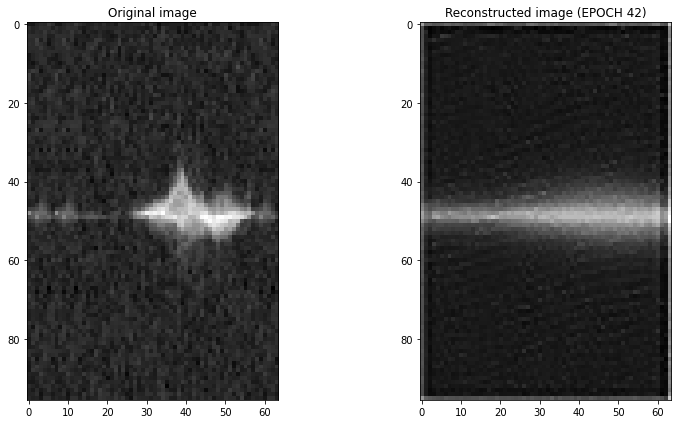

Epoch 43/500, Train Loss: 146197.4327, Validation Loss: 150467.0964
Time for epoch 43 is 8.621108770370483 sec


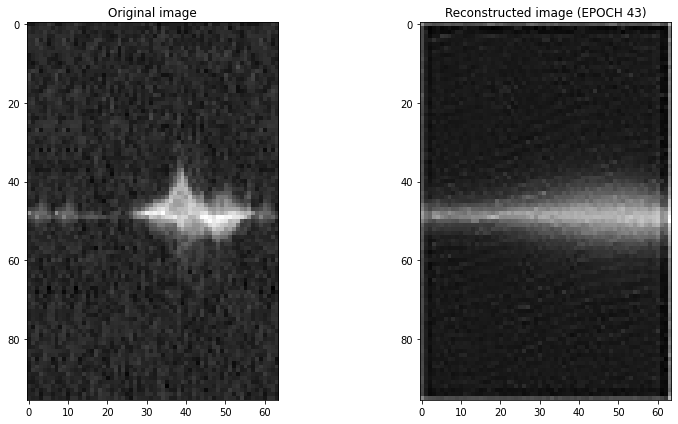

Epoch 44/500, Train Loss: 145987.7338, Validation Loss: 150786.0792
Time for epoch 44 is 8.810590744018555 sec


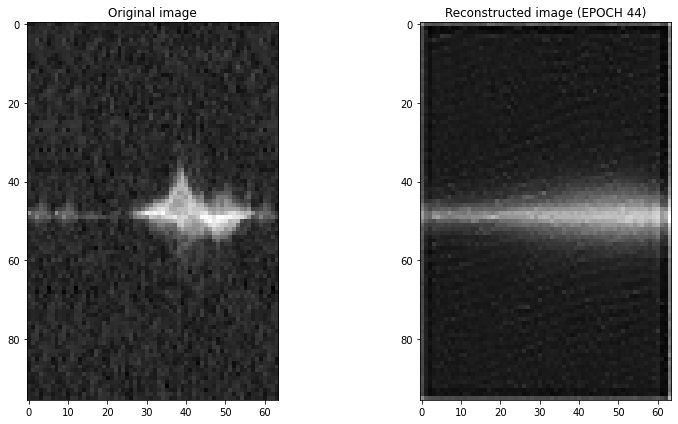

Epoch 45/500, Train Loss: 145803.1172, Validation Loss: 148294.5986
Time for epoch 45 is 9.117085218429565 sec


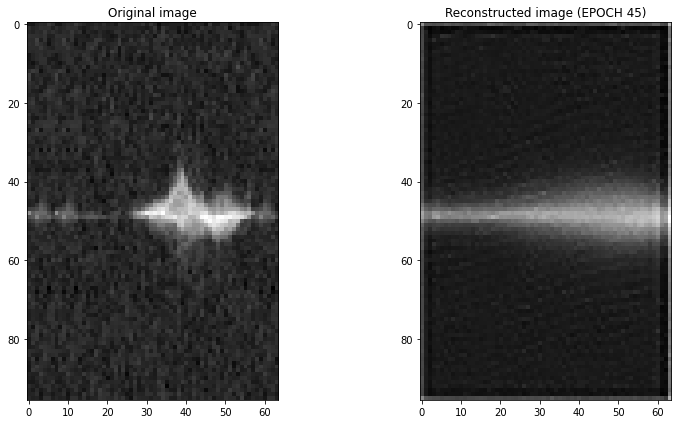

Epoch 46/500, Train Loss: 145630.1555, Validation Loss: 143321.5588
Time for epoch 46 is 9.147534370422363 sec


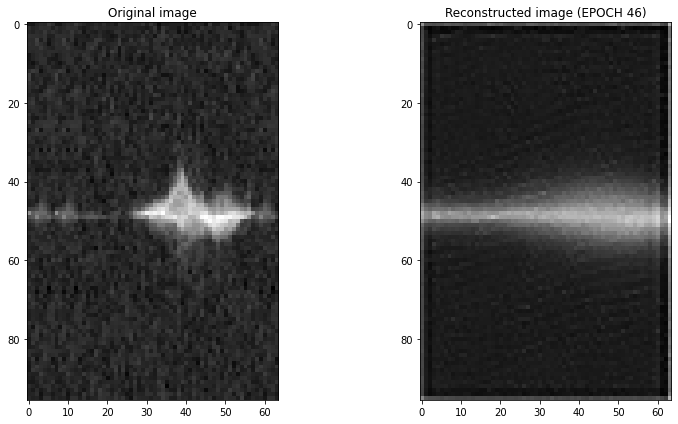

Epoch 47/500, Train Loss: 145450.1928, Validation Loss: 146441.1904
Time for epoch 47 is 8.64447546005249 sec


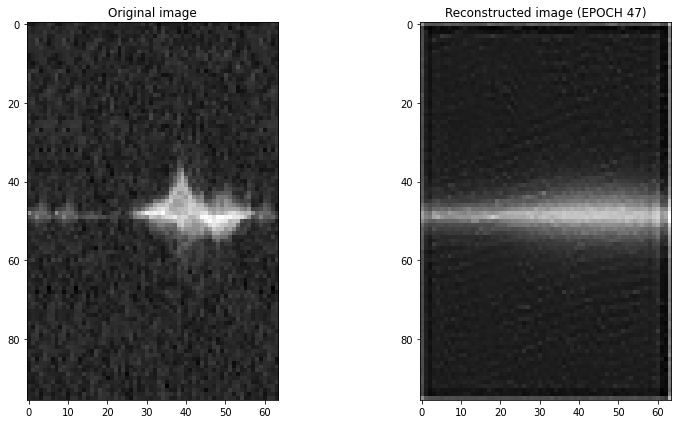

Epoch 48/500, Train Loss: 145297.0623, Validation Loss: 142155.3851
Time for epoch 48 is 8.959388971328735 sec


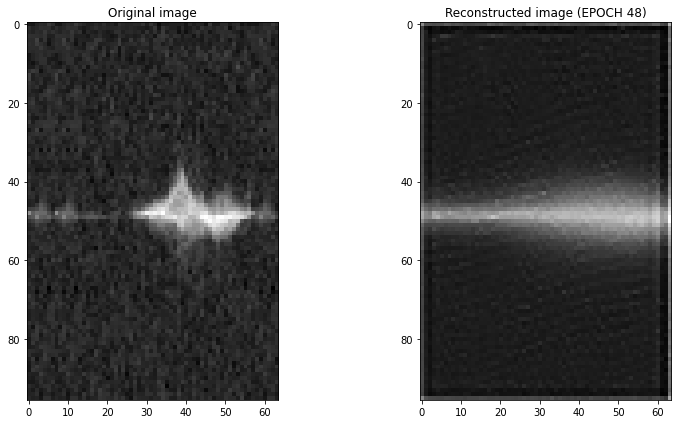

Epoch 49/500, Train Loss: 145116.0392, Validation Loss: 142874.8192
Time for epoch 49 is 8.952452182769775 sec


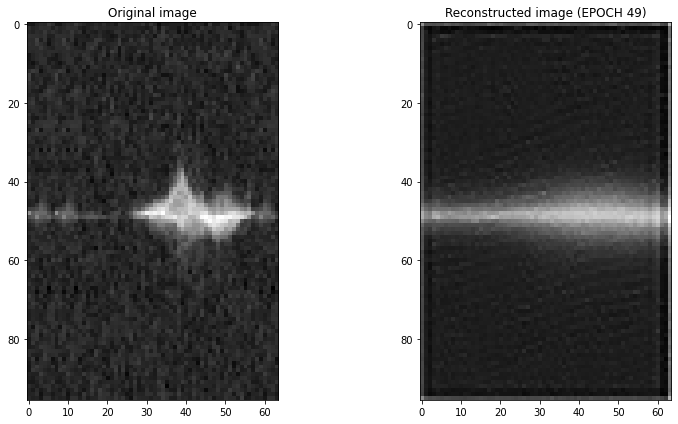

Epoch 50/500, Train Loss: 144925.4976, Validation Loss: 143994.3423
Time for epoch 50 is 8.97956109046936 sec


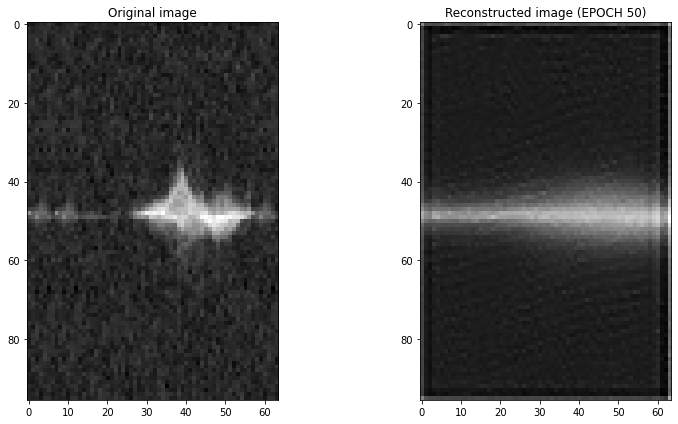

Epoch 51/500, Train Loss: 144780.1614, Validation Loss: 143266.3795
Time for epoch 51 is 8.586045980453491 sec


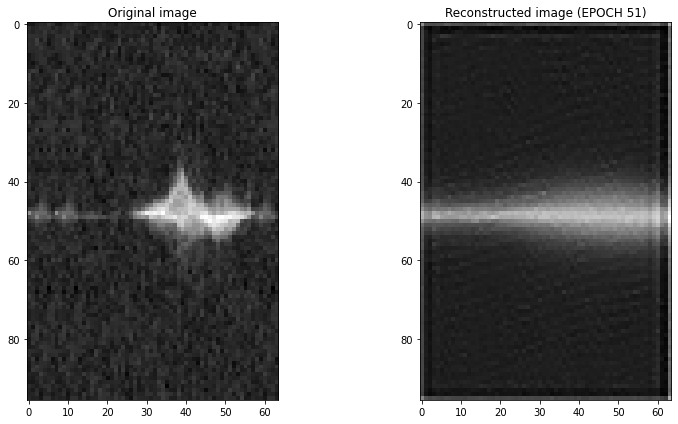

Epoch 52/500, Train Loss: 144591.2397, Validation Loss: 143559.1087
Time for epoch 52 is 9.00499439239502 sec


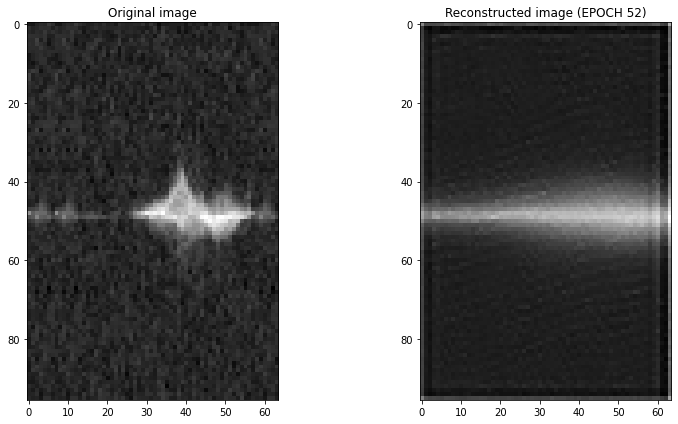

Epoch 53/500, Train Loss: 144421.0888, Validation Loss: 141972.7498
Time for epoch 53 is 9.184823989868164 sec


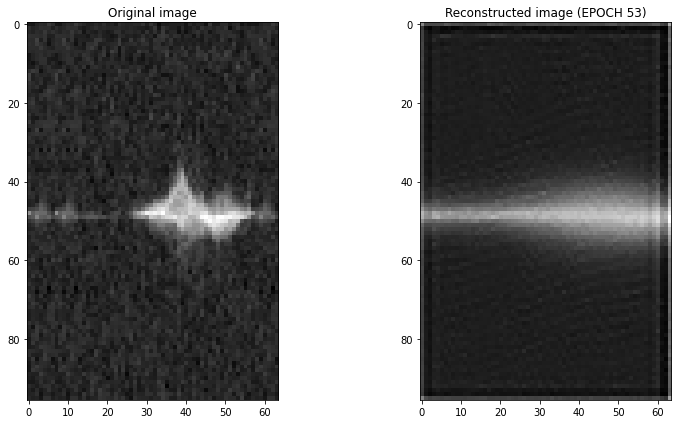

Epoch 54/500, Train Loss: 144249.3039, Validation Loss: 142901.4691
Time for epoch 54 is 8.729933500289917 sec


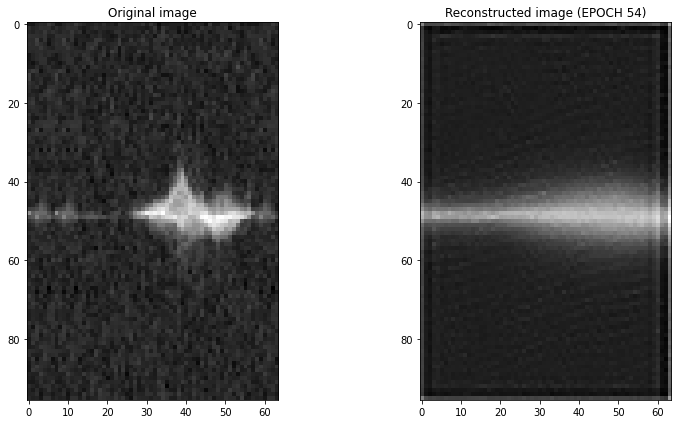

Epoch 55/500, Train Loss: 144107.5975, Validation Loss: 142893.5667
Time for epoch 55 is 8.800792217254639 sec


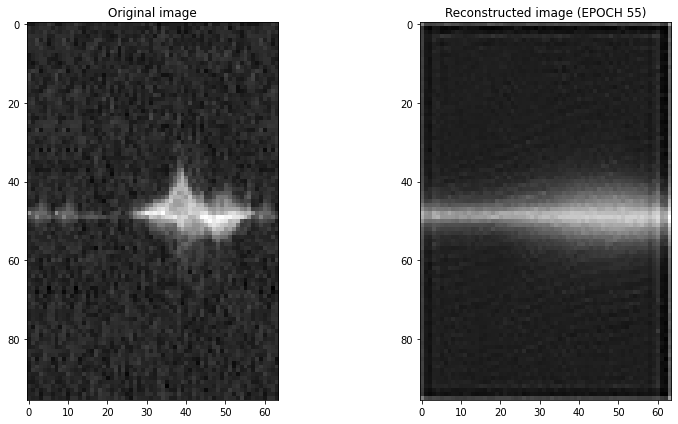

Epoch 56/500, Train Loss: 143940.9192, Validation Loss: 143261.4939
Time for epoch 56 is 9.091884851455688 sec


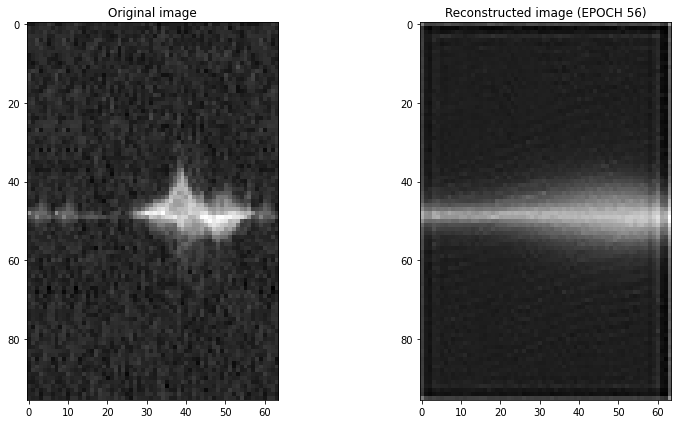

Epoch 57/500, Train Loss: 143797.5344, Validation Loss: 141949.7437
Time for epoch 57 is 9.101701736450195 sec


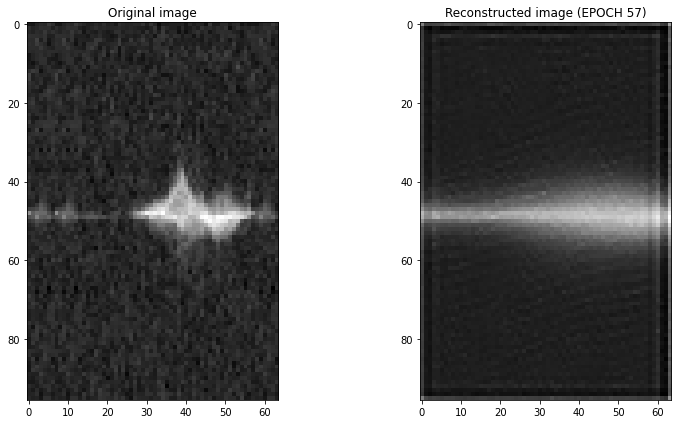

Epoch 58/500, Train Loss: 143644.6812, Validation Loss: 142124.2432
Time for epoch 58 is 8.63256049156189 sec


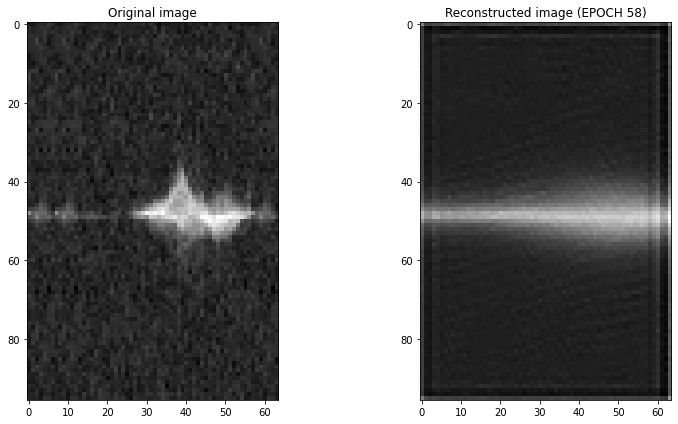

Epoch 59/500, Train Loss: 143488.6775, Validation Loss: 141309.9113
Time for epoch 59 is 8.799302577972412 sec


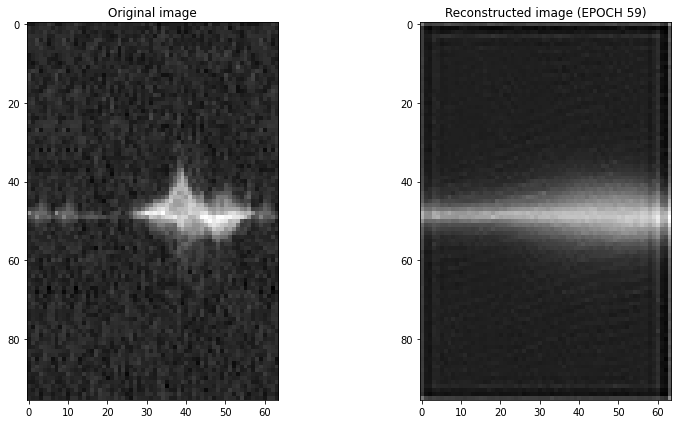

Epoch 60/500, Train Loss: 143359.1575, Validation Loss: 140699.1543
Time for epoch 60 is 9.334010601043701 sec


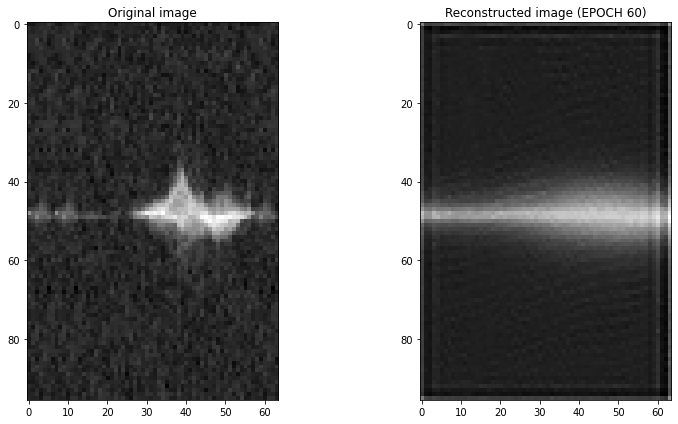

Epoch 61/500, Train Loss: 143208.3464, Validation Loss: 140476.5243
Time for epoch 61 is 9.86338210105896 sec


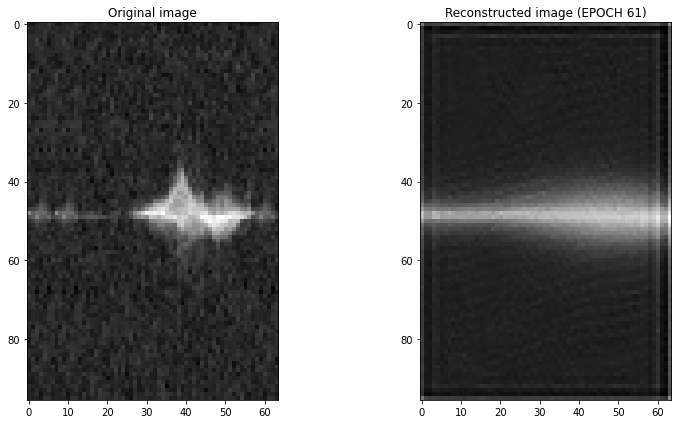

Epoch 62/500, Train Loss: 143051.1821, Validation Loss: 140135.8139
Time for epoch 62 is 8.7566978931427 sec


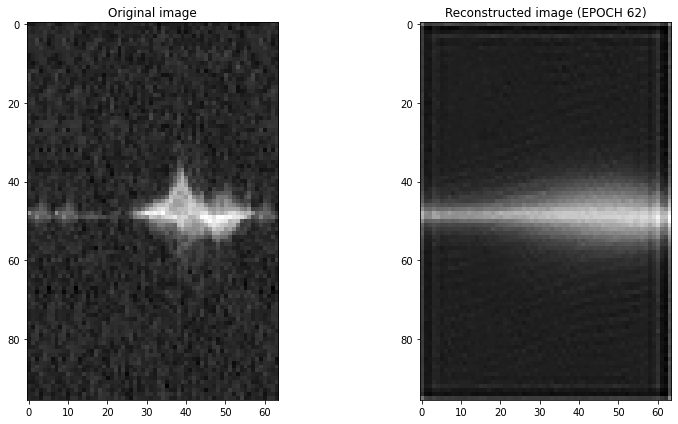

Epoch 63/500, Train Loss: 142948.0535, Validation Loss: 140215.5572
Time for epoch 63 is 8.954298257827759 sec


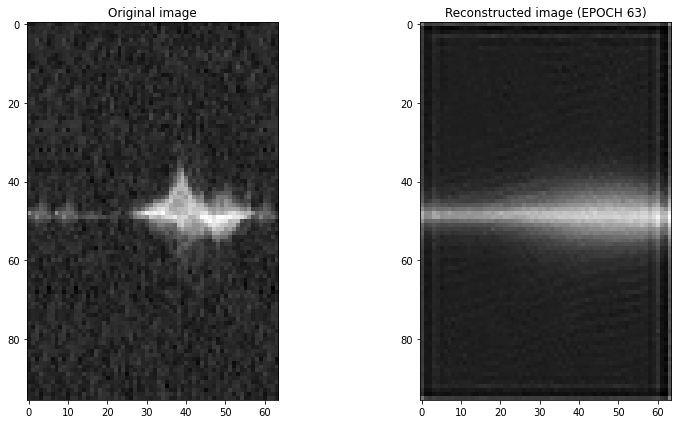

Epoch 64/500, Train Loss: 142811.5818, Validation Loss: 140389.6303
Time for epoch 64 is 9.143816232681274 sec


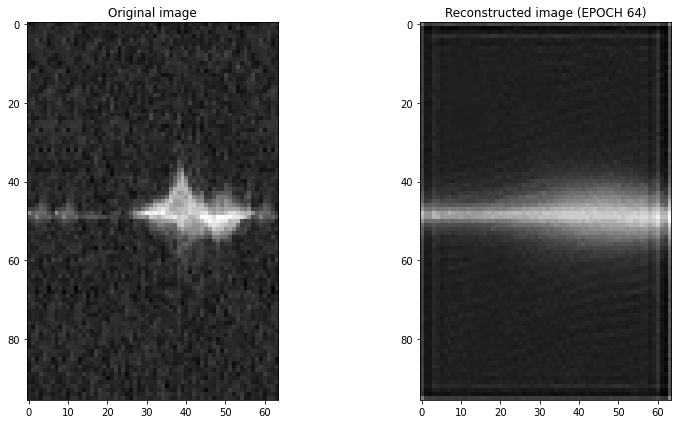

Epoch 65/500, Train Loss: 142675.2814, Validation Loss: 142241.8415
Time for epoch 65 is 9.163836240768433 sec


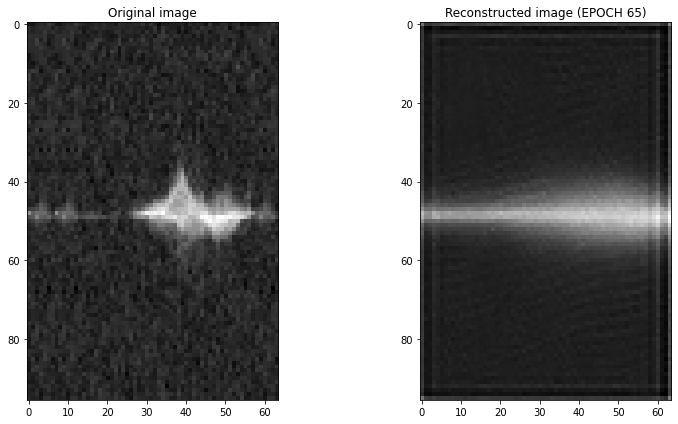

Epoch 66/500, Train Loss: 142554.4405, Validation Loss: 140611.7633
Time for epoch 66 is 8.590859651565552 sec


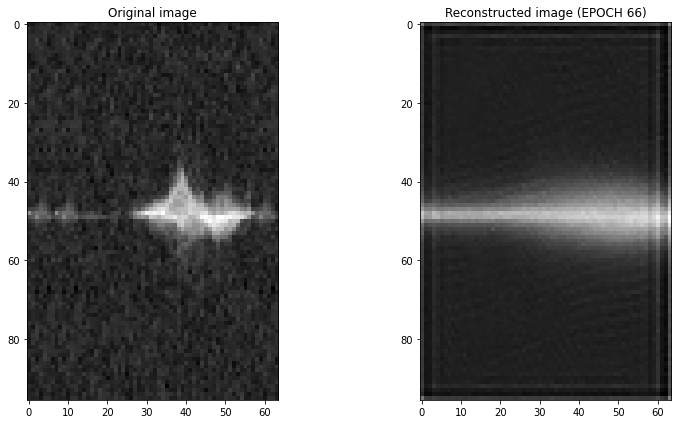

Epoch 67/500, Train Loss: 142436.9251, Validation Loss: 140645.5197
Time for epoch 67 is 9.092894554138184 sec


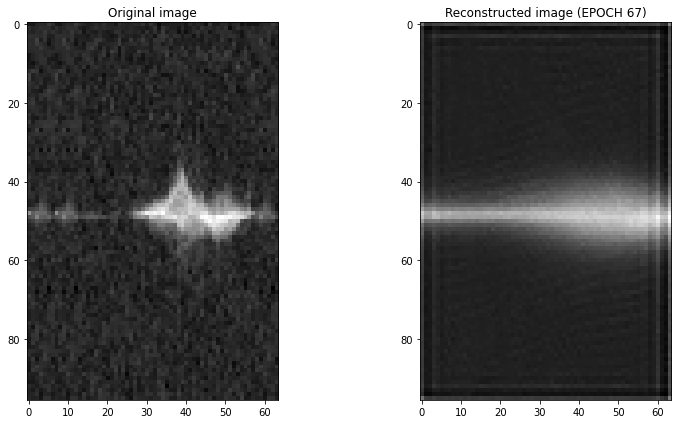

Epoch 68/500, Train Loss: 142329.8746, Validation Loss: 141416.5604
Time for epoch 68 is 9.031007528305054 sec


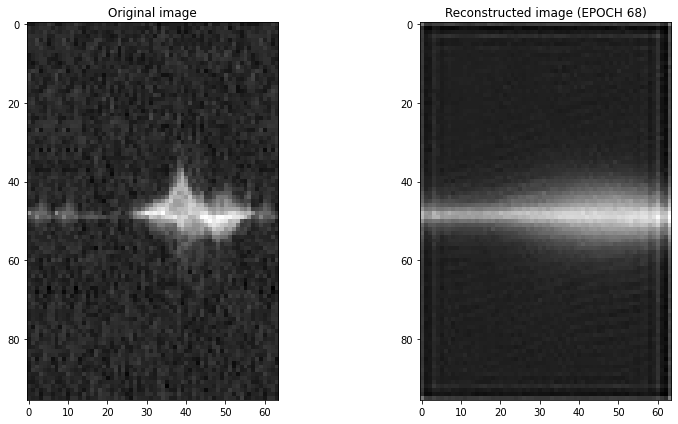

Epoch 69/500, Train Loss: 142227.3404, Validation Loss: 140058.8534
Time for epoch 69 is 8.957980632781982 sec


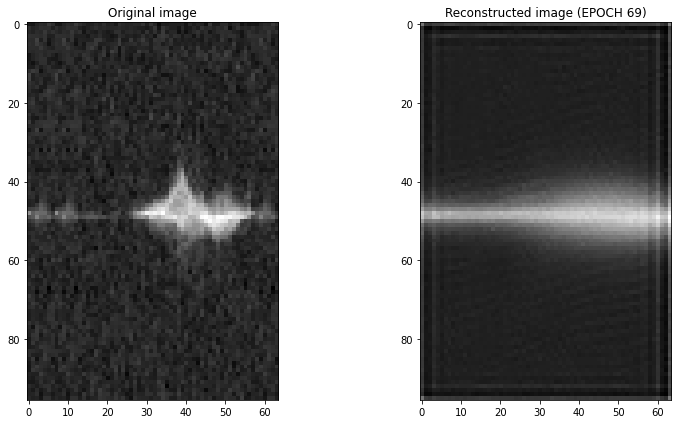

Epoch 70/500, Train Loss: 142119.2341, Validation Loss: 140815.1066
Time for epoch 70 is 8.548344135284424 sec


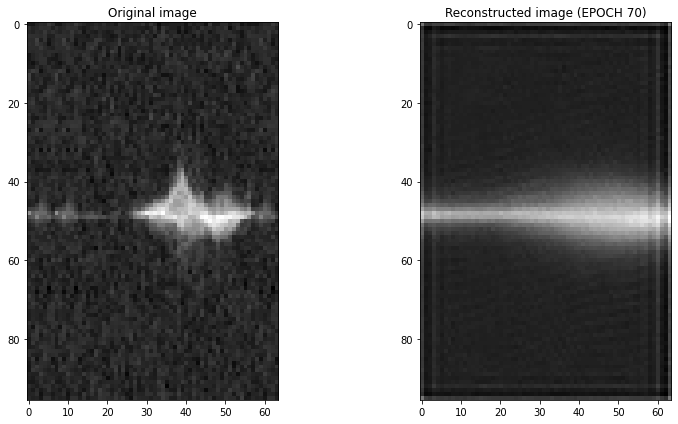

Epoch 71/500, Train Loss: 142019.5741, Validation Loss: 140044.5826
Time for epoch 71 is 9.035254955291748 sec


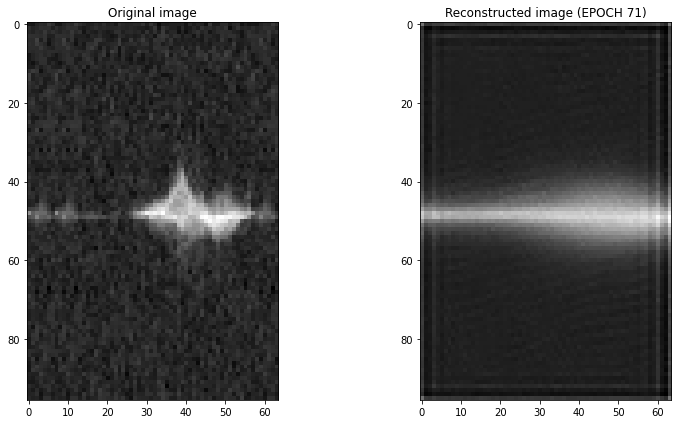

Epoch 72/500, Train Loss: 141992.0292, Validation Loss: 140450.2261
Time for epoch 72 is 9.125545978546143 sec


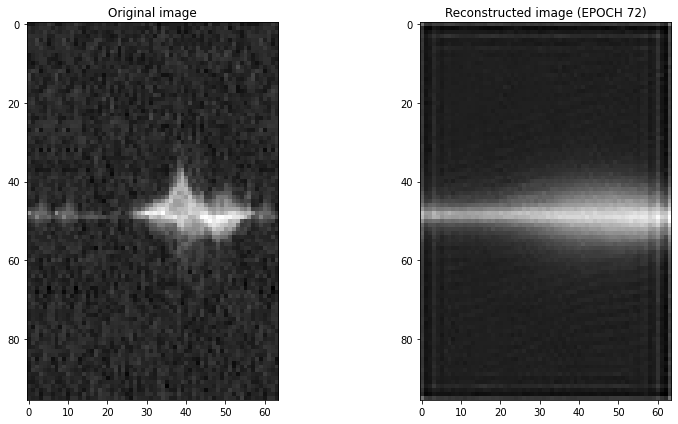

Epoch 73/500, Train Loss: 141889.0814, Validation Loss: 139933.3744
Time for epoch 73 is 8.851871490478516 sec


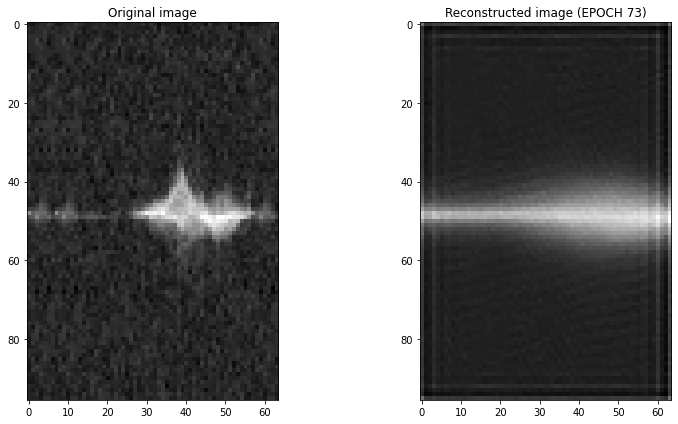

Epoch 74/500, Train Loss: 141785.0951, Validation Loss: 140274.3933
Time for epoch 74 is 8.613853216171265 sec


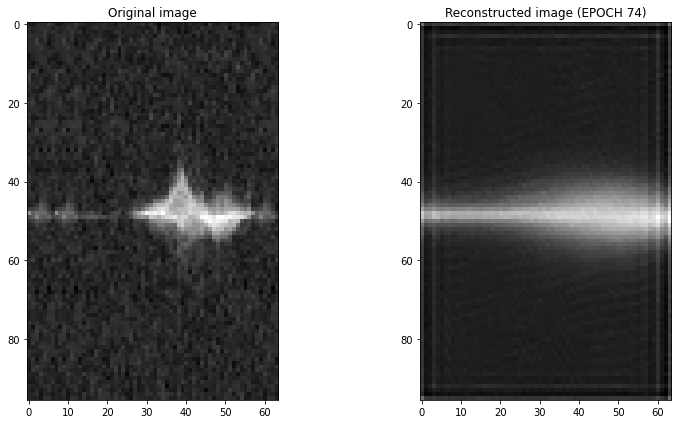

Epoch 75/500, Train Loss: 141695.2081, Validation Loss: 139813.9064
Time for epoch 75 is 9.091787338256836 sec


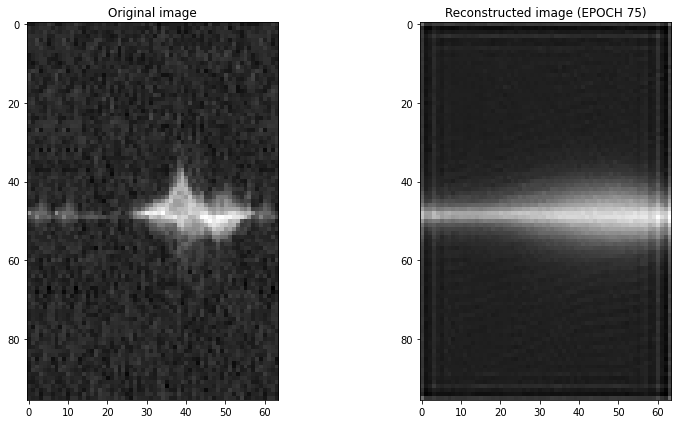

Epoch 76/500, Train Loss: 141611.8054, Validation Loss: 139773.3272
Time for epoch 76 is 9.106879949569702 sec


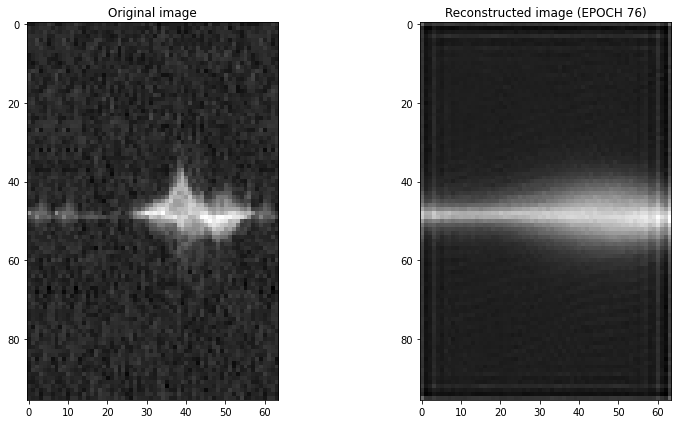

Epoch 77/500, Train Loss: 141530.4275, Validation Loss: 139732.3766
Time for epoch 77 is 8.695643901824951 sec


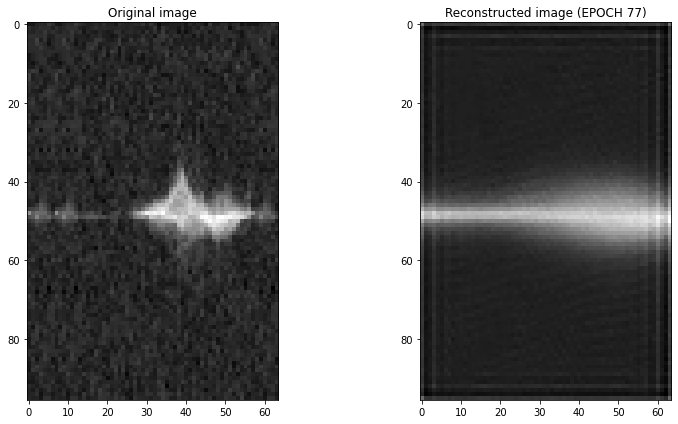

Epoch 78/500, Train Loss: 141464.2819, Validation Loss: 139664.7620
Time for epoch 78 is 9.131855010986328 sec


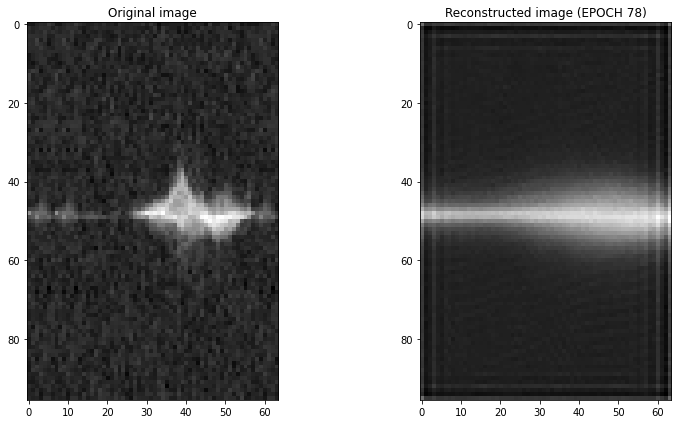

Epoch 79/500, Train Loss: 141392.7427, Validation Loss: 139724.3558
Time for epoch 79 is 9.127782344818115 sec


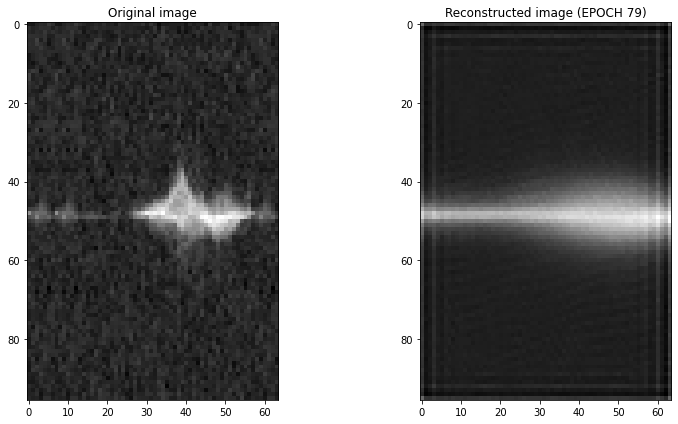

Epoch 80/500, Train Loss: 141320.0496, Validation Loss: 140024.2124
Time for epoch 80 is 9.53477954864502 sec


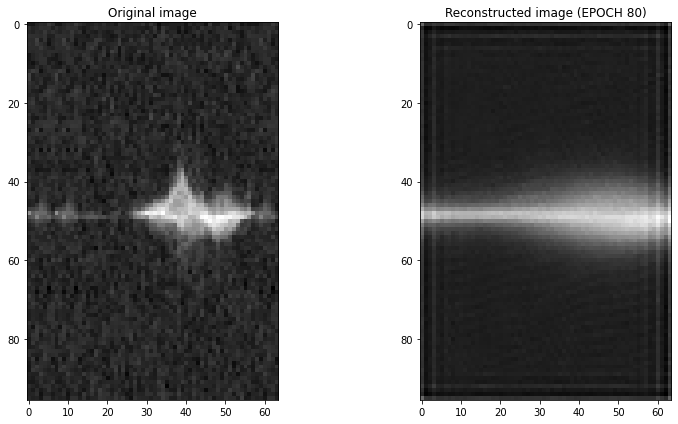

Epoch 81/500, Train Loss: 141267.7777, Validation Loss: 139768.5251
Time for epoch 81 is 8.804178714752197 sec


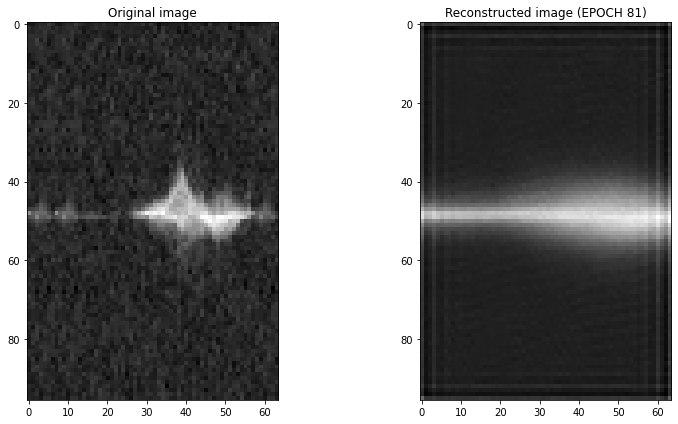

Epoch 82/500, Train Loss: 141200.9136, Validation Loss: 139904.9357
Time for epoch 82 is 9.692302465438843 sec


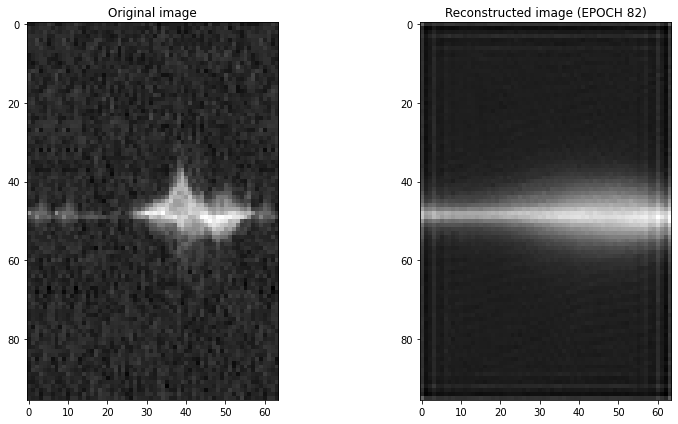

Epoch 83/500, Train Loss: 141145.1158, Validation Loss: 139670.6633
Time for epoch 83 is 9.543839454650879 sec


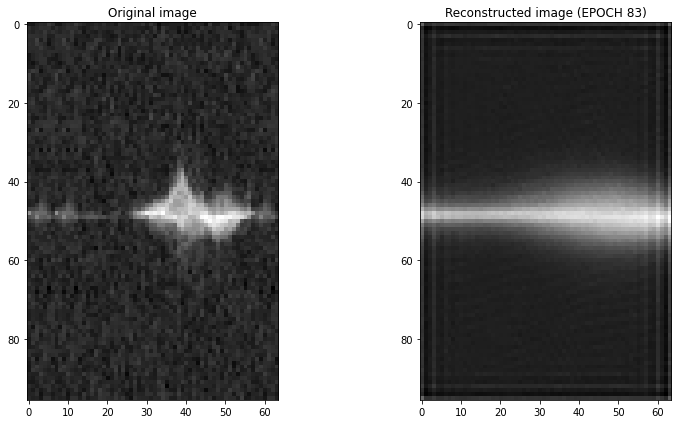

Epoch 84/500, Train Loss: 141083.9601, Validation Loss: 139559.0306
Time for epoch 84 is 9.25252914428711 sec


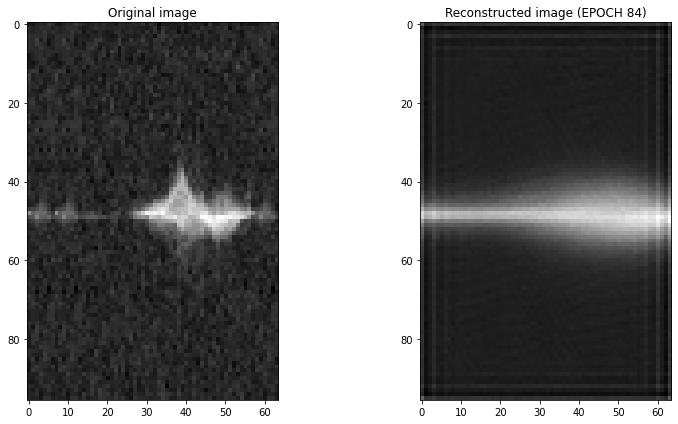

Epoch 85/500, Train Loss: 141039.5237, Validation Loss: 139543.3070
Time for epoch 85 is 8.698880910873413 sec


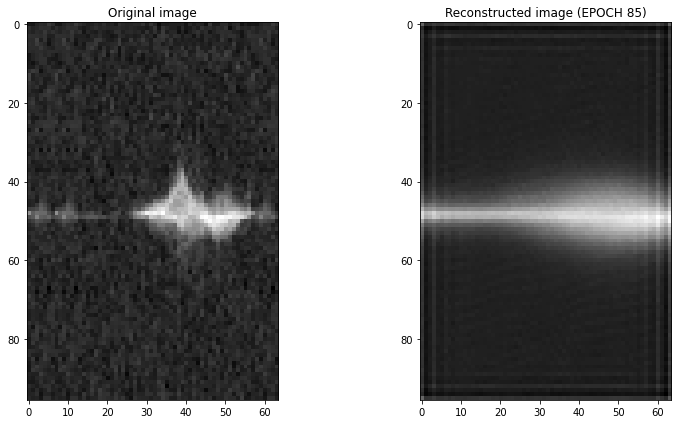

Epoch 86/500, Train Loss: 140984.9798, Validation Loss: 139544.1752
Time for epoch 86 is 8.935258150100708 sec


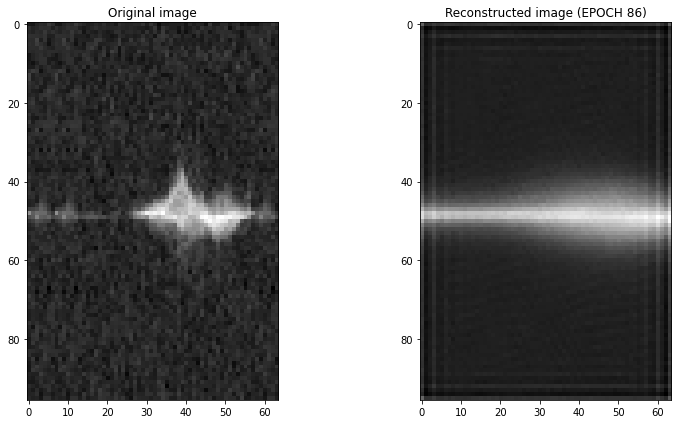

Epoch 87/500, Train Loss: 140934.4930, Validation Loss: 139587.9148
Time for epoch 87 is 9.095403671264648 sec


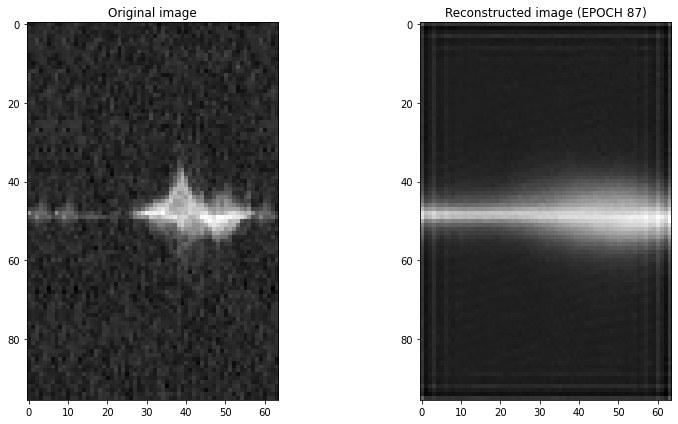

Epoch 88/500, Train Loss: 140890.4830, Validation Loss: 139605.0814
Time for epoch 88 is 9.353707313537598 sec


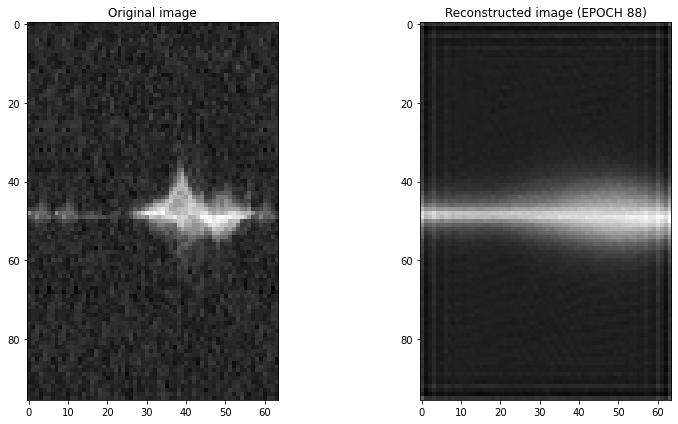

Epoch 89/500, Train Loss: 140848.2607, Validation Loss: 139570.8094
Time for epoch 89 is 8.68714427947998 sec


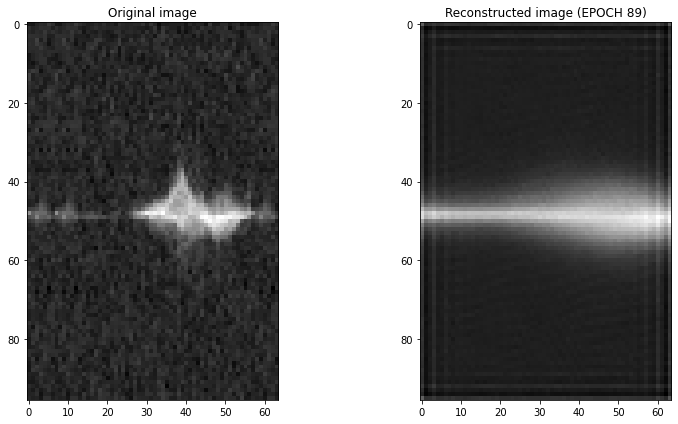

Epoch 90/500, Train Loss: 140798.9160, Validation Loss: 139628.0169
Time for epoch 90 is 9.516488313674927 sec


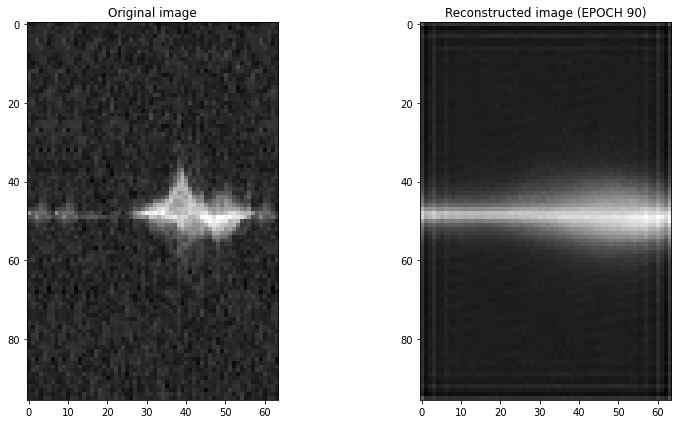

Epoch 91/500, Train Loss: 140756.1260, Validation Loss: 139550.6575
Time for epoch 91 is 10.317959070205688 sec


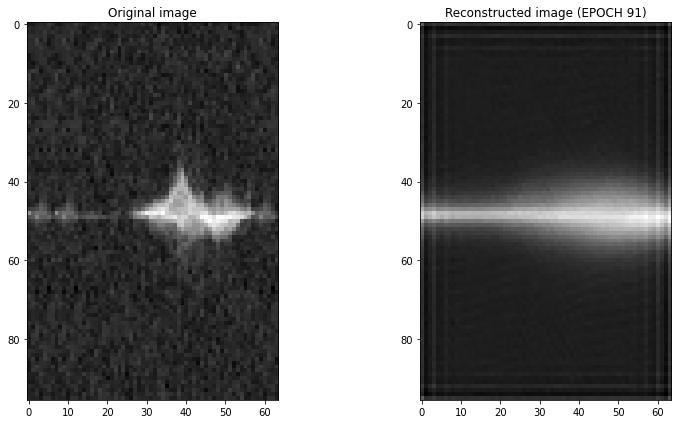

Epoch 92/500, Train Loss: 140717.0391, Validation Loss: 139621.5884
Time for epoch 92 is 9.363070011138916 sec


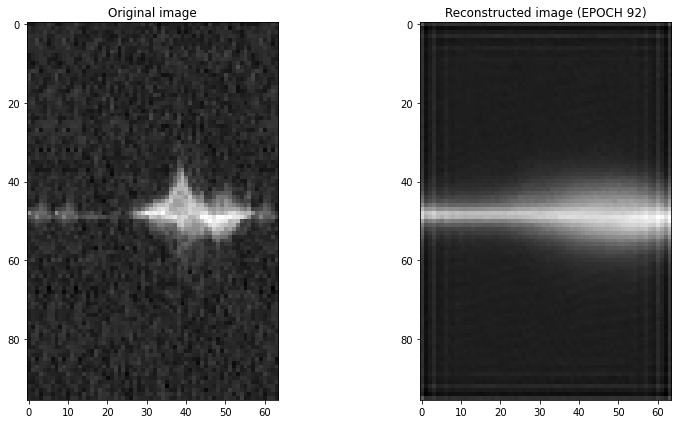

Epoch 93/500, Train Loss: 140678.5246, Validation Loss: 139483.4686
Time for epoch 93 is 9.141941547393799 sec


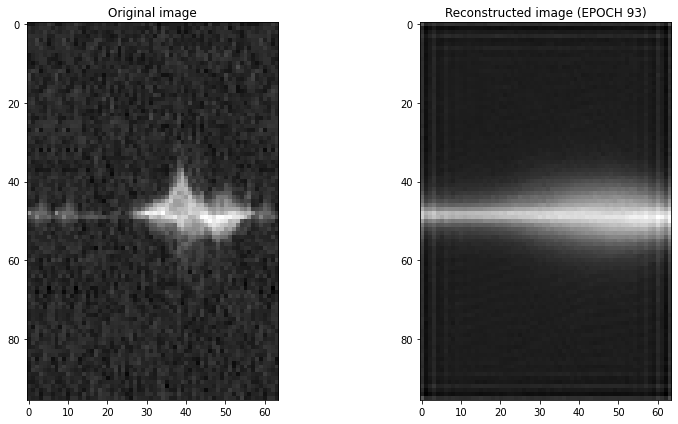

Epoch 94/500, Train Loss: 140640.2231, Validation Loss: 139481.0041
Time for epoch 94 is 12.993857383728027 sec


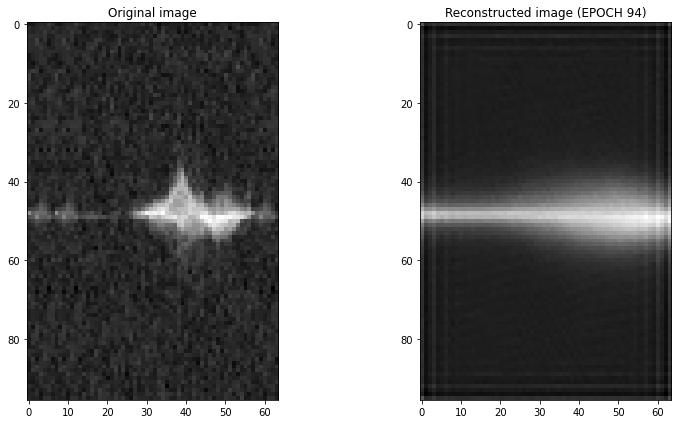

Epoch 95/500, Train Loss: 140600.6979, Validation Loss: 139503.7003
Time for epoch 95 is 11.201258659362793 sec


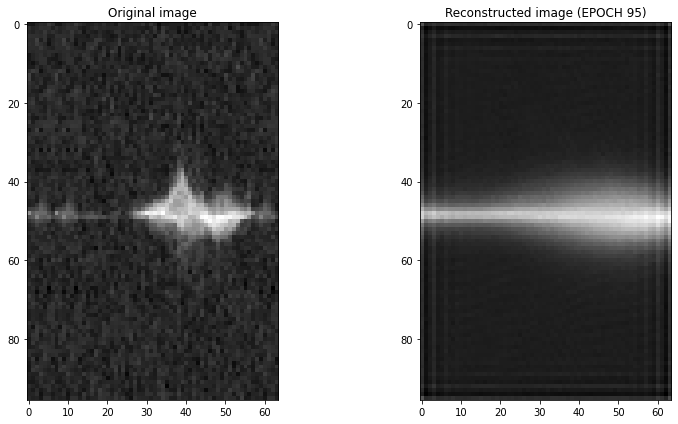

Epoch 96/500, Train Loss: 140572.7159, Validation Loss: 139512.0156
Time for epoch 96 is 10.764591217041016 sec


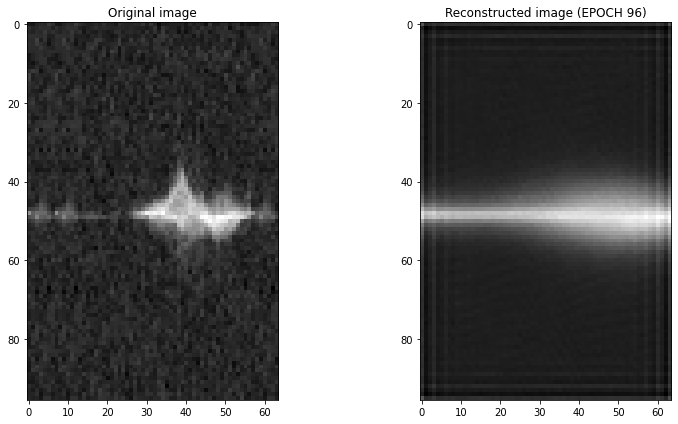

Epoch 97/500, Train Loss: 140531.4473, Validation Loss: 139455.3063
Time for epoch 97 is 9.213422060012817 sec


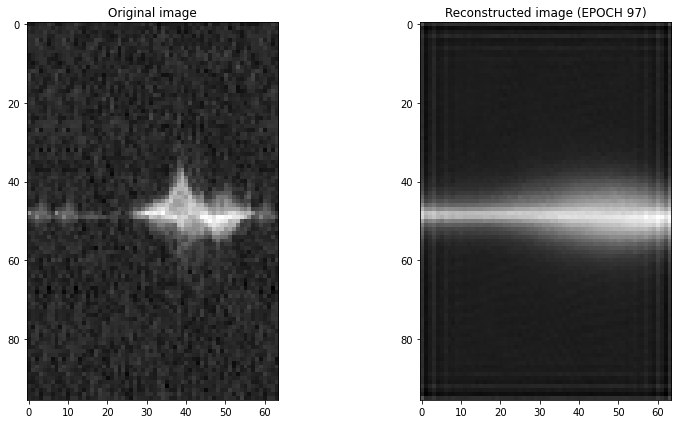

Epoch 98/500, Train Loss: 140495.2624, Validation Loss: 139502.9967
Time for epoch 98 is 9.27511477470398 sec


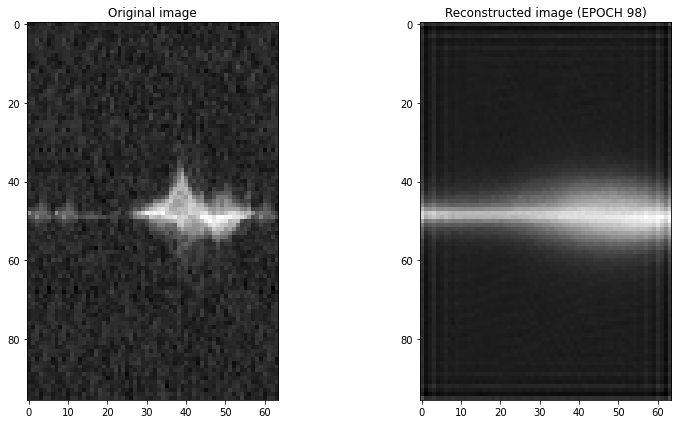

Epoch 99/500, Train Loss: 140461.1849, Validation Loss: 139446.9217
Time for epoch 99 is 17.081818342208862 sec


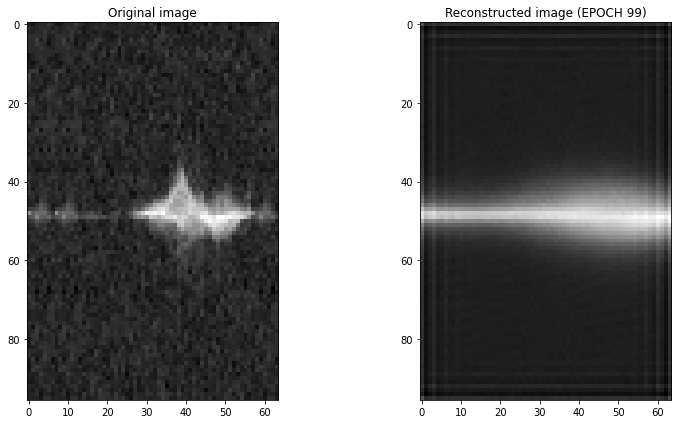

Epoch 100/500, Train Loss: 140433.1304, Validation Loss: 139422.7123
Time for epoch 100 is 10.57310676574707 sec


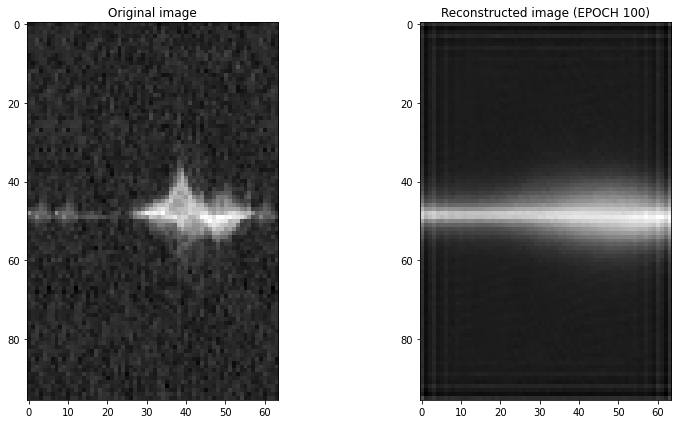

<Figure size 432x288 with 0 Axes>

Epoch 101/500, Train Loss: 140399.7796, Validation Loss: 139381.5922
Time for epoch 101 is 13.890077114105225 sec


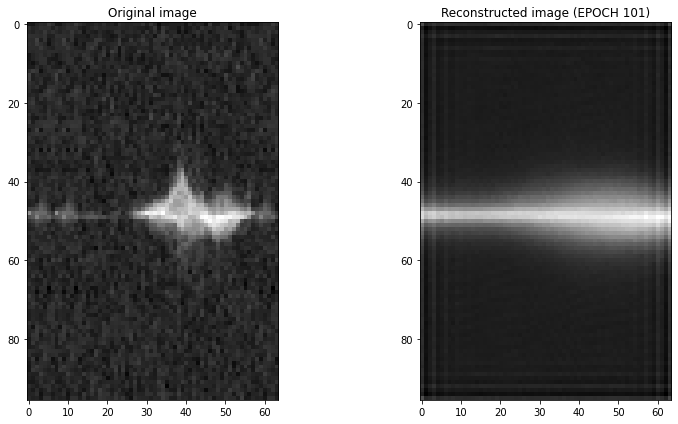

Epoch 102/500, Train Loss: 140376.1273, Validation Loss: 139439.7860
Time for epoch 102 is 11.19222354888916 sec


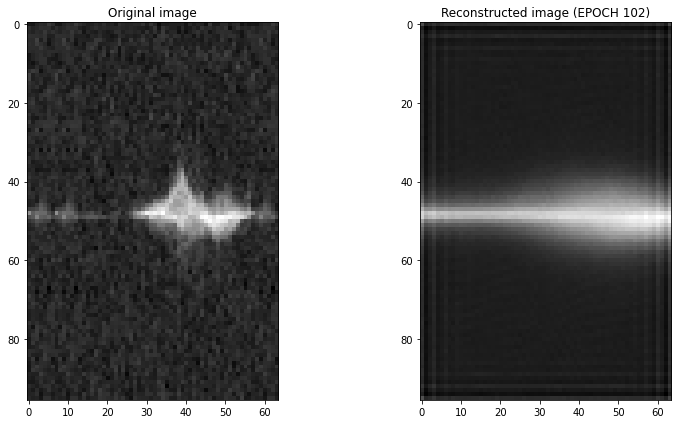

Epoch 103/500, Train Loss: 140343.4165, Validation Loss: 139561.4647
Time for epoch 103 is 9.551668882369995 sec


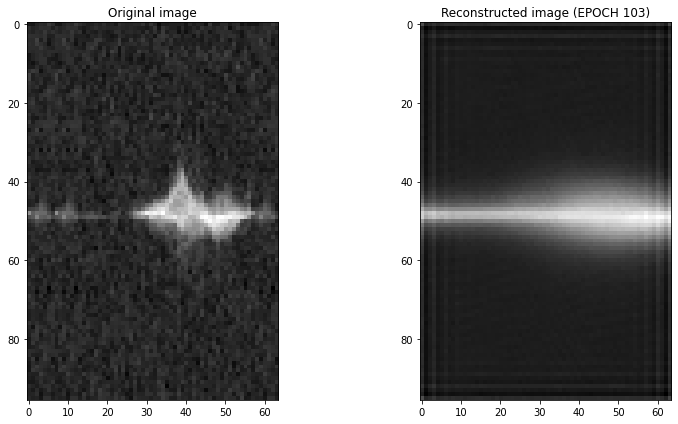

Epoch 104/500, Train Loss: 140331.7751, Validation Loss: 139482.8173
Time for epoch 104 is 8.819498538970947 sec


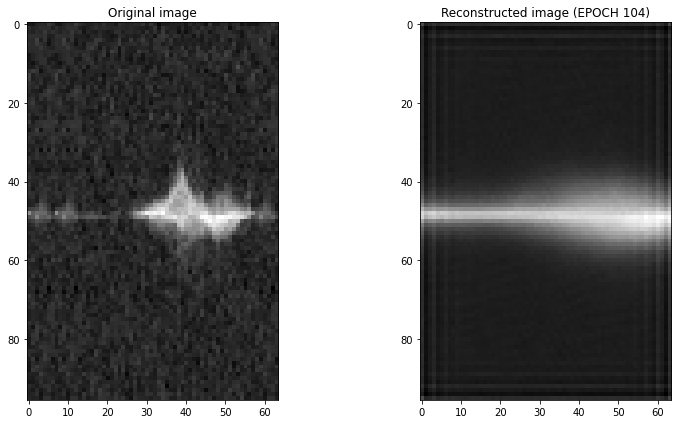

Epoch 105/500, Train Loss: 140298.4973, Validation Loss: 139402.6145
Time for epoch 105 is 9.378325700759888 sec


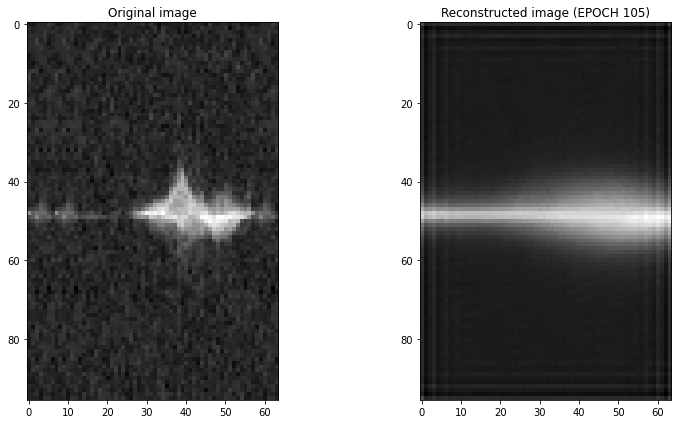

Epoch 106/500, Train Loss: 140301.1304, Validation Loss: 139373.1053
Time for epoch 106 is 9.156179904937744 sec


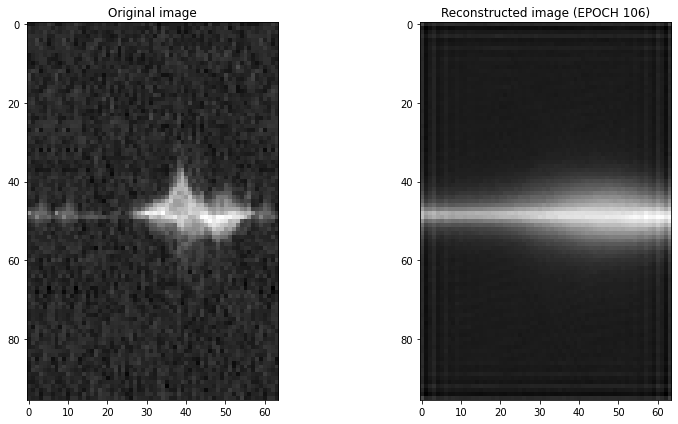

Epoch 107/500, Train Loss: 140260.7307, Validation Loss: 139414.6023
Time for epoch 107 is 9.298852682113647 sec


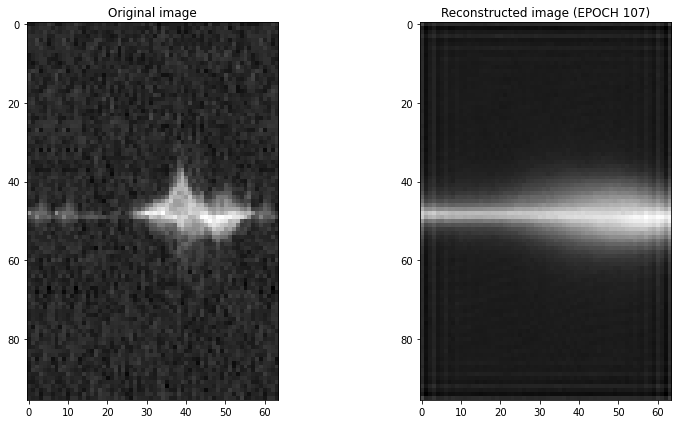

Epoch 108/500, Train Loss: 140233.1436, Validation Loss: 139413.9939
Time for epoch 108 is 10.307709455490112 sec


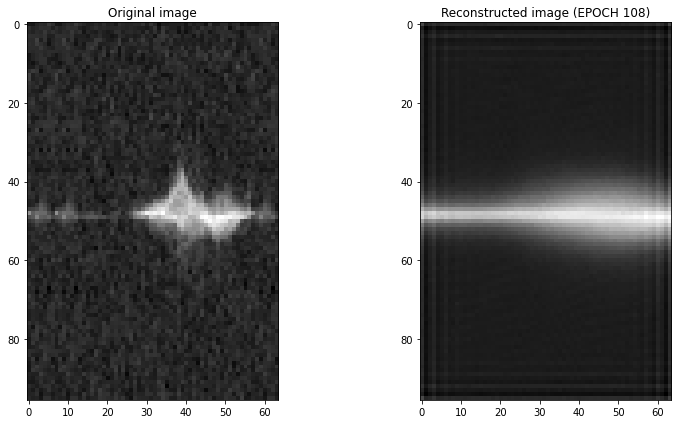

Epoch 109/500, Train Loss: 140206.2563, Validation Loss: 139365.6360
Time for epoch 109 is 8.931064128875732 sec


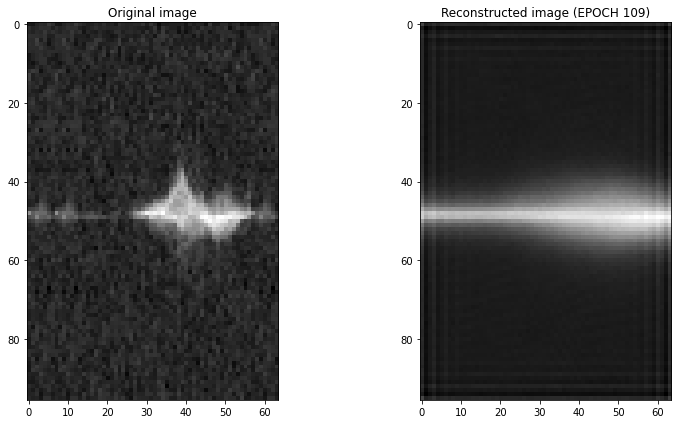

Epoch 110/500, Train Loss: 140179.9503, Validation Loss: 139384.0530
Time for epoch 110 is 10.59134292602539 sec


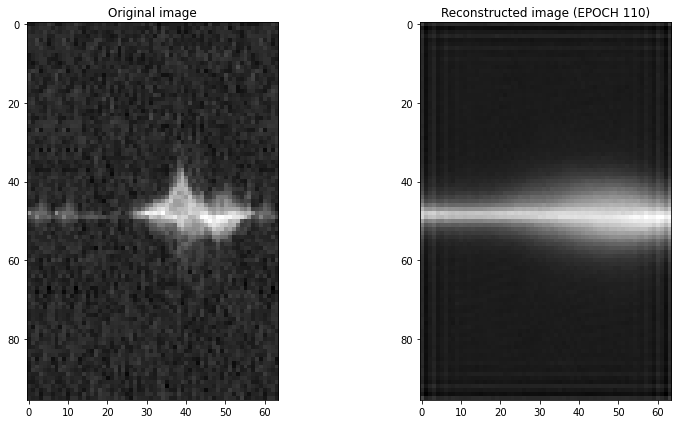

Epoch 111/500, Train Loss: 140176.3991, Validation Loss: 139397.9448
Time for epoch 111 is 11.795718908309937 sec


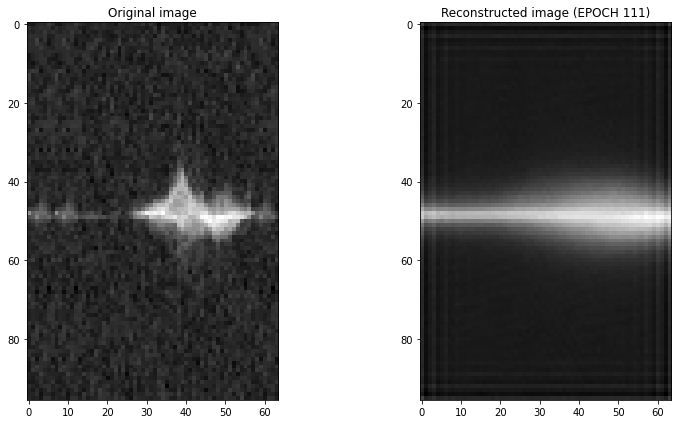

Epoch 112/500, Train Loss: 140143.2683, Validation Loss: 139469.7706
Time for epoch 112 is 11.03918743133545 sec


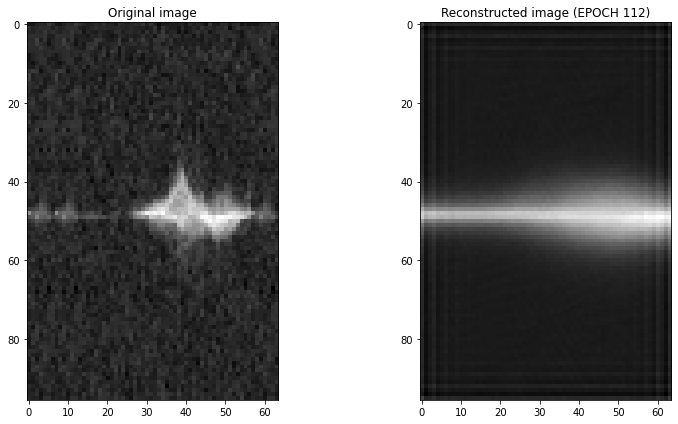

Epoch 113/500, Train Loss: 140118.0914, Validation Loss: 139428.5322
Time for epoch 113 is 12.62066650390625 sec


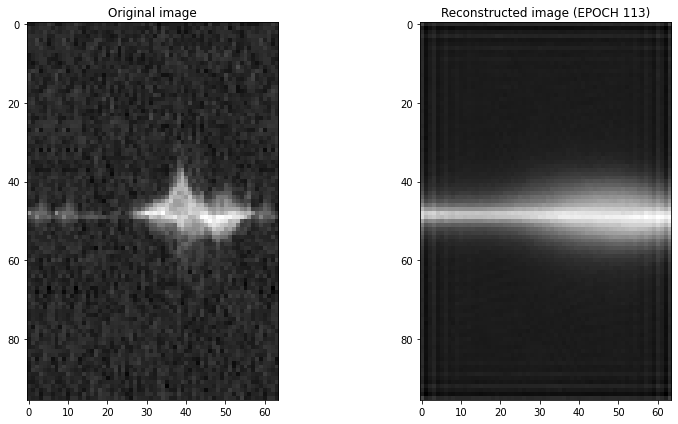

Epoch 114/500, Train Loss: 140094.1914, Validation Loss: 139361.8254
Time for epoch 114 is 9.846710205078125 sec


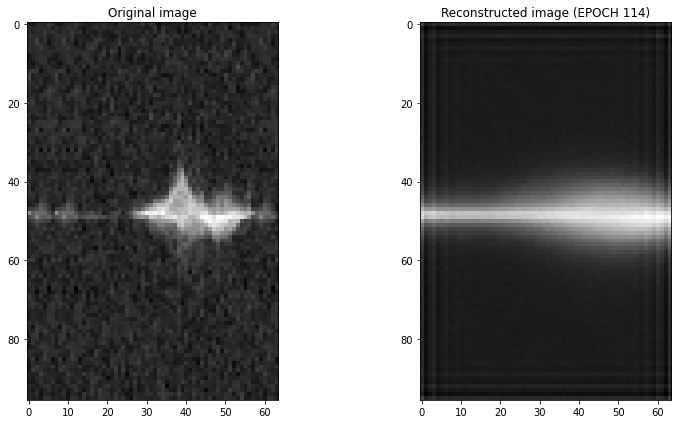

Epoch 115/500, Train Loss: 140071.0079, Validation Loss: 139383.5311
Time for epoch 115 is 9.056868076324463 sec


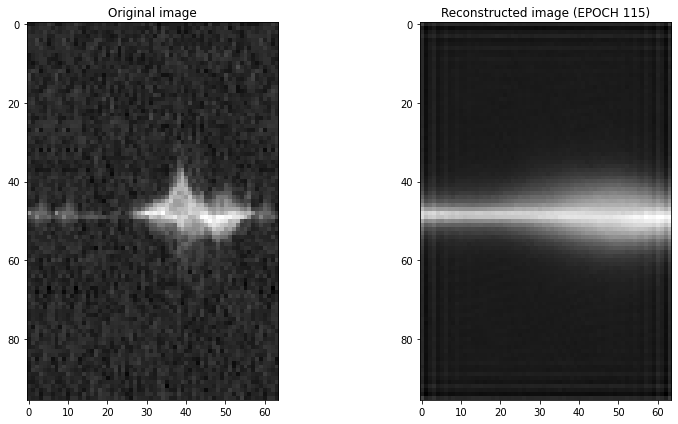

Epoch 116/500, Train Loss: 140048.2781, Validation Loss: 139358.0049
Time for epoch 116 is 9.219577550888062 sec


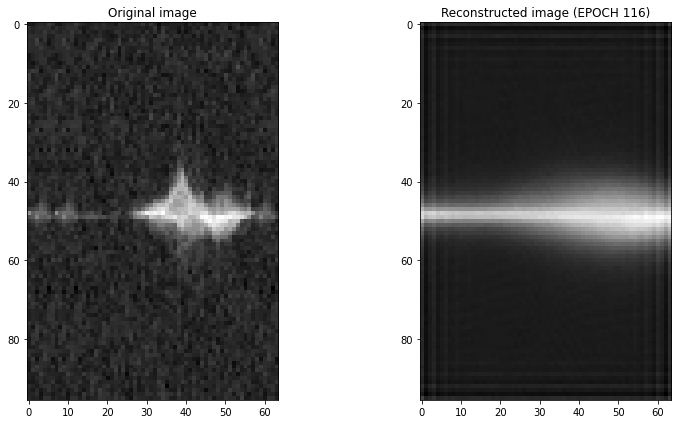

Epoch 117/500, Train Loss: 140031.3371, Validation Loss: 139357.2523
Time for epoch 117 is 9.300777673721313 sec


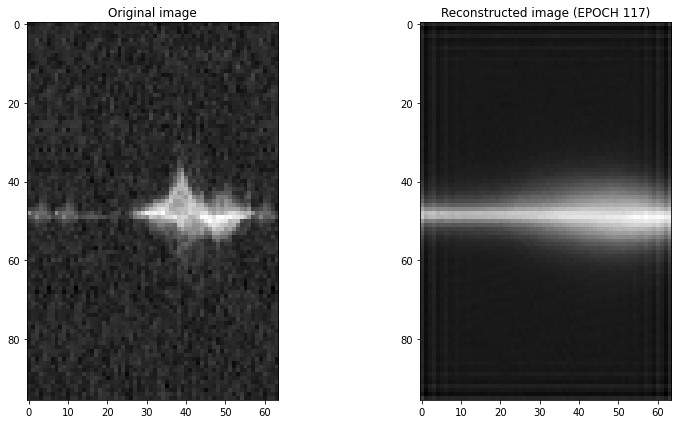

Epoch 118/500, Train Loss: 140027.9069, Validation Loss: 139383.9310
Time for epoch 118 is 9.479048728942871 sec


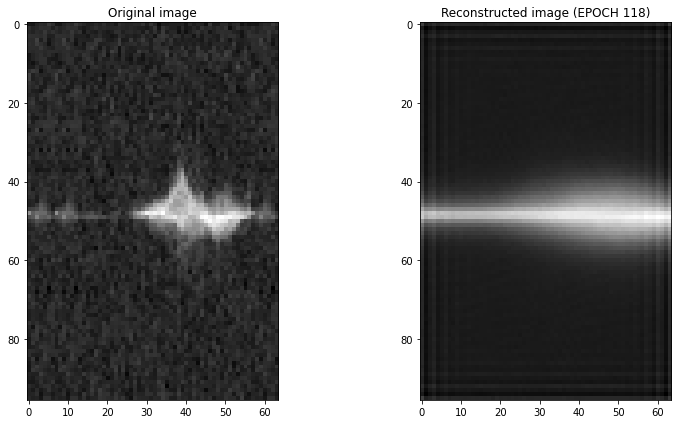

Epoch 119/500, Train Loss: 139998.3136, Validation Loss: 139370.8307
Time for epoch 119 is 9.265998840332031 sec


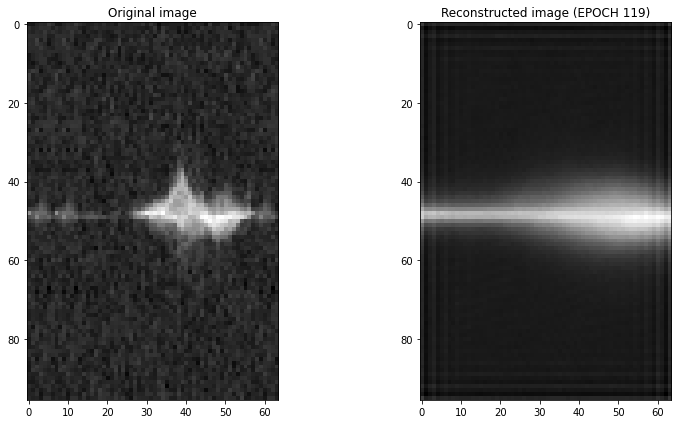

Epoch 120/500, Train Loss: 139974.0601, Validation Loss: 139351.4969
Time for epoch 120 is 9.976351737976074 sec


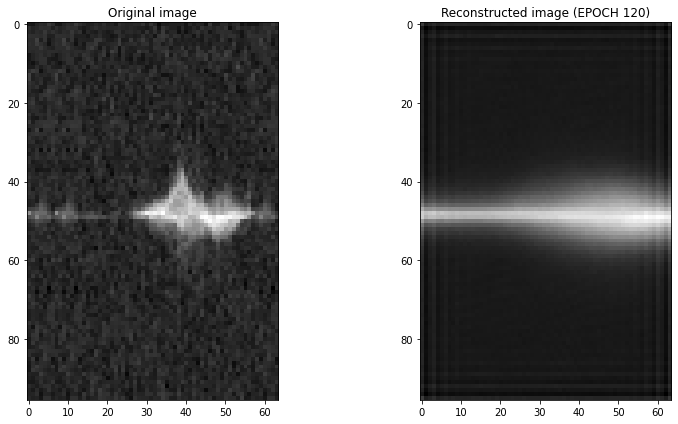

Epoch 121/500, Train Loss: 139960.8872, Validation Loss: 139328.7160
Time for epoch 121 is 12.847536563873291 sec


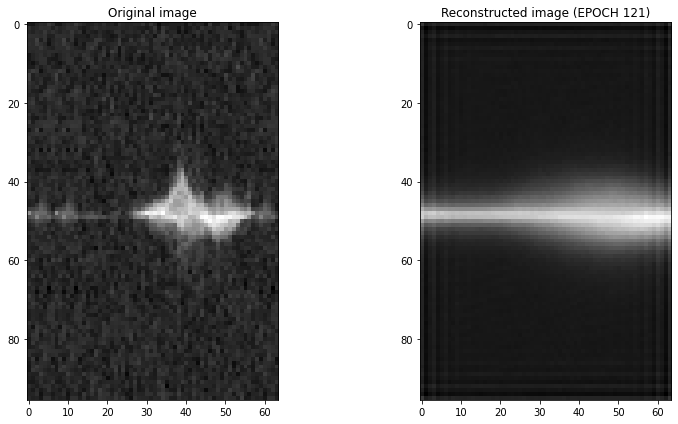

Epoch 122/500, Train Loss: 139958.4046, Validation Loss: 139341.6753
Time for epoch 122 is 11.30718207359314 sec


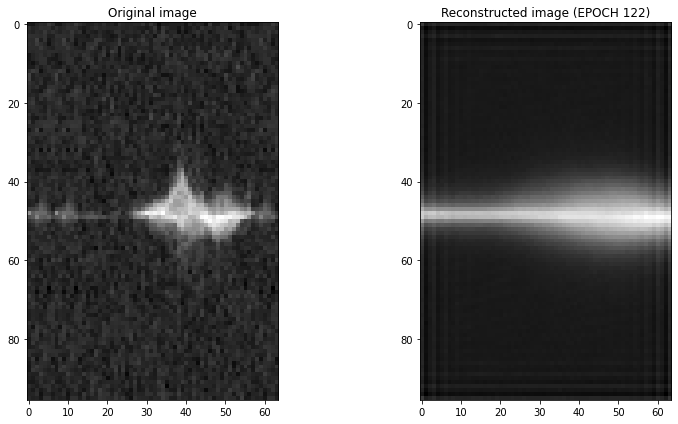

Epoch 123/500, Train Loss: 139933.8806, Validation Loss: 139312.7257
Time for epoch 123 is 9.389102458953857 sec


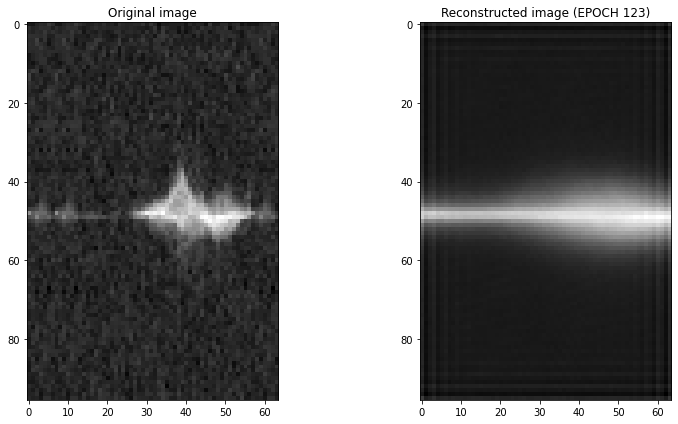

Epoch 124/500, Train Loss: 139912.8895, Validation Loss: 139316.7616
Time for epoch 124 is 9.416582345962524 sec


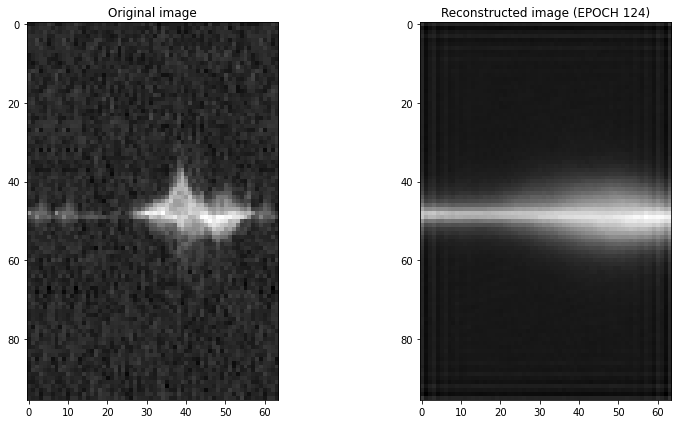

Epoch 125/500, Train Loss: 139891.7655, Validation Loss: 139318.7765
Time for epoch 125 is 9.311476945877075 sec


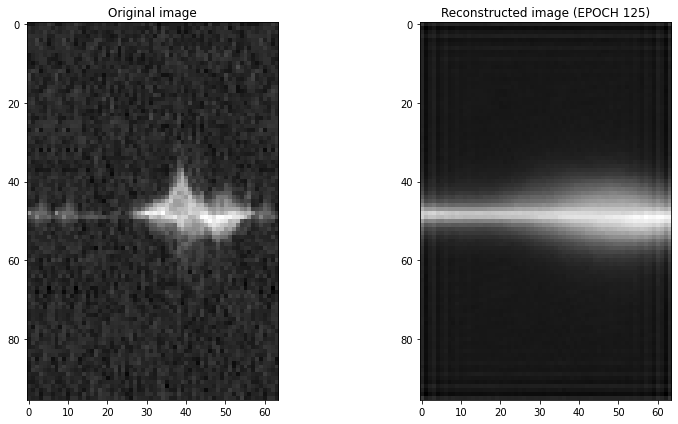

Epoch 126/500, Train Loss: 139931.9494, Validation Loss: 139390.7611
Time for epoch 126 is 8.907100915908813 sec


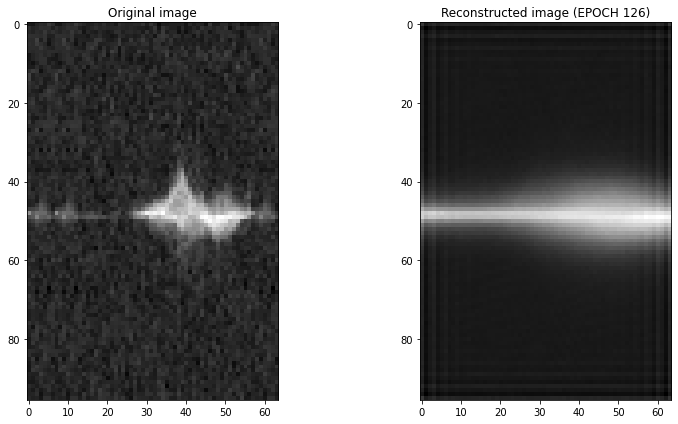

Epoch 127/500, Train Loss: 139893.1742, Validation Loss: 139348.5386
Time for epoch 127 is 9.222125053405762 sec


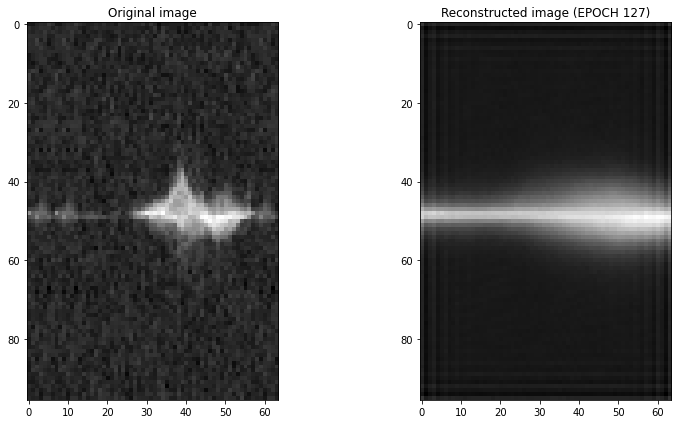

Epoch 128/500, Train Loss: 139869.1999, Validation Loss: 139332.3981
Time for epoch 128 is 13.991596937179565 sec


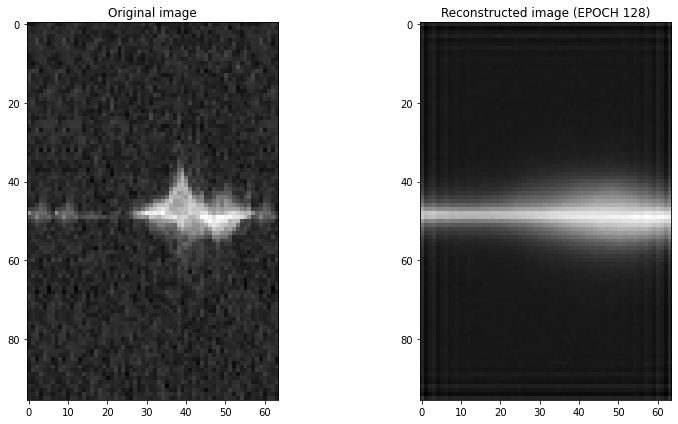

Epoch 129/500, Train Loss: 139848.0740, Validation Loss: 139322.3031
Time for epoch 129 is 10.002415657043457 sec


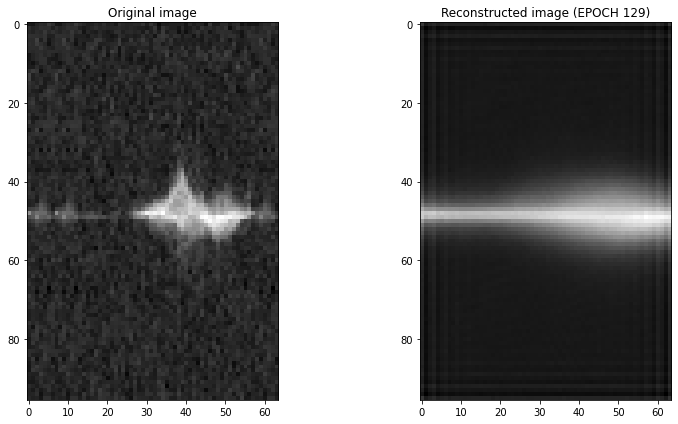

Epoch 130/500, Train Loss: 139827.9990, Validation Loss: 139307.3214
Time for epoch 130 is 9.89315128326416 sec


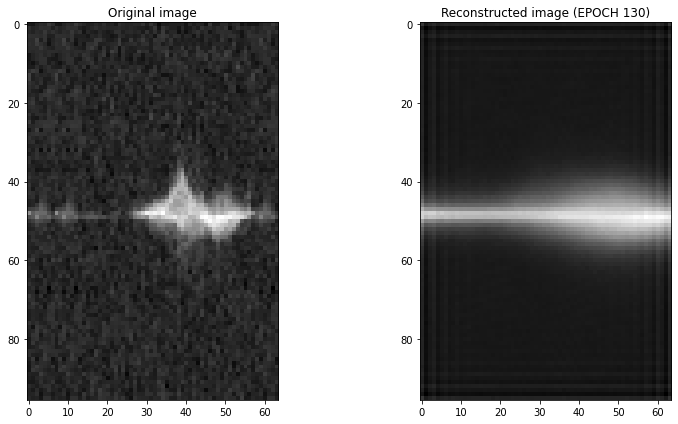

Epoch 131/500, Train Loss: 139811.3359, Validation Loss: 139290.0534
Time for epoch 131 is 13.965703248977661 sec


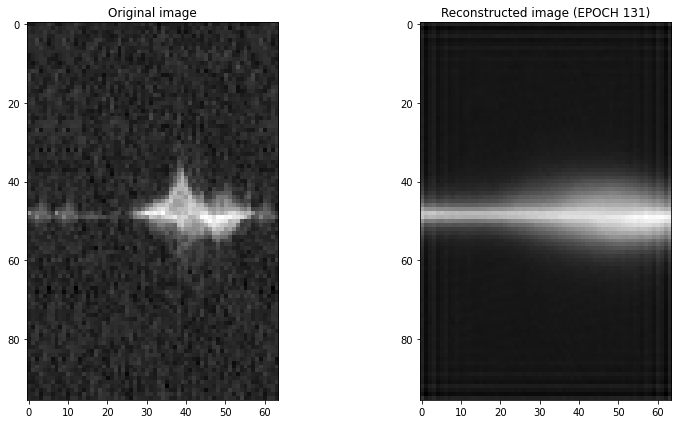

Epoch 132/500, Train Loss: 139795.7153, Validation Loss: 139292.7717
Time for epoch 132 is 15.4641854763031 sec


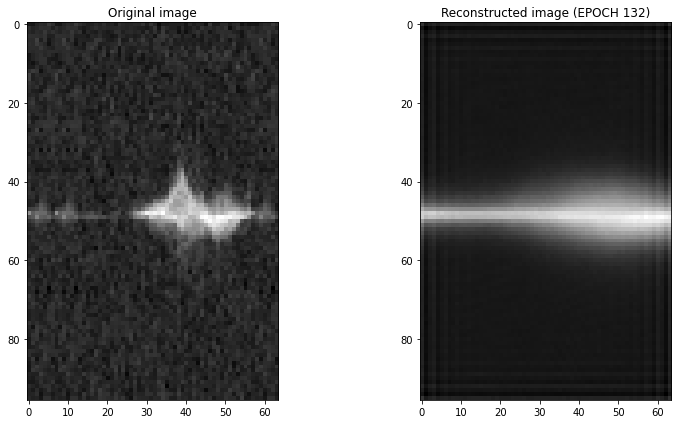

Epoch 133/500, Train Loss: 139781.1744, Validation Loss: 139291.5576
Time for epoch 133 is 9.182375192642212 sec


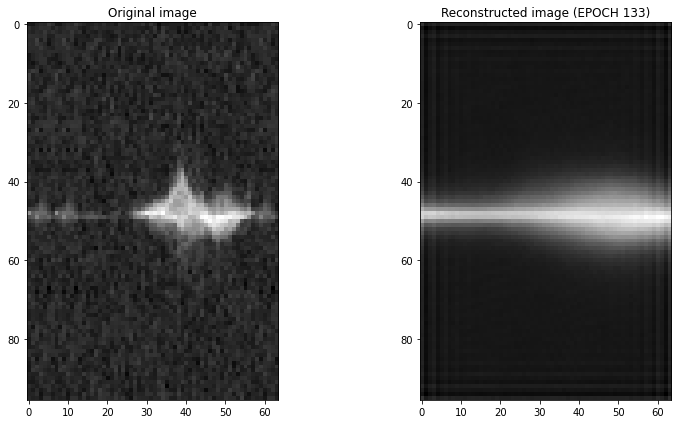

Epoch 134/500, Train Loss: 139766.6987, Validation Loss: 139287.1081
Time for epoch 134 is 9.026851654052734 sec


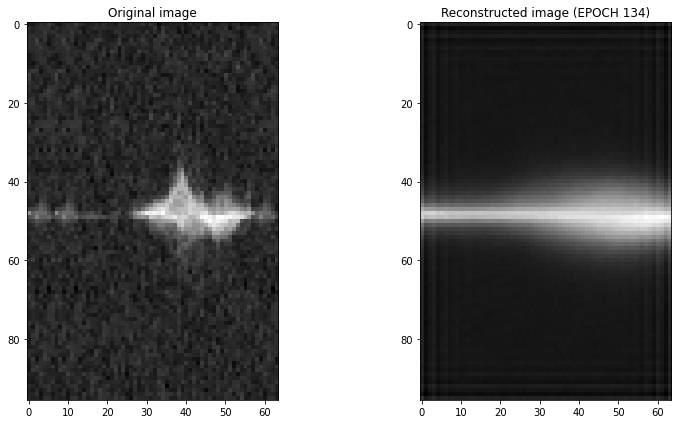

Epoch 135/500, Train Loss: 139751.9761, Validation Loss: 139285.3523
Time for epoch 135 is 10.682600021362305 sec


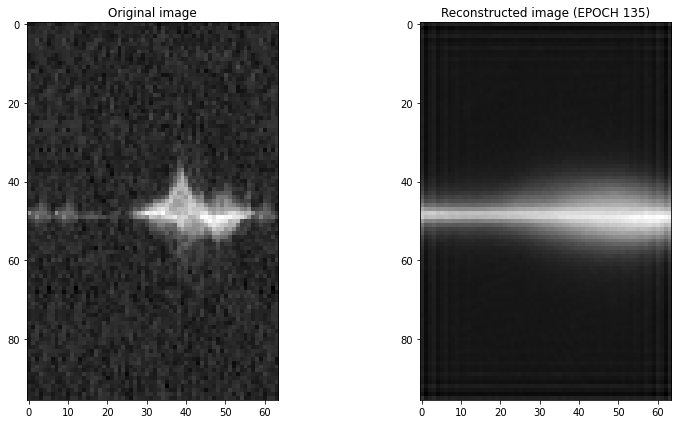

Epoch 136/500, Train Loss: 139743.7438, Validation Loss: 139278.6542
Time for epoch 136 is 9.087325096130371 sec


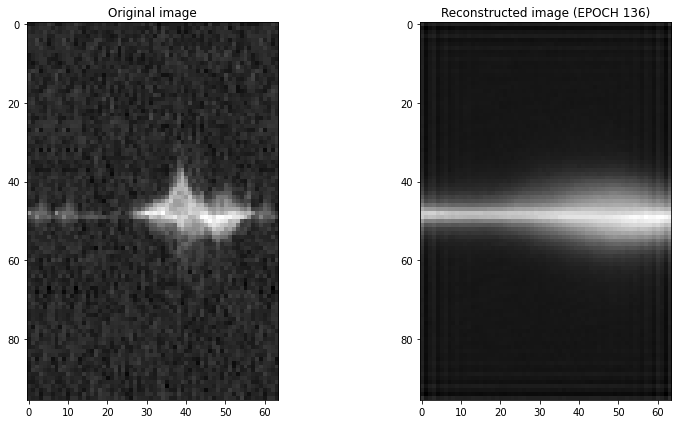

Epoch 137/500, Train Loss: 139731.6848, Validation Loss: 139272.1436
Time for epoch 137 is 9.212837219238281 sec


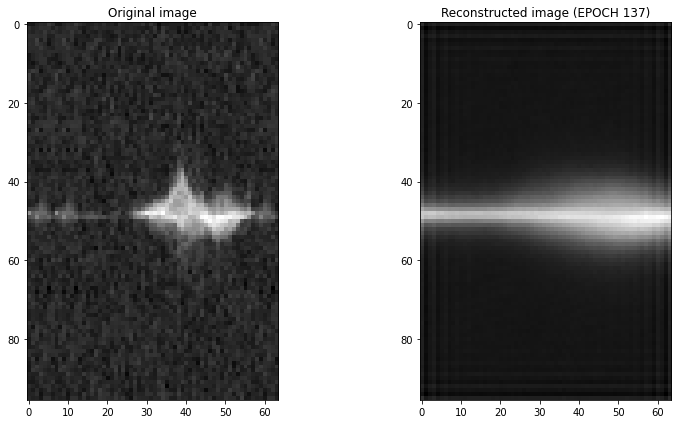

Epoch 138/500, Train Loss: 139715.4929, Validation Loss: 139277.4994
Time for epoch 138 is 9.491619348526001 sec


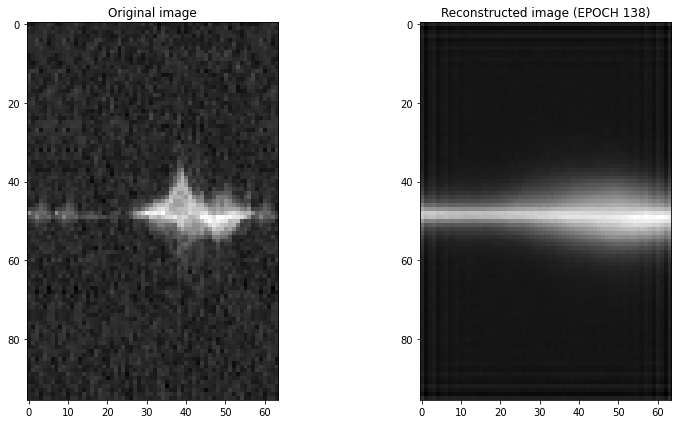

Epoch 139/500, Train Loss: 139704.6208, Validation Loss: 139272.7818
Time for epoch 139 is 10.871535778045654 sec


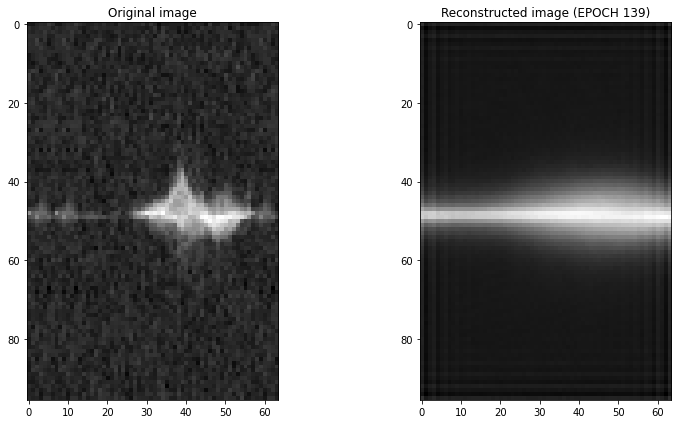

Epoch 140/500, Train Loss: 139691.9441, Validation Loss: 139264.7582
Time for epoch 140 is 9.185166358947754 sec


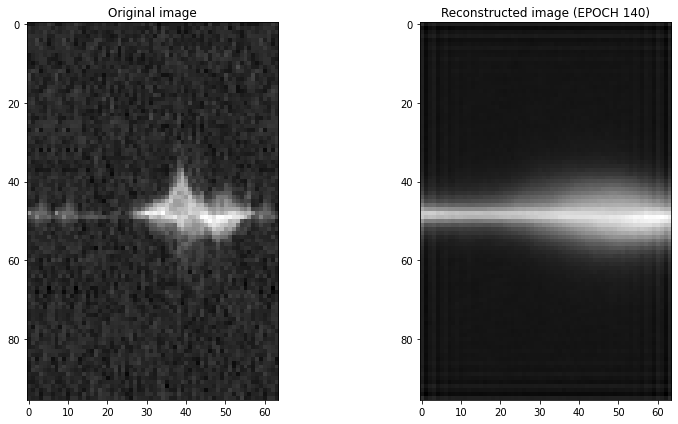

Epoch 141/500, Train Loss: 139681.9192, Validation Loss: 139271.0001
Time for epoch 141 is 10.312200546264648 sec


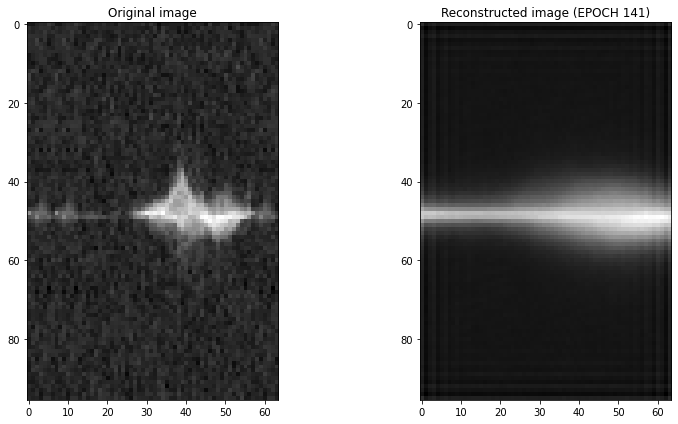

Epoch 142/500, Train Loss: 139678.7721, Validation Loss: 139261.6135
Time for epoch 142 is 9.187926530838013 sec


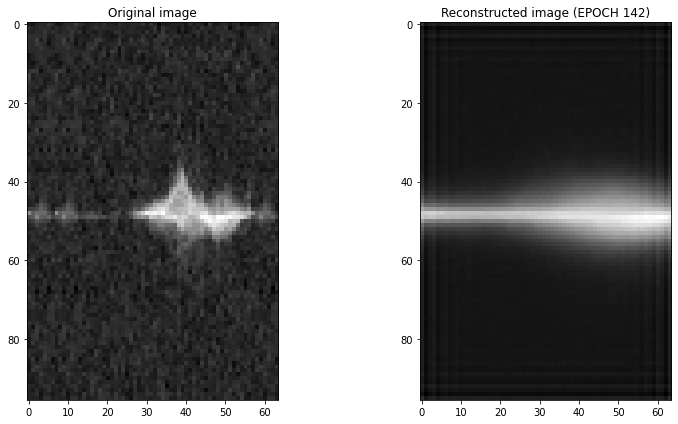

Epoch 143/500, Train Loss: 139665.2799, Validation Loss: 139265.9110
Time for epoch 143 is 10.21793270111084 sec


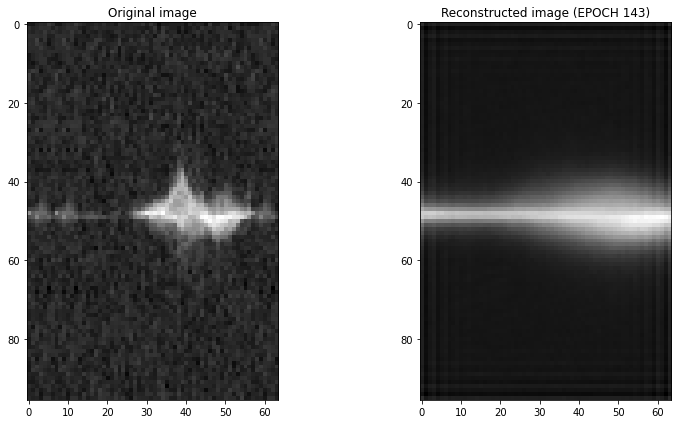

Epoch 144/500, Train Loss: 139651.7341, Validation Loss: 139258.5389
Time for epoch 144 is 10.873794317245483 sec


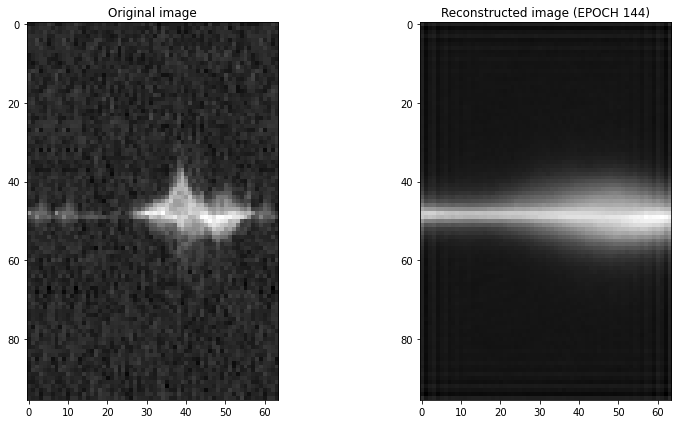

Epoch 145/500, Train Loss: 139643.0914, Validation Loss: 139267.1537
Time for epoch 145 is 9.153747320175171 sec


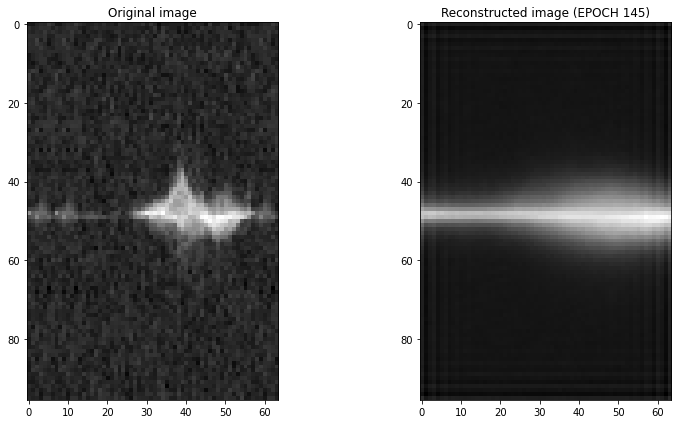

Epoch 146/500, Train Loss: 139635.2445, Validation Loss: 139284.9743
Time for epoch 146 is 9.096404790878296 sec


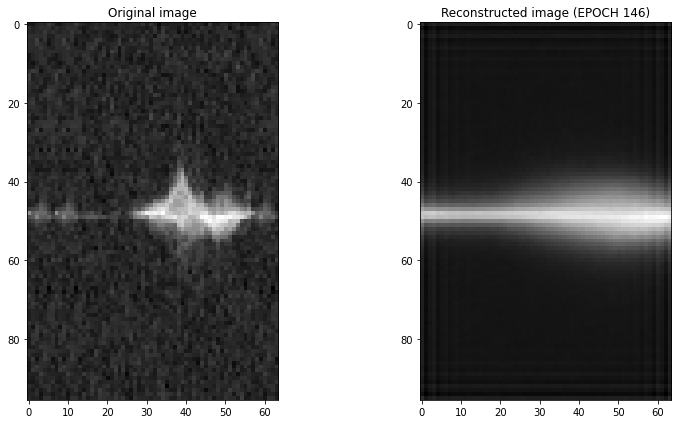

Epoch 147/500, Train Loss: 139623.5307, Validation Loss: 139255.5779
Time for epoch 147 is 9.237560272216797 sec


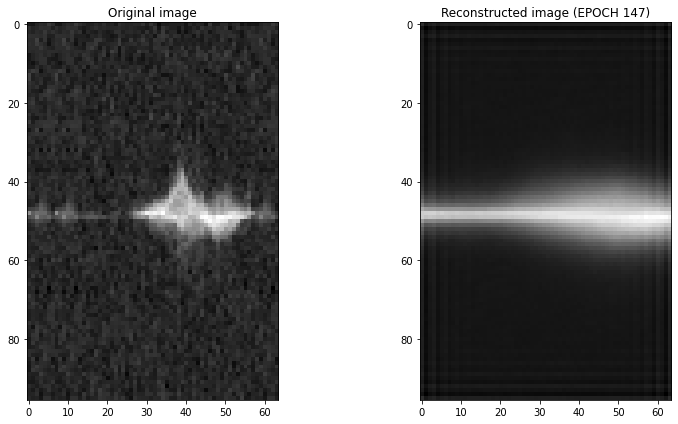

Epoch 148/500, Train Loss: 139614.8709, Validation Loss: 139254.4878
Time for epoch 148 is 8.747669219970703 sec


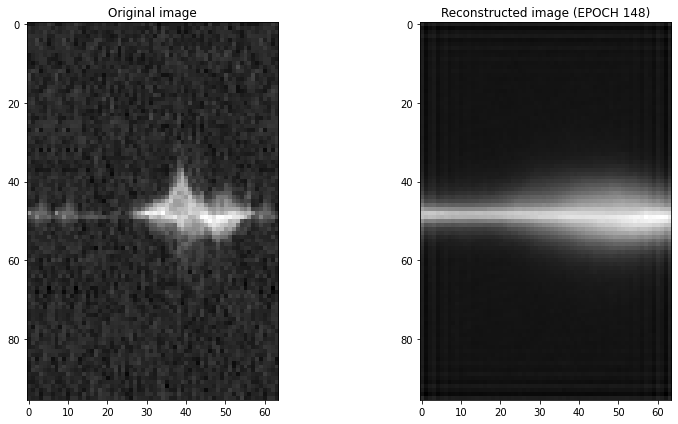

Epoch 149/500, Train Loss: 139605.9081, Validation Loss: 139255.2174
Time for epoch 149 is 8.970138788223267 sec


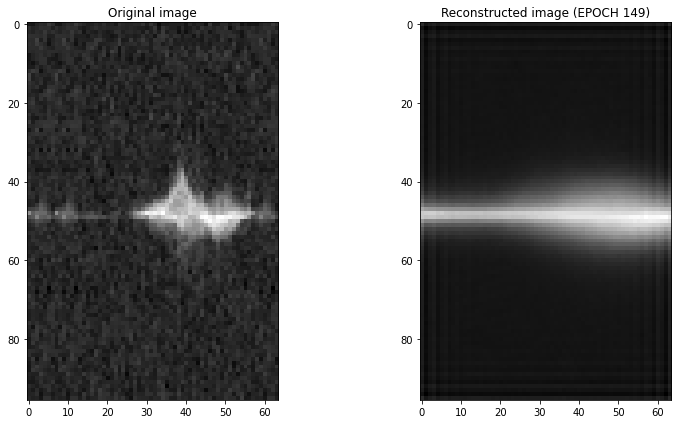

Epoch 150/500, Train Loss: 139597.6363, Validation Loss: 139251.9772
Time for epoch 150 is 9.14700198173523 sec


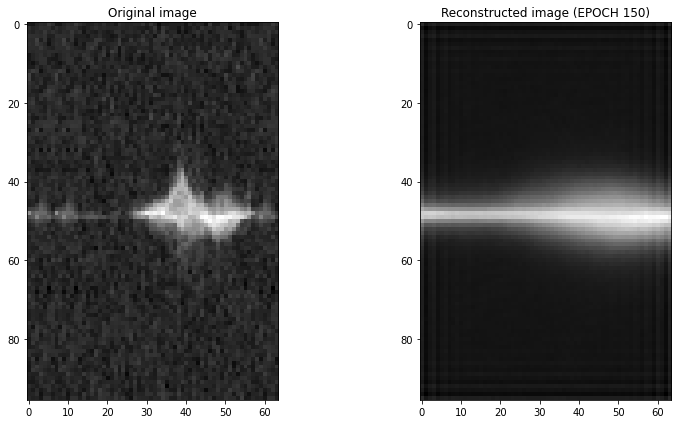

Epoch 151/500, Train Loss: 139641.8294, Validation Loss: 139300.2064
Time for epoch 151 is 9.266817808151245 sec


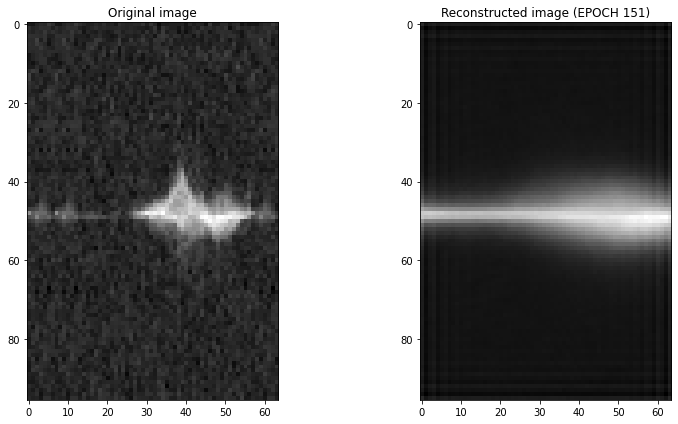

Epoch 152/500, Train Loss: 139617.0721, Validation Loss: 139281.6996
Time for epoch 152 is 8.595398426055908 sec


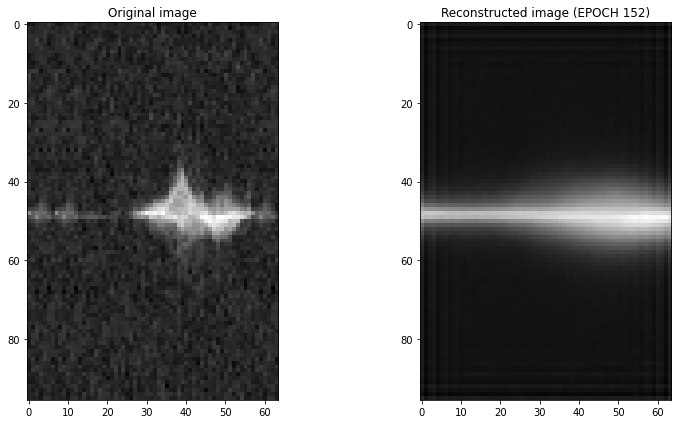

Epoch 153/500, Train Loss: 139598.1014, Validation Loss: 139269.9818
Time for epoch 153 is 9.203126192092896 sec


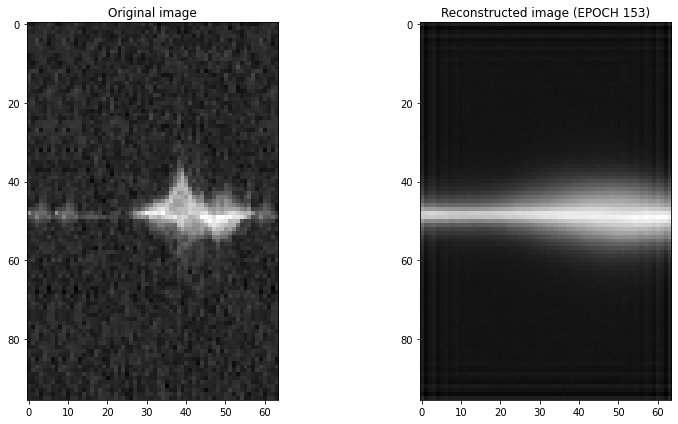

Epoch 154/500, Train Loss: 139587.4585, Validation Loss: 139265.8388
Time for epoch 154 is 9.232828855514526 sec


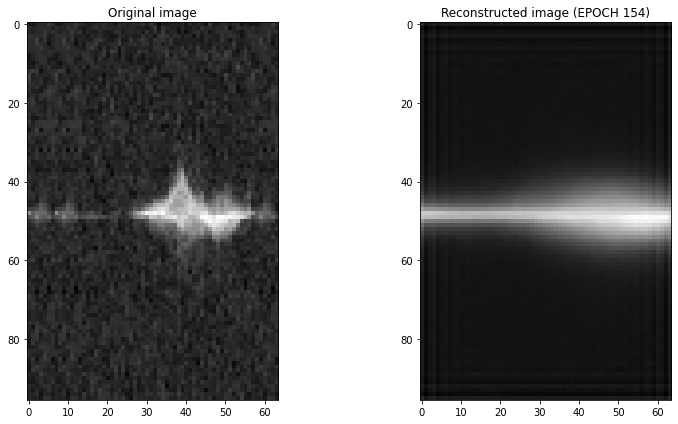

Epoch 155/500, Train Loss: 139610.1408, Validation Loss: 139288.3022
Time for epoch 155 is 9.121554136276245 sec


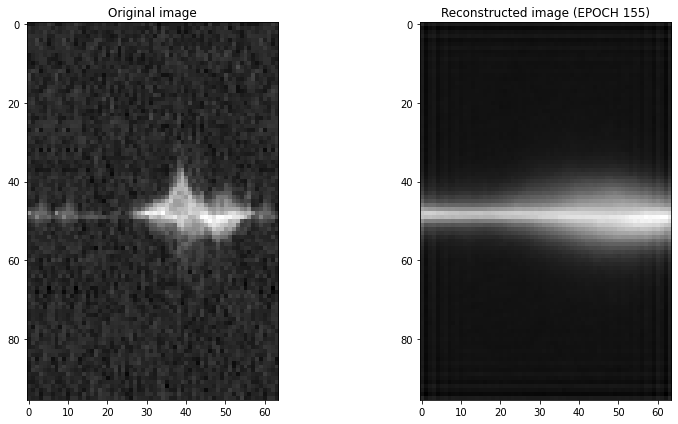

Epoch 156/500, Train Loss: 139591.5642, Validation Loss: 139280.9386
Time for epoch 156 is 8.722161769866943 sec


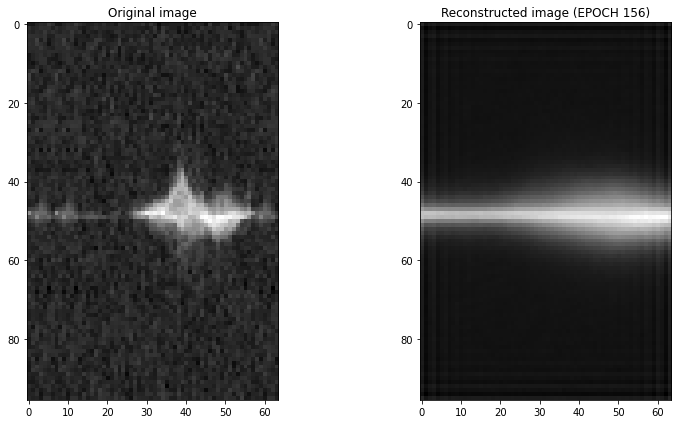

Epoch 157/500, Train Loss: 139577.3751, Validation Loss: 139279.4771
Time for epoch 157 is 9.162022590637207 sec


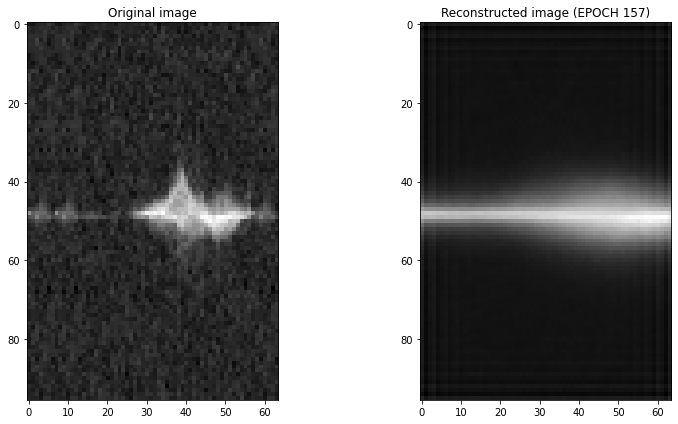

Epoch 158/500, Train Loss: 139566.9012, Validation Loss: 139264.9237
Time for epoch 158 is 9.448267459869385 sec


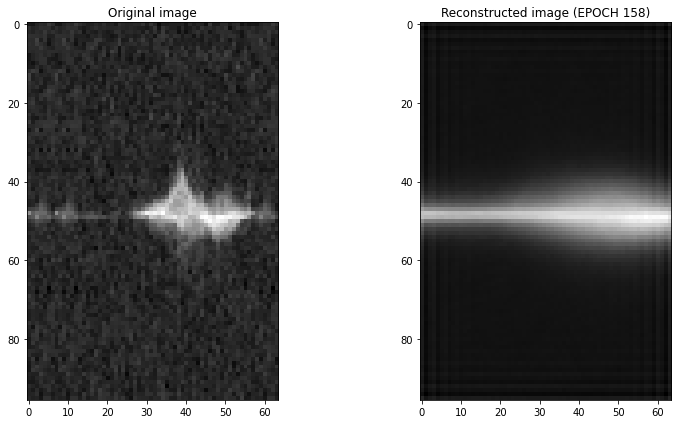

Epoch 159/500, Train Loss: 139559.5677, Validation Loss: 139264.8952
Time for epoch 159 is 9.355289936065674 sec


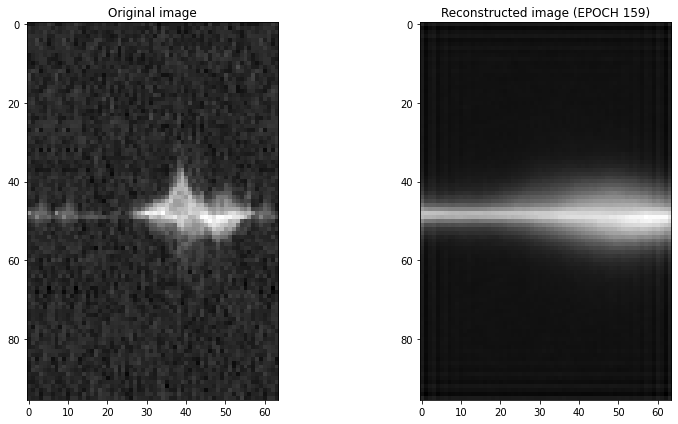

Epoch 160/500, Train Loss: 139548.5047, Validation Loss: 139259.7709
Time for epoch 160 is 8.711960792541504 sec


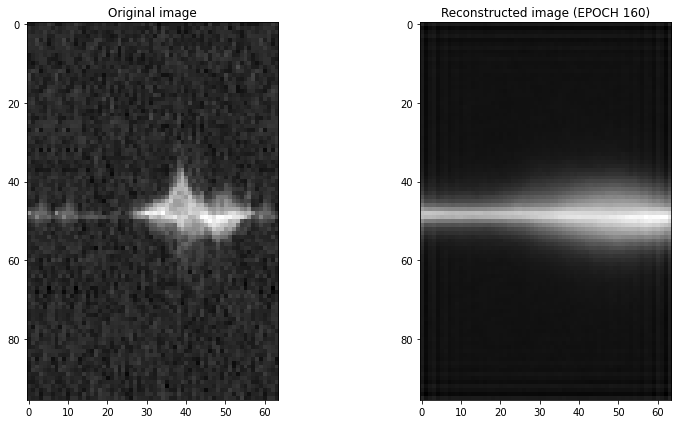

Epoch 161/500, Train Loss: 139541.3585, Validation Loss: 139256.6942
Time for epoch 161 is 9.138939619064331 sec


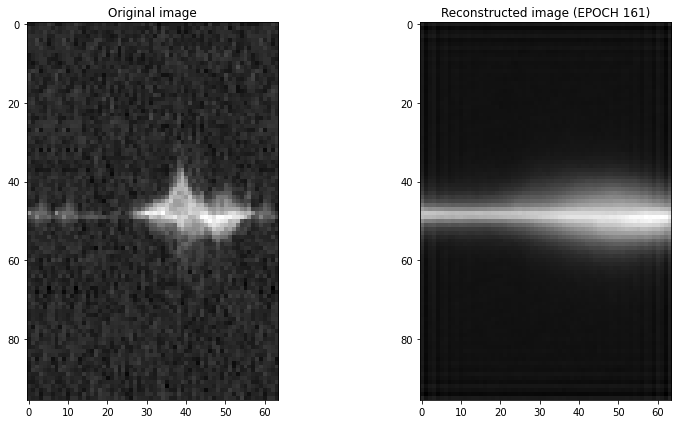

Epoch 162/500, Train Loss: 139535.7788, Validation Loss: 139262.1606
Time for epoch 162 is 9.349767446517944 sec


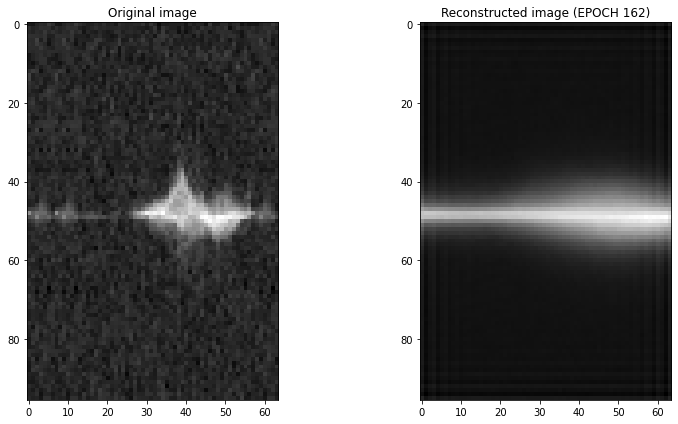

Epoch 163/500, Train Loss: 139528.2985, Validation Loss: 139255.9409
Time for epoch 163 is 9.005050897598267 sec


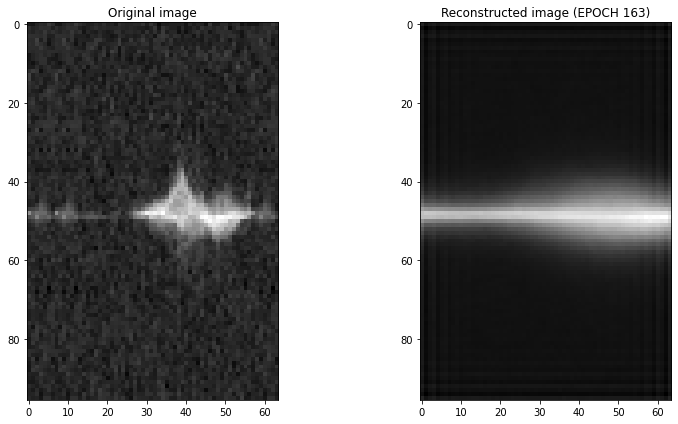

Epoch 164/500, Train Loss: 139519.7807, Validation Loss: 139257.5661
Time for epoch 164 is 8.856968879699707 sec


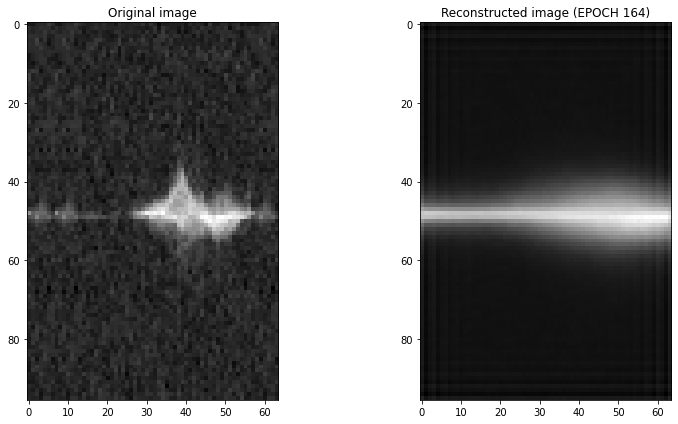

Epoch 165/500, Train Loss: 139511.9599, Validation Loss: 139251.5285
Time for epoch 165 is 9.149573564529419 sec


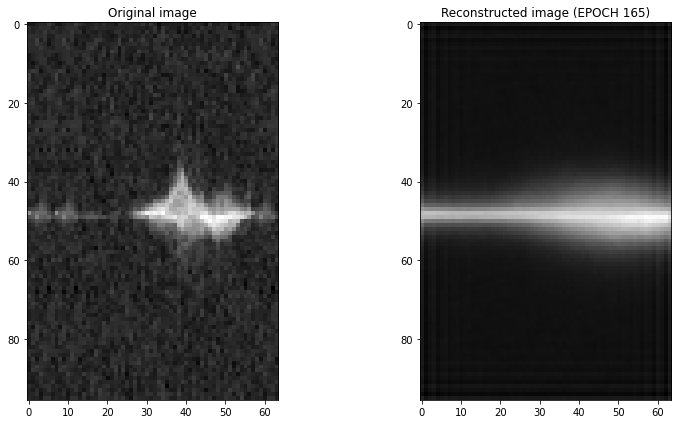

Epoch 166/500, Train Loss: 139506.1340, Validation Loss: 139245.0201
Time for epoch 166 is 9.171571731567383 sec


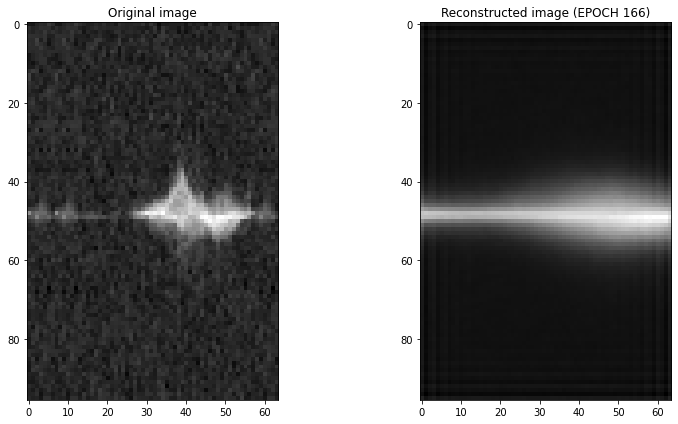

Epoch 167/500, Train Loss: 139500.4612, Validation Loss: 139254.7806
Time for epoch 167 is 9.009017705917358 sec


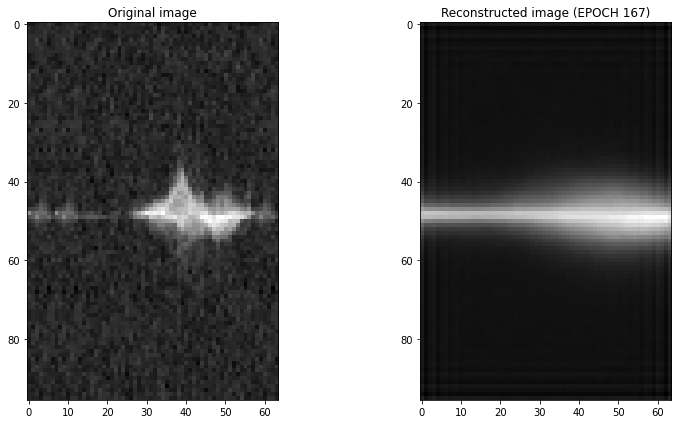

Epoch 168/500, Train Loss: 139497.9951, Validation Loss: 139250.2622
Time for epoch 168 is 8.81550645828247 sec


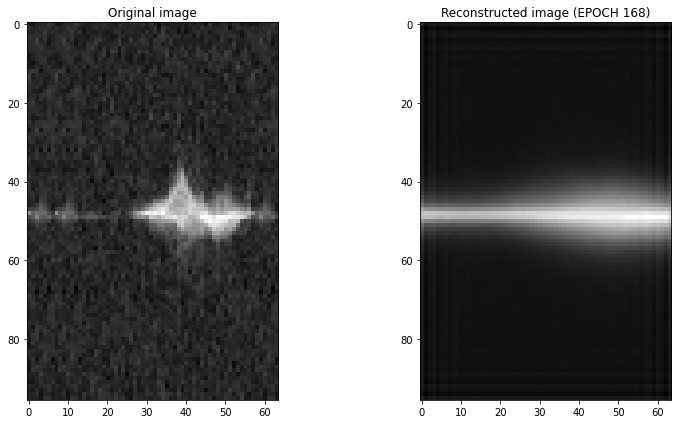

Epoch 169/500, Train Loss: 139489.2262, Validation Loss: 139245.3672
Time for epoch 169 is 9.215764284133911 sec


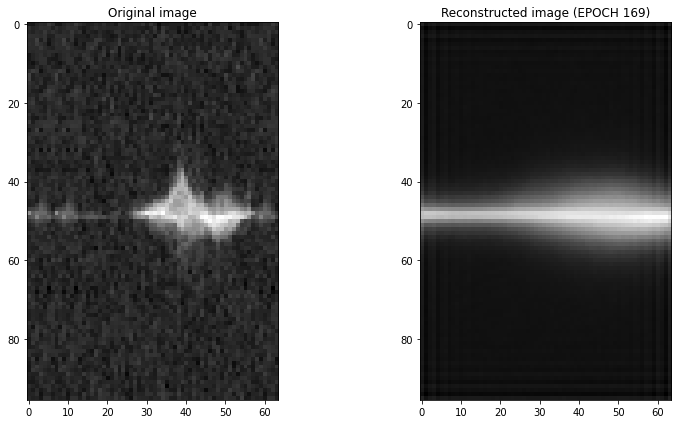

Epoch 170/500, Train Loss: 139484.1514, Validation Loss: 139237.6204
Time for epoch 170 is 9.261318683624268 sec


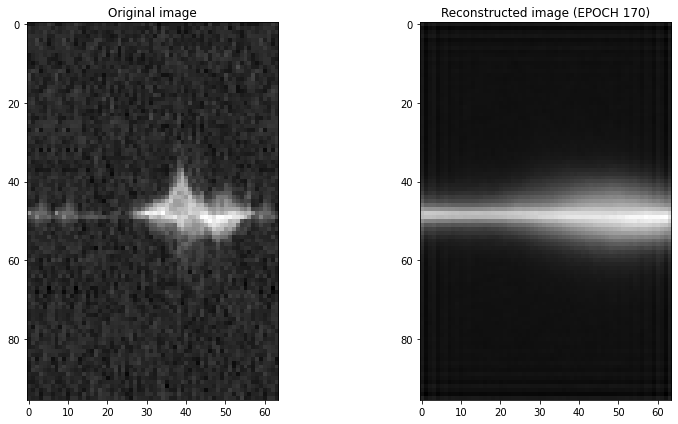

Epoch 171/500, Train Loss: 139481.2039, Validation Loss: 139245.4477
Time for epoch 171 is 8.80213975906372 sec


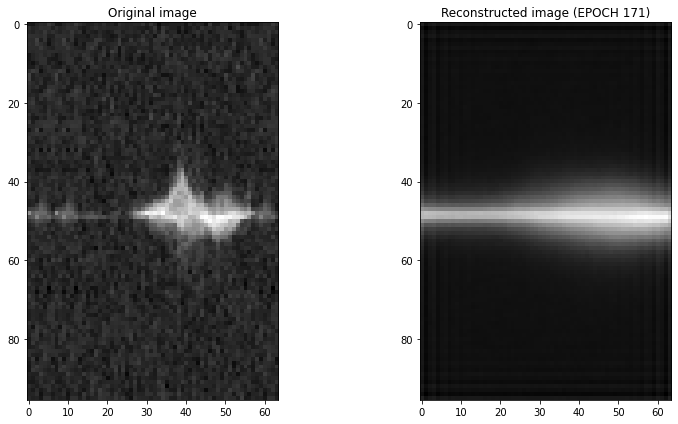

Epoch 172/500, Train Loss: 139475.0080, Validation Loss: 139249.6988
Time for epoch 172 is 8.933534145355225 sec


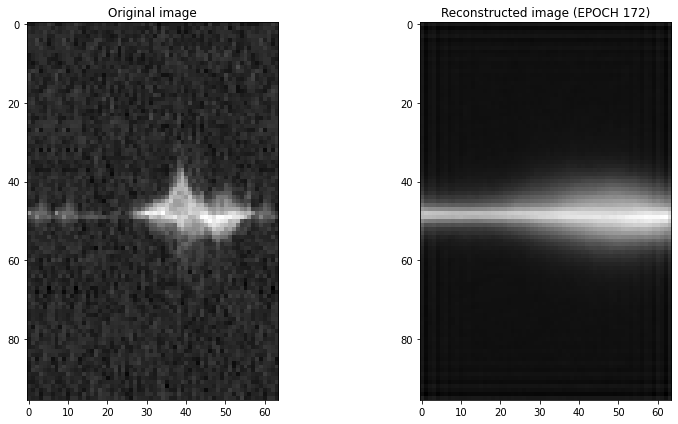

Epoch 173/500, Train Loss: 139471.4629, Validation Loss: 139240.4064
Time for epoch 173 is 9.173907041549683 sec


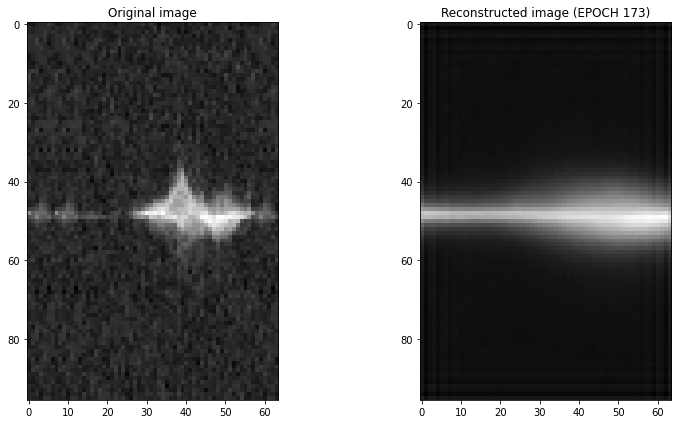

Epoch 174/500, Train Loss: 139463.8449, Validation Loss: 139239.8727
Time for epoch 174 is 9.227652549743652 sec


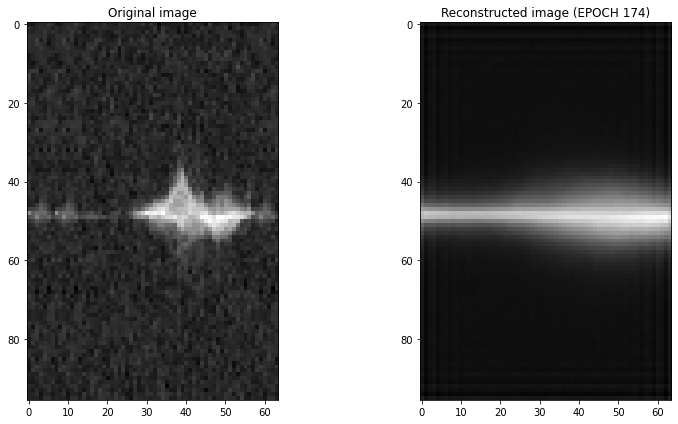

Epoch 175/500, Train Loss: 139459.0389, Validation Loss: 139240.3175
Time for epoch 175 is 9.660872220993042 sec


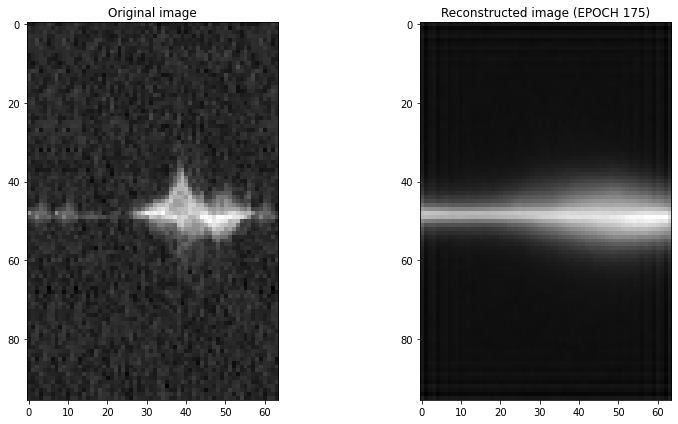

Epoch 176/500, Train Loss: 139456.8199, Validation Loss: 139234.3020
Time for epoch 176 is 11.645422220230103 sec


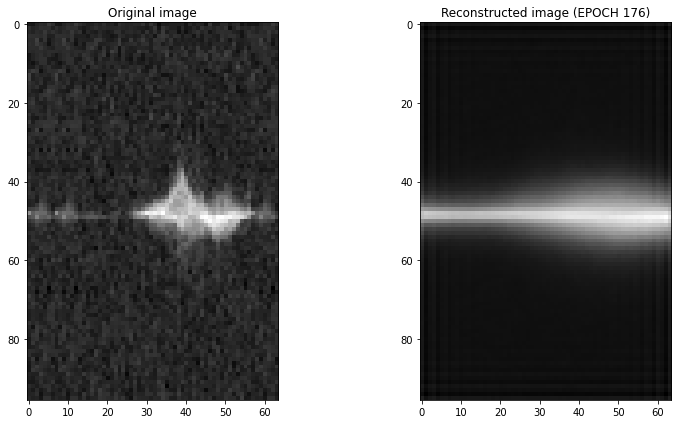

Epoch 177/500, Train Loss: 139453.8423, Validation Loss: 139240.1230
Time for epoch 177 is 8.698934555053711 sec


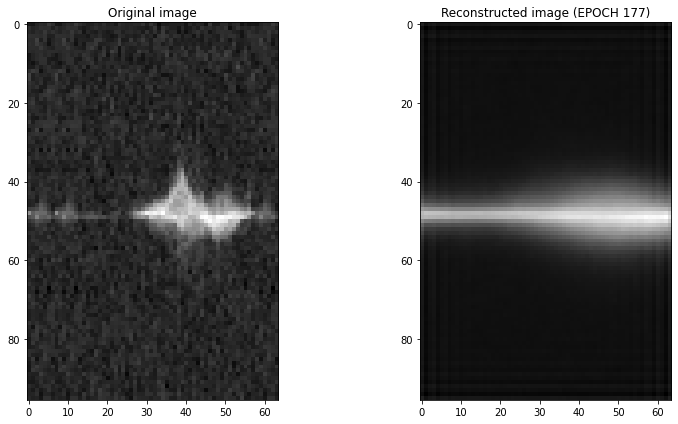

Epoch 178/500, Train Loss: 139485.8781, Validation Loss: 139268.5743
Time for epoch 178 is 9.303452014923096 sec


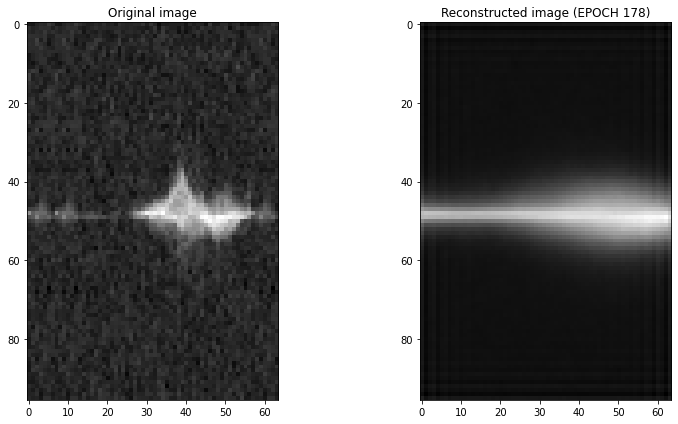

Epoch 179/500, Train Loss: 139469.2368, Validation Loss: 139253.7506
Time for epoch 179 is 10.246276140213013 sec


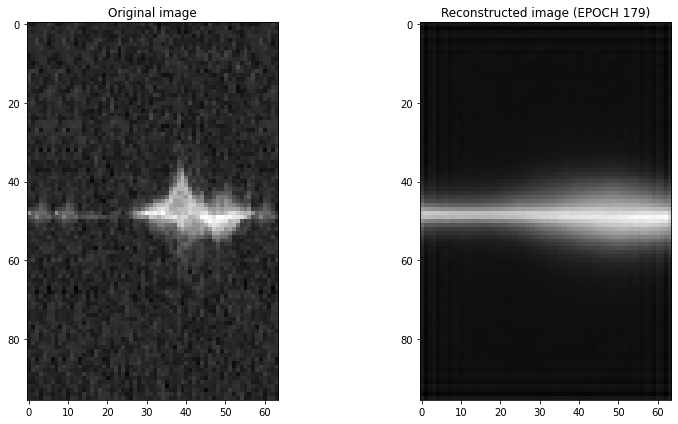

Epoch 180/500, Train Loss: 139462.1135, Validation Loss: 139256.9345
Time for epoch 180 is 15.874707460403442 sec


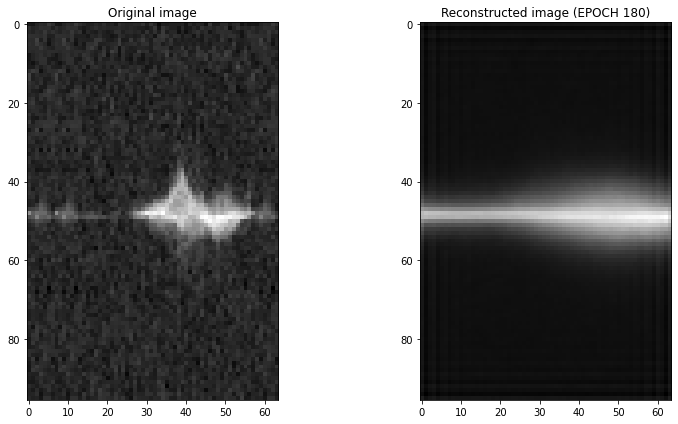

Epoch 181/500, Train Loss: 139455.5939, Validation Loss: 139262.7099
Time for epoch 181 is 13.976189613342285 sec


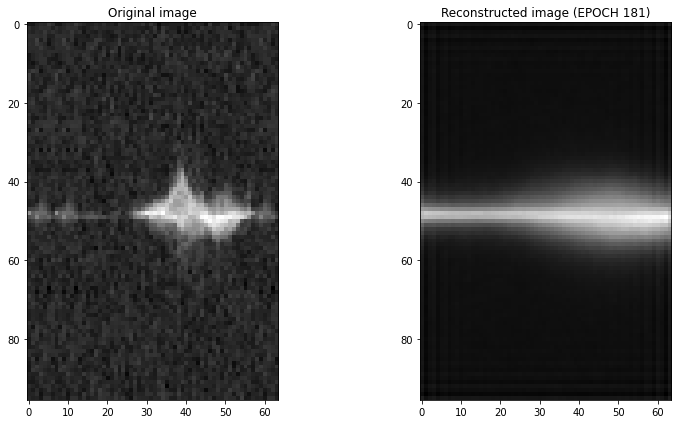

Epoch 182/500, Train Loss: 139448.4925, Validation Loss: 139252.8028
Time for epoch 182 is 11.577269077301025 sec


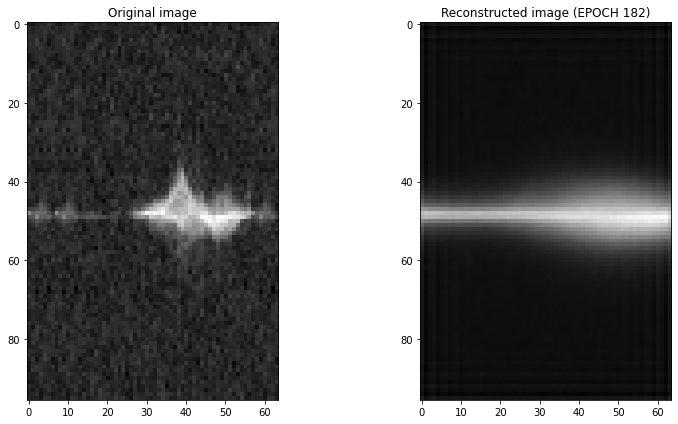

Epoch 183/500, Train Loss: 139446.3590, Validation Loss: 139249.0665
Time for epoch 183 is 10.82337498664856 sec


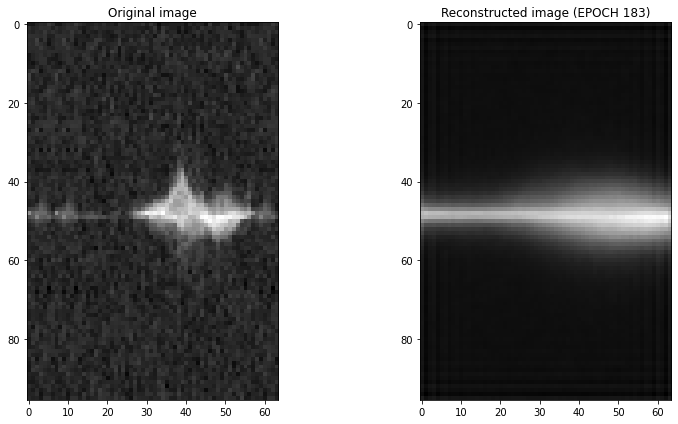

Epoch 184/500, Train Loss: 139439.8427, Validation Loss: 139267.7324
Time for epoch 184 is 12.138397693634033 sec


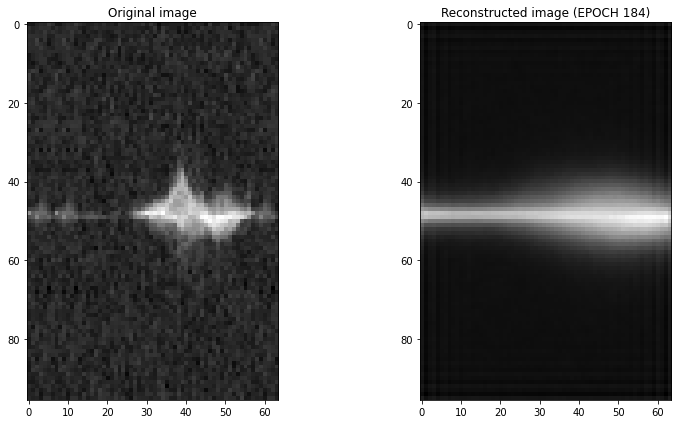

Epoch 185/500, Train Loss: 139431.1777, Validation Loss: 139242.6450
Time for epoch 185 is 9.195975303649902 sec


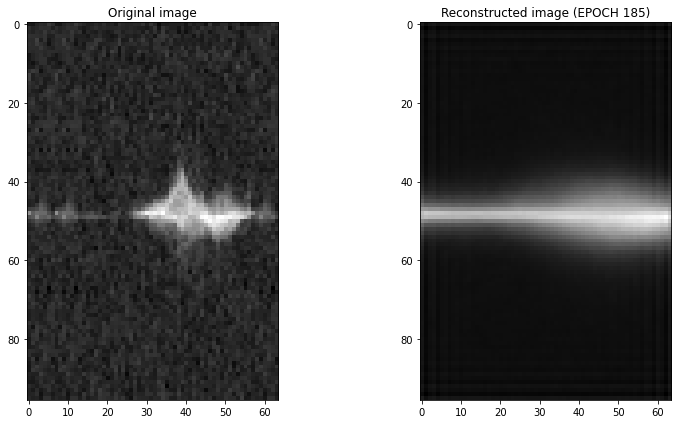

Epoch 186/500, Train Loss: 139431.2327, Validation Loss: 139242.5880
Time for epoch 186 is 8.920835971832275 sec


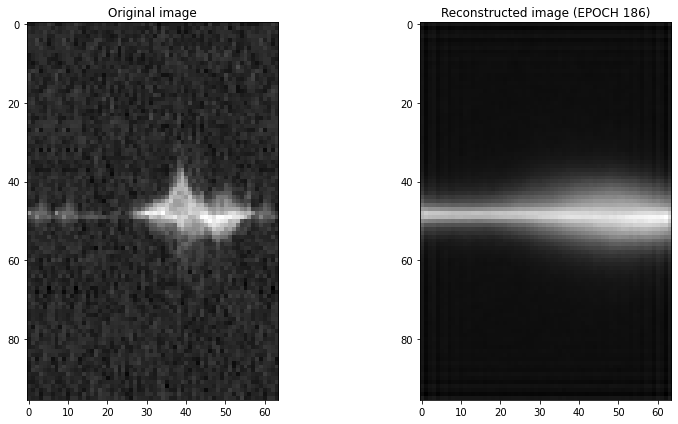

Epoch 187/500, Train Loss: 139427.4210, Validation Loss: 139239.4507
Time for epoch 187 is 8.877343893051147 sec


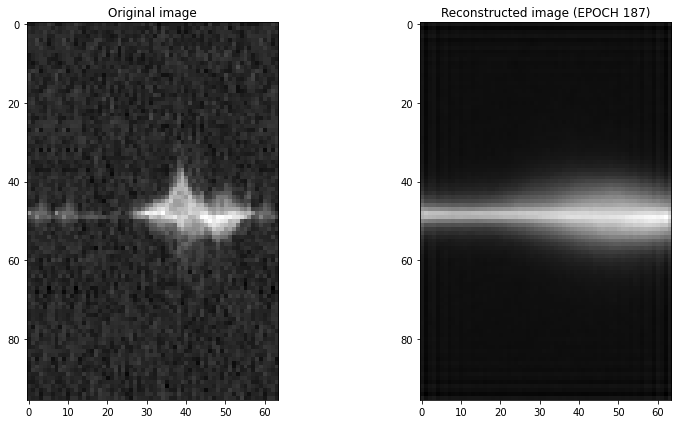

Epoch 188/500, Train Loss: 139423.6609, Validation Loss: 139238.2475
Time for epoch 188 is 9.253008604049683 sec


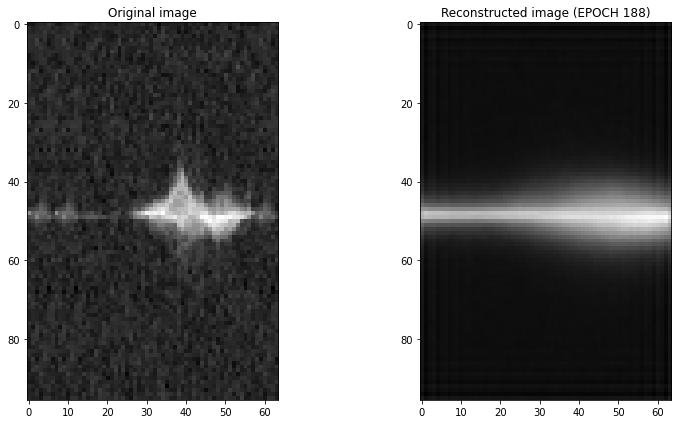

Epoch 189/500, Train Loss: 139419.6718, Validation Loss: 139236.6288
Time for epoch 189 is 9.394267797470093 sec


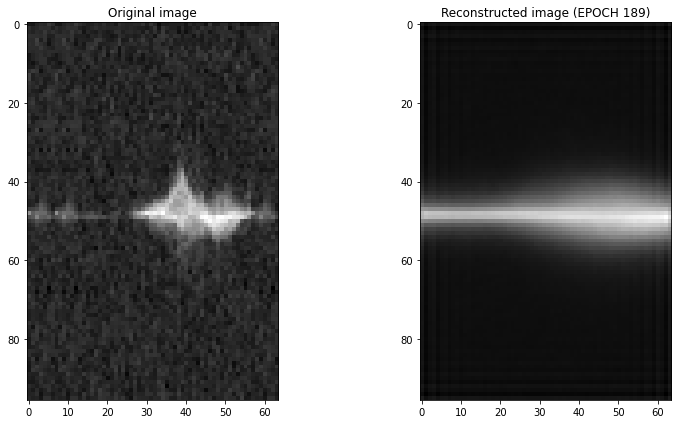

Epoch 190/500, Train Loss: 139417.7775, Validation Loss: 139251.4679
Time for epoch 190 is 8.952088594436646 sec


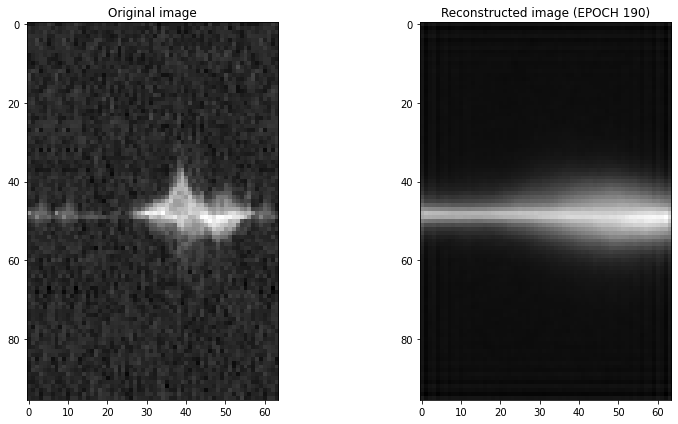

Epoch 191/500, Train Loss: 139415.3899, Validation Loss: 139234.4720
Time for epoch 191 is 9.502874851226807 sec


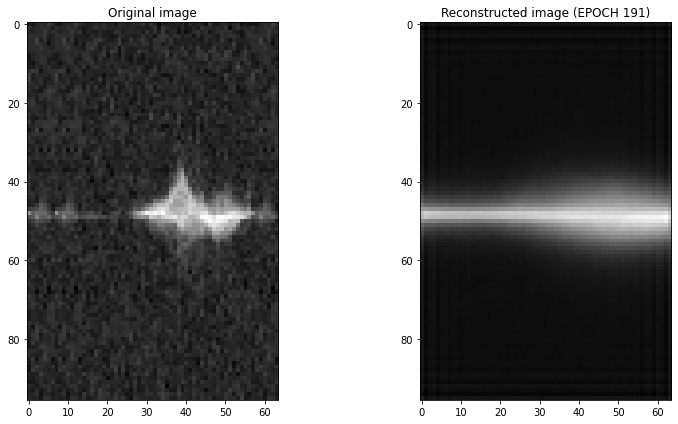

Epoch 192/500, Train Loss: 139414.0483, Validation Loss: 139234.5836
Time for epoch 192 is 9.439496994018555 sec


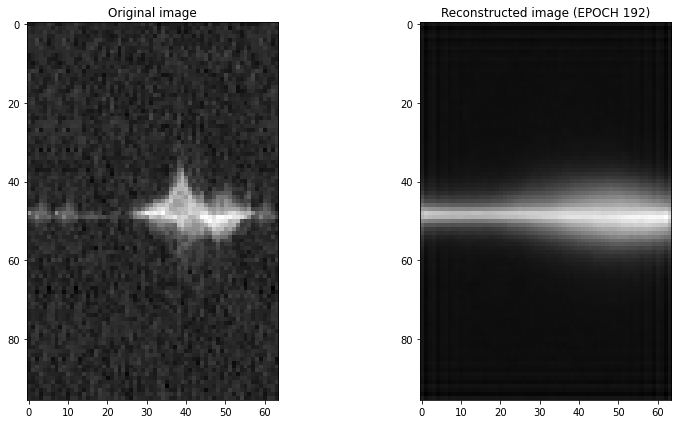

Epoch 193/500, Train Loss: 139408.1360, Validation Loss: 139237.3400
Time for epoch 193 is 13.188830852508545 sec


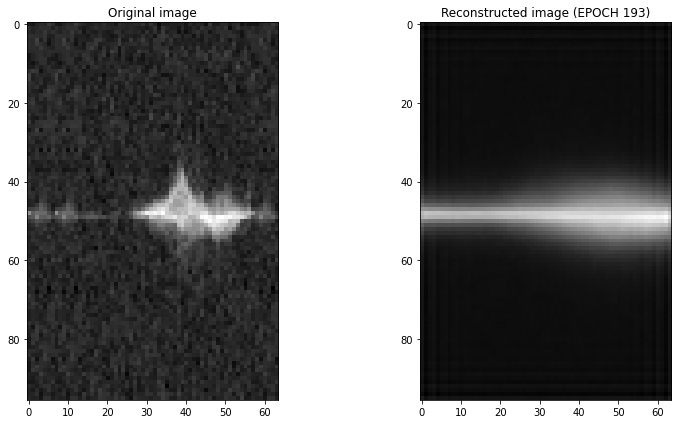

Epoch 194/500, Train Loss: 139405.0815, Validation Loss: 139235.0534
Time for epoch 194 is 14.491529703140259 sec


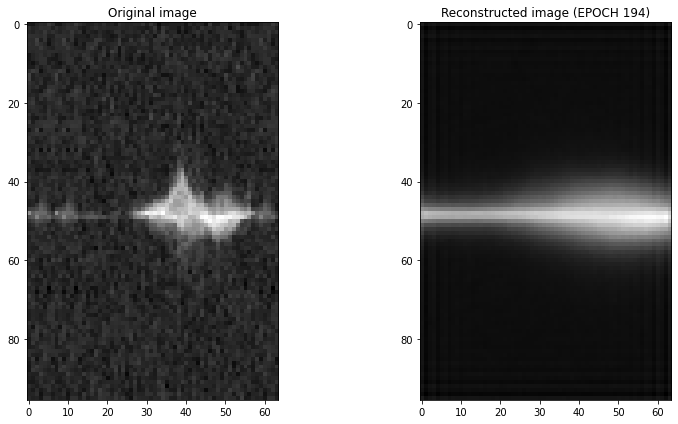

Epoch 195/500, Train Loss: 139401.4459, Validation Loss: 139244.8265
Time for epoch 195 is 9.111075162887573 sec


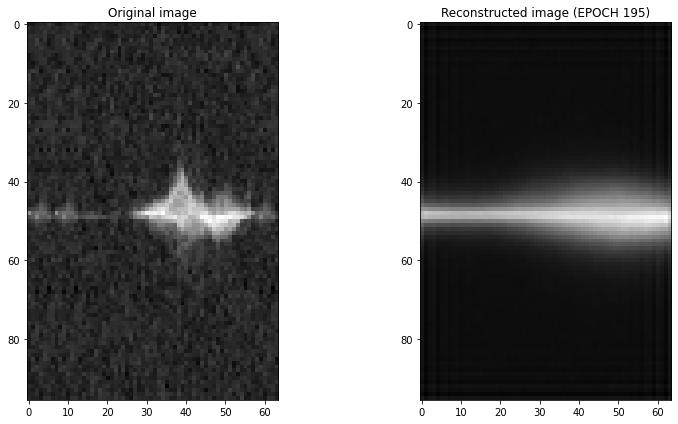

Epoch 196/500, Train Loss: 139402.1708, Validation Loss: 139231.2562
Time for epoch 196 is 9.869853734970093 sec


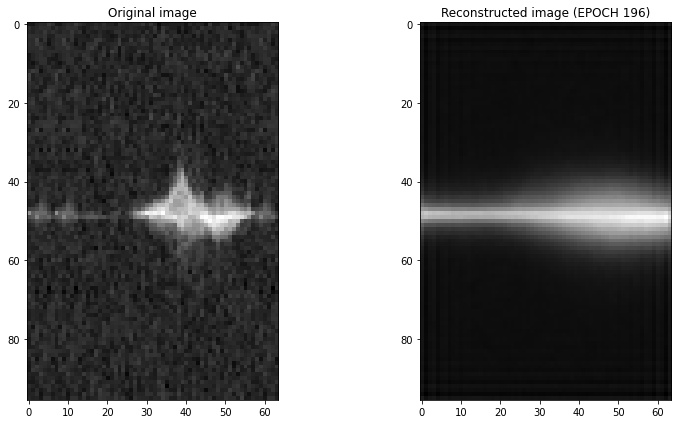

Epoch 197/500, Train Loss: 139395.8699, Validation Loss: 139230.1444
Time for epoch 197 is 15.859747171401978 sec


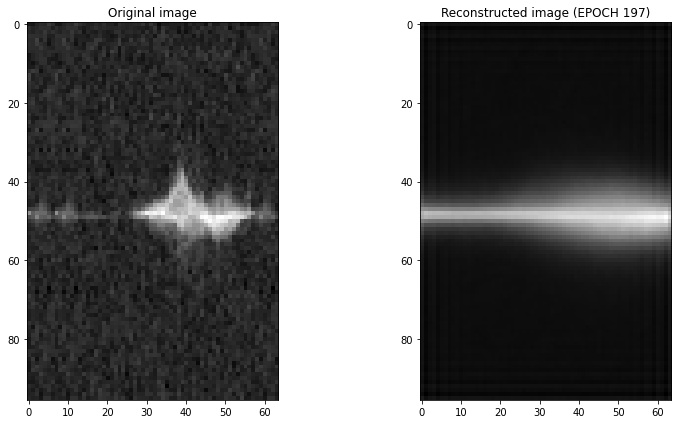

Epoch 198/500, Train Loss: 139393.9487, Validation Loss: 139230.1503
Time for epoch 198 is 9.196704864501953 sec


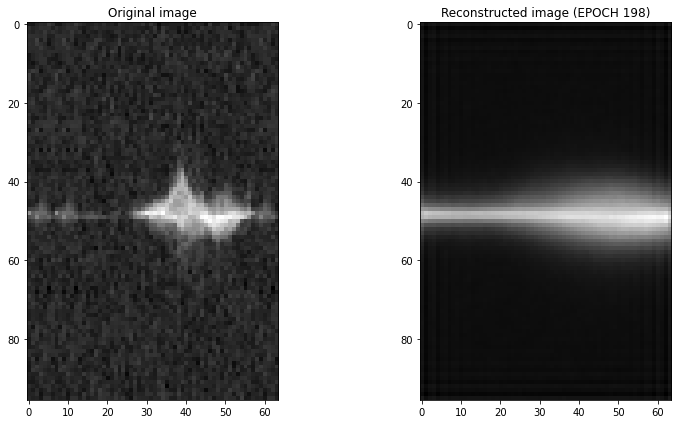

Epoch 199/500, Train Loss: 139393.8989, Validation Loss: 139231.7521
Time for epoch 199 is 8.511603116989136 sec


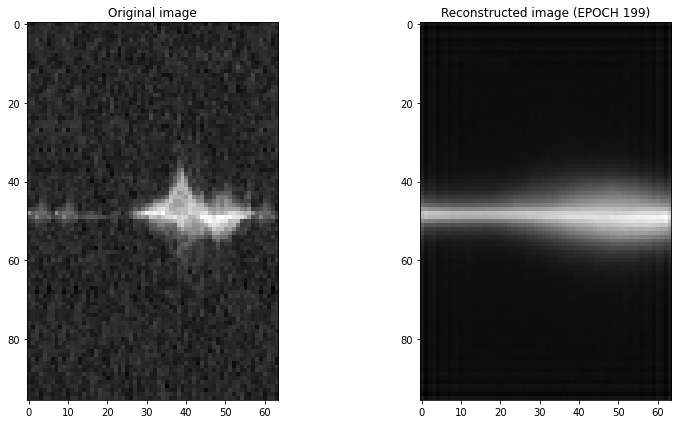

Epoch 200/500, Train Loss: 139389.1387, Validation Loss: 139249.5542
Time for epoch 200 is 9.127448320388794 sec


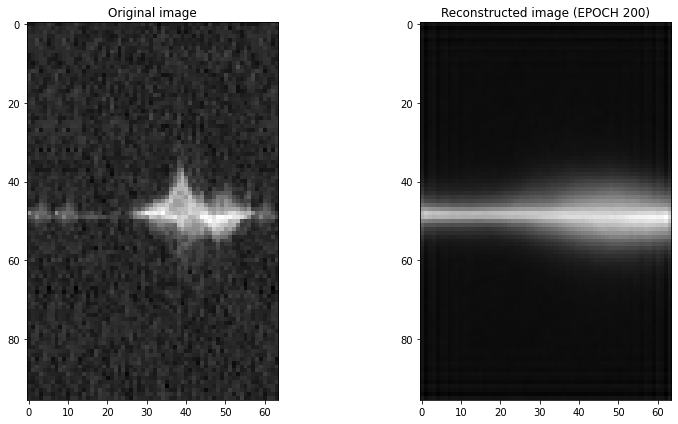

<Figure size 432x288 with 0 Axes>

Epoch 201/500, Train Loss: 139386.4906, Validation Loss: 139233.7346
Time for epoch 201 is 9.149601697921753 sec


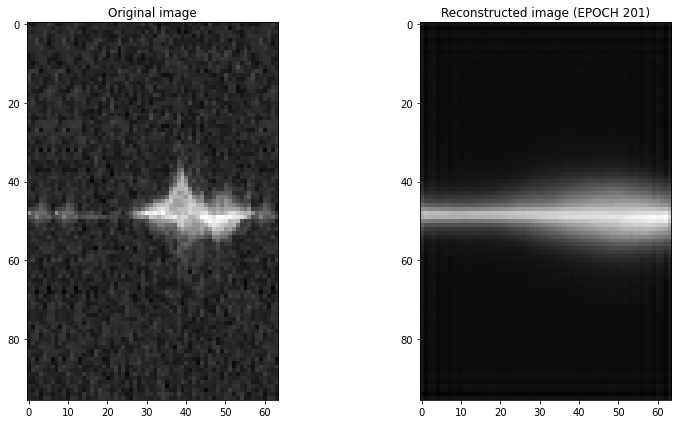

Epoch 202/500, Train Loss: 139386.4503, Validation Loss: 139230.3680
Time for epoch 202 is 9.237469673156738 sec


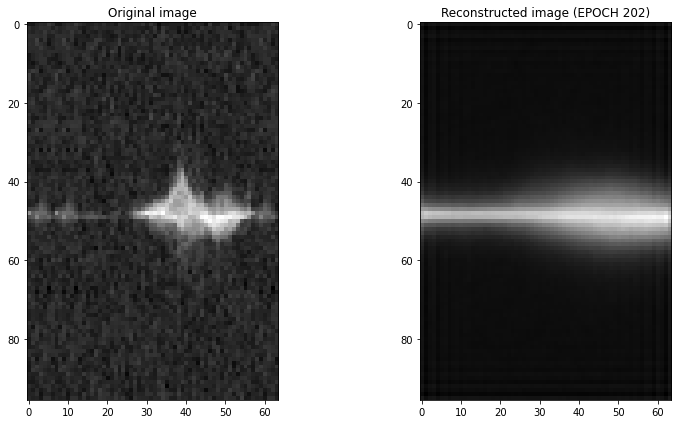

Epoch 203/500, Train Loss: 139384.2715, Validation Loss: 139228.5066
Time for epoch 203 is 8.6911301612854 sec


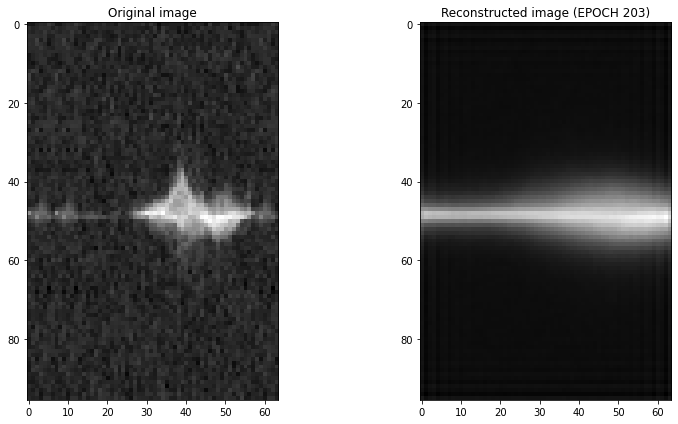

Epoch 204/500, Train Loss: 139382.3922, Validation Loss: 139228.1877
Time for epoch 204 is 10.225018501281738 sec


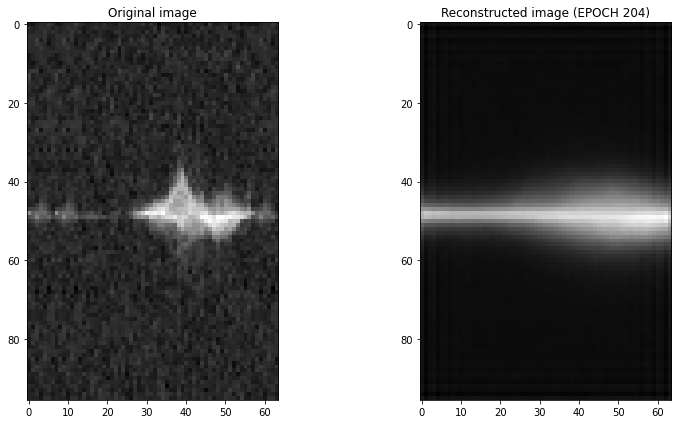

Epoch 205/500, Train Loss: 139384.6635, Validation Loss: 139229.4918
Time for epoch 205 is 9.049402713775635 sec


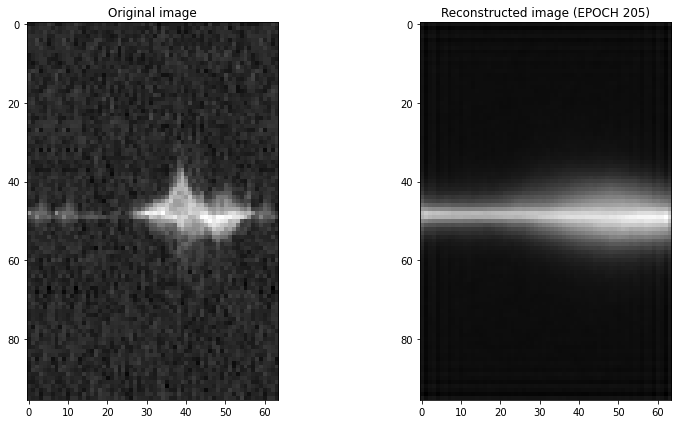

Epoch 206/500, Train Loss: 139415.8256, Validation Loss: 139256.4958
Time for epoch 206 is 9.303822040557861 sec


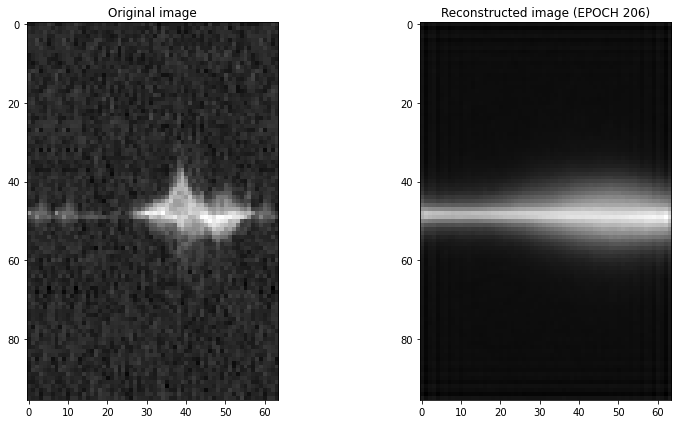

Epoch 207/500, Train Loss: 139402.0548, Validation Loss: 139247.0849
Time for epoch 207 is 8.72801685333252 sec


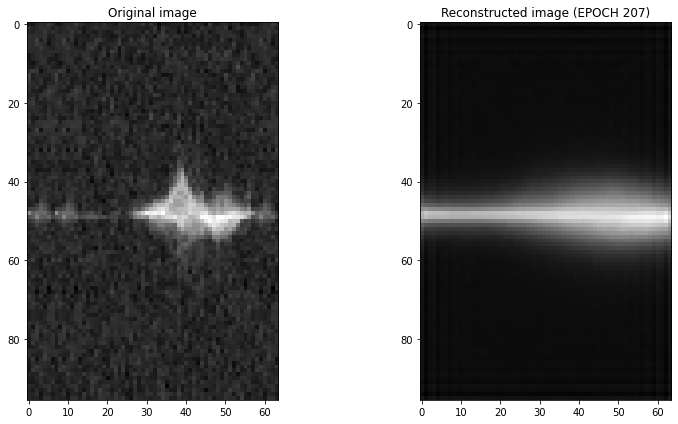

Epoch 208/500, Train Loss: 139393.6884, Validation Loss: 139245.9820
Time for epoch 208 is 8.97952938079834 sec


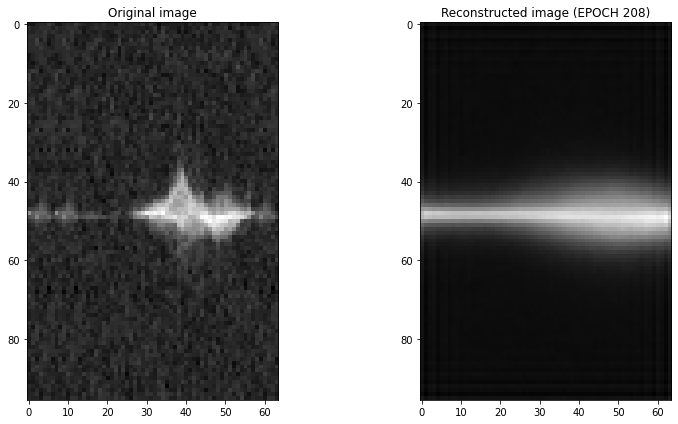

Epoch 209/500, Train Loss: 139388.8123, Validation Loss: 139241.7522
Time for epoch 209 is 9.19519853591919 sec


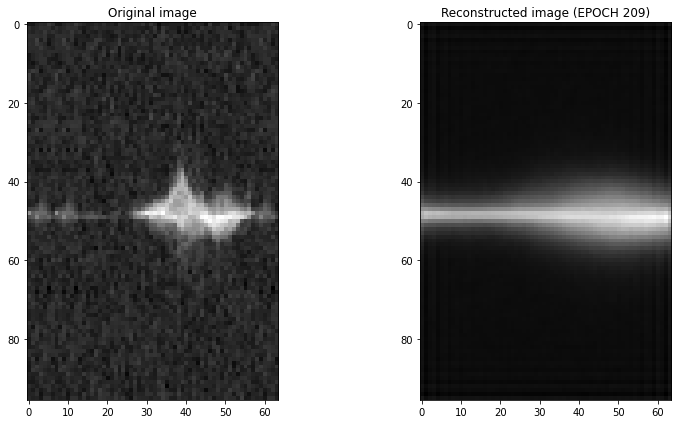

Epoch 210/500, Train Loss: 139385.1061, Validation Loss: 139245.0890
Time for epoch 210 is 9.295249938964844 sec


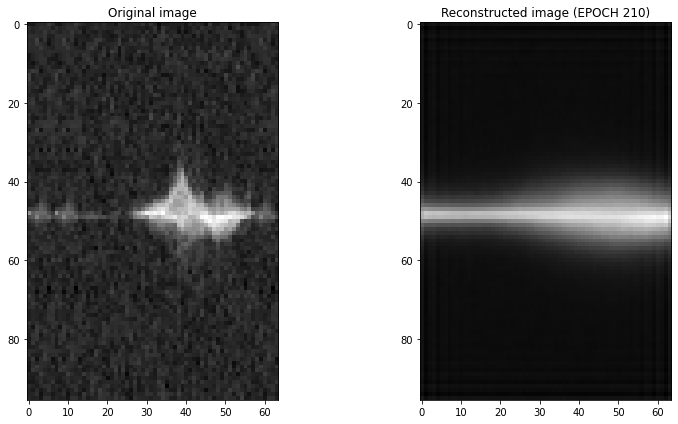

Epoch 211/500, Train Loss: 139381.1041, Validation Loss: 139238.2072
Time for epoch 211 is 8.688710689544678 sec


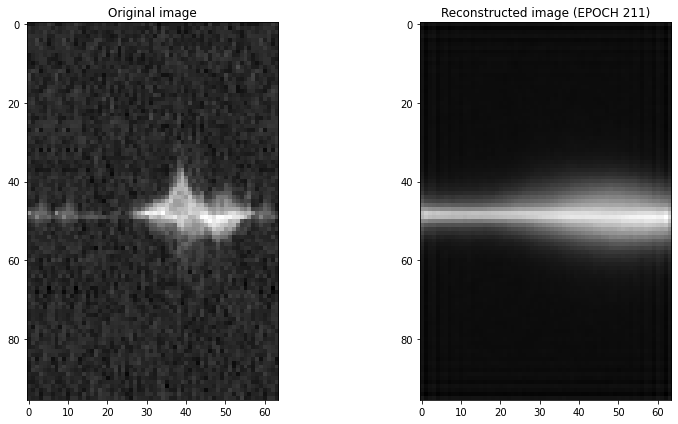

Epoch 212/500, Train Loss: 139379.7378, Validation Loss: 139239.6622
Time for epoch 212 is 9.659959554672241 sec


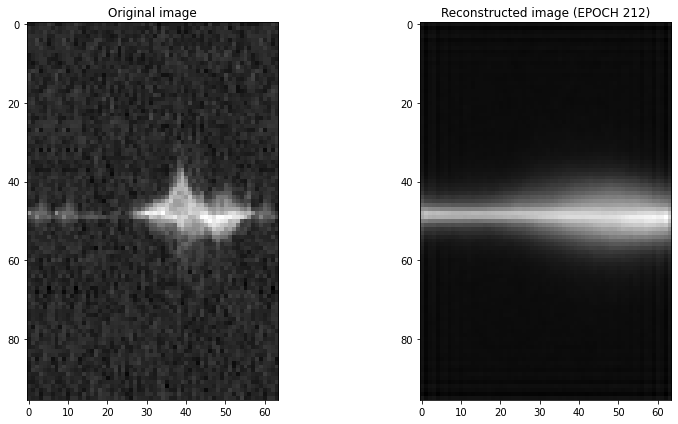

Epoch 213/500, Train Loss: 139374.8423, Validation Loss: 139234.6031
Time for epoch 213 is 9.185854434967041 sec


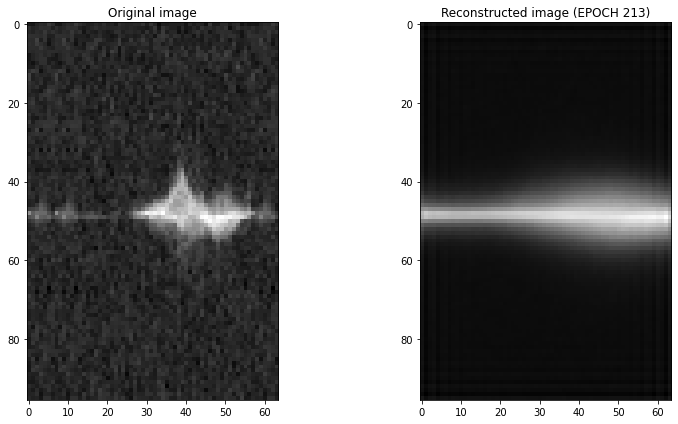

Epoch 214/500, Train Loss: 139374.3997, Validation Loss: 139235.2193
Time for epoch 214 is 9.322966814041138 sec


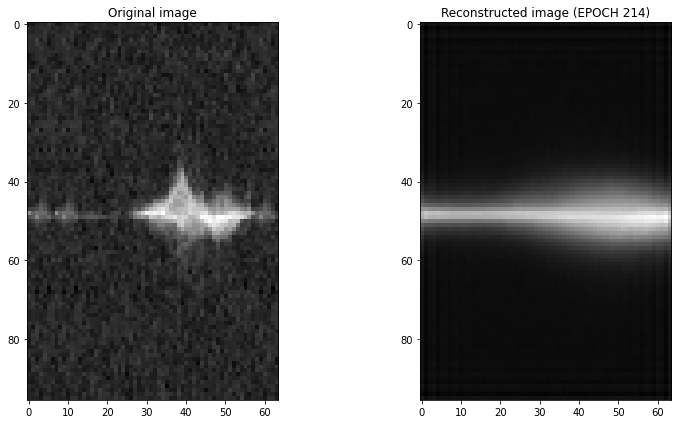

Epoch 215/500, Train Loss: 139370.4688, Validation Loss: 139235.3887
Time for epoch 215 is 8.811021089553833 sec


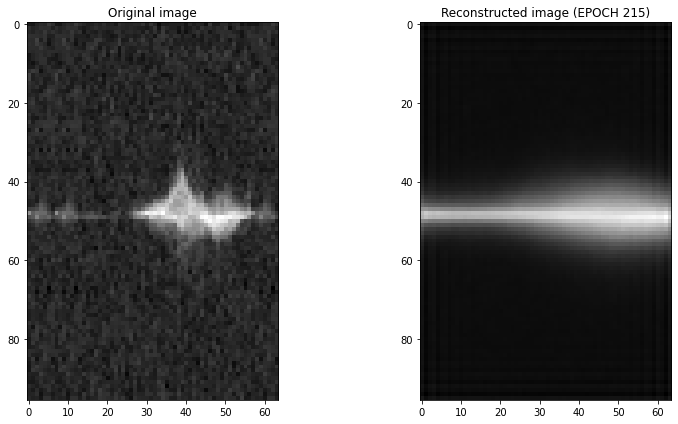

Epoch 216/500, Train Loss: 139365.6429, Validation Loss: 139230.0633
Time for epoch 216 is 9.470306396484375 sec


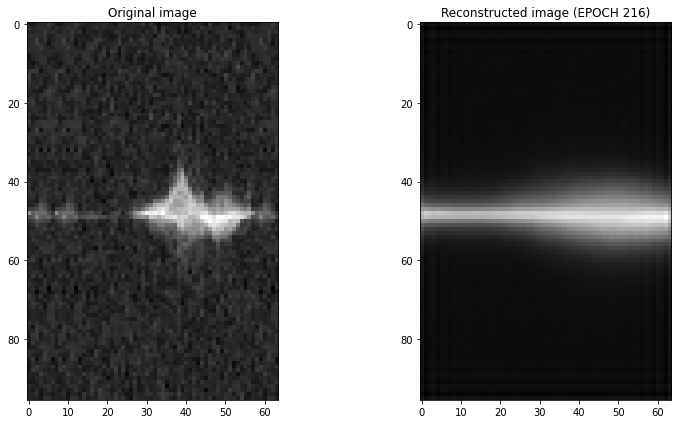

Epoch 217/500, Train Loss: 139364.8023, Validation Loss: 139233.8755
Time for epoch 217 is 9.246029138565063 sec


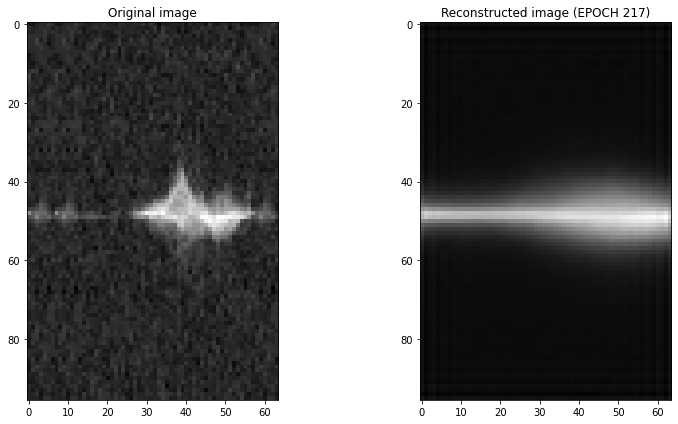

Epoch 218/500, Train Loss: 139366.4445, Validation Loss: 139232.6252
Time for epoch 218 is 9.228305101394653 sec


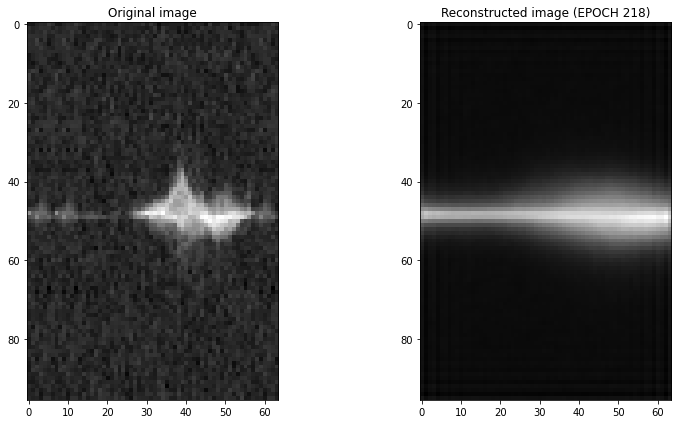

Epoch 219/500, Train Loss: 139363.5665, Validation Loss: 139231.1179
Time for epoch 219 is 8.838729619979858 sec


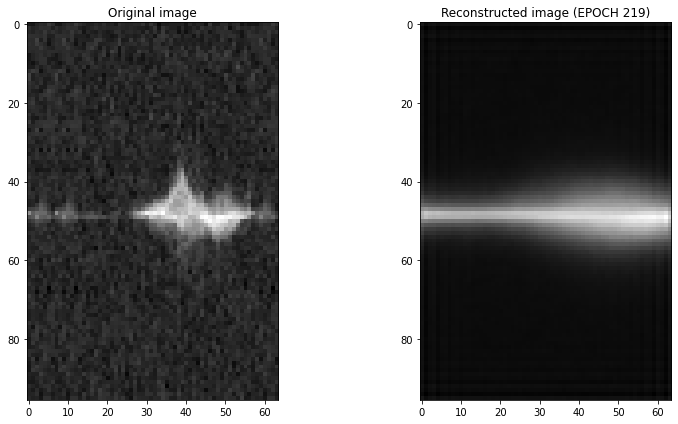

Epoch 220/500, Train Loss: 139360.4025, Validation Loss: 139227.8655
Time for epoch 220 is 8.920146226882935 sec


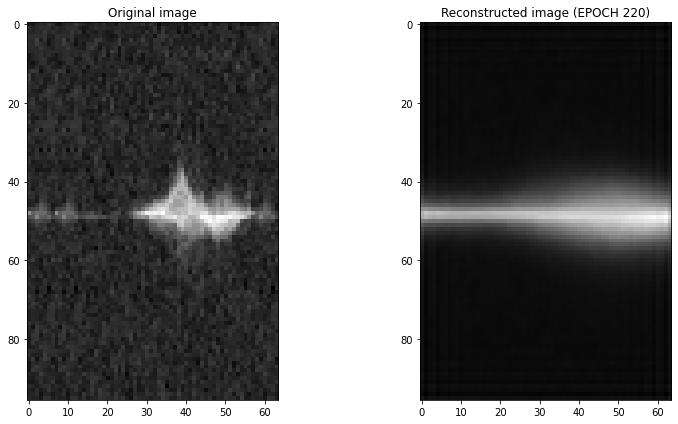

Epoch 221/500, Train Loss: 139357.1495, Validation Loss: 139225.1610
Time for epoch 221 is 9.186517000198364 sec


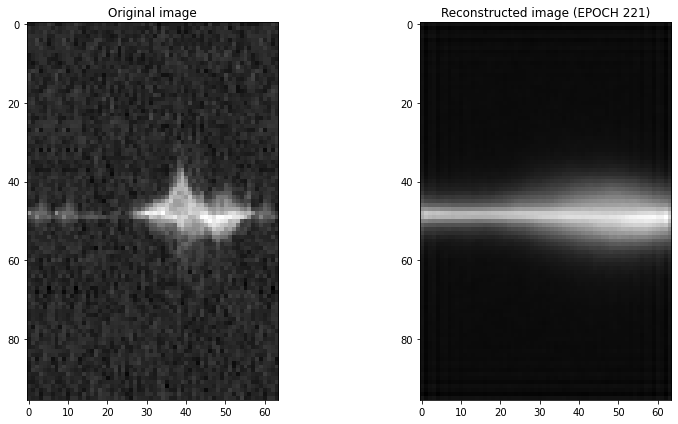

Epoch 222/500, Train Loss: 139356.7157, Validation Loss: 139224.8280
Time for epoch 222 is 9.28068208694458 sec


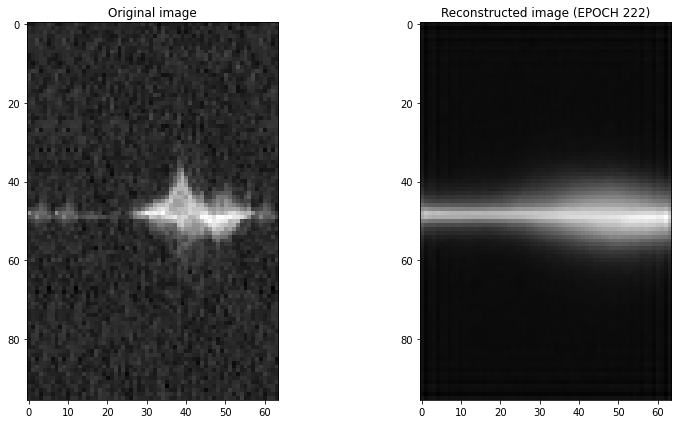

Epoch 223/500, Train Loss: 139356.9819, Validation Loss: 139226.2789
Time for epoch 223 is 8.827239990234375 sec


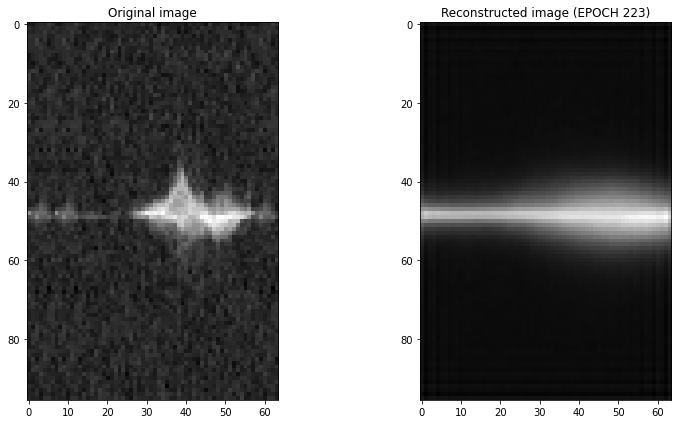

Epoch 224/500, Train Loss: 139354.7644, Validation Loss: 139223.9073
Time for epoch 224 is 9.009554862976074 sec


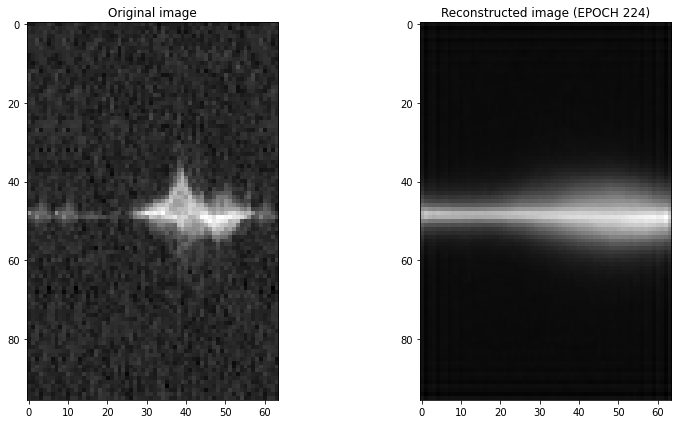

Epoch 225/500, Train Loss: 139353.1722, Validation Loss: 139223.7188
Time for epoch 225 is 9.135116338729858 sec


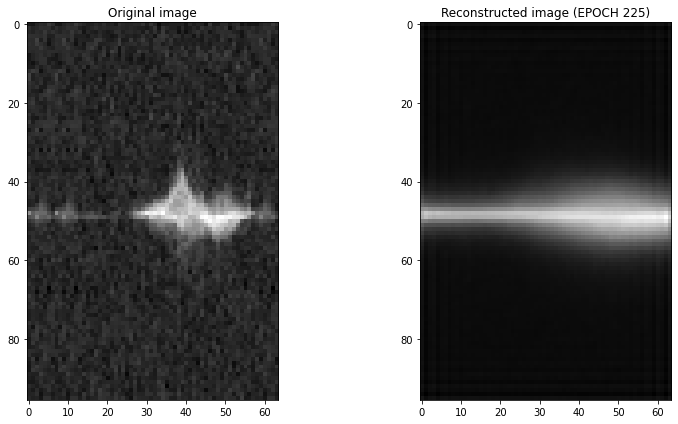

Epoch 226/500, Train Loss: 139347.5758, Validation Loss: 139226.7538
Time for epoch 226 is 9.271543025970459 sec


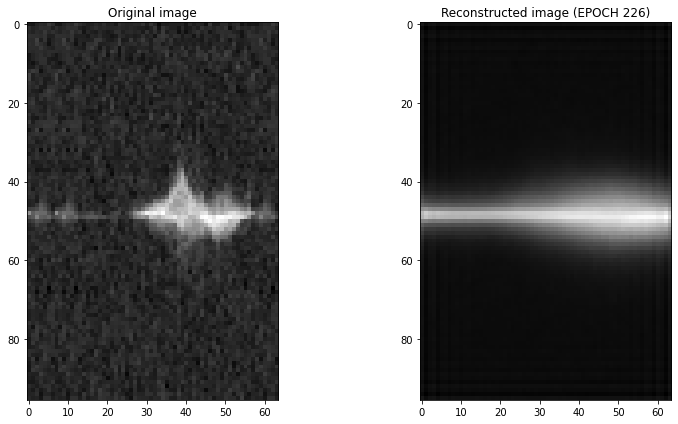

Epoch 227/500, Train Loss: 139350.1132, Validation Loss: 139224.3124
Time for epoch 227 is 8.597130298614502 sec


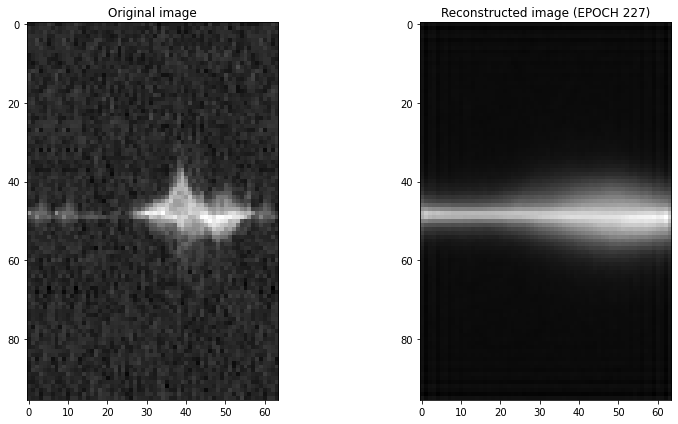

Epoch 228/500, Train Loss: 139350.5991, Validation Loss: 139226.8780
Time for epoch 228 is 9.016211032867432 sec


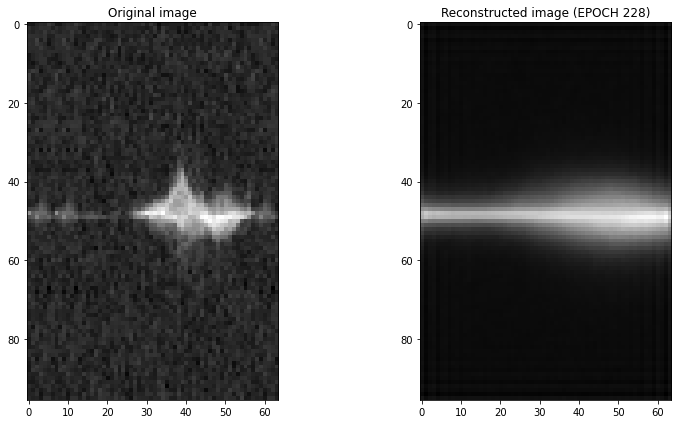

Epoch 229/500, Train Loss: 139346.0766, Validation Loss: 139223.9809
Time for epoch 229 is 9.166618824005127 sec


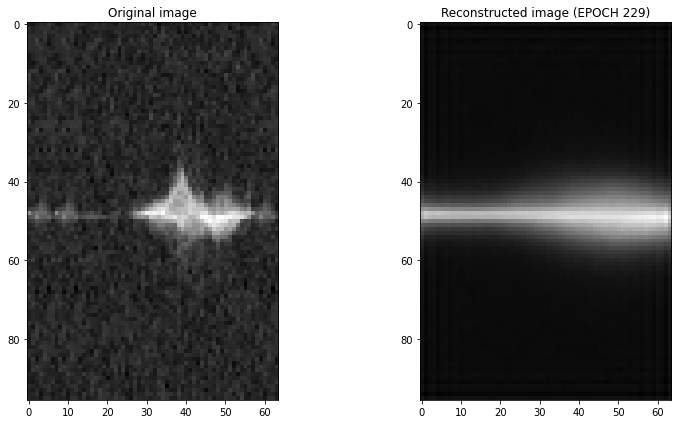

Epoch 230/500, Train Loss: 139348.0191, Validation Loss: 139229.5677
Time for epoch 230 is 9.306946516036987 sec


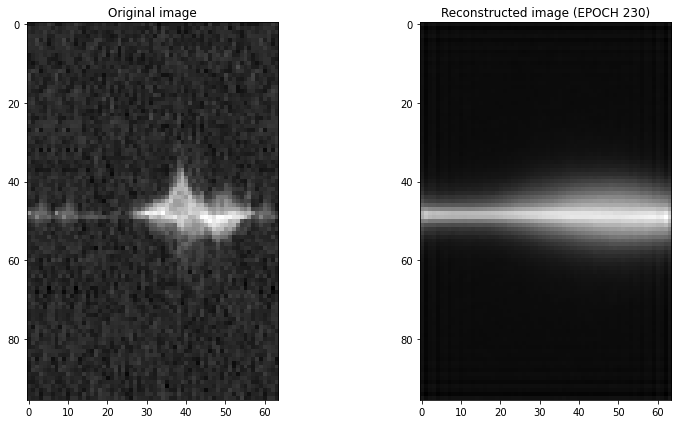

Epoch 231/500, Train Loss: 139345.6810, Validation Loss: 139221.8597
Time for epoch 231 is 8.73861575126648 sec


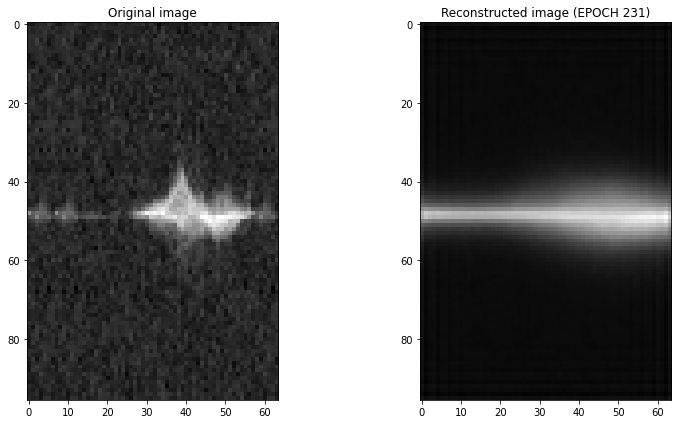

Epoch 232/500, Train Loss: 139343.4788, Validation Loss: 139221.6590
Time for epoch 232 is 9.066927194595337 sec


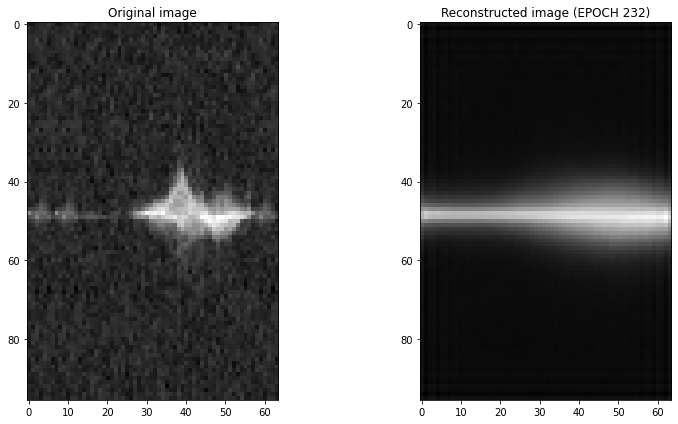

Epoch 233/500, Train Loss: 139341.4652, Validation Loss: 139223.5801
Time for epoch 233 is 9.17824673652649 sec


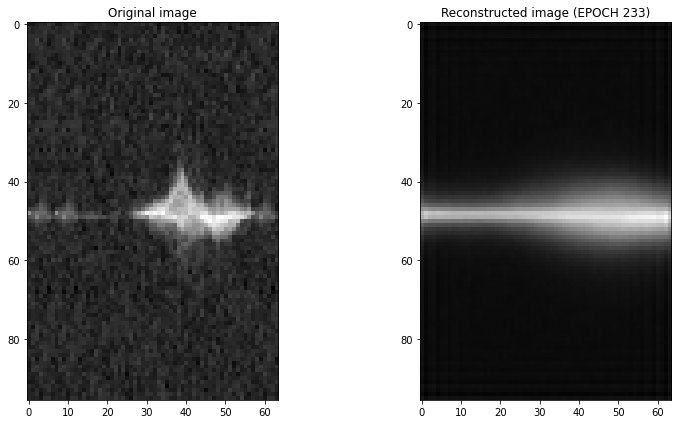

Epoch 234/500, Train Loss: 139339.7805, Validation Loss: 139222.1550
Time for epoch 234 is 9.349530458450317 sec


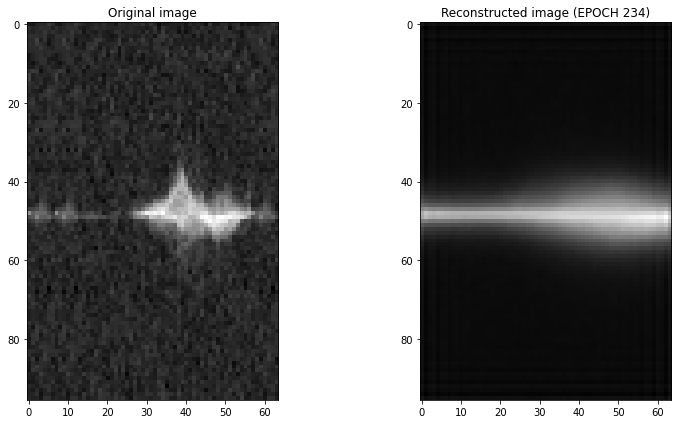

Epoch 235/500, Train Loss: 139340.4613, Validation Loss: 139219.2233
Time for epoch 235 is 8.66559362411499 sec


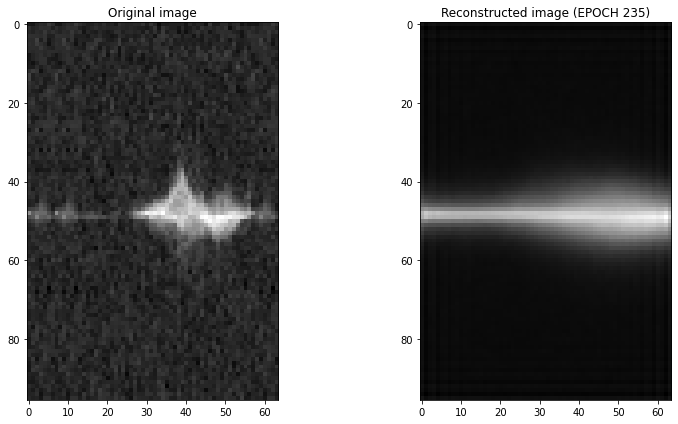

Epoch 236/500, Train Loss: 139336.6702, Validation Loss: 139220.5258
Time for epoch 236 is 9.248082637786865 sec


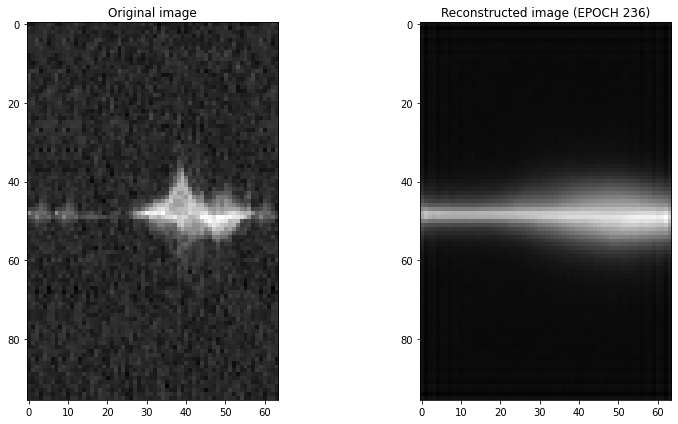

Epoch 237/500, Train Loss: 139353.3608, Validation Loss: 139233.0581
Time for epoch 237 is 9.700145721435547 sec


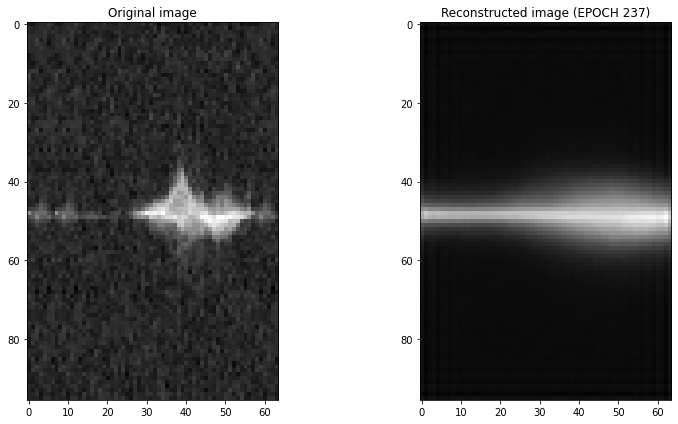

Epoch 238/500, Train Loss: 139345.3796, Validation Loss: 139228.2145
Time for epoch 238 is 9.147712230682373 sec


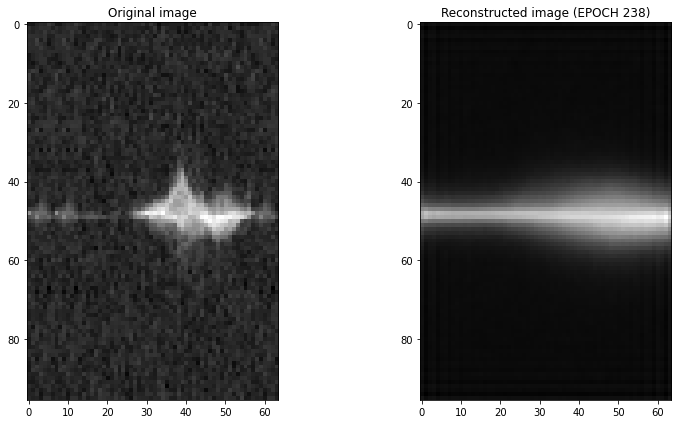

Epoch 239/500, Train Loss: 139342.6934, Validation Loss: 139229.5307
Time for epoch 239 is 8.68497109413147 sec


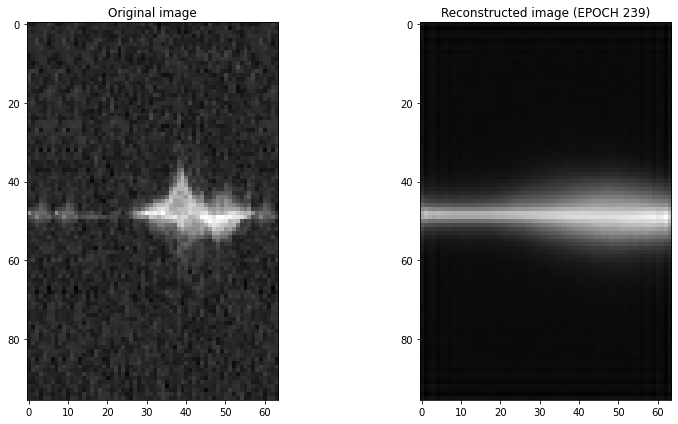

Epoch 240/500, Train Loss: 139339.9438, Validation Loss: 139226.2090
Time for epoch 240 is 9.15456748008728 sec


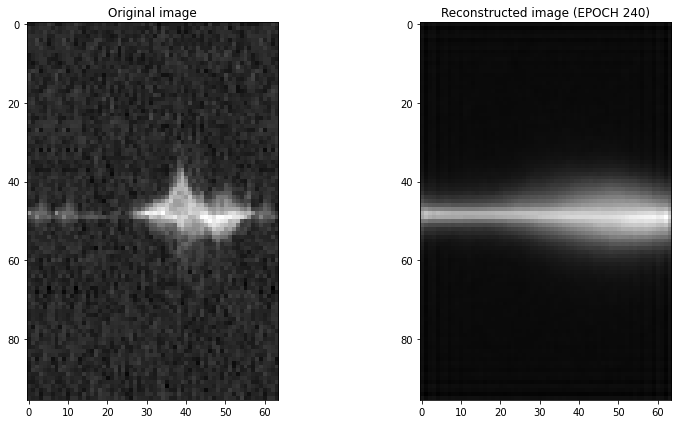

Epoch 241/500, Train Loss: 139337.0565, Validation Loss: 139227.3138
Time for epoch 241 is 9.203065395355225 sec


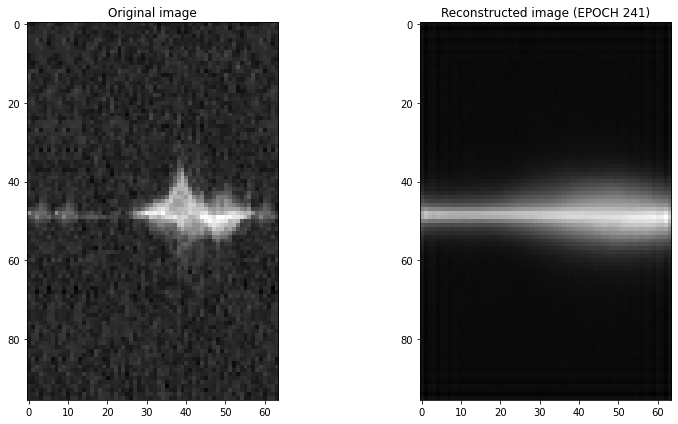

Epoch 242/500, Train Loss: 139336.5885, Validation Loss: 139224.3046
Time for epoch 242 is 8.968628883361816 sec


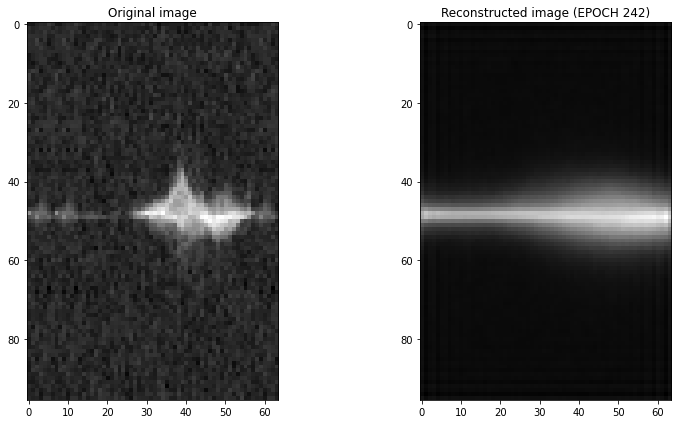

Epoch 243/500, Train Loss: 139333.4167, Validation Loss: 139222.7839
Time for epoch 243 is 8.82575511932373 sec


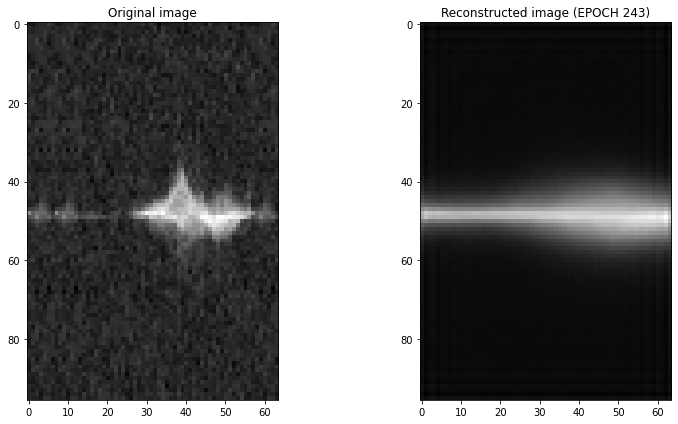

Epoch 244/500, Train Loss: 139334.9455, Validation Loss: 139223.2639
Time for epoch 244 is 9.11329460144043 sec


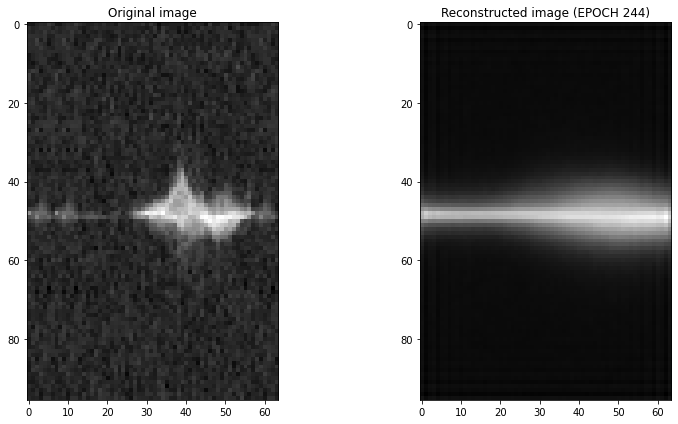

Epoch 245/500, Train Loss: 139333.4509, Validation Loss: 139221.5428
Time for epoch 245 is 9.265701293945312 sec


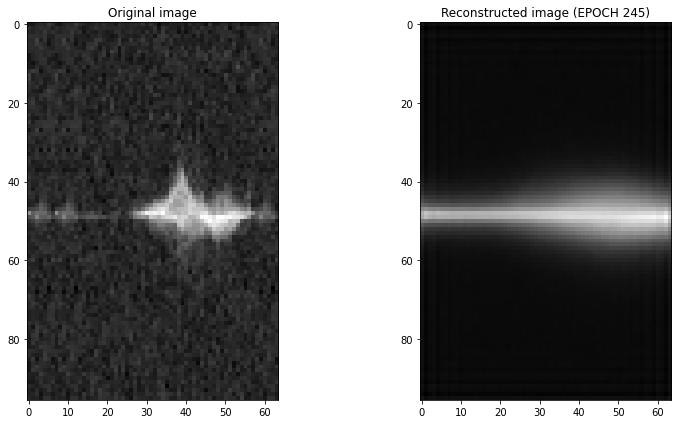

Epoch 246/500, Train Loss: 139333.9459, Validation Loss: 139222.0917
Time for epoch 246 is 9.047152042388916 sec


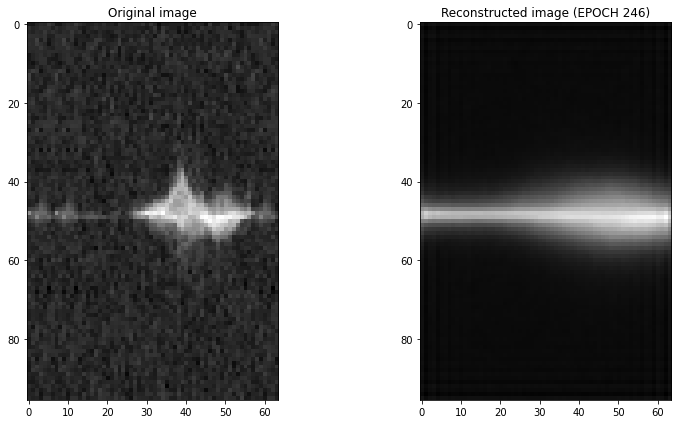

Epoch 247/500, Train Loss: 139330.0184, Validation Loss: 139220.2348
Time for epoch 247 is 8.732854127883911 sec


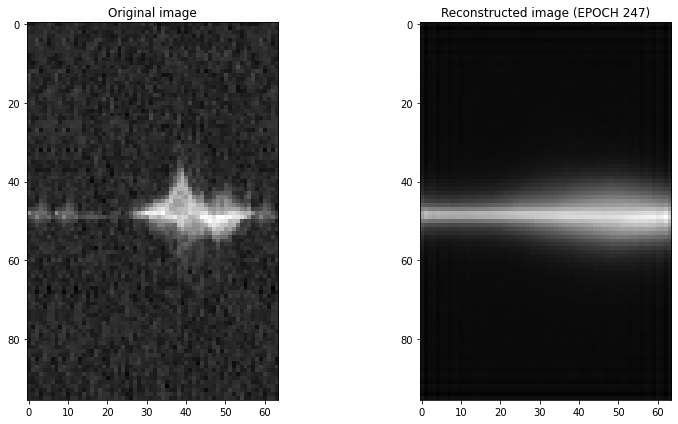

Epoch 248/500, Train Loss: 139330.0253, Validation Loss: 139226.0728
Time for epoch 248 is 9.13003158569336 sec


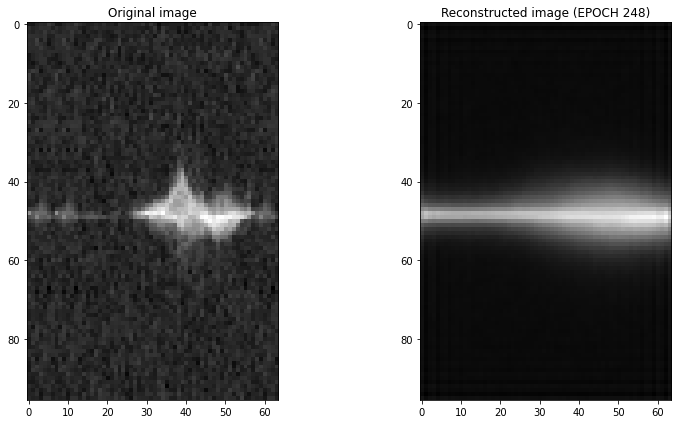

Epoch 249/500, Train Loss: 139329.0151, Validation Loss: 139221.2725
Time for epoch 249 is 9.201916933059692 sec


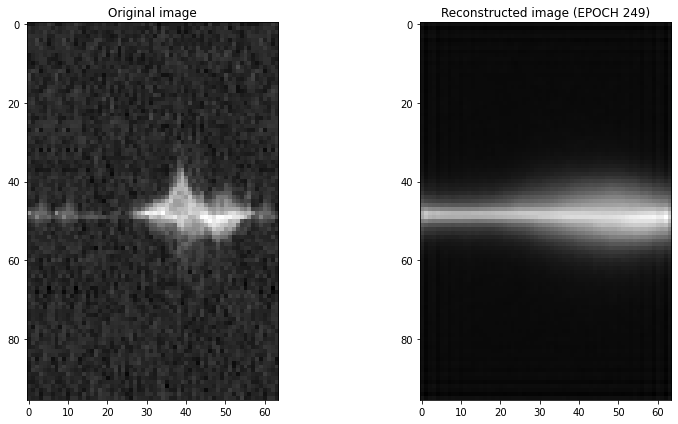

Epoch 250/500, Train Loss: 139325.4177, Validation Loss: 139222.4355
Time for epoch 250 is 8.72165298461914 sec


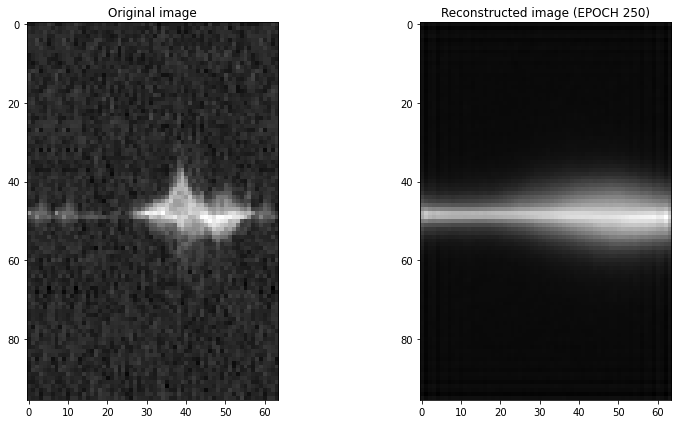

Epoch 251/500, Train Loss: 139326.5199, Validation Loss: 139223.1256
Time for epoch 251 is 8.945289611816406 sec


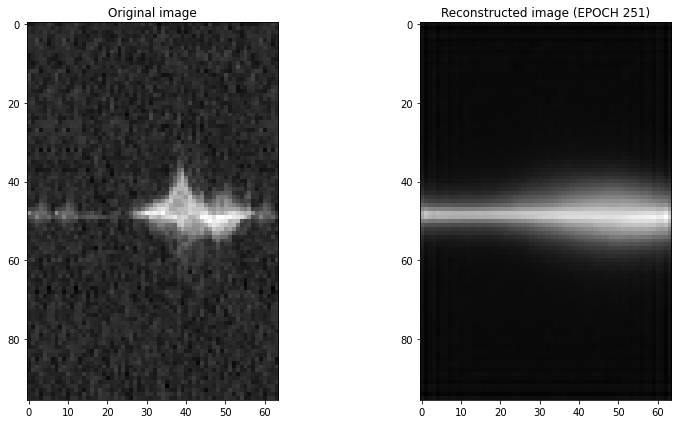

Epoch 252/500, Train Loss: 139325.5229, Validation Loss: 139218.2165
Time for epoch 252 is 9.169623851776123 sec


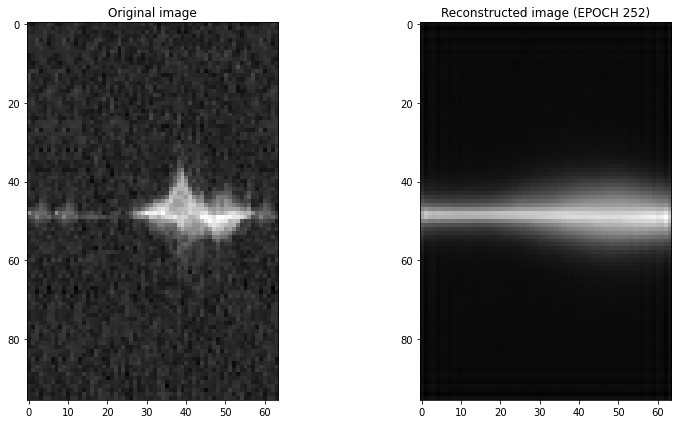

Epoch 253/500, Train Loss: 139322.8925, Validation Loss: 139219.8035
Time for epoch 253 is 9.280853986740112 sec


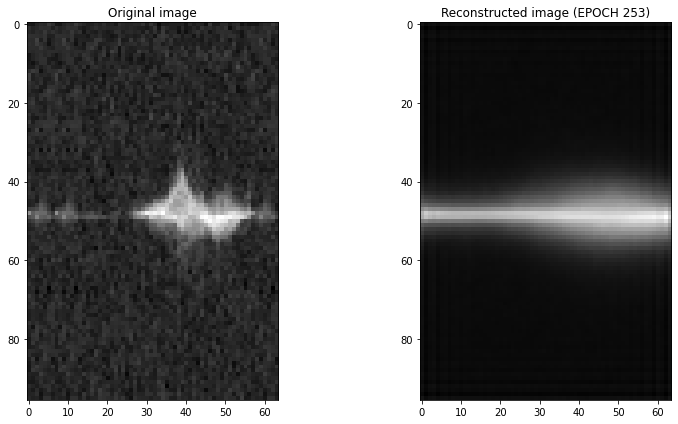

Epoch 254/500, Train Loss: 139322.3427, Validation Loss: 139218.5075
Time for epoch 254 is 8.832401752471924 sec


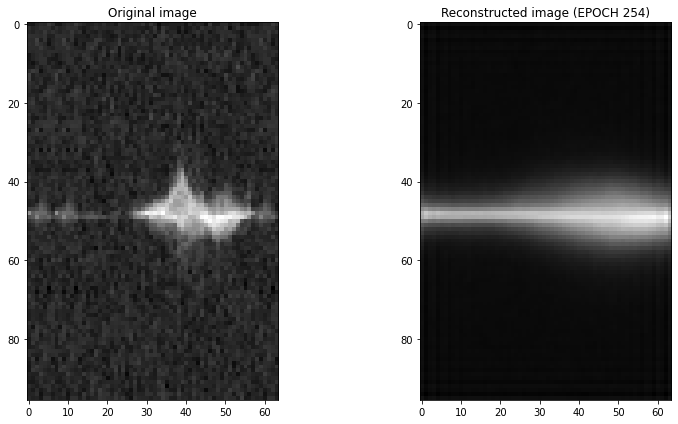

Epoch 255/500, Train Loss: 139322.4690, Validation Loss: 139219.0891
Time for epoch 255 is 8.954938888549805 sec


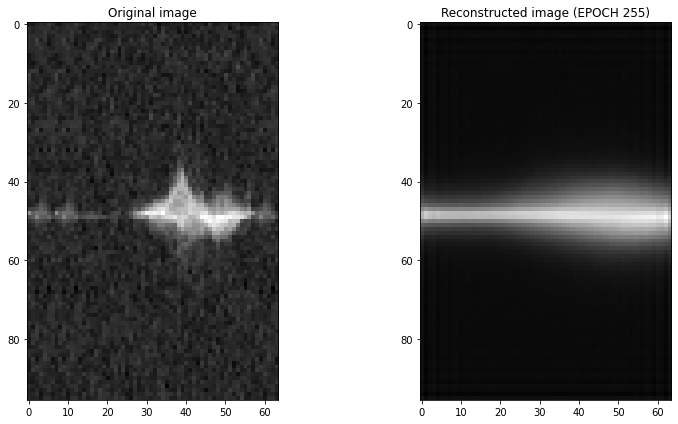

Epoch 256/500, Train Loss: 139322.3741, Validation Loss: 139220.2733
Time for epoch 256 is 8.97757863998413 sec


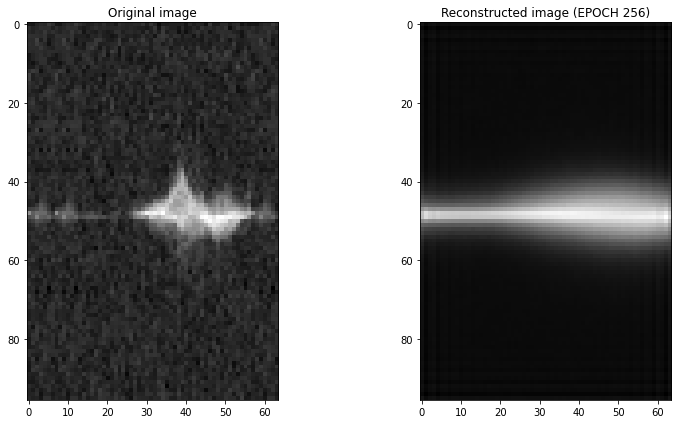

Epoch 257/500, Train Loss: 139321.8697, Validation Loss: 139215.8587
Time for epoch 257 is 9.383391857147217 sec


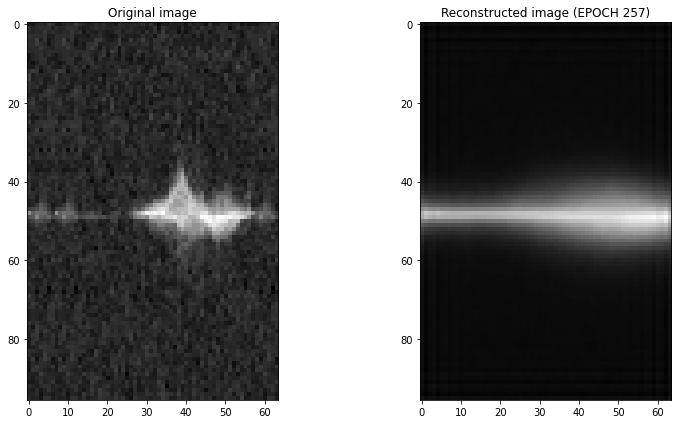

Epoch 258/500, Train Loss: 139318.1367, Validation Loss: 139215.9056
Time for epoch 258 is 8.939629793167114 sec


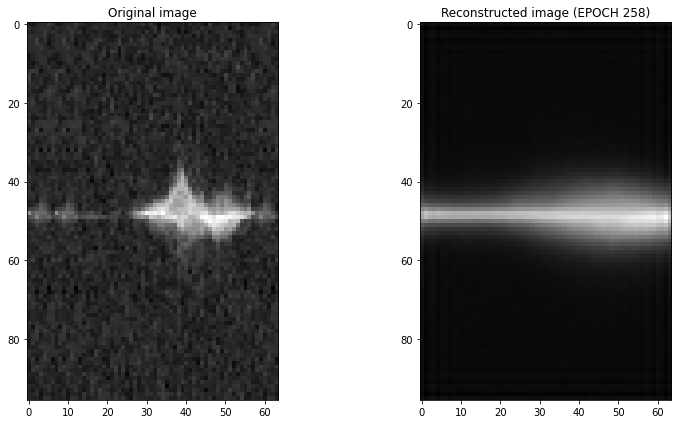

Epoch 259/500, Train Loss: 139318.8088, Validation Loss: 139216.4536
Time for epoch 259 is 8.918999671936035 sec


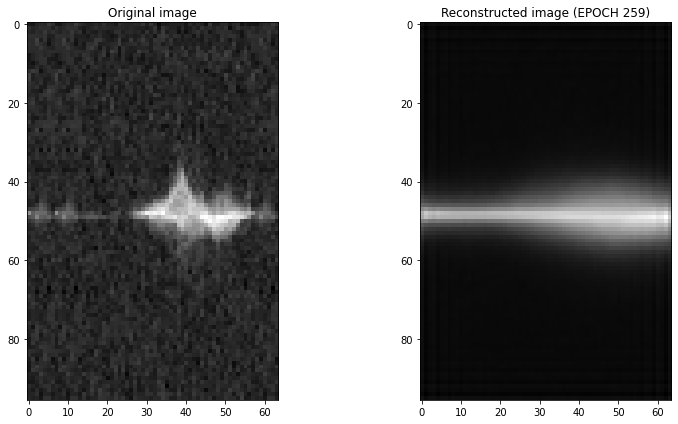

Epoch 260/500, Train Loss: 139317.2886, Validation Loss: 139216.7433
Time for epoch 260 is 9.231181383132935 sec


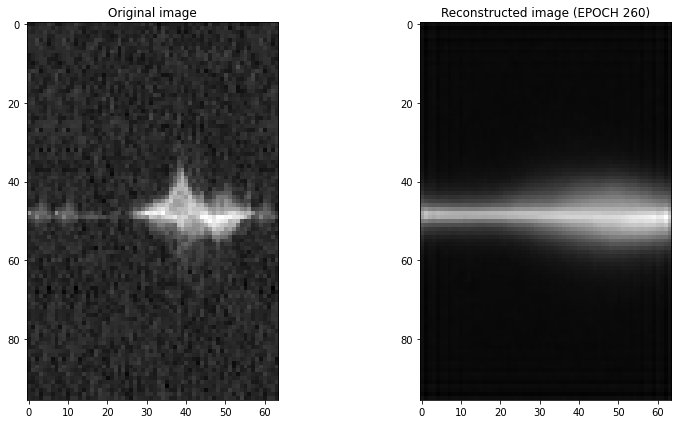

Epoch 261/500, Train Loss: 139316.8214, Validation Loss: 139217.7941
Time for epoch 261 is 9.187705039978027 sec


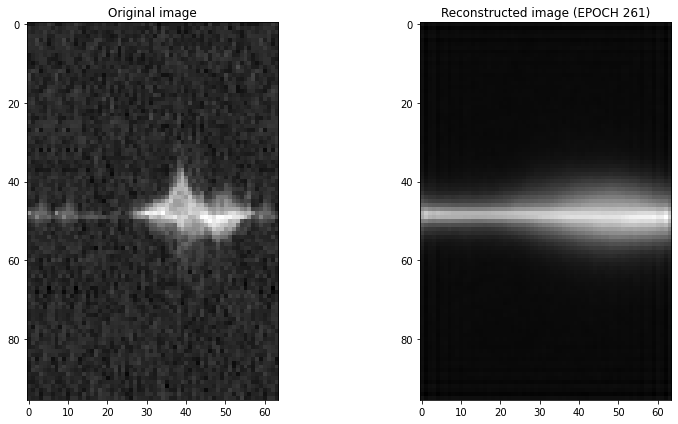

Epoch 262/500, Train Loss: 139314.9191, Validation Loss: 139214.3118
Time for epoch 262 is 8.674552917480469 sec


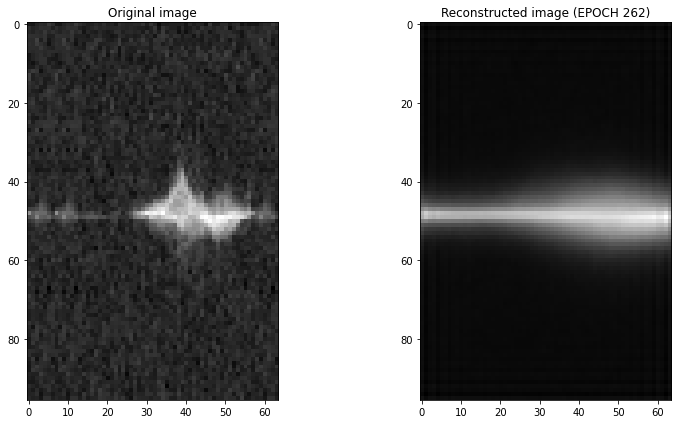

Epoch 263/500, Train Loss: 139315.8209, Validation Loss: 139216.9227
Time for epoch 263 is 9.169122457504272 sec


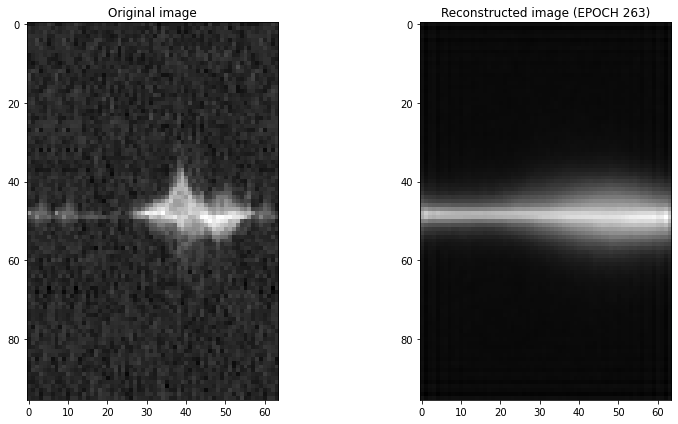

Epoch 264/500, Train Loss: 139315.4972, Validation Loss: 139217.8639
Time for epoch 264 is 9.360169410705566 sec


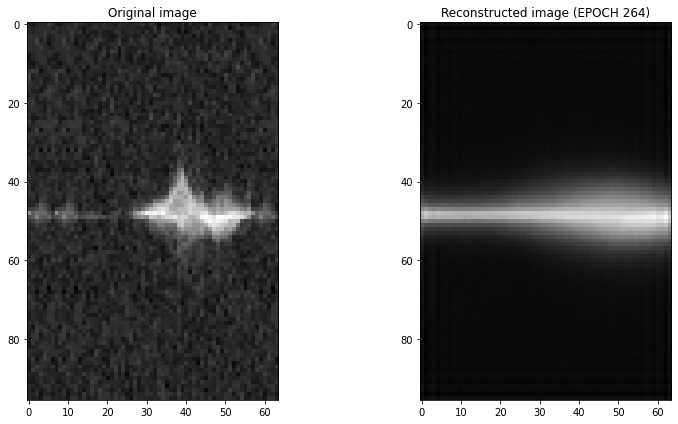

Epoch 265/500, Train Loss: 139313.5348, Validation Loss: 139217.5373
Time for epoch 265 is 9.413289070129395 sec


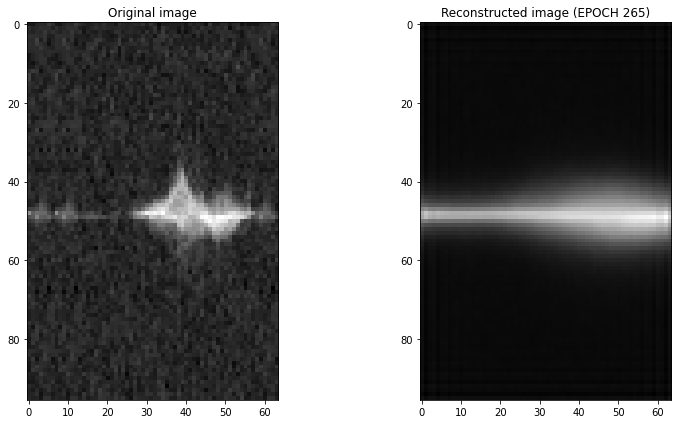

Epoch 266/500, Train Loss: 139312.1152, Validation Loss: 139217.4471
Time for epoch 266 is 8.686062097549438 sec


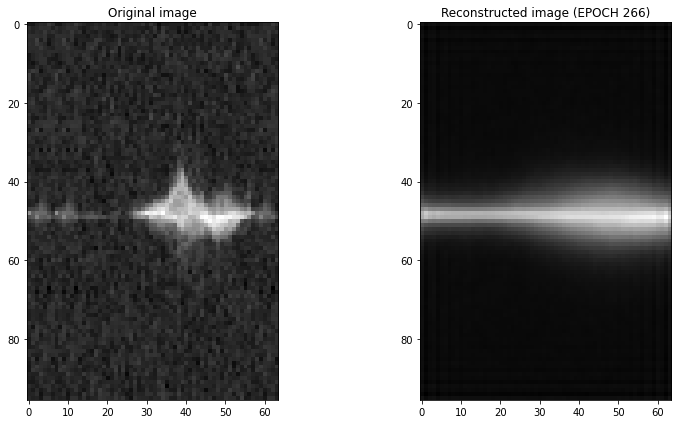

Epoch 267/500, Train Loss: 139310.3938, Validation Loss: 139213.2211
Time for epoch 267 is 9.134917259216309 sec


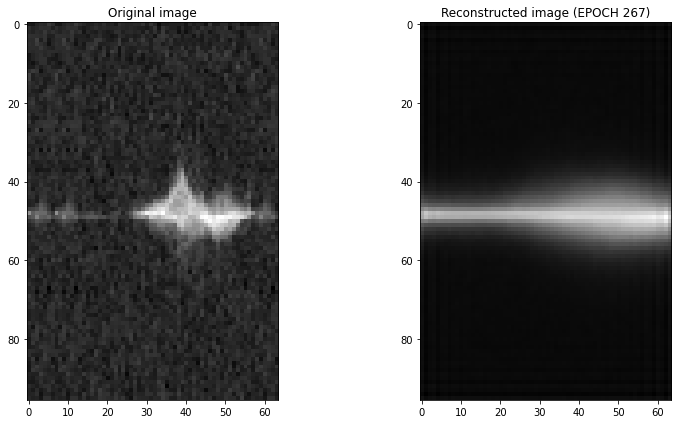

Epoch 268/500, Train Loss: 139313.8104, Validation Loss: 139216.7893
Time for epoch 268 is 9.124131679534912 sec


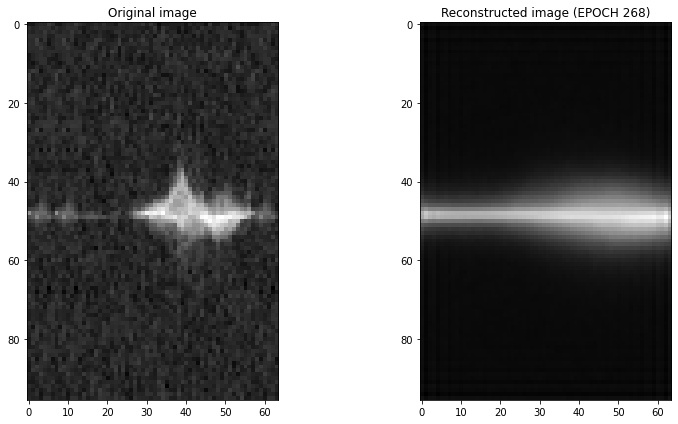

Epoch 269/500, Train Loss: 139309.7222, Validation Loss: 139213.2158
Time for epoch 269 is 9.189449310302734 sec


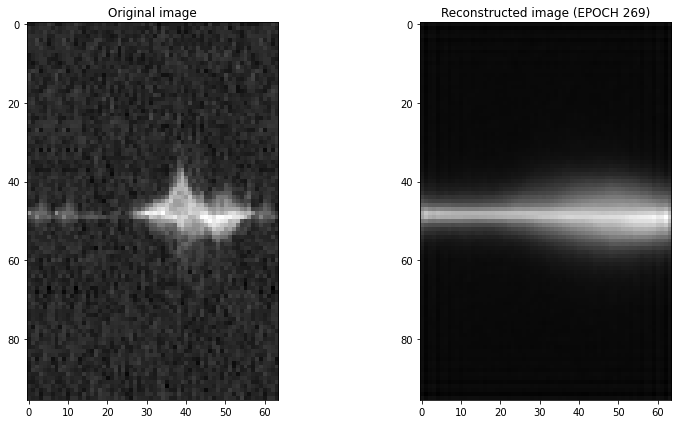

Epoch 270/500, Train Loss: 139331.7671, Validation Loss: 139232.1852
Time for epoch 270 is 8.870051860809326 sec


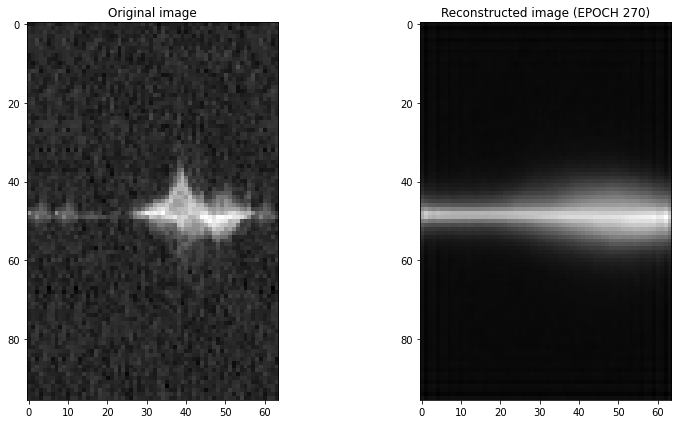

Epoch 271/500, Train Loss: 139319.7544, Validation Loss: 139225.3522
Time for epoch 271 is 9.128941059112549 sec


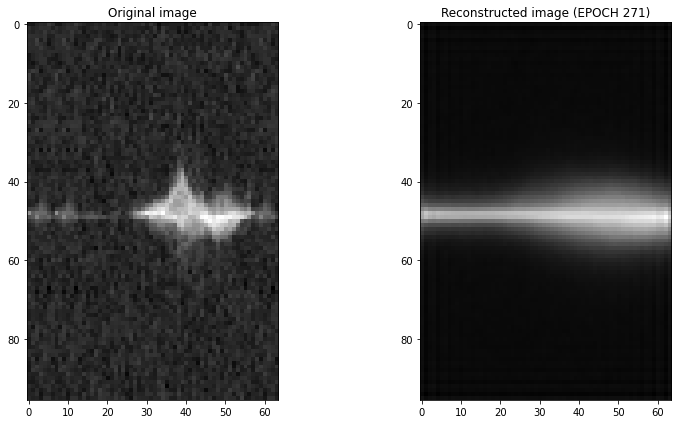

Epoch 272/500, Train Loss: 139314.1835, Validation Loss: 139223.0749
Time for epoch 272 is 8.989259719848633 sec


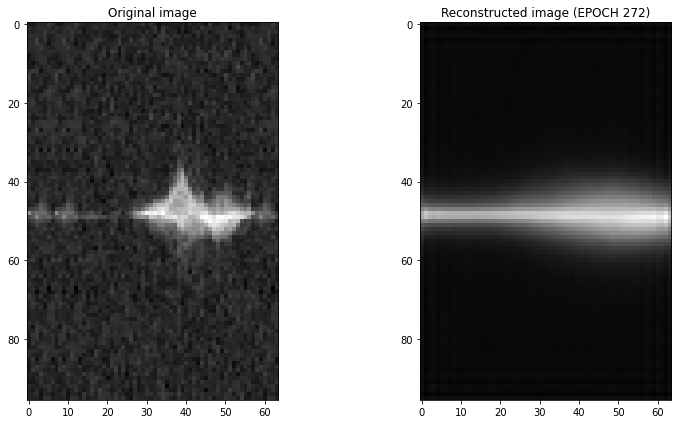

Epoch 273/500, Train Loss: 139322.2782, Validation Loss: 139225.3110
Time for epoch 273 is 9.29463791847229 sec


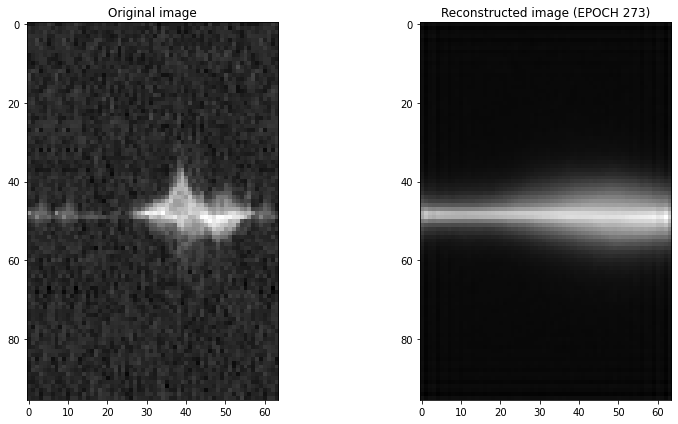

Epoch 274/500, Train Loss: 139314.7606, Validation Loss: 139223.6627
Time for epoch 274 is 8.785139799118042 sec


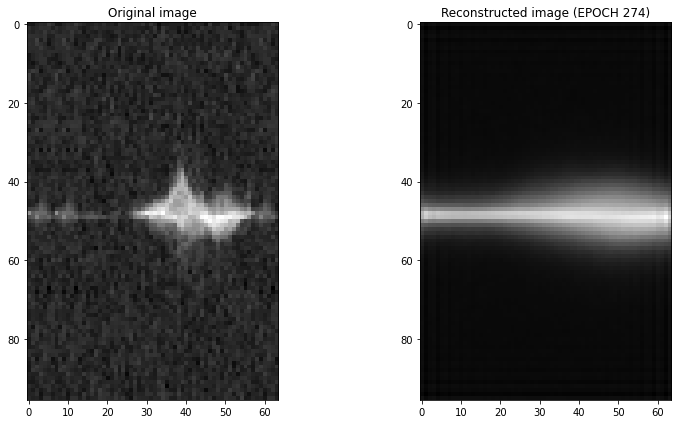

Epoch 275/500, Train Loss: 139347.4588, Validation Loss: 139246.7379
Time for epoch 275 is 9.061633110046387 sec


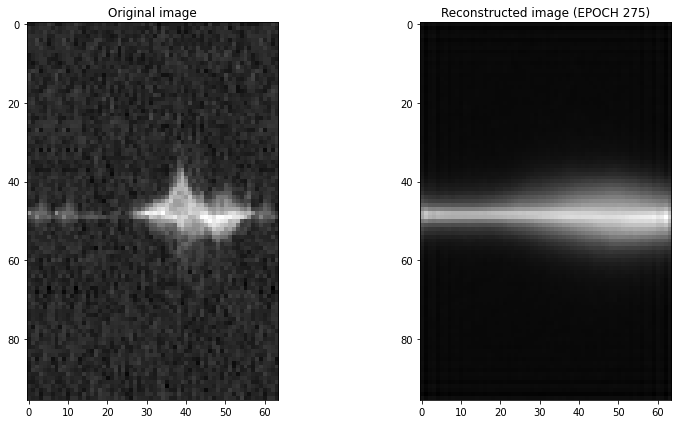

Epoch 276/500, Train Loss: 139334.1634, Validation Loss: 139240.5031
Time for epoch 276 is 9.192420959472656 sec


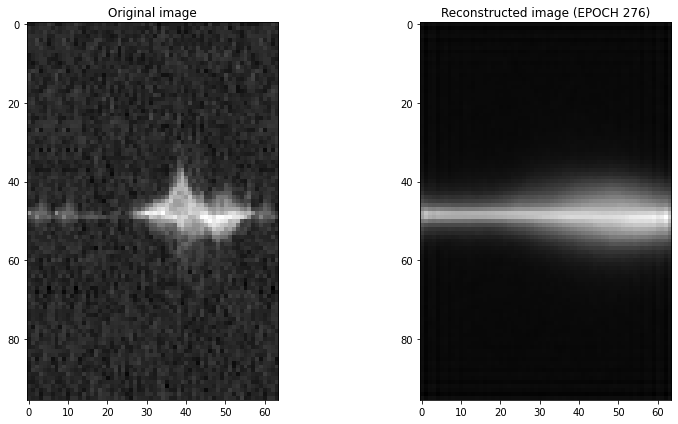

Epoch 277/500, Train Loss: 139325.5609, Validation Loss: 139233.3955
Time for epoch 277 is 9.264633655548096 sec


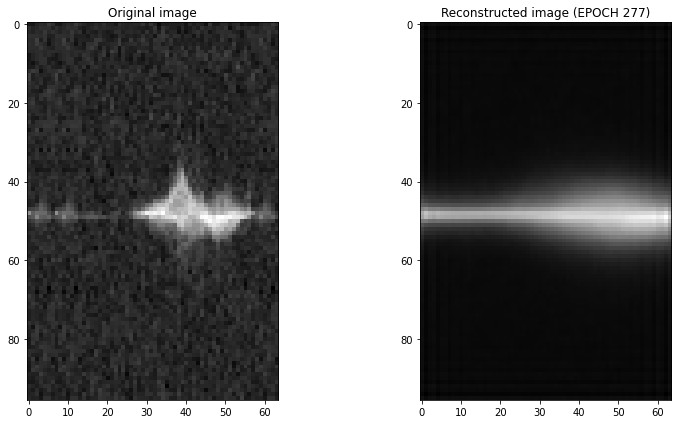

Epoch 278/500, Train Loss: 139322.0103, Validation Loss: 139229.6929
Time for epoch 278 is 9.138553857803345 sec


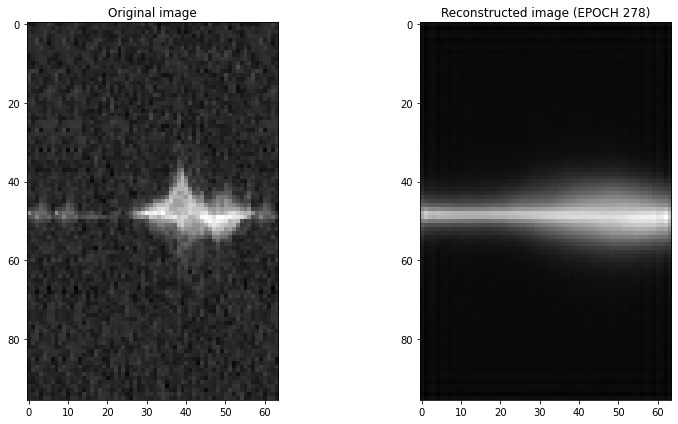

Epoch 279/500, Train Loss: 139317.6506, Validation Loss: 139225.9063
Time for epoch 279 is 9.148122549057007 sec


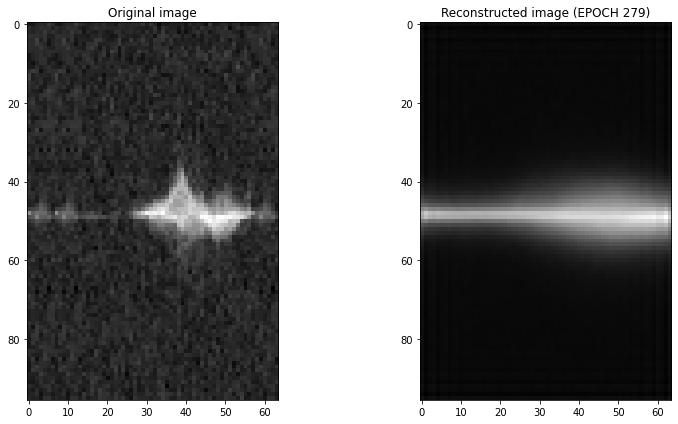

Epoch 280/500, Train Loss: 139314.0182, Validation Loss: 139227.9750
Time for epoch 280 is 9.061895608901978 sec


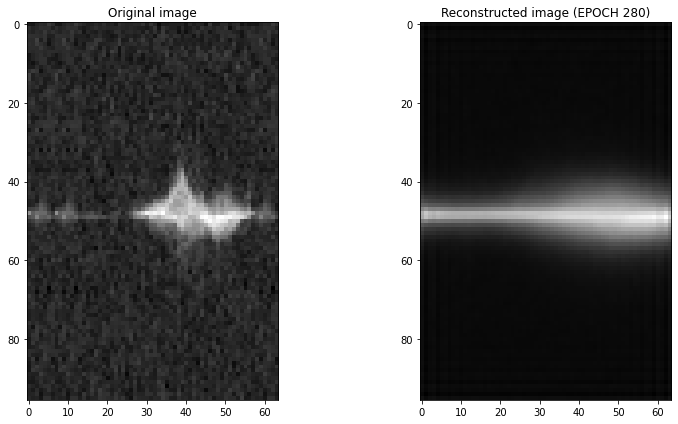

Epoch 281/500, Train Loss: 139312.3252, Validation Loss: 139221.5777
Time for epoch 281 is 9.248122692108154 sec


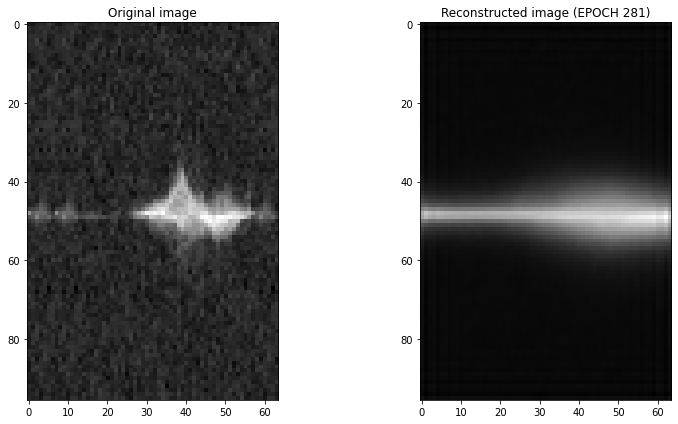

Epoch 282/500, Train Loss: 139311.1214, Validation Loss: 139221.9617
Time for epoch 282 is 8.831157207489014 sec


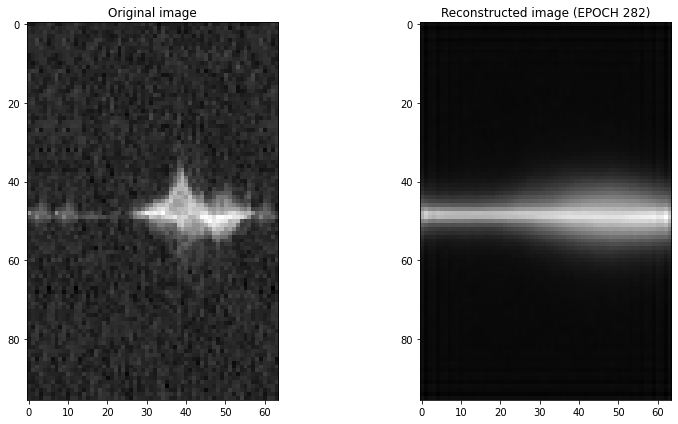

Epoch 283/500, Train Loss: 139307.2635, Validation Loss: 139216.0980
Time for epoch 283 is 9.084432363510132 sec


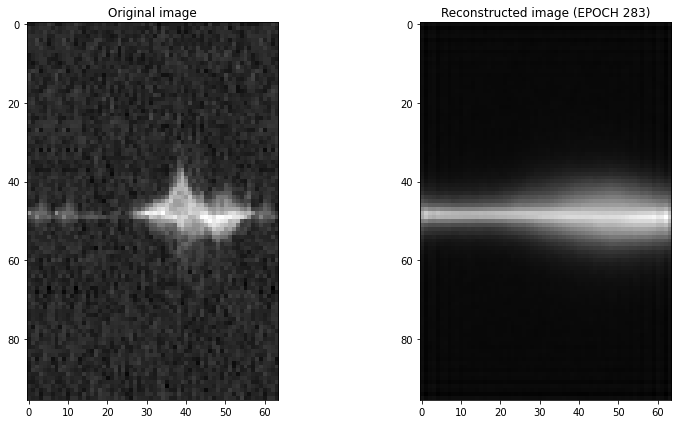

Epoch 284/500, Train Loss: 139308.4897, Validation Loss: 139218.8188
Time for epoch 284 is 9.048525333404541 sec


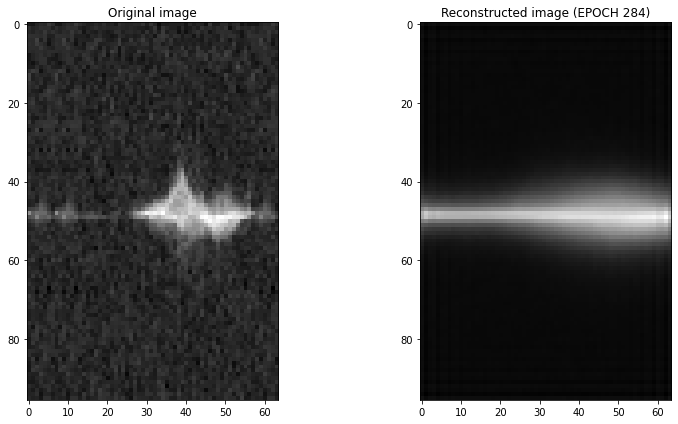

Epoch 285/500, Train Loss: 139305.8065, Validation Loss: 139219.9083
Time for epoch 285 is 9.370683908462524 sec


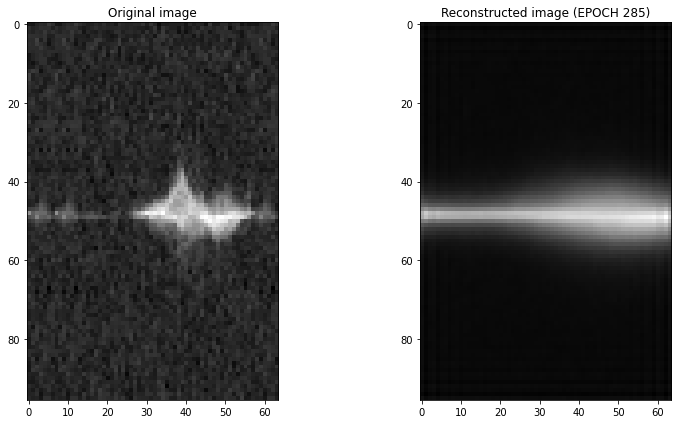

Epoch 286/500, Train Loss: 139304.3505, Validation Loss: 139215.1205
Time for epoch 286 is 8.61929988861084 sec


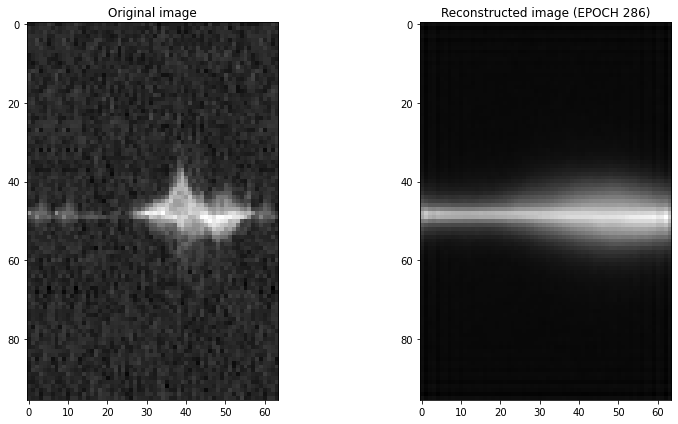

Epoch 287/500, Train Loss: 139324.5657, Validation Loss: 139228.0111
Time for epoch 287 is 9.099584341049194 sec


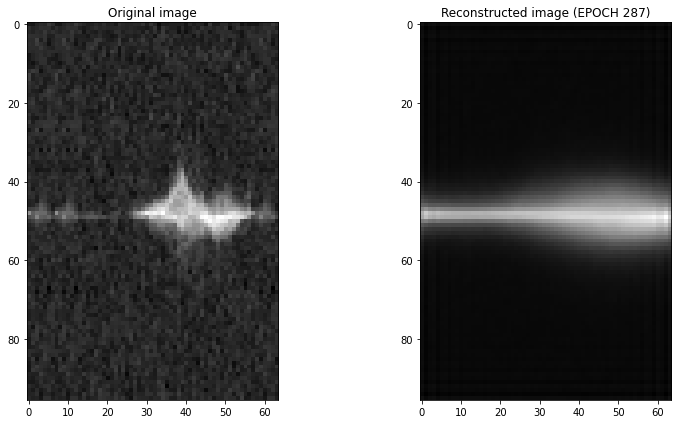

Epoch 288/500, Train Loss: 139312.2863, Validation Loss: 139225.5390
Time for epoch 288 is 9.118227243423462 sec


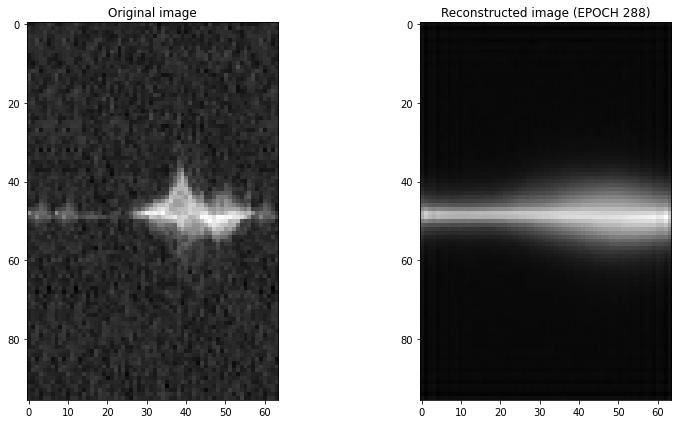

Epoch 289/500, Train Loss: 139308.2843, Validation Loss: 139223.5914
Time for epoch 289 is 9.097465991973877 sec


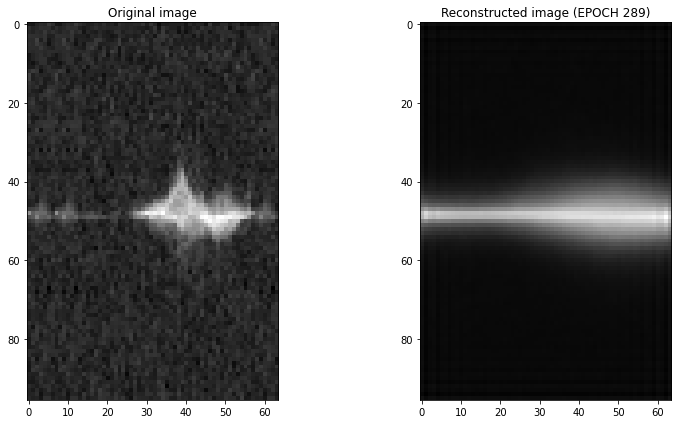

Epoch 290/500, Train Loss: 139304.3832, Validation Loss: 139222.2294
Time for epoch 290 is 8.629395961761475 sec


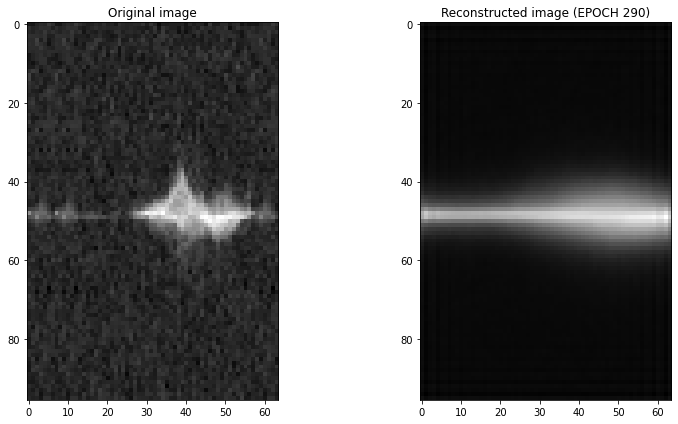

Epoch 291/500, Train Loss: 139302.9381, Validation Loss: 139218.3773
Time for epoch 291 is 9.150885105133057 sec


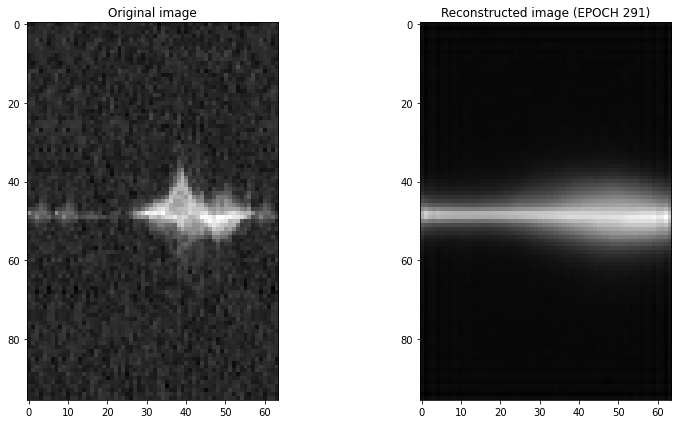

Epoch 292/500, Train Loss: 139300.7035, Validation Loss: 139214.5253
Time for epoch 292 is 9.270070791244507 sec


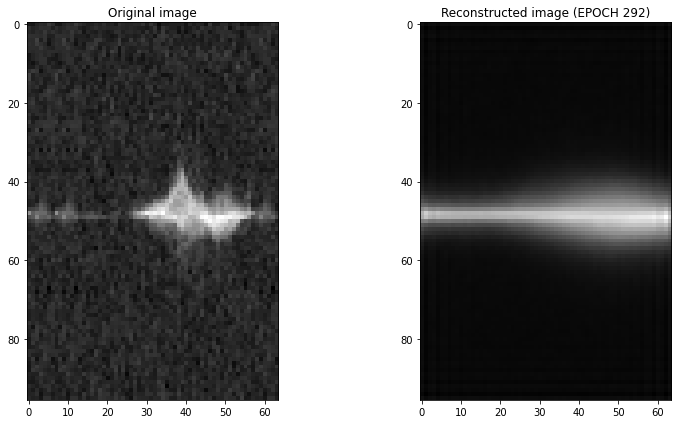

Epoch 293/500, Train Loss: 139303.6295, Validation Loss: 139216.0366
Time for epoch 293 is 9.081961870193481 sec


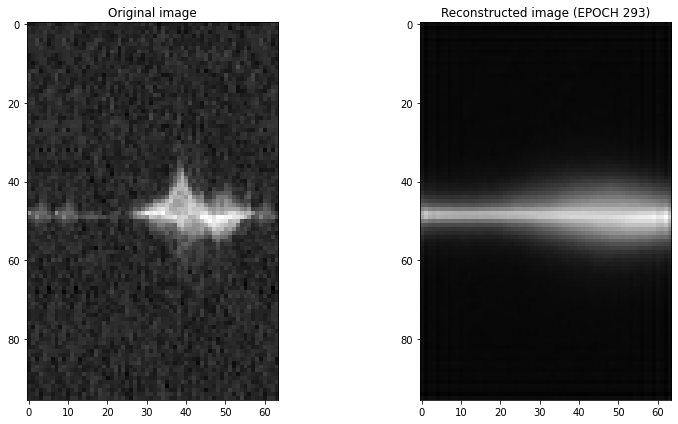

Epoch 294/500, Train Loss: 139300.4766, Validation Loss: 139215.4828
Time for epoch 294 is 8.615270853042603 sec


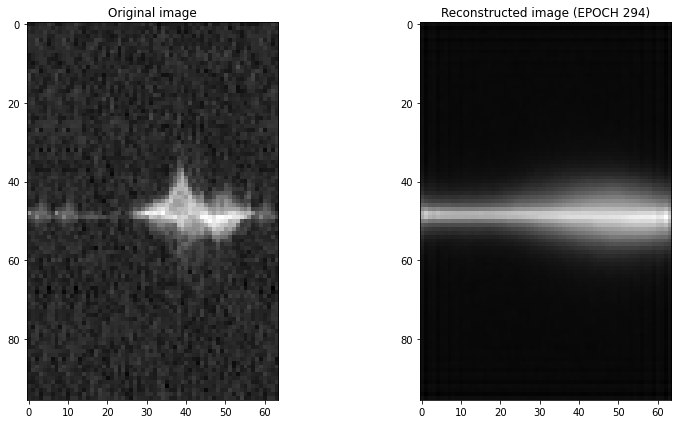

Epoch 295/500, Train Loss: 139301.2152, Validation Loss: 139213.5037
Time for epoch 295 is 9.114301443099976 sec


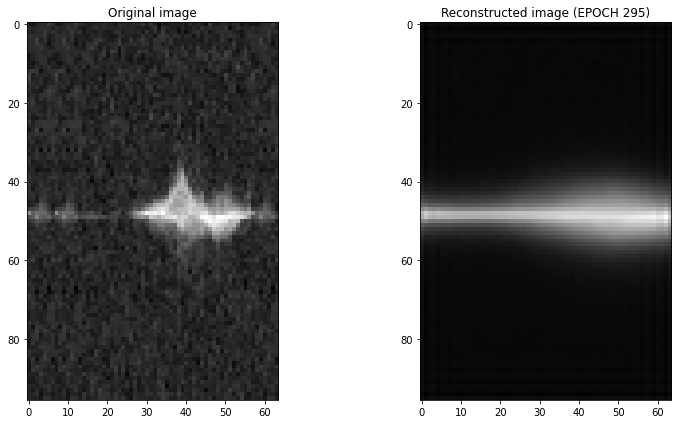

Epoch 296/500, Train Loss: 139299.5298, Validation Loss: 139215.1972
Time for epoch 296 is 9.213475704193115 sec


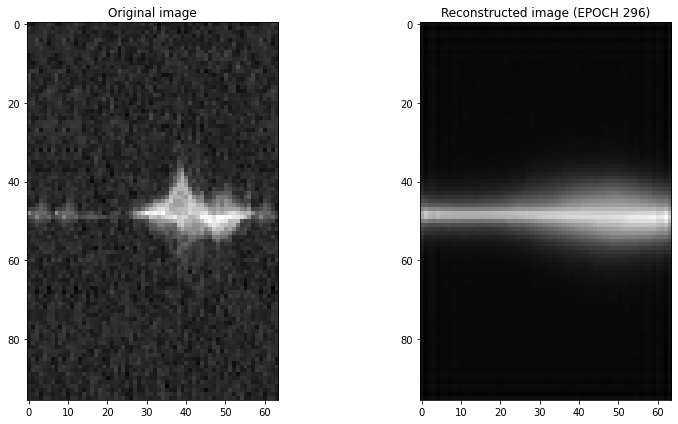

Epoch 297/500, Train Loss: 139295.7941, Validation Loss: 139211.7364
Time for epoch 297 is 8.930831909179688 sec


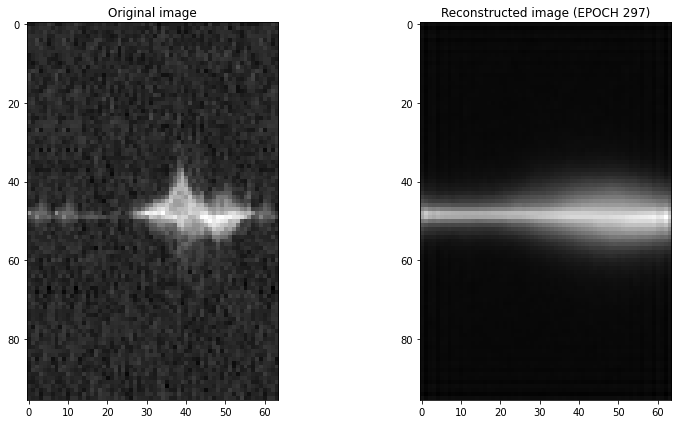

Epoch 298/500, Train Loss: 139339.1658, Validation Loss: 139248.0504
Time for epoch 298 is 9.33364748954773 sec


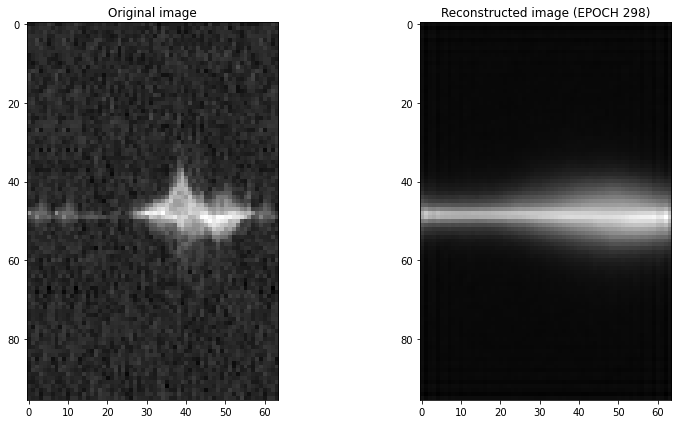

Epoch 299/500, Train Loss: 139324.6227, Validation Loss: 139242.2684
Time for epoch 299 is 9.154237985610962 sec


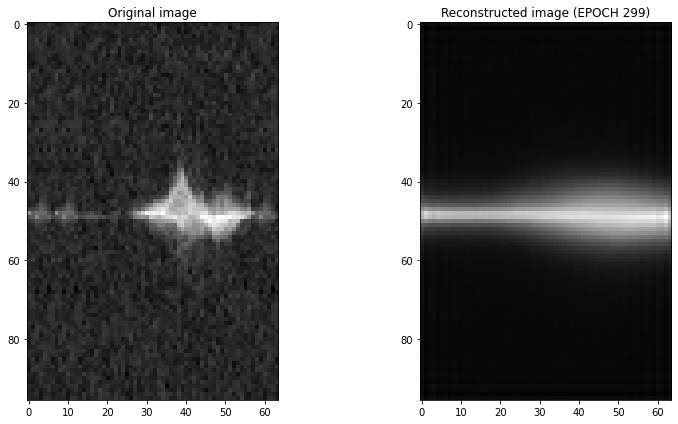

Epoch 300/500, Train Loss: 139314.3190, Validation Loss: 139234.5824
Time for epoch 300 is 9.091688394546509 sec


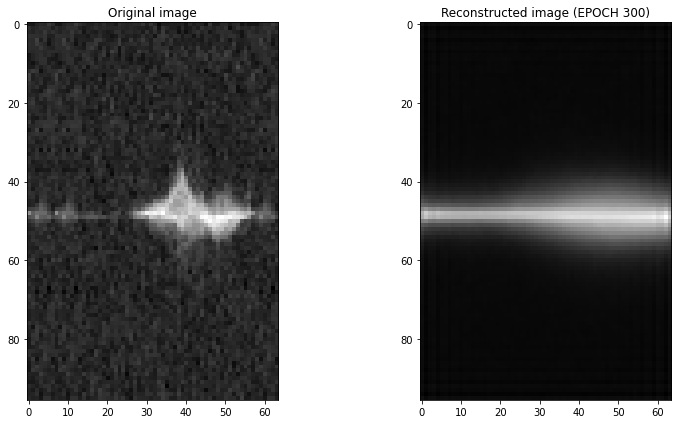

<Figure size 432x288 with 0 Axes>

Epoch 301/500, Train Loss: 139309.4144, Validation Loss: 139227.9558
Time for epoch 301 is 9.207017183303833 sec


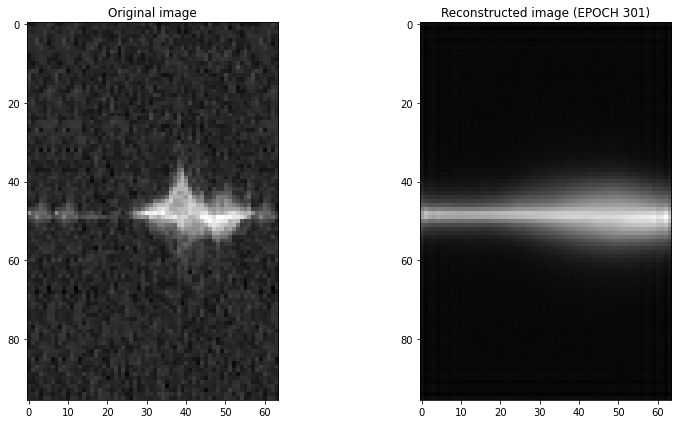

Epoch 302/500, Train Loss: 139308.2791, Validation Loss: 139223.1588
Time for epoch 302 is 8.663074493408203 sec


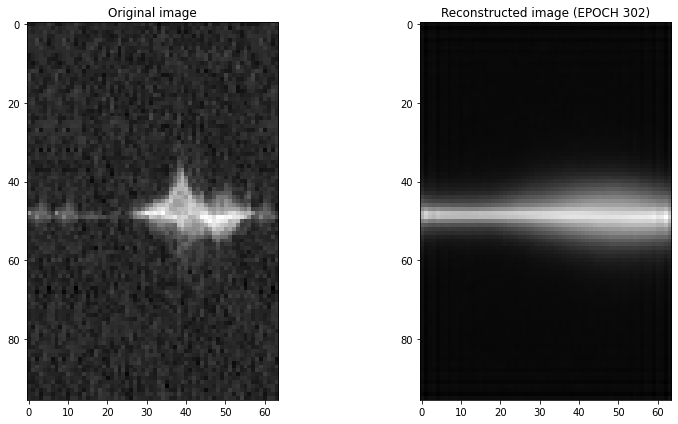

Epoch 303/500, Train Loss: 139303.4148, Validation Loss: 139220.2921
Time for epoch 303 is 9.046228647232056 sec


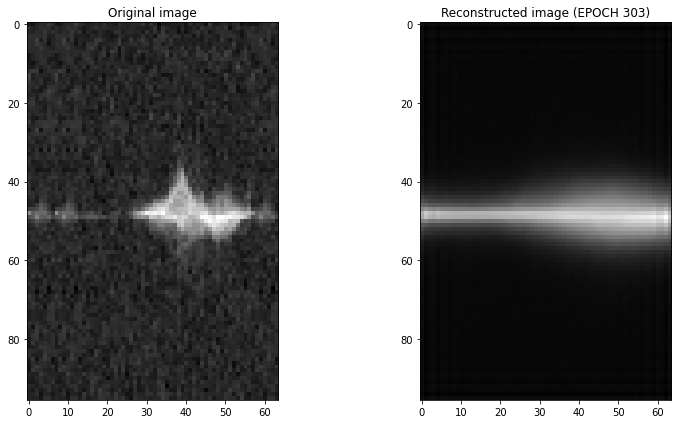

Epoch 304/500, Train Loss: 139299.7405, Validation Loss: 139220.3255
Time for epoch 304 is 9.102969884872437 sec


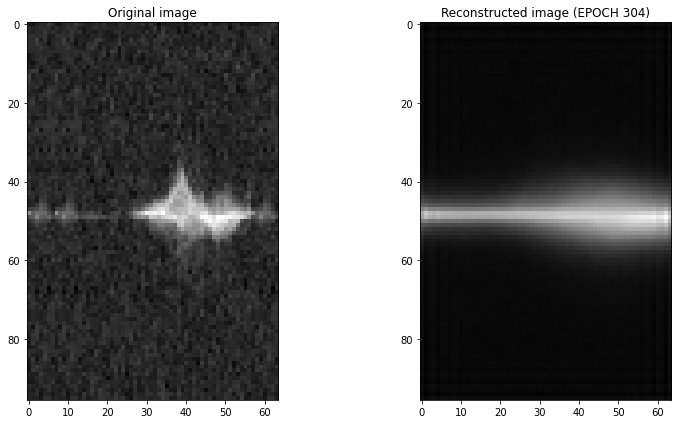

Epoch 305/500, Train Loss: 139300.4294, Validation Loss: 139216.6863
Time for epoch 305 is 9.058122396469116 sec


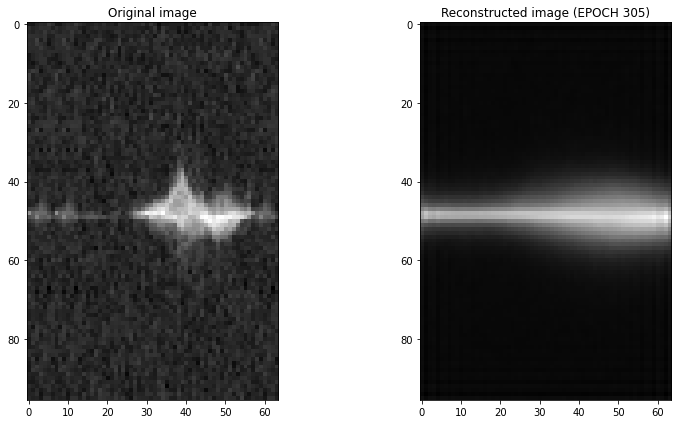

Epoch 306/500, Train Loss: 139296.2310, Validation Loss: 139216.7765
Time for epoch 306 is 8.552965641021729 sec


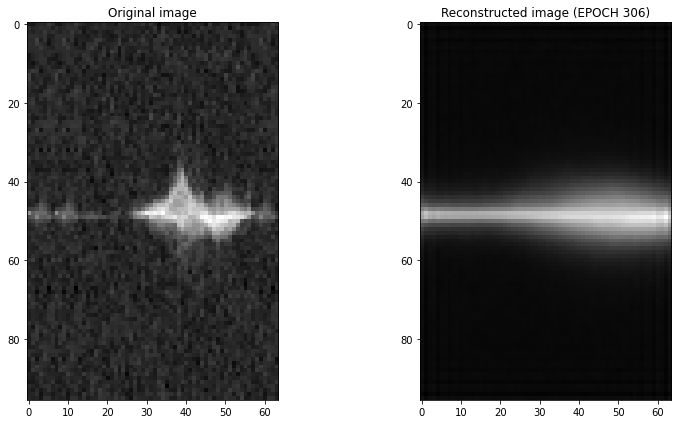

Epoch 307/500, Train Loss: 139295.3765, Validation Loss: 139214.6183
Time for epoch 307 is 9.194289207458496 sec


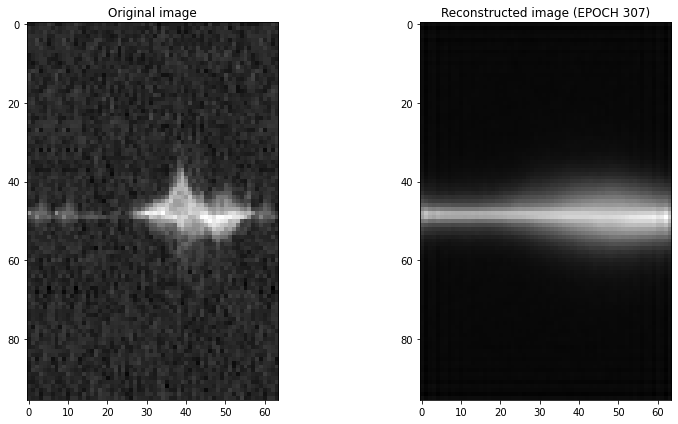

Epoch 308/500, Train Loss: 139315.4463, Validation Loss: 139230.7912
Time for epoch 308 is 9.14613151550293 sec


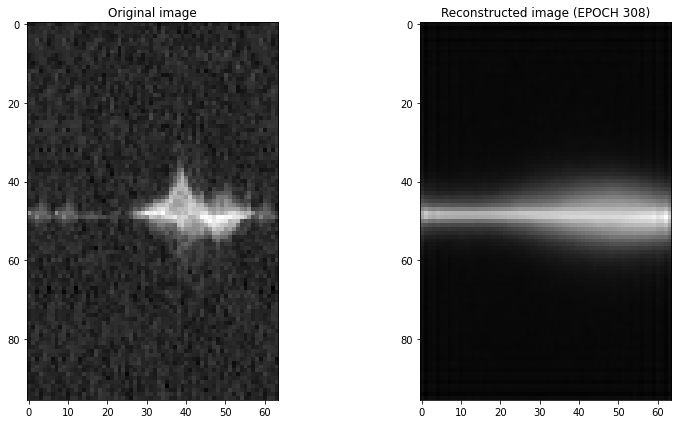

Epoch 309/500, Train Loss: 139304.9762, Validation Loss: 139223.2092
Time for epoch 309 is 8.981250762939453 sec


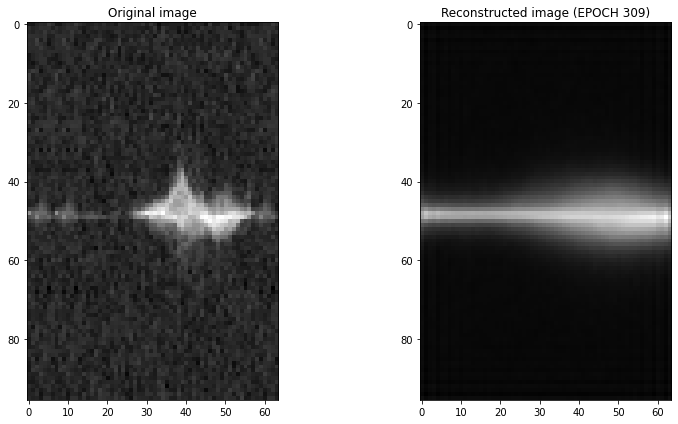

Epoch 310/500, Train Loss: 139300.6706, Validation Loss: 139224.3994
Time for epoch 310 is 8.79089093208313 sec


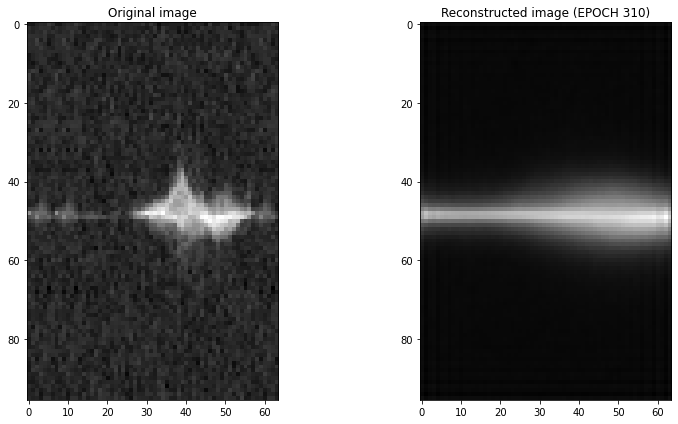

Epoch 311/500, Train Loss: 139297.7261, Validation Loss: 139217.3285
Time for epoch 311 is 9.080917596817017 sec


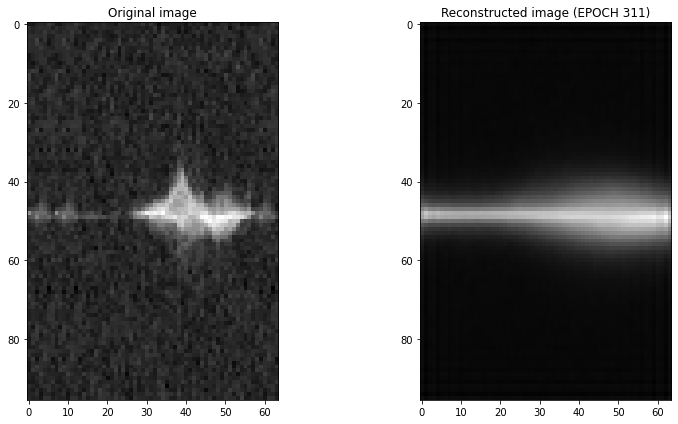

Epoch 312/500, Train Loss: 139297.3281, Validation Loss: 139215.3344
Time for epoch 312 is 9.189331531524658 sec


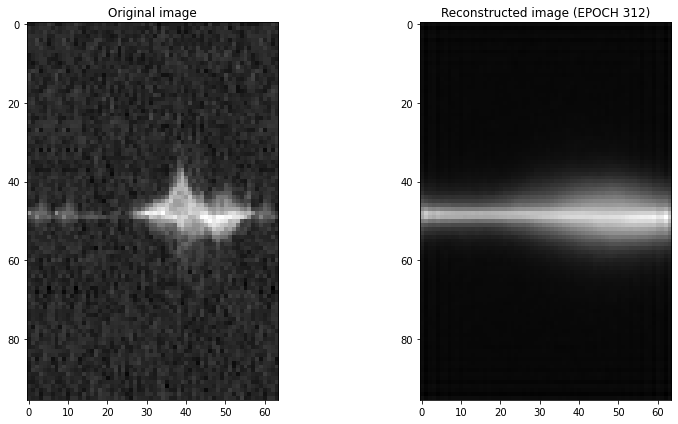

Epoch 313/500, Train Loss: 139320.5405, Validation Loss: 139235.1973
Time for epoch 313 is 9.055290460586548 sec


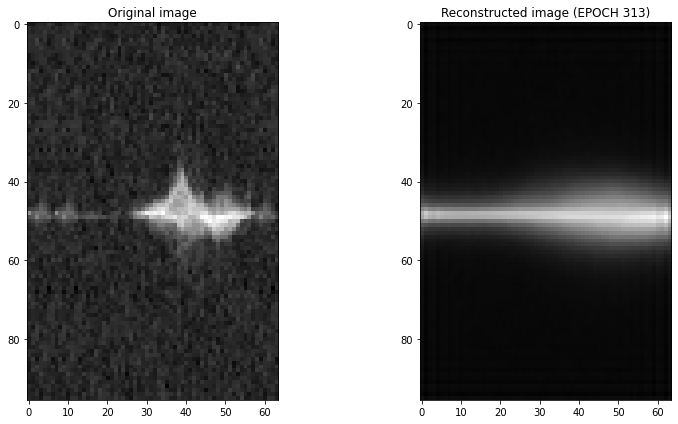

Epoch 314/500, Train Loss: 139309.0504, Validation Loss: 139226.1195
Time for epoch 314 is 8.724238395690918 sec


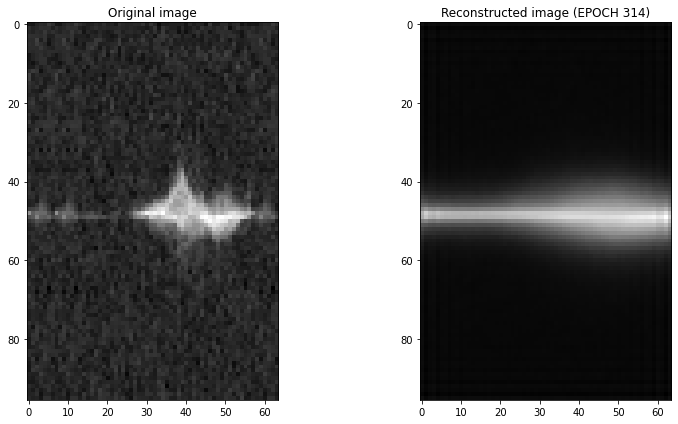

Epoch 315/500, Train Loss: 139304.6805, Validation Loss: 139222.3633
Time for epoch 315 is 9.090940475463867 sec


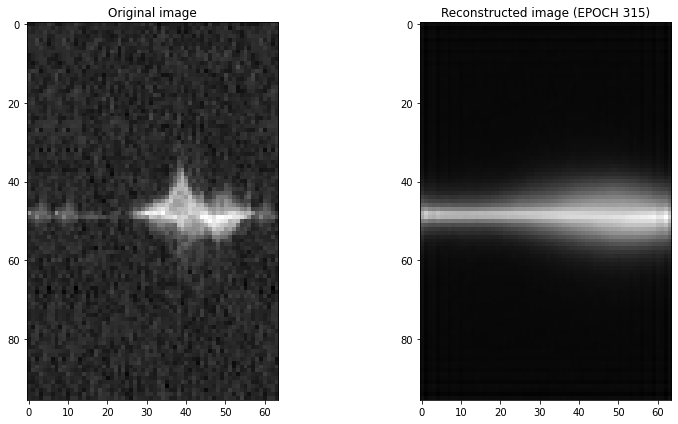

Epoch 316/500, Train Loss: 139301.7863, Validation Loss: 139221.5945
Time for epoch 316 is 9.253329277038574 sec


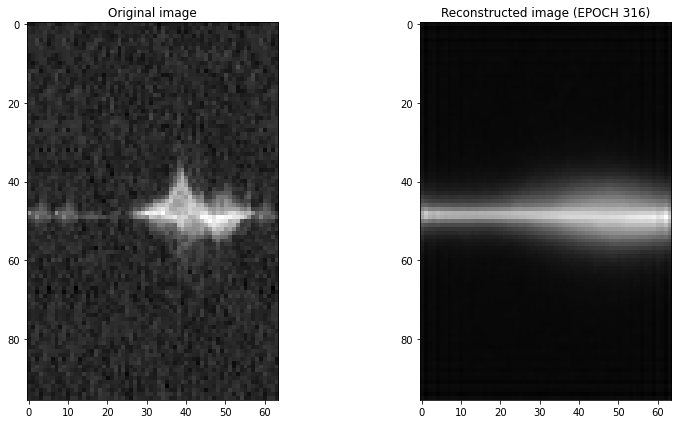

Epoch 317/500, Train Loss: 139294.3521, Validation Loss: 139218.3105
Time for epoch 317 is 8.788830757141113 sec


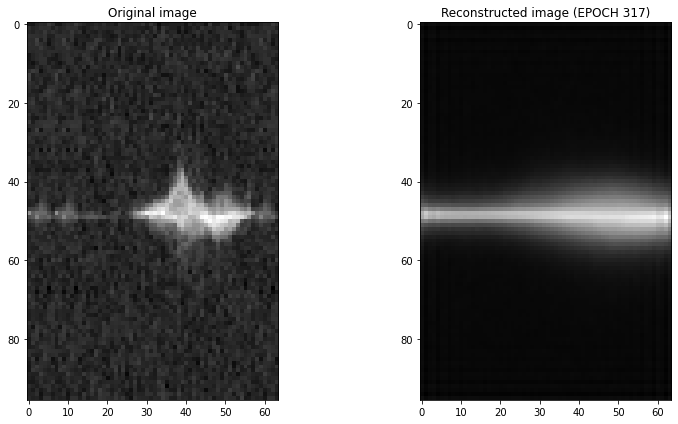

Epoch 318/500, Train Loss: 139294.9524, Validation Loss: 139216.1379
Time for epoch 318 is 9.505211591720581 sec


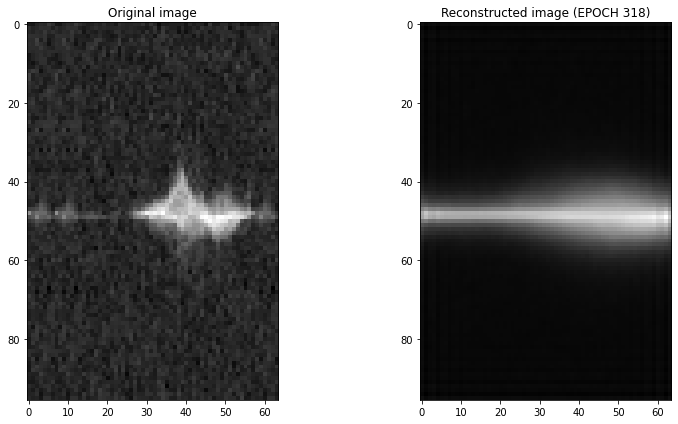

Epoch 319/500, Train Loss: 139294.1431, Validation Loss: 139216.0080
Time for epoch 319 is 9.196732759475708 sec


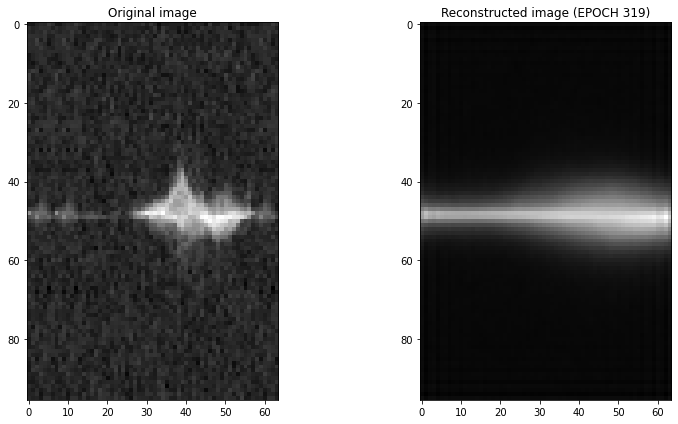

Epoch 320/500, Train Loss: 139291.1706, Validation Loss: 139214.2242
Time for epoch 320 is 9.158505916595459 sec


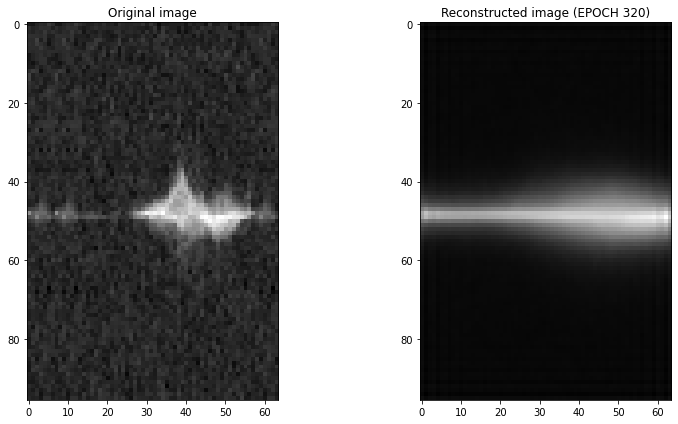

Epoch 321/500, Train Loss: 139289.1939, Validation Loss: 139214.3943
Time for epoch 321 is 8.901313781738281 sec


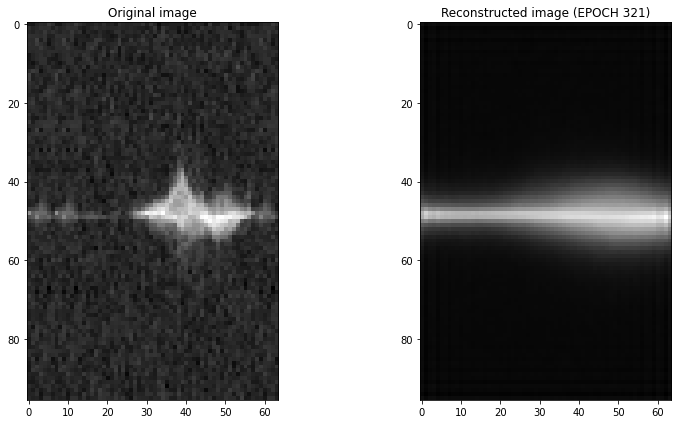

Epoch 322/500, Train Loss: 139291.2003, Validation Loss: 139214.8410
Time for epoch 322 is 8.907606840133667 sec


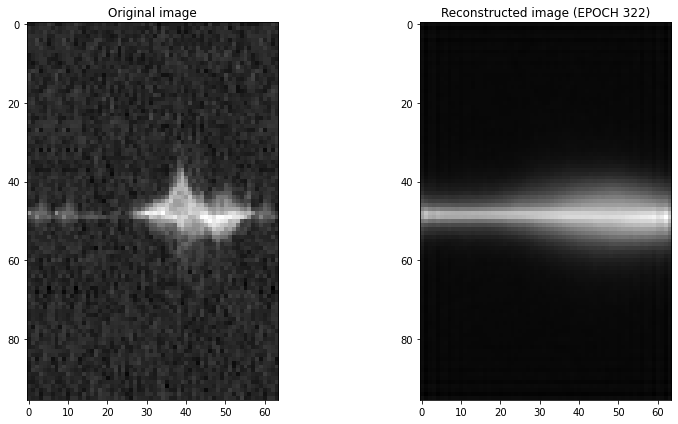

Epoch 323/500, Train Loss: 139287.4443, Validation Loss: 139212.7405
Time for epoch 323 is 9.068359613418579 sec


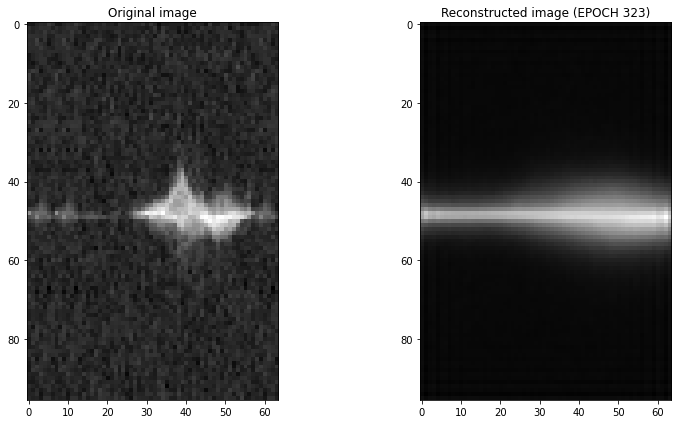

Epoch 324/500, Train Loss: 139289.3889, Validation Loss: 139211.2277
Time for epoch 324 is 9.211781978607178 sec


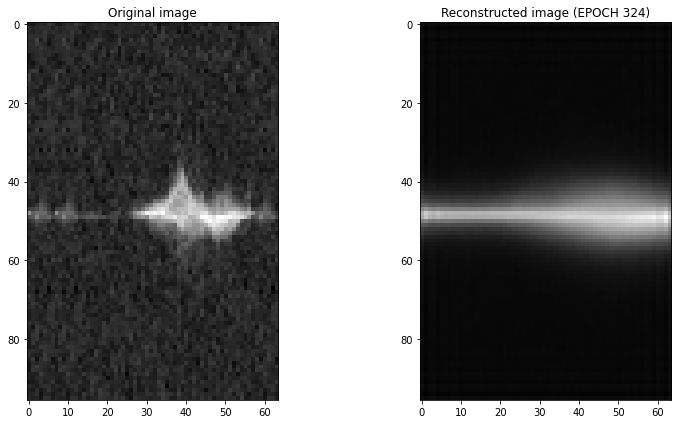

Epoch 325/500, Train Loss: 139286.9188, Validation Loss: 139211.6069
Time for epoch 325 is 8.744969129562378 sec


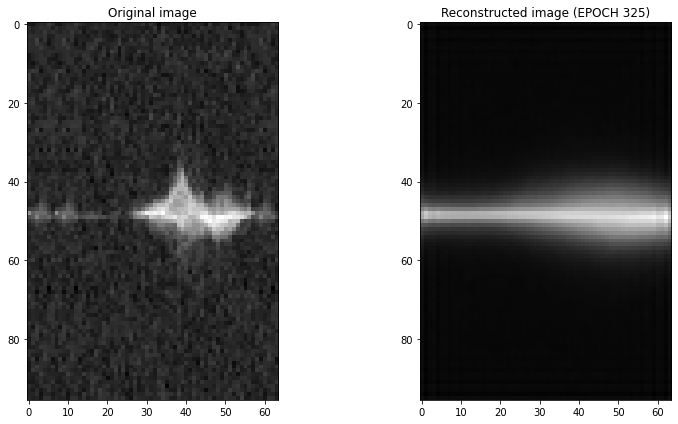

Epoch 326/500, Train Loss: 139286.3384, Validation Loss: 139212.1393
Time for epoch 326 is 8.924721717834473 sec


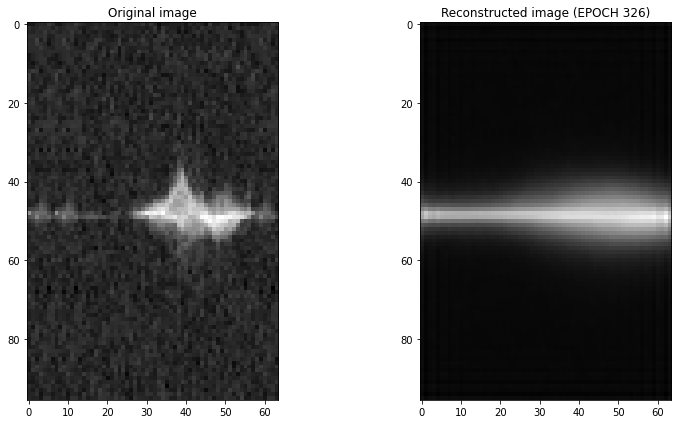

Epoch 327/500, Train Loss: 139287.2028, Validation Loss: 139211.6790
Time for epoch 327 is 9.182408571243286 sec


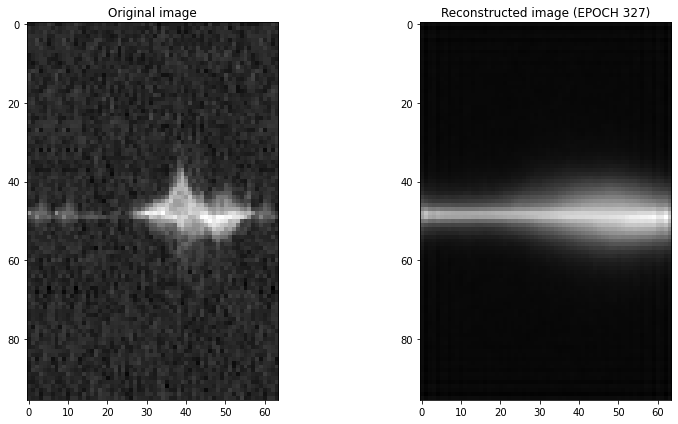

Epoch 328/500, Train Loss: 139283.5349, Validation Loss: 139207.4790
Time for epoch 328 is 9.225105047225952 sec


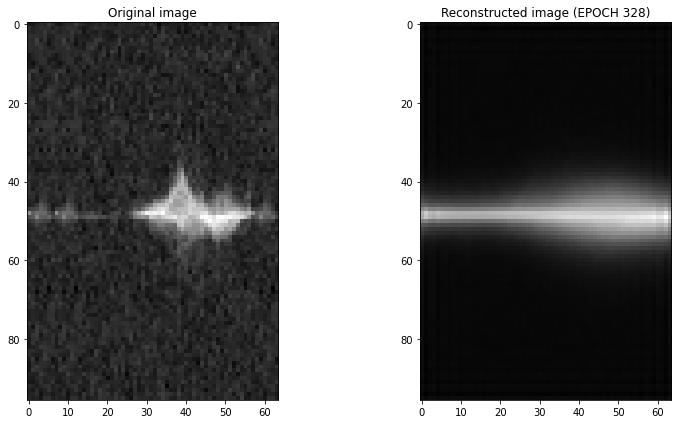

Epoch 329/500, Train Loss: 139284.3219, Validation Loss: 139210.7959
Time for epoch 329 is 8.74634575843811 sec


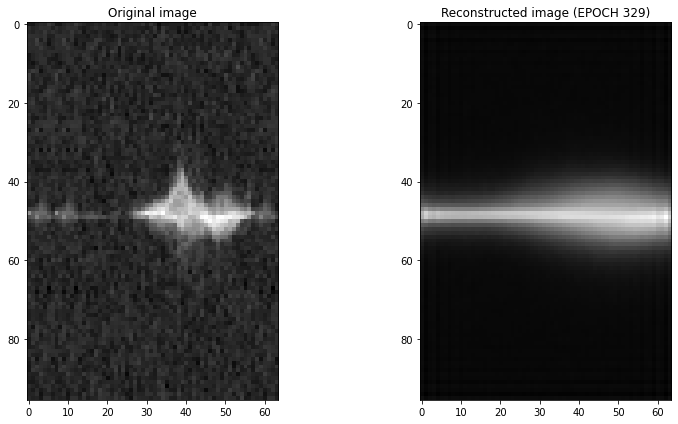

Epoch 330/500, Train Loss: 139284.3867, Validation Loss: 139207.7460
Time for epoch 330 is 8.930519819259644 sec


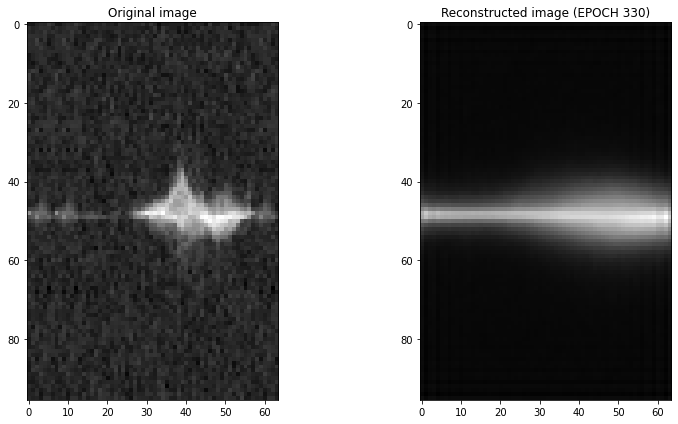

Epoch 331/500, Train Loss: 139283.4862, Validation Loss: 139209.6047
Time for epoch 331 is 8.993569374084473 sec


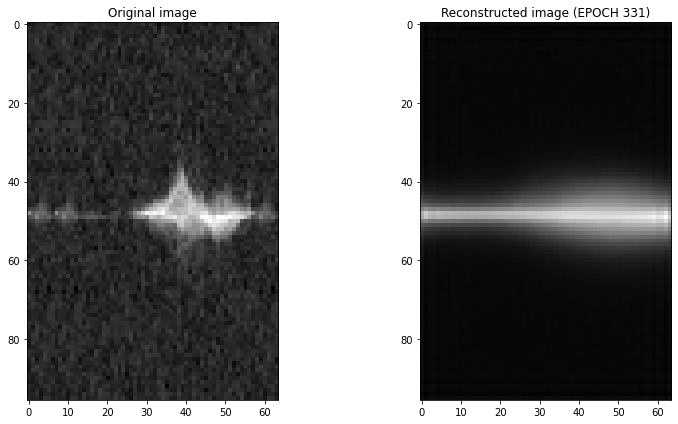

Epoch 332/500, Train Loss: 139286.2526, Validation Loss: 139211.5949
Time for epoch 332 is 9.275167465209961 sec


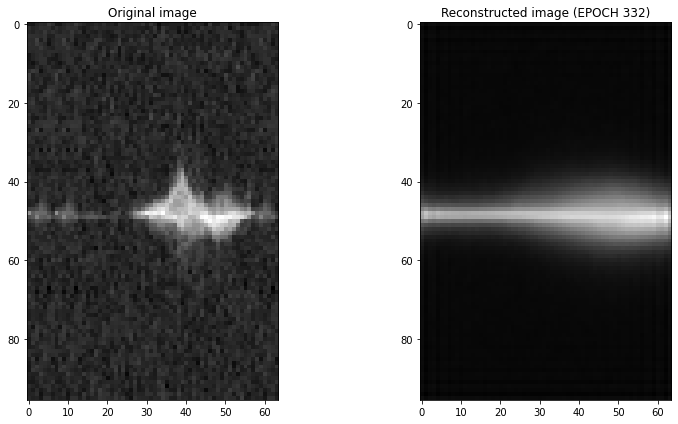

Epoch 333/500, Train Loss: 139283.6067, Validation Loss: 139211.8481
Time for epoch 333 is 8.588089942932129 sec


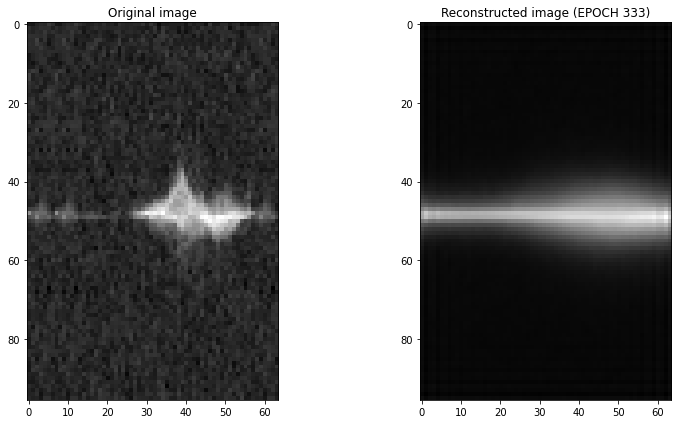

Epoch 334/500, Train Loss: 139279.9268, Validation Loss: 139210.3988
Time for epoch 334 is 8.976286888122559 sec


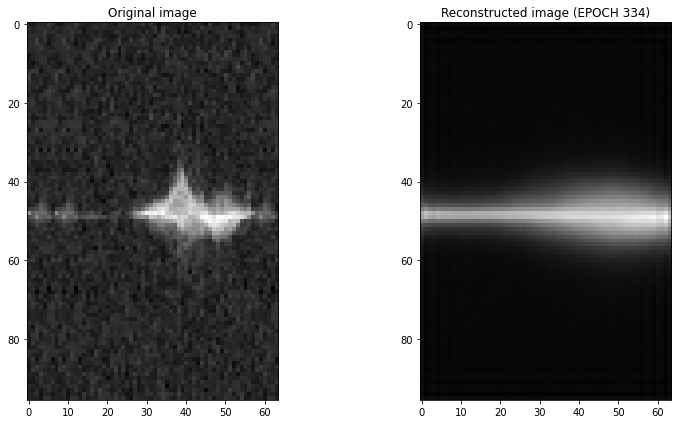

Epoch 335/500, Train Loss: 139280.8542, Validation Loss: 139208.7654
Time for epoch 335 is 9.174267292022705 sec


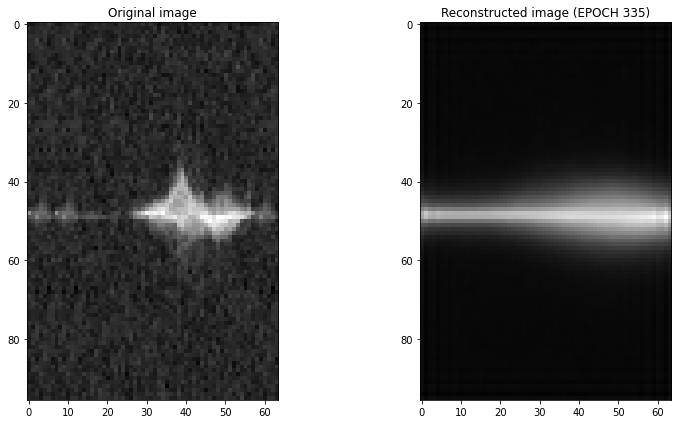

Epoch 336/500, Train Loss: 139282.4807, Validation Loss: 139207.1756
Time for epoch 336 is 9.152773380279541 sec


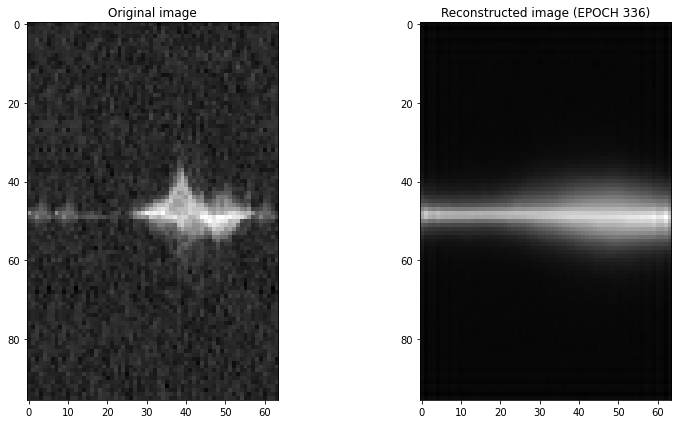

Epoch 337/500, Train Loss: 139280.1047, Validation Loss: 139207.6381
Time for epoch 337 is 8.71220588684082 sec


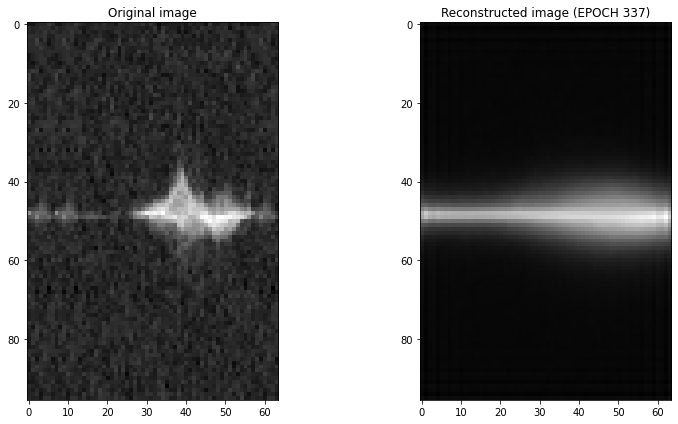

Epoch 338/500, Train Loss: 139279.7099, Validation Loss: 139208.2693
Time for epoch 338 is 9.673166513442993 sec


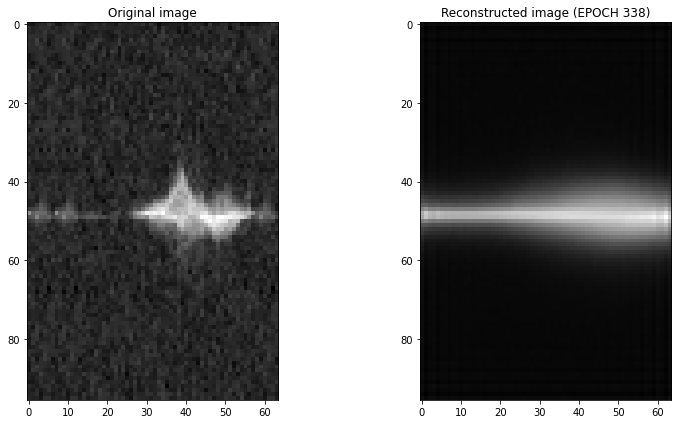

Epoch 339/500, Train Loss: 139281.5904, Validation Loss: 139206.1546
Time for epoch 339 is 9.027928829193115 sec


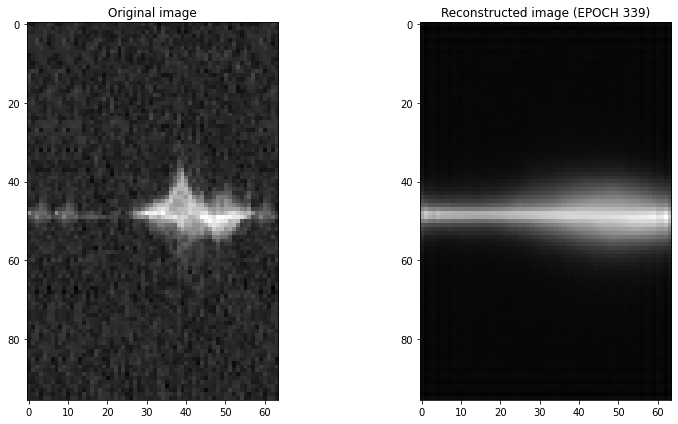

Epoch 340/500, Train Loss: 139279.8278, Validation Loss: 139208.8446
Time for epoch 340 is 9.257856369018555 sec


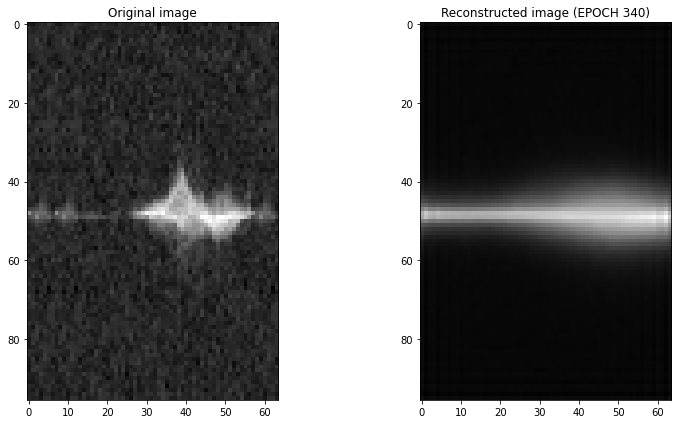

Epoch 341/500, Train Loss: 139282.4408, Validation Loss: 139207.6533
Time for epoch 341 is 8.732828378677368 sec


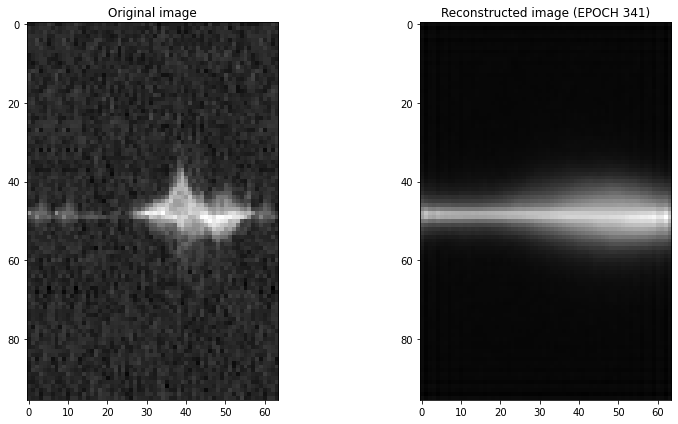

Epoch 342/500, Train Loss: 139291.9918, Validation Loss: 139216.0092
Time for epoch 342 is 8.950792074203491 sec


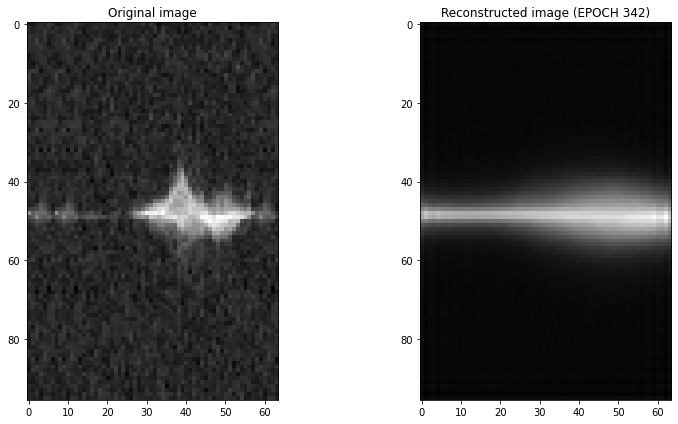

Epoch 343/500, Train Loss: 139286.0301, Validation Loss: 139214.1258
Time for epoch 343 is 9.163380146026611 sec


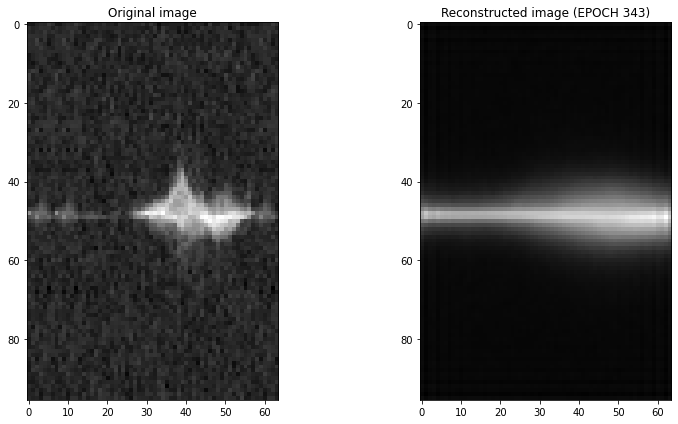

Epoch 344/500, Train Loss: 139281.1457, Validation Loss: 139214.4211
Time for epoch 344 is 9.220521926879883 sec


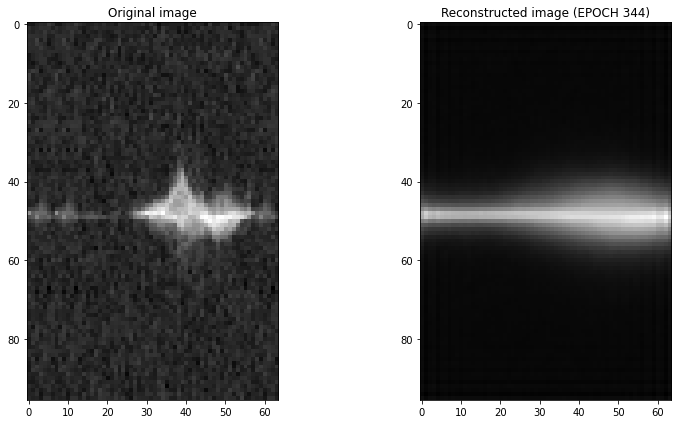

Epoch 345/500, Train Loss: 139280.0428, Validation Loss: 139209.7329
Time for epoch 345 is 8.521734237670898 sec


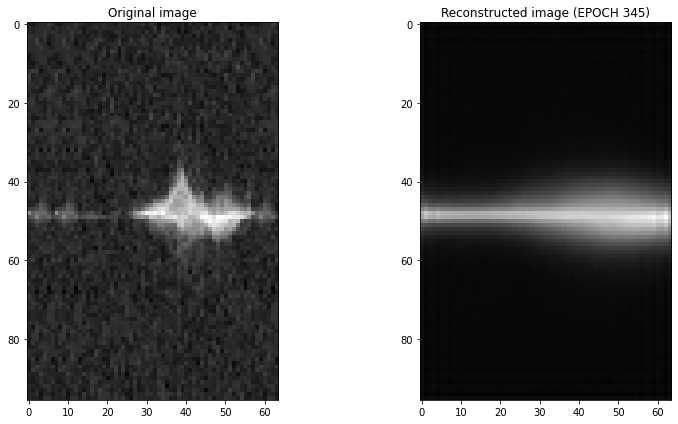

Epoch 346/500, Train Loss: 139279.2536, Validation Loss: 139210.4361
Time for epoch 346 is 9.103852272033691 sec


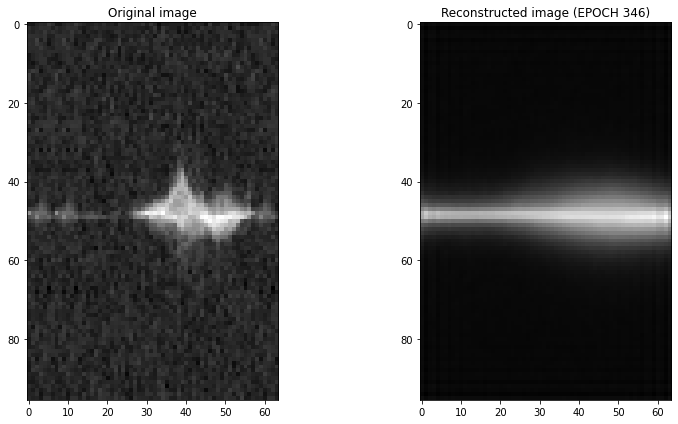

Epoch 347/500, Train Loss: 139278.2997, Validation Loss: 139208.1018
Time for epoch 347 is 9.190216302871704 sec


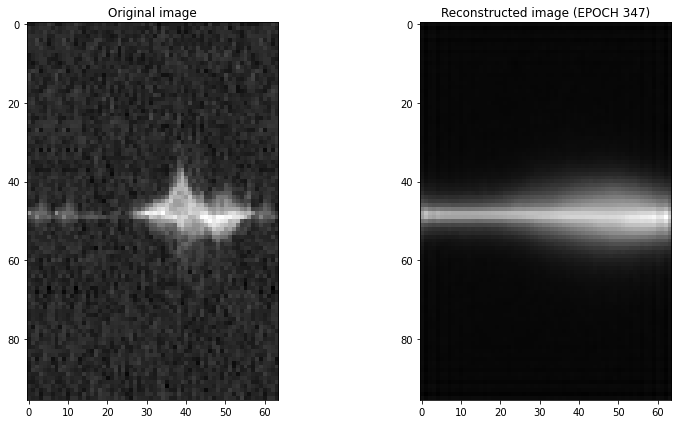

Epoch 348/500, Train Loss: 139282.0687, Validation Loss: 139208.3543
Time for epoch 348 is 9.010831594467163 sec


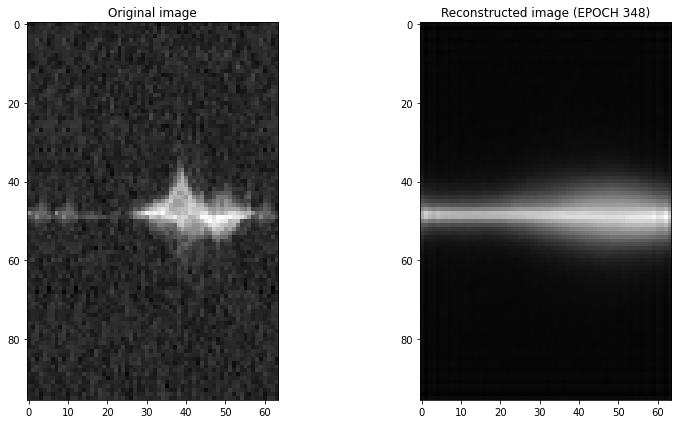

Epoch 349/500, Train Loss: 139278.9743, Validation Loss: 139210.1630
Time for epoch 349 is 8.696980953216553 sec


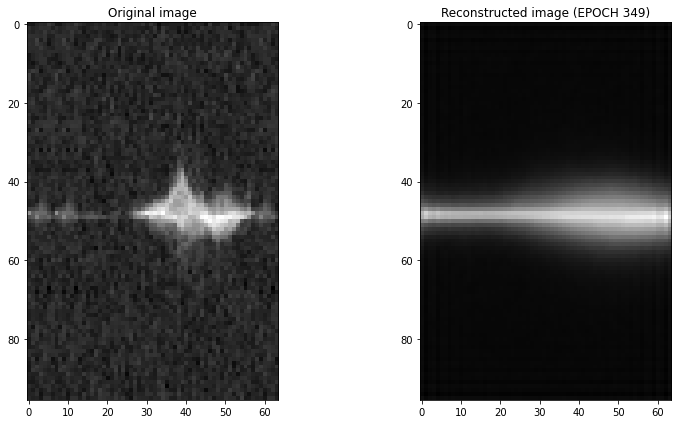

Epoch 350/500, Train Loss: 139277.0887, Validation Loss: 139206.1673
Time for epoch 350 is 9.087266445159912 sec


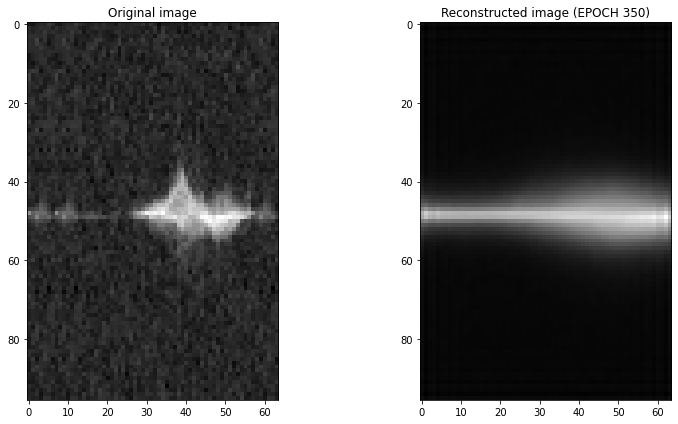

Epoch 351/500, Train Loss: 139276.4920, Validation Loss: 139207.7001
Time for epoch 351 is 9.216922283172607 sec


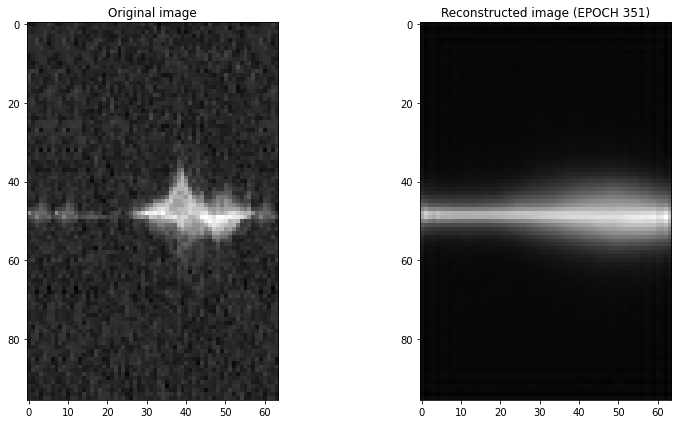

Epoch 352/500, Train Loss: 139277.3149, Validation Loss: 139206.8888
Time for epoch 352 is 9.049609422683716 sec


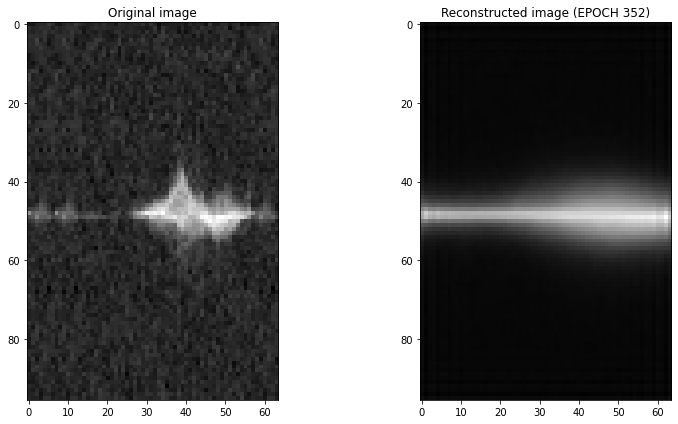

Epoch 353/500, Train Loss: 139276.5624, Validation Loss: 139208.0906
Time for epoch 353 is 8.768017530441284 sec


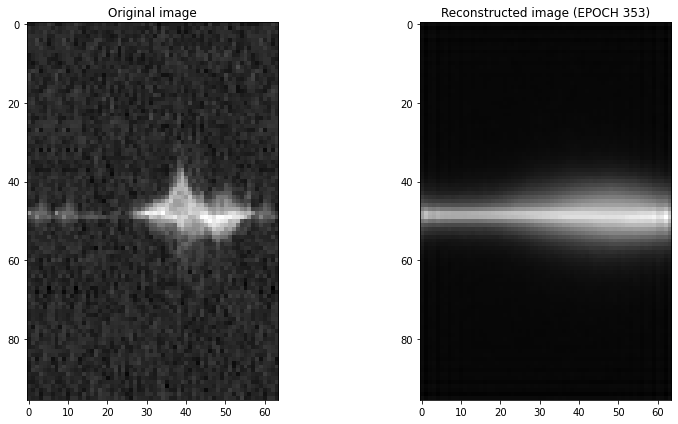

Epoch 354/500, Train Loss: 139275.1065, Validation Loss: 139206.2894
Time for epoch 354 is 9.103889465332031 sec


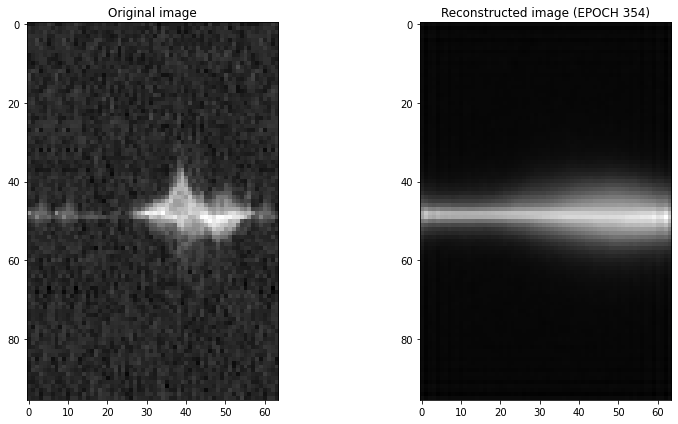

Epoch 355/500, Train Loss: 139277.5721, Validation Loss: 139210.2363
Time for epoch 355 is 9.18755292892456 sec


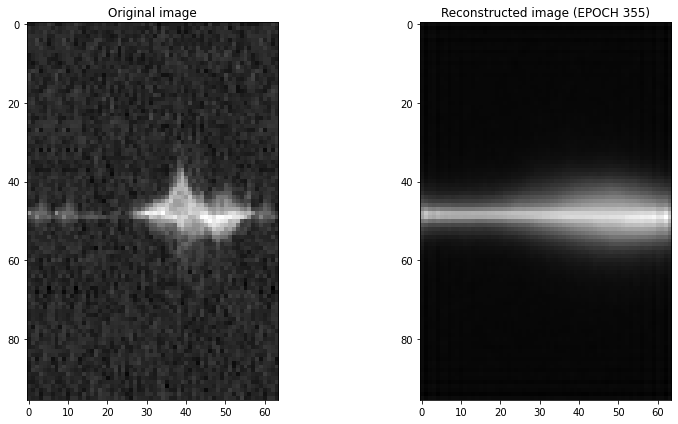

Epoch 356/500, Train Loss: 139275.3014, Validation Loss: 139207.4164
Time for epoch 356 is 8.906363010406494 sec


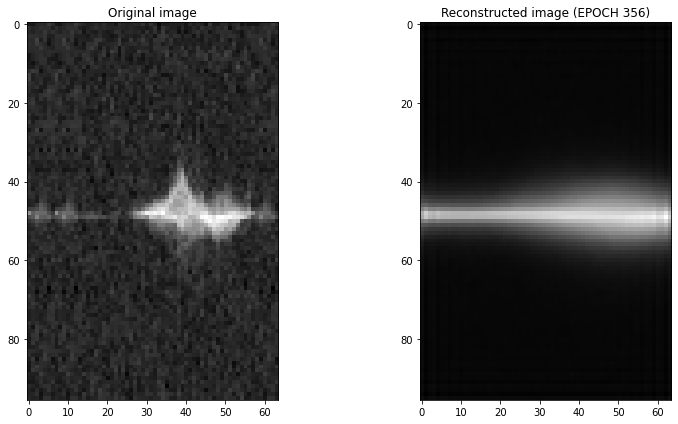

Epoch 357/500, Train Loss: 139274.7037, Validation Loss: 139208.9905
Time for epoch 357 is 9.69467306137085 sec


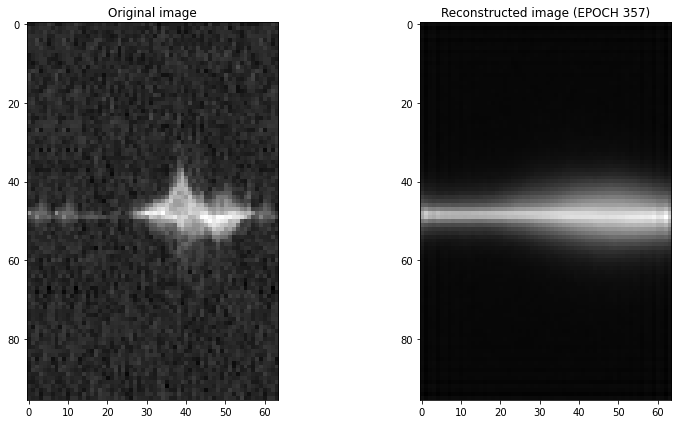

Epoch 358/500, Train Loss: 139274.5875, Validation Loss: 139208.2022
Time for epoch 358 is 15.762155294418335 sec


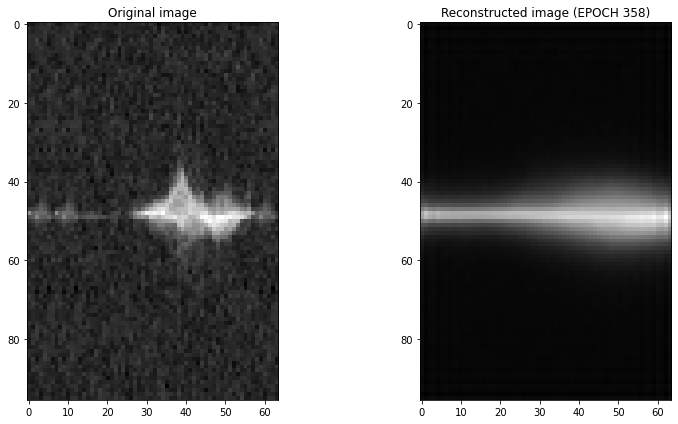

Epoch 359/500, Train Loss: 139272.9341, Validation Loss: 139209.6276
Time for epoch 359 is 9.12401294708252 sec


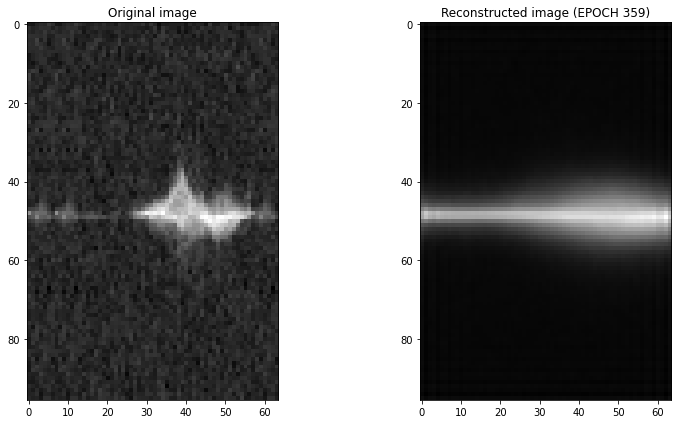

Epoch 360/500, Train Loss: 139274.1876, Validation Loss: 139204.4860
Time for epoch 360 is 9.071390867233276 sec


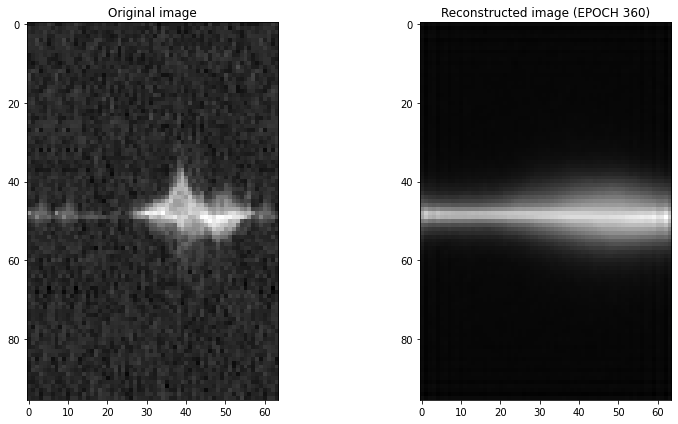

Epoch 361/500, Train Loss: 139275.2289, Validation Loss: 139204.2403
Time for epoch 361 is 14.168586254119873 sec


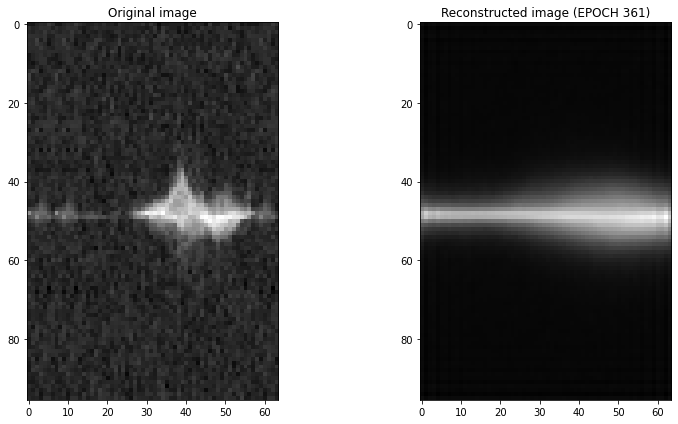

Epoch 362/500, Train Loss: 139275.4610, Validation Loss: 139205.6257
Time for epoch 362 is 11.426679372787476 sec


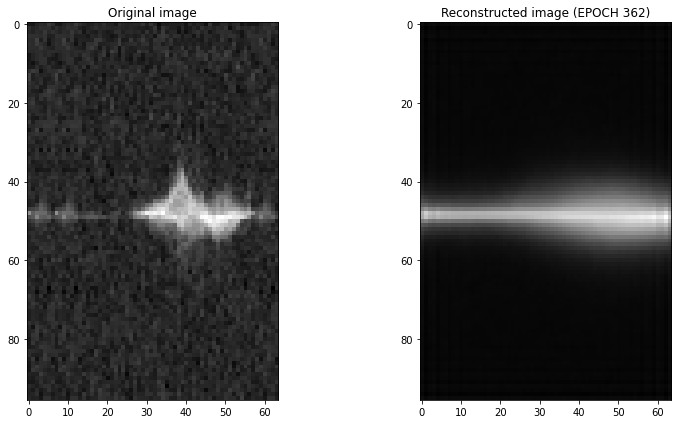

Epoch 363/500, Train Loss: 139275.0150, Validation Loss: 139206.4153
Time for epoch 363 is 10.2679283618927 sec


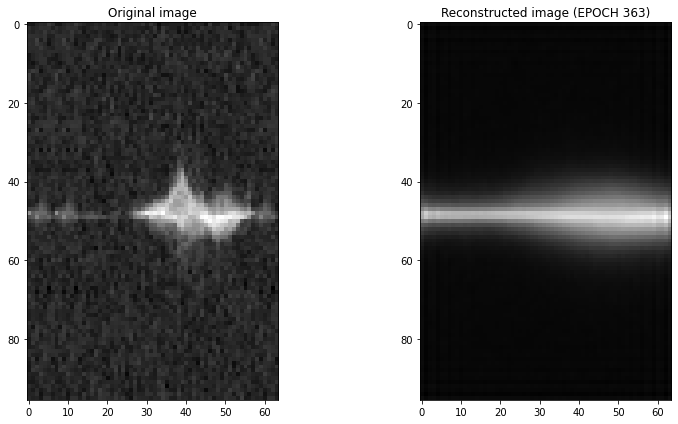

Epoch 364/500, Train Loss: 139273.2380, Validation Loss: 139205.8395
Time for epoch 364 is 8.727386474609375 sec


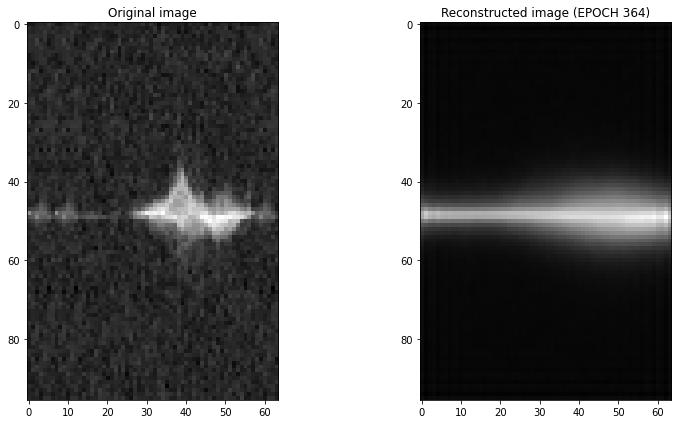

Epoch 365/500, Train Loss: 139272.5495, Validation Loss: 139203.5841
Time for epoch 365 is 8.955527305603027 sec


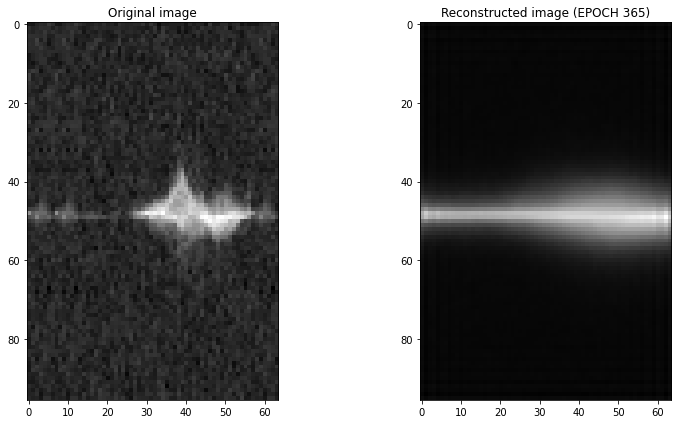

Epoch 366/500, Train Loss: 139270.8688, Validation Loss: 139205.8120
Time for epoch 366 is 9.151147842407227 sec


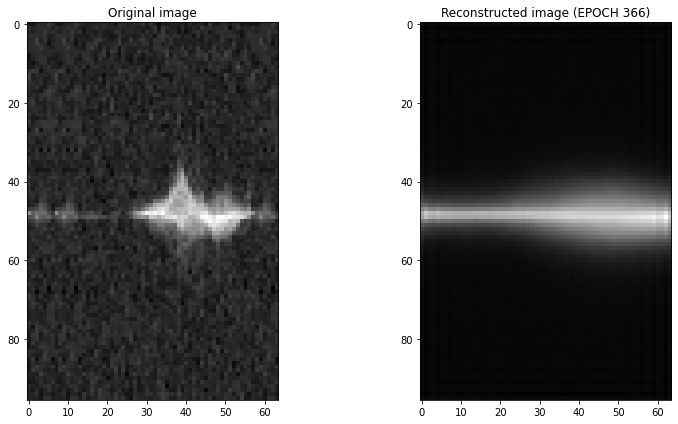

Epoch 367/500, Train Loss: 139271.7916, Validation Loss: 139207.0066
Time for epoch 367 is 9.320893287658691 sec


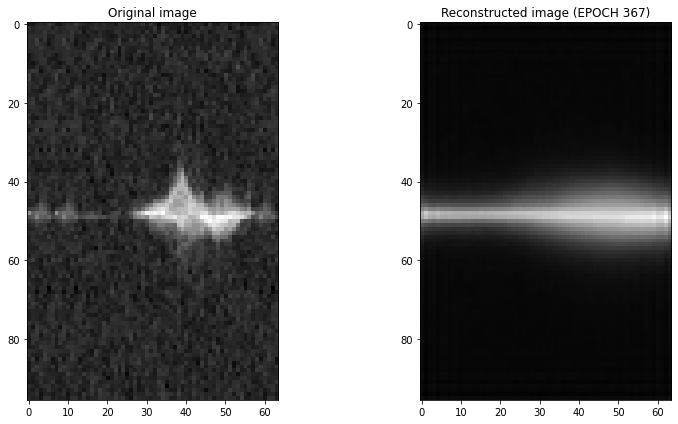

Epoch 368/500, Train Loss: 139272.1405, Validation Loss: 139207.3355
Time for epoch 368 is 8.65334177017212 sec


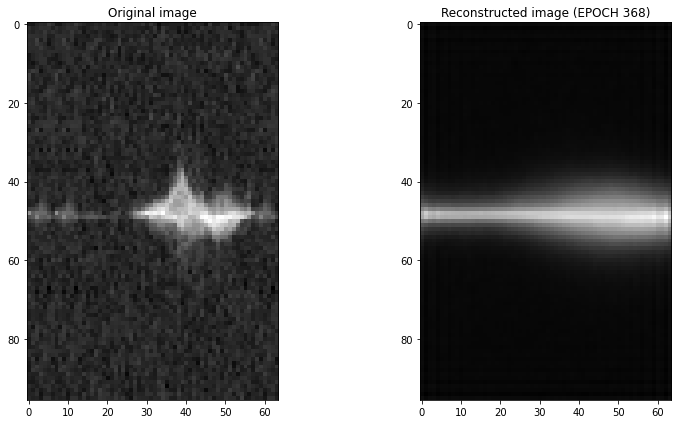

Epoch 369/500, Train Loss: 139272.7437, Validation Loss: 139204.0915
Time for epoch 369 is 9.077887058258057 sec


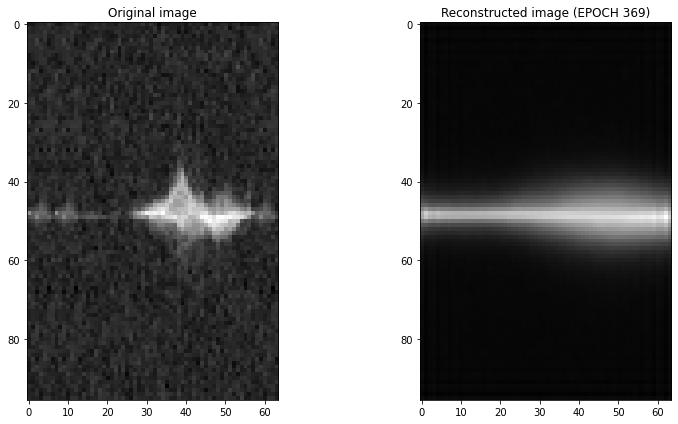

Epoch 370/500, Train Loss: 139275.1372, Validation Loss: 139206.9854
Time for epoch 370 is 9.156780242919922 sec


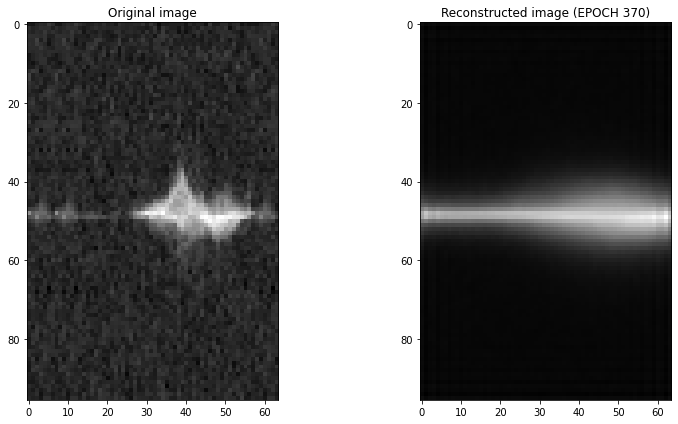

Epoch 371/500, Train Loss: 139272.8233, Validation Loss: 139205.5350
Time for epoch 371 is 10.35312795639038 sec


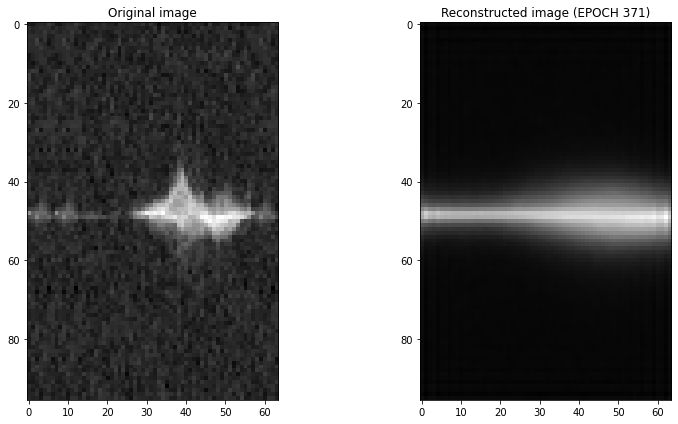

Epoch 372/500, Train Loss: 139270.3007, Validation Loss: 139206.3576
Time for epoch 372 is 8.63696837425232 sec


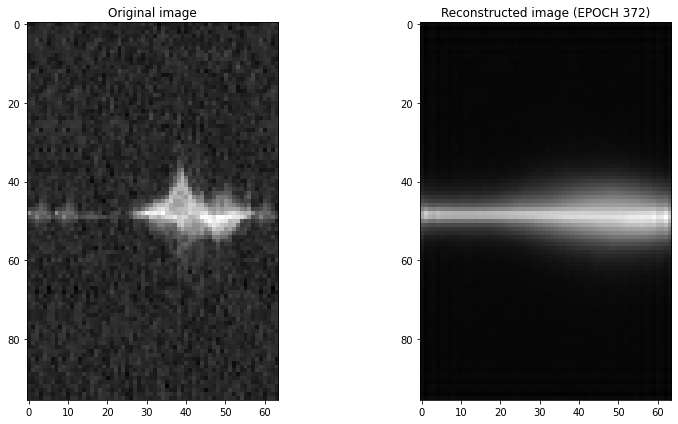

Epoch 373/500, Train Loss: 139272.8052, Validation Loss: 139209.0565
Time for epoch 373 is 9.713935375213623 sec


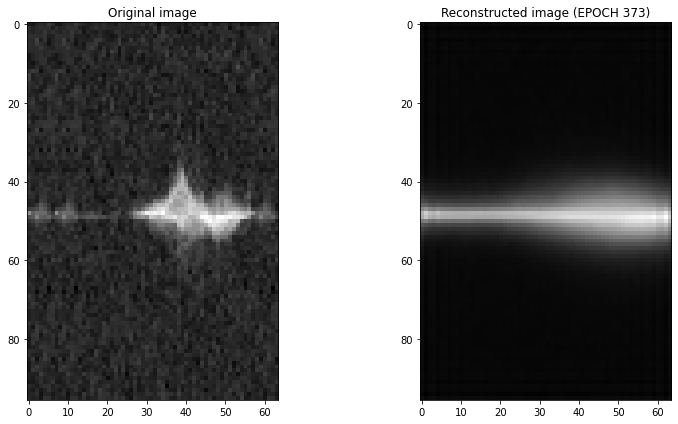

Epoch 374/500, Train Loss: 139268.7824, Validation Loss: 139204.8698
Time for epoch 374 is 11.635401964187622 sec


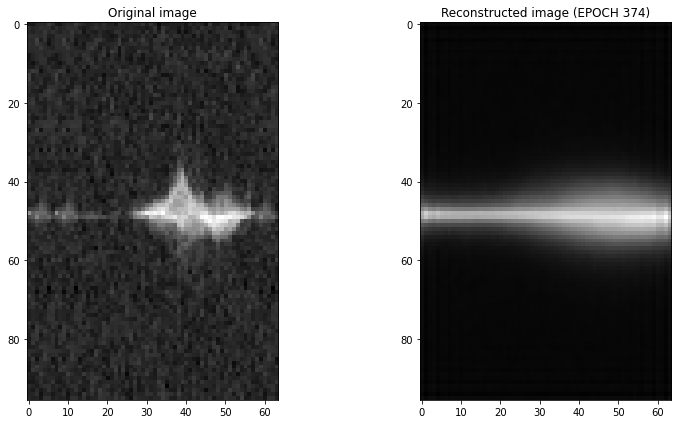

Epoch 375/500, Train Loss: 139271.1494, Validation Loss: 139207.3925
Time for epoch 375 is 9.841954469680786 sec


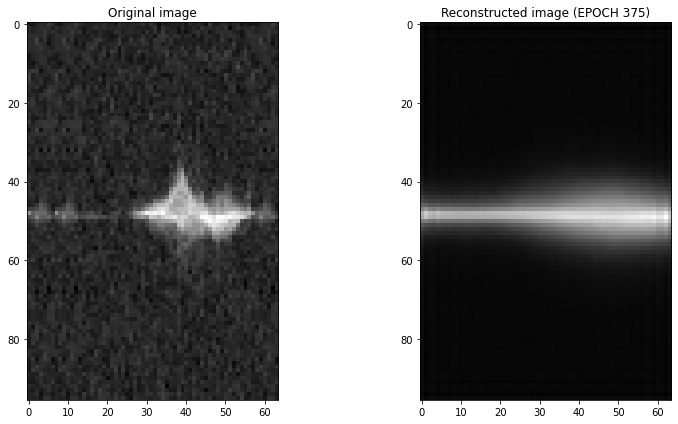

Epoch 376/500, Train Loss: 139267.9407, Validation Loss: 139204.9465
Time for epoch 376 is 9.293106079101562 sec


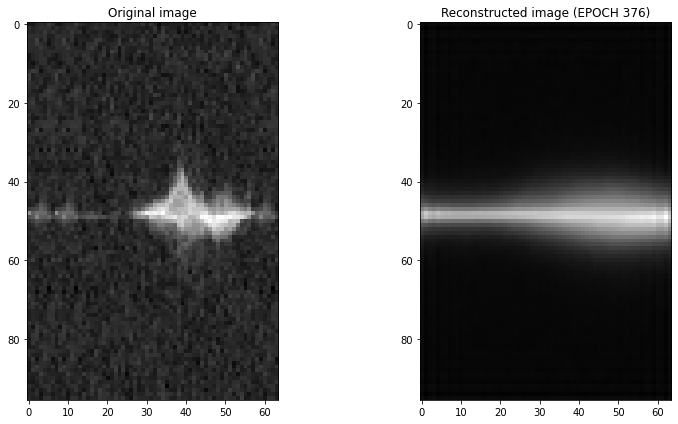

Epoch 377/500, Train Loss: 139268.2912, Validation Loss: 139204.7529
Time for epoch 377 is 8.584882497787476 sec


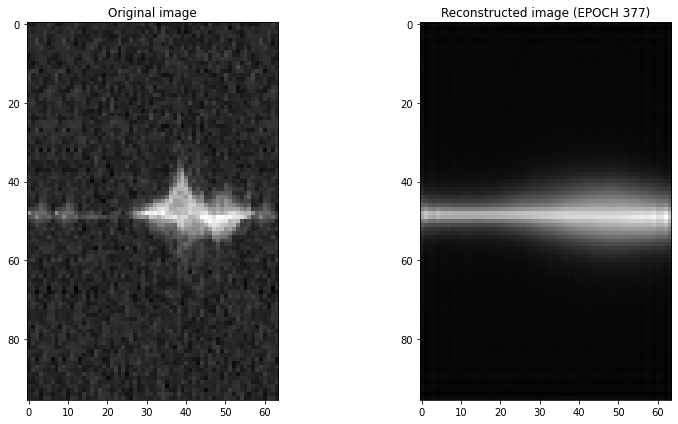

Epoch 378/500, Train Loss: 139267.3888, Validation Loss: 139204.7375
Time for epoch 378 is 9.195006132125854 sec


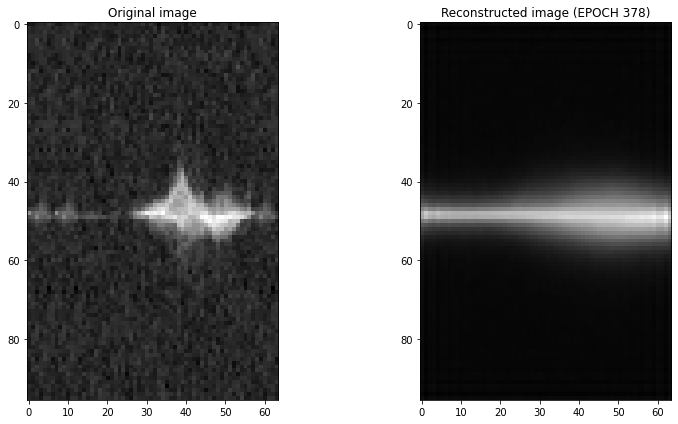

Epoch 379/500, Train Loss: 139268.9036, Validation Loss: 139205.0838
Time for epoch 379 is 9.14879298210144 sec


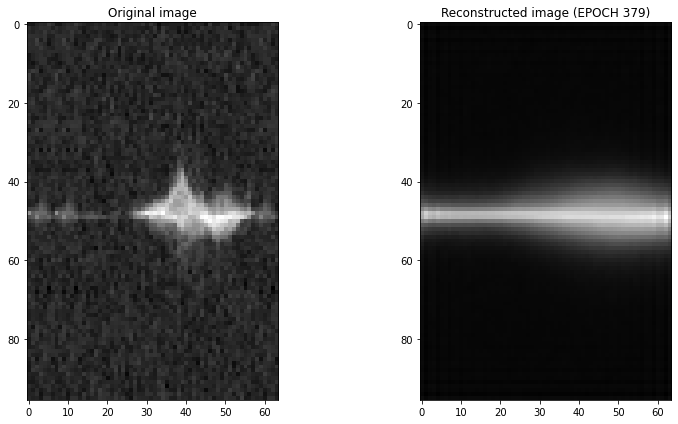

Epoch 380/500, Train Loss: 139270.1018, Validation Loss: 139205.5503
Time for epoch 380 is 9.089580059051514 sec


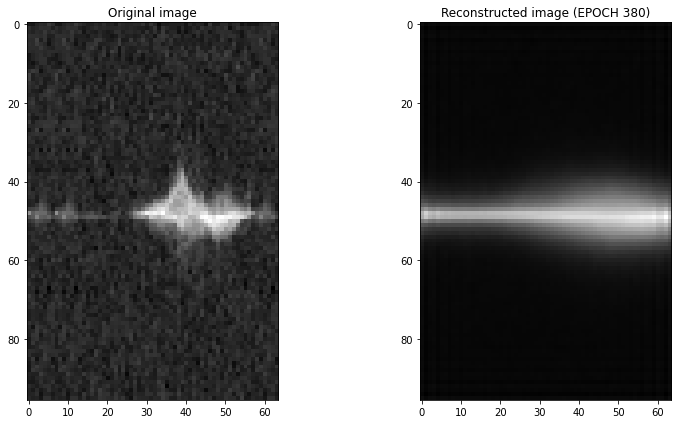

Epoch 381/500, Train Loss: 139268.2134, Validation Loss: 139204.5387
Time for epoch 381 is 8.594053983688354 sec


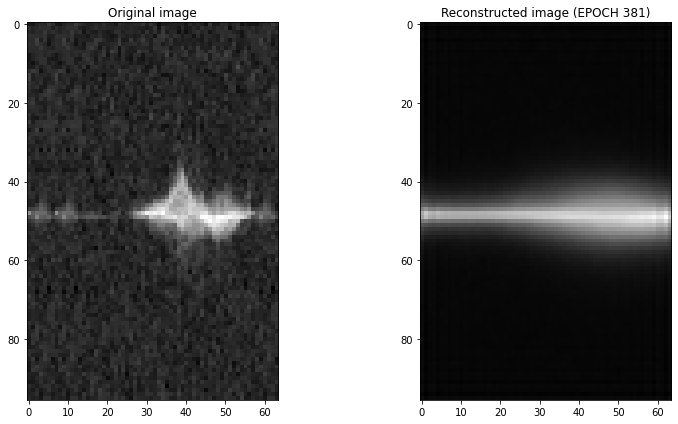

Epoch 382/500, Train Loss: 139270.0277, Validation Loss: 139202.8661
Time for epoch 382 is 9.092288494110107 sec


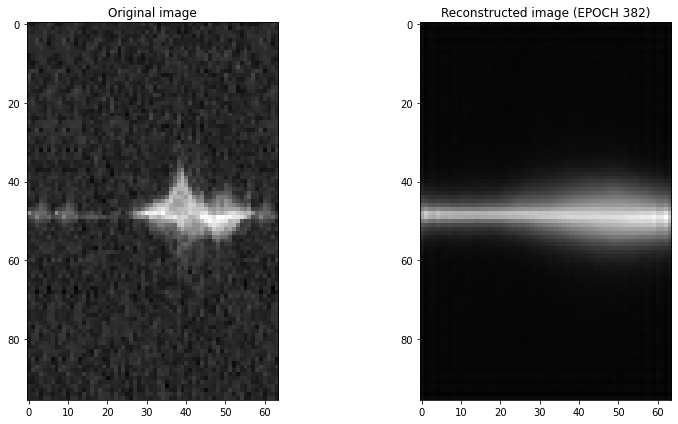

Epoch 383/500, Train Loss: 139275.5100, Validation Loss: 139208.5695
Time for epoch 383 is 9.164427518844604 sec


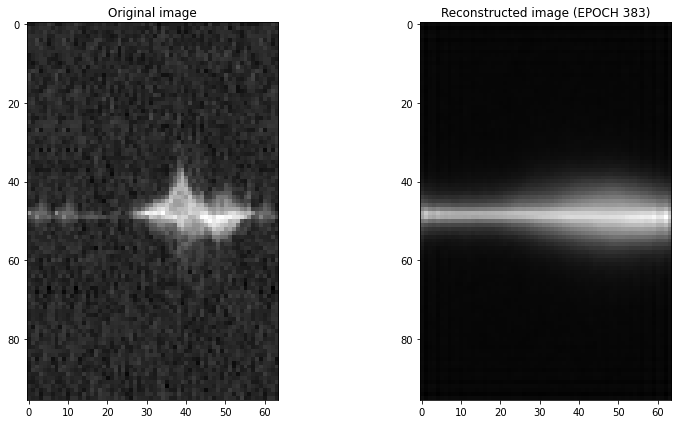

Epoch 384/500, Train Loss: 139270.4352, Validation Loss: 139204.3679
Time for epoch 384 is 9.046387195587158 sec


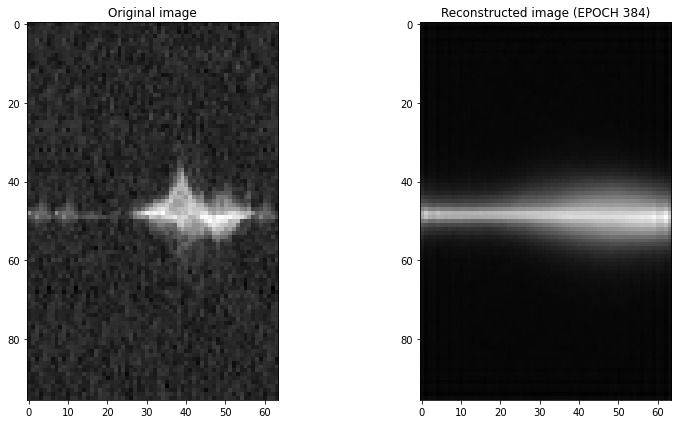

Epoch 385/500, Train Loss: 139268.2690, Validation Loss: 139206.0580
Time for epoch 385 is 8.750945568084717 sec


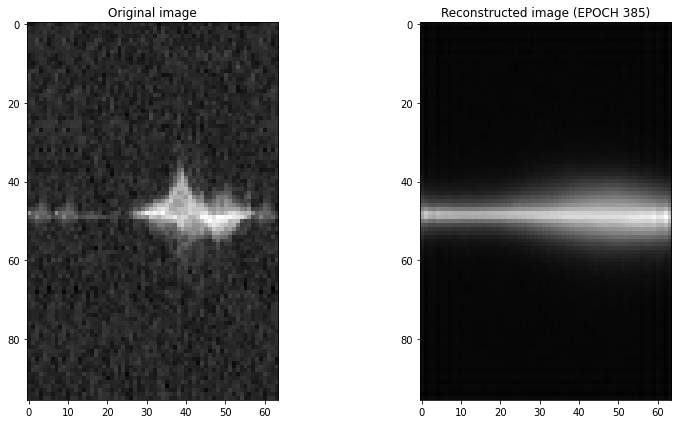

Epoch 386/500, Train Loss: 139268.8931, Validation Loss: 139203.9804
Time for epoch 386 is 9.110049724578857 sec


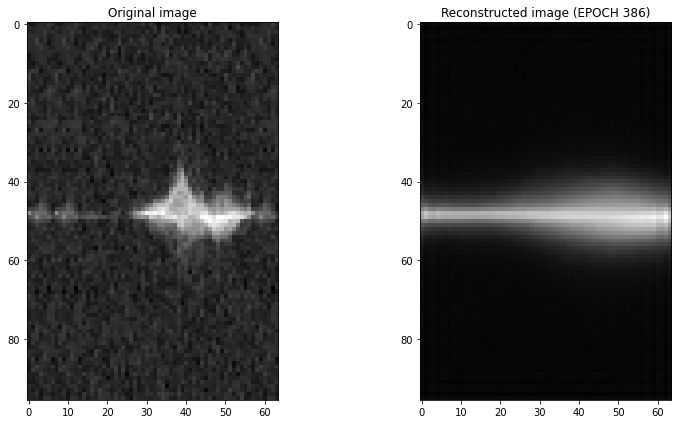

Epoch 387/500, Train Loss: 139290.8803, Validation Loss: 139219.9706
Time for epoch 387 is 9.168614149093628 sec


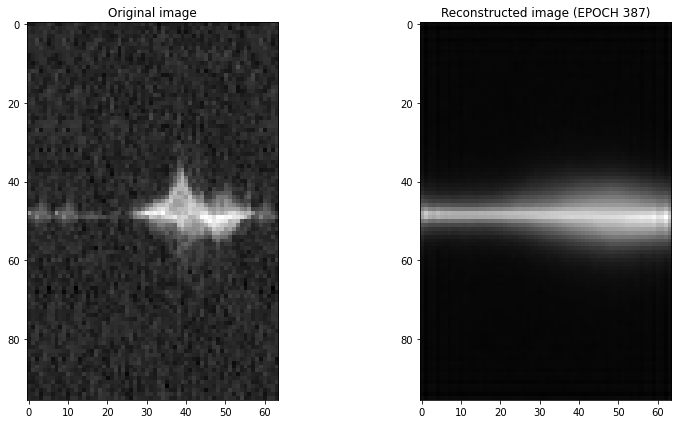

Epoch 388/500, Train Loss: 139276.1873, Validation Loss: 139211.4817
Time for epoch 388 is 8.779207706451416 sec


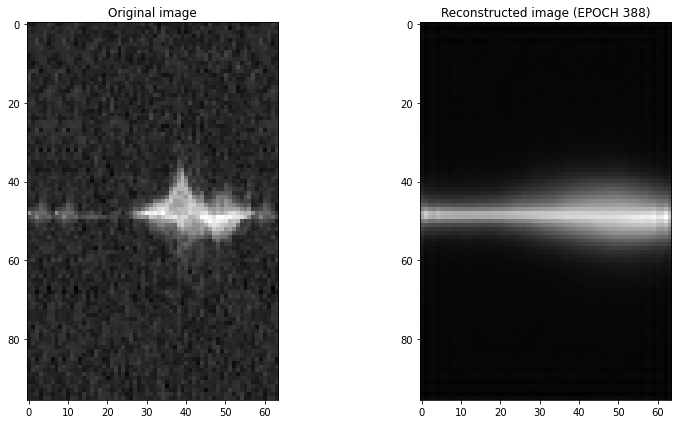

Epoch 389/500, Train Loss: 139273.3584, Validation Loss: 139207.5506
Time for epoch 389 is 8.717865705490112 sec


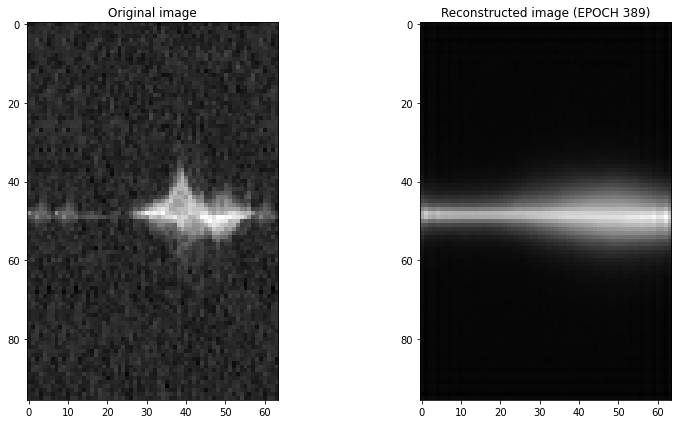

Epoch 390/500, Train Loss: 139270.1349, Validation Loss: 139206.5896
Time for epoch 390 is 9.145071744918823 sec


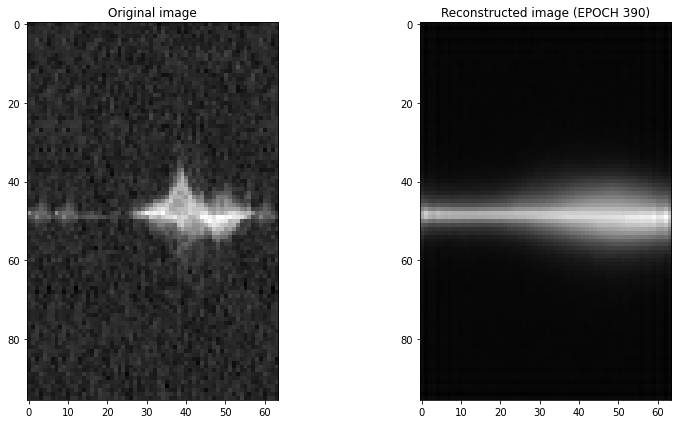

Epoch 391/500, Train Loss: 139266.8174, Validation Loss: 139203.9783
Time for epoch 391 is 9.258709192276001 sec


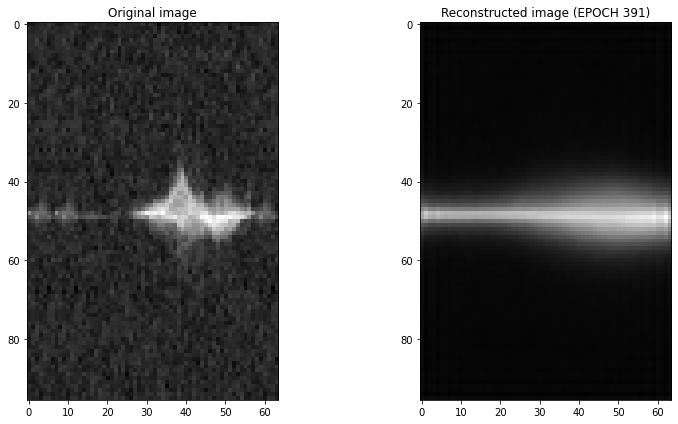

Epoch 392/500, Train Loss: 139267.4551, Validation Loss: 139205.2748
Time for epoch 392 is 8.876273155212402 sec


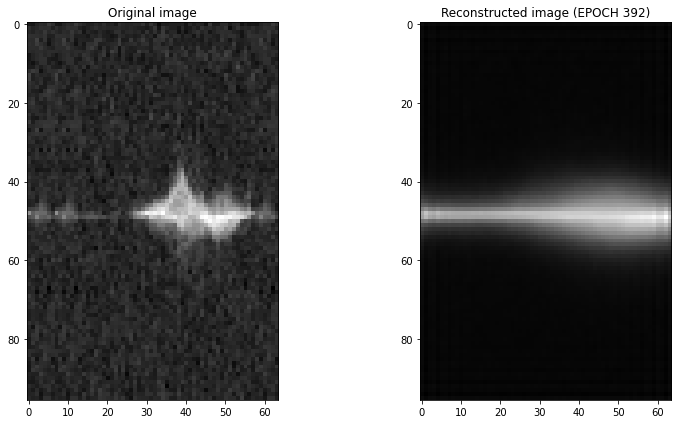

Epoch 393/500, Train Loss: 139267.5552, Validation Loss: 139205.4560
Time for epoch 393 is 8.833386421203613 sec


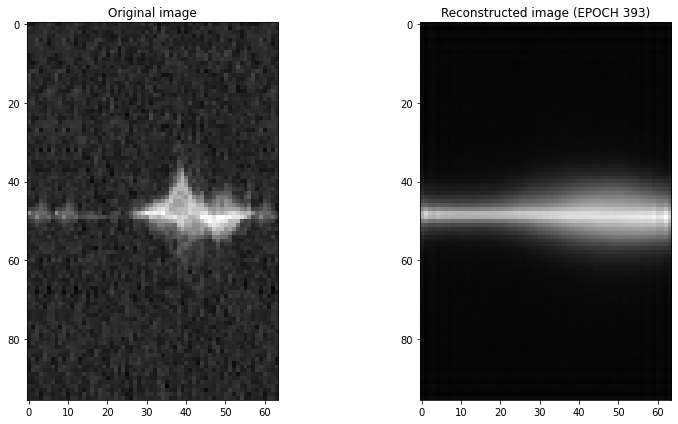

Epoch 394/500, Train Loss: 139266.0834, Validation Loss: 139206.4093
Time for epoch 394 is 9.141026020050049 sec


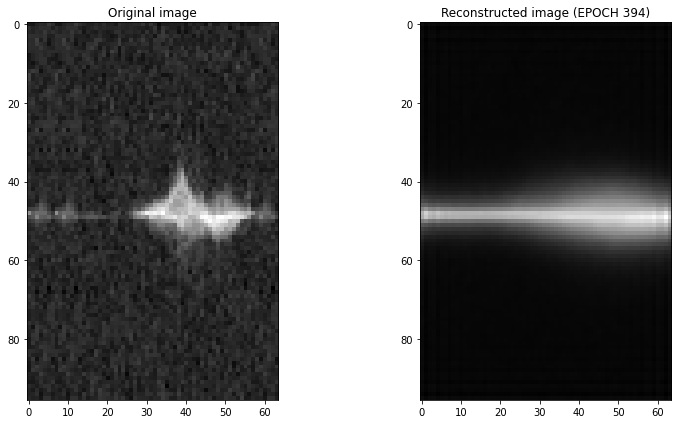

Epoch 395/500, Train Loss: 139266.4146, Validation Loss: 139205.2332
Time for epoch 395 is 10.08568024635315 sec


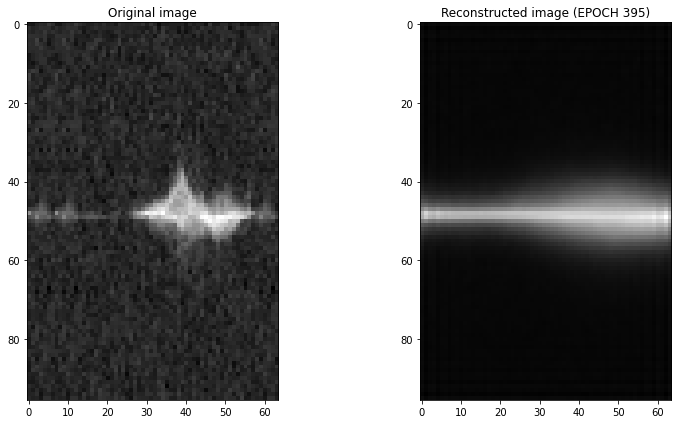

Epoch 396/500, Train Loss: 139267.4052, Validation Loss: 139206.0847
Time for epoch 396 is 8.637857437133789 sec


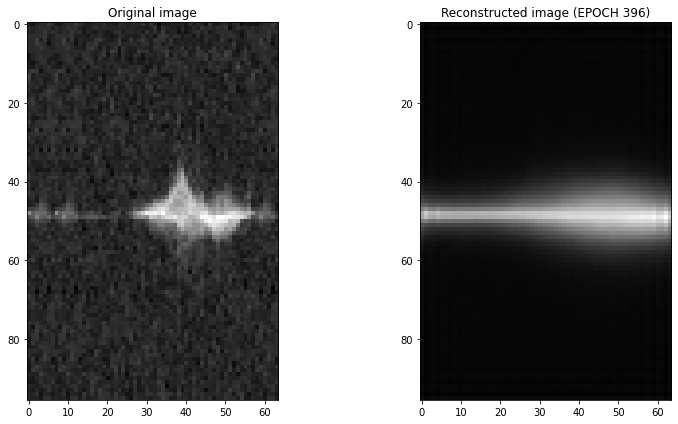

Epoch 397/500, Train Loss: 139264.8727, Validation Loss: 139202.9473
Time for epoch 397 is 9.020637512207031 sec


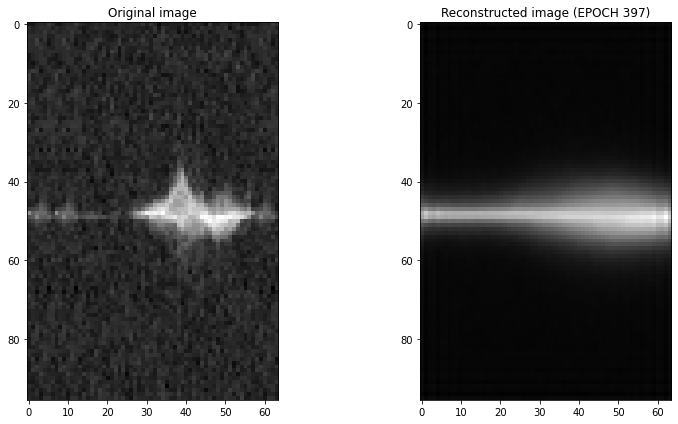

Epoch 398/500, Train Loss: 139265.7666, Validation Loss: 139202.4615
Time for epoch 398 is 9.24325680732727 sec


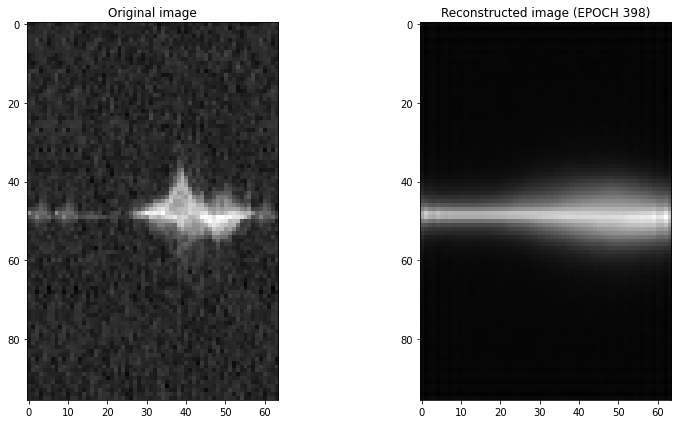

Epoch 399/500, Train Loss: 139274.2801, Validation Loss: 139206.0241
Time for epoch 399 is 9.161386728286743 sec


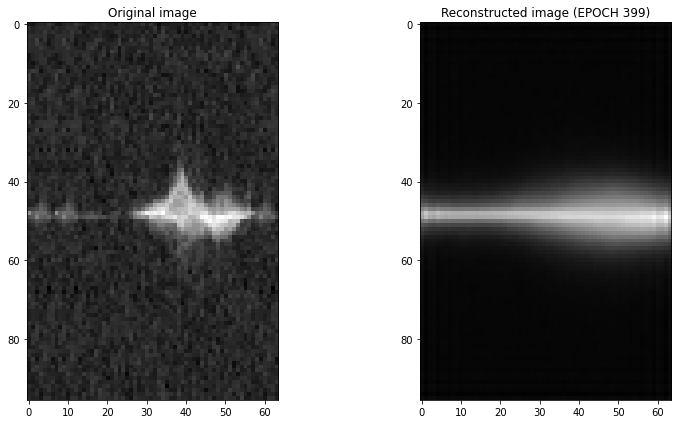

Epoch 400/500, Train Loss: 139267.5605, Validation Loss: 139202.7237
Time for epoch 400 is 8.654484510421753 sec


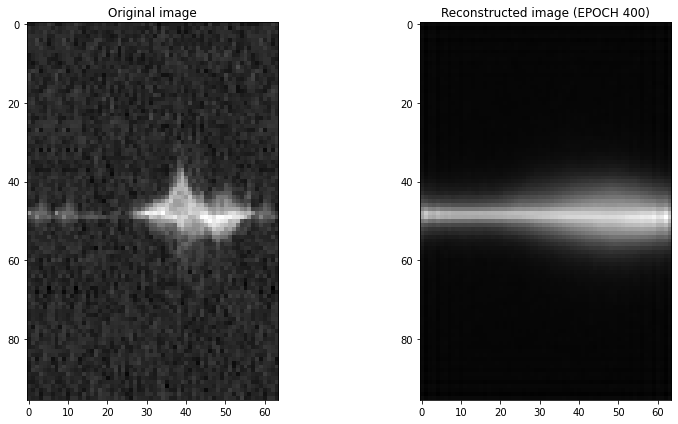

<Figure size 432x288 with 0 Axes>

Epoch 401/500, Train Loss: 139264.2534, Validation Loss: 139201.9447
Time for epoch 401 is 9.059808492660522 sec


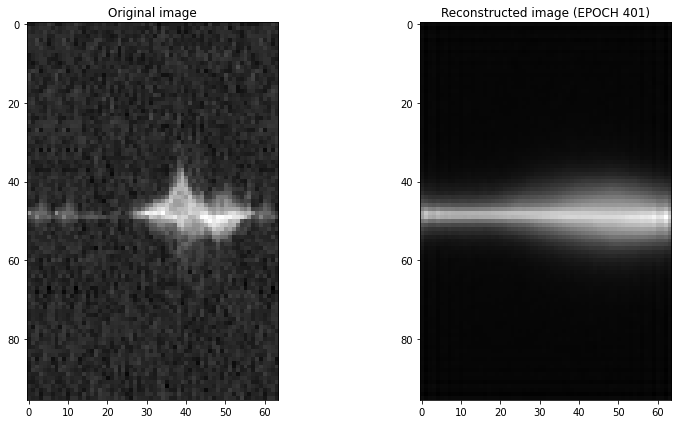

Epoch 402/500, Train Loss: 139265.4625, Validation Loss: 139201.7859
Time for epoch 402 is 9.036431074142456 sec


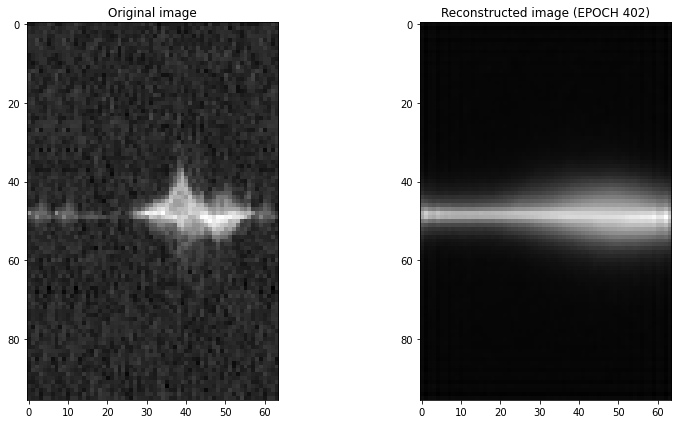

Epoch 403/500, Train Loss: 139263.7470, Validation Loss: 139203.7510
Time for epoch 403 is 9.195721864700317 sec


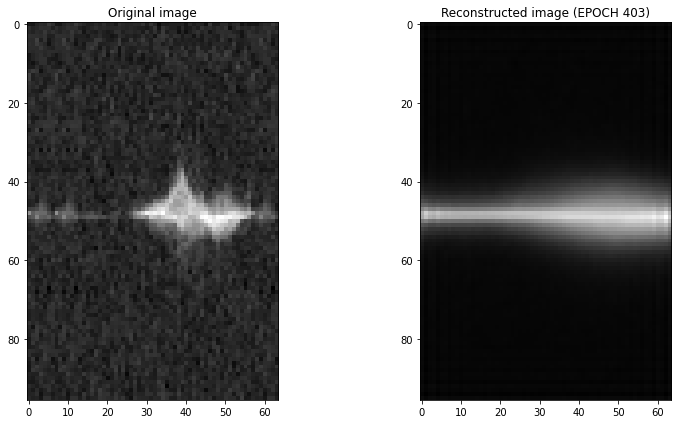

Epoch 404/500, Train Loss: 139265.5840, Validation Loss: 139202.4210
Time for epoch 404 is 8.733096599578857 sec


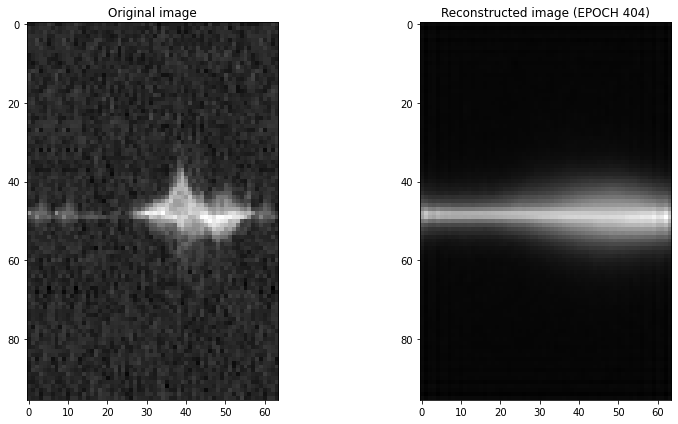

Epoch 405/500, Train Loss: 139265.2587, Validation Loss: 139204.7883
Time for epoch 405 is 8.912411212921143 sec


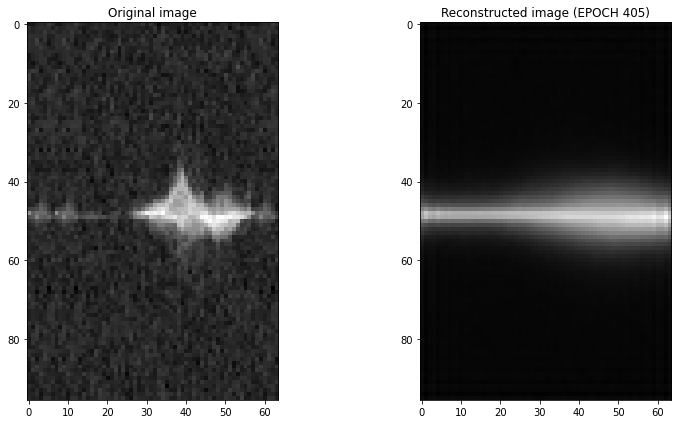

Epoch 406/500, Train Loss: 139265.0948, Validation Loss: 139201.9567
Time for epoch 406 is 9.074077367782593 sec


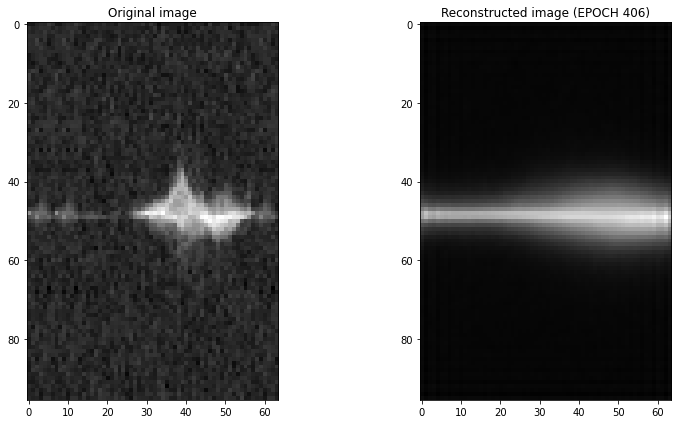

Epoch 407/500, Train Loss: 139266.4910, Validation Loss: 139204.6816
Time for epoch 407 is 9.280827045440674 sec


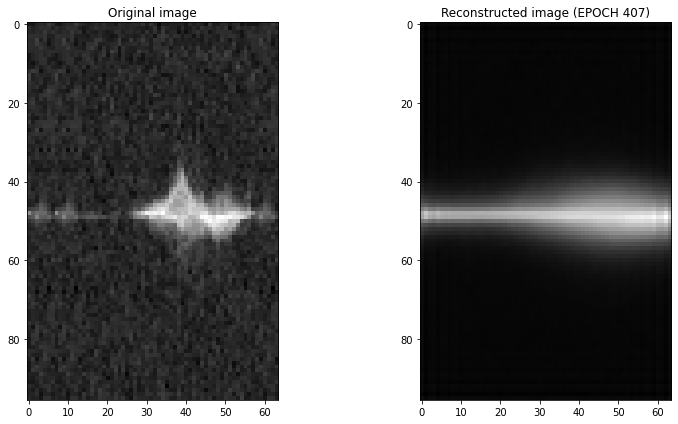

Epoch 408/500, Train Loss: 139262.8291, Validation Loss: 139202.0916
Time for epoch 408 is 8.53718376159668 sec


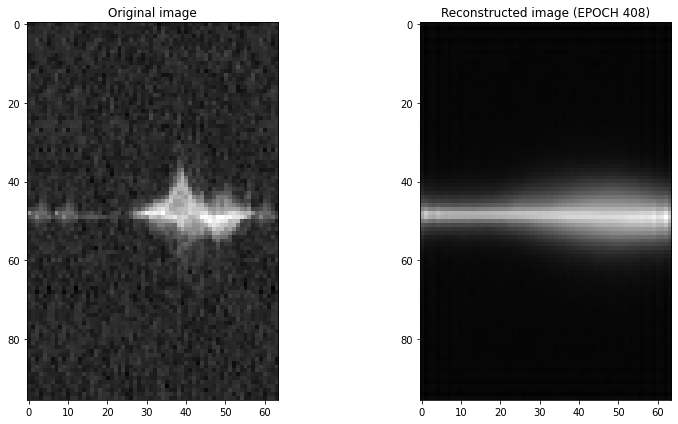

Epoch 409/500, Train Loss: 139262.9240, Validation Loss: 139202.1032
Time for epoch 409 is 9.142101764678955 sec


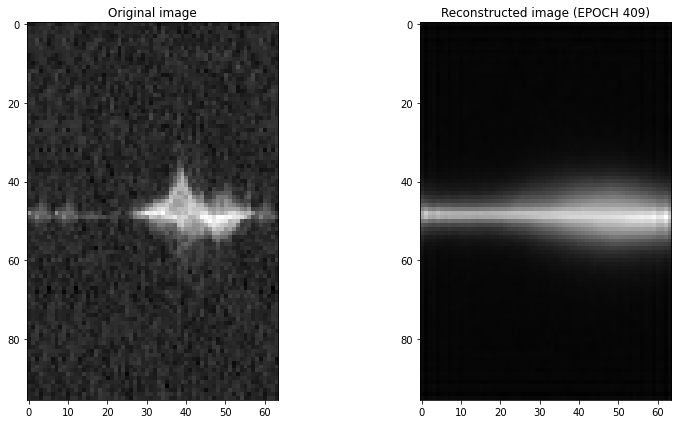

Epoch 410/500, Train Loss: 139261.6012, Validation Loss: 139205.1860
Time for epoch 410 is 9.152782917022705 sec


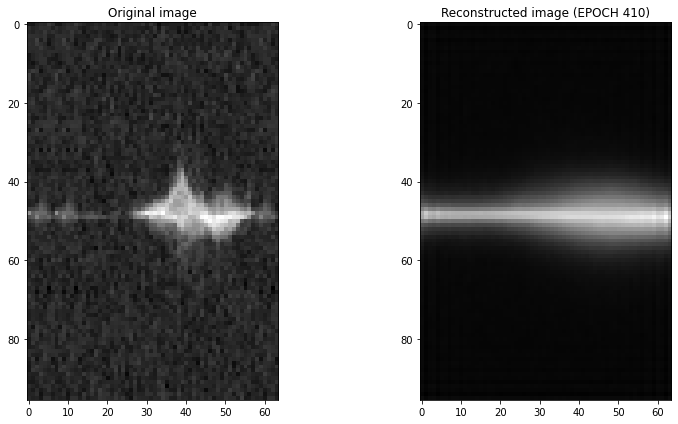

Epoch 411/500, Train Loss: 139262.5071, Validation Loss: 139204.5939
Time for epoch 411 is 9.050058126449585 sec


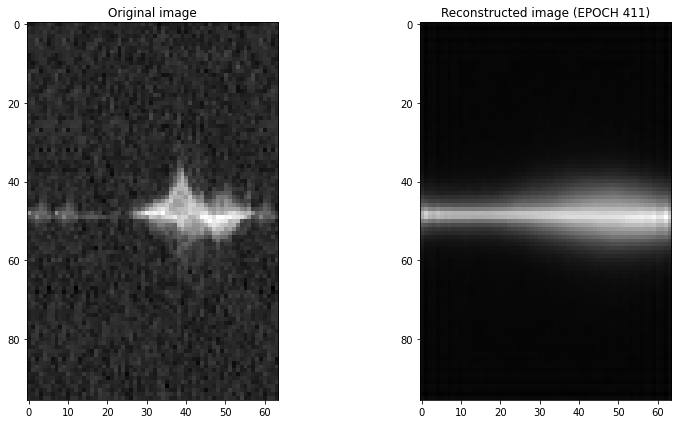

Epoch 412/500, Train Loss: 139261.4268, Validation Loss: 139203.5944
Time for epoch 412 is 8.686352014541626 sec


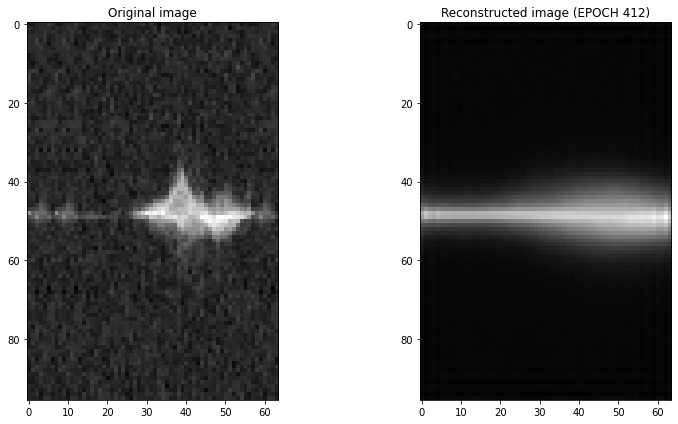

Epoch 413/500, Train Loss: 139263.0982, Validation Loss: 139204.7487
Time for epoch 413 is 9.086776494979858 sec


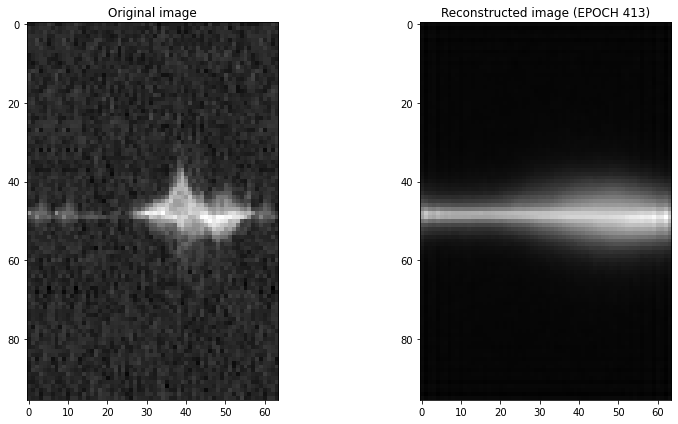

Epoch 414/500, Train Loss: 139263.1181, Validation Loss: 139206.2576
Time for epoch 414 is 9.19604206085205 sec


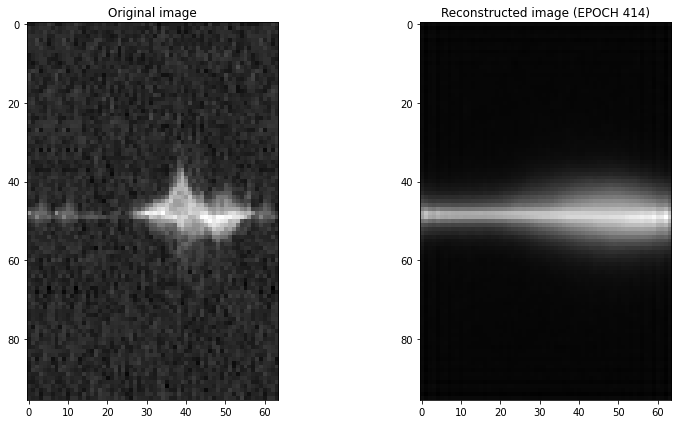

Epoch 415/500, Train Loss: 139260.1659, Validation Loss: 139206.3177
Time for epoch 415 is 9.580606698989868 sec


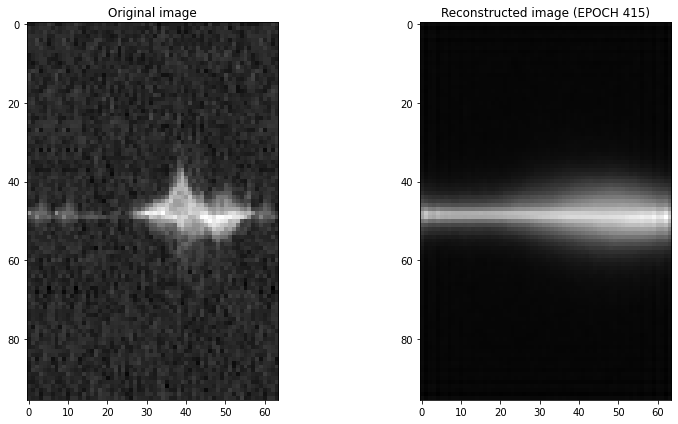

Epoch 416/500, Train Loss: 139261.5270, Validation Loss: 139201.6212
Time for epoch 416 is 8.65620231628418 sec


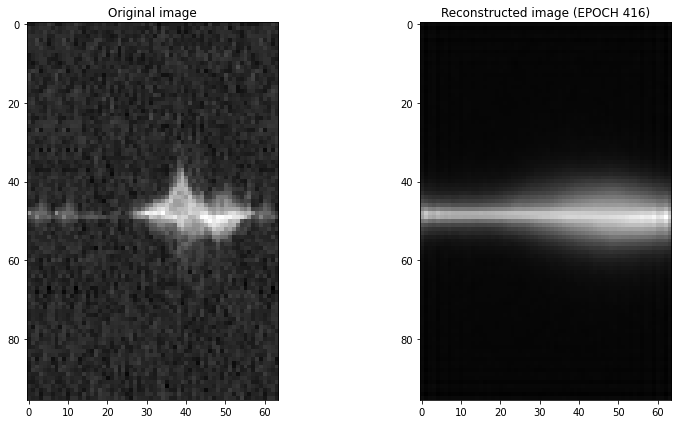

Epoch 417/500, Train Loss: 139261.5209, Validation Loss: 139204.1959
Time for epoch 417 is 9.051384925842285 sec


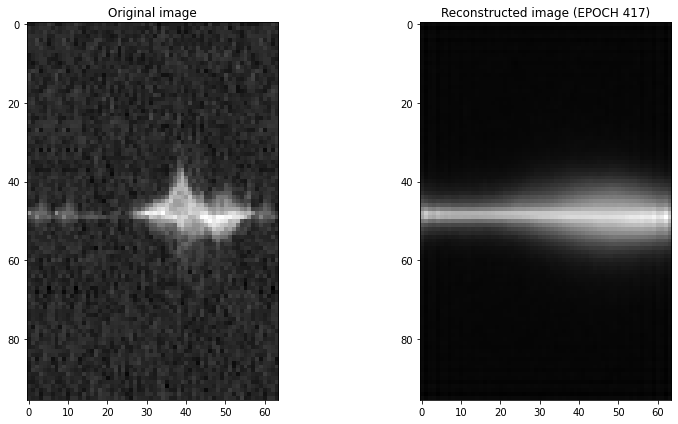

Epoch 418/500, Train Loss: 139260.4994, Validation Loss: 139203.7165
Time for epoch 418 is 9.1741361618042 sec


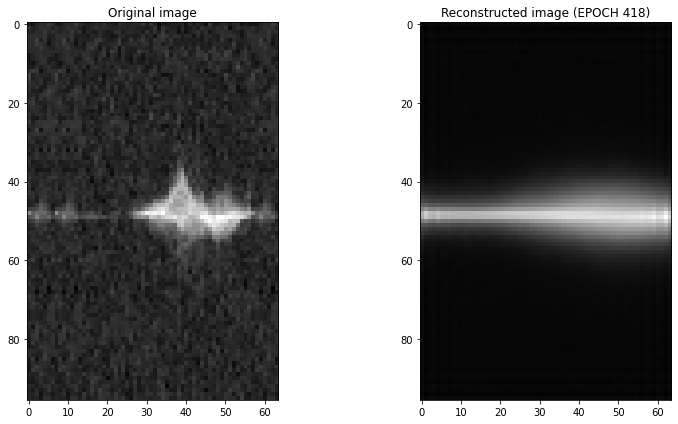

Epoch 419/500, Train Loss: 139259.9540, Validation Loss: 139203.4431
Time for epoch 419 is 8.920254468917847 sec


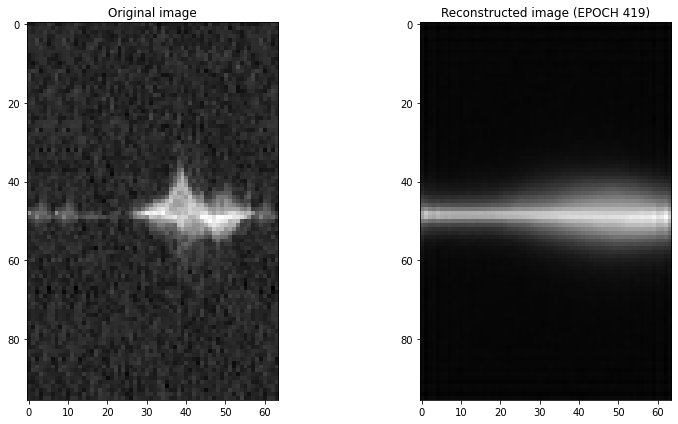

Epoch 420/500, Train Loss: 139264.6194, Validation Loss: 139202.3089
Time for epoch 420 is 8.700624227523804 sec


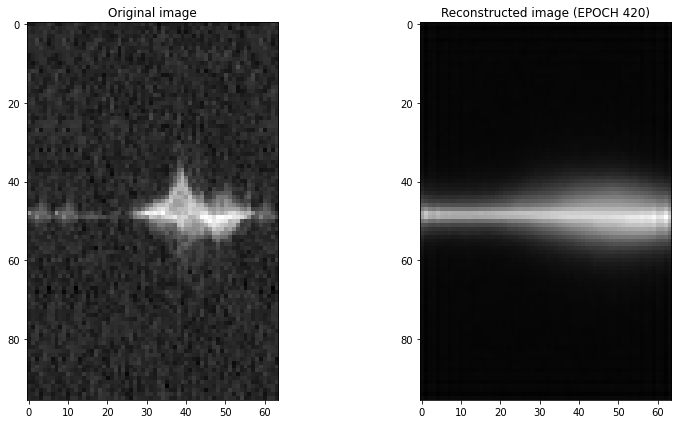

Epoch 421/500, Train Loss: 139264.7433, Validation Loss: 139207.3904
Time for epoch 421 is 9.177373886108398 sec


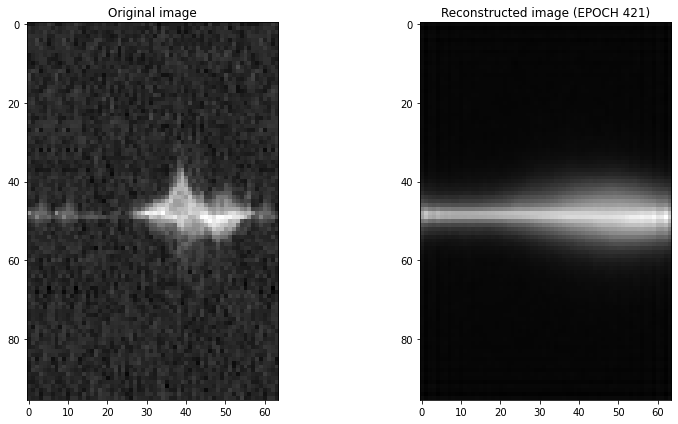

Epoch 422/500, Train Loss: 139263.0698, Validation Loss: 139203.4493
Time for epoch 422 is 9.25407338142395 sec


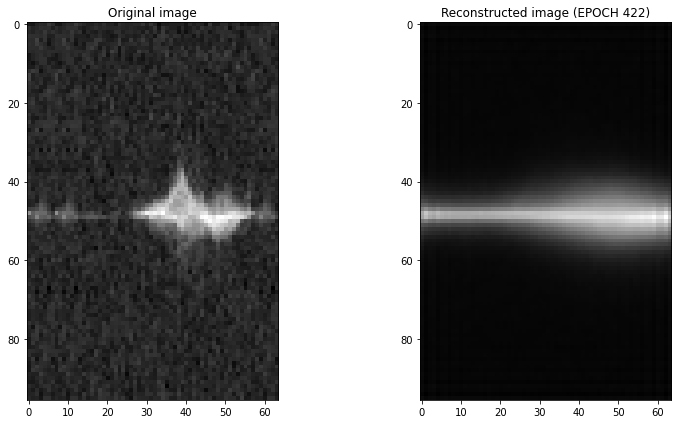

Epoch 423/500, Train Loss: 139266.8163, Validation Loss: 139204.4238
Time for epoch 423 is 8.869549751281738 sec


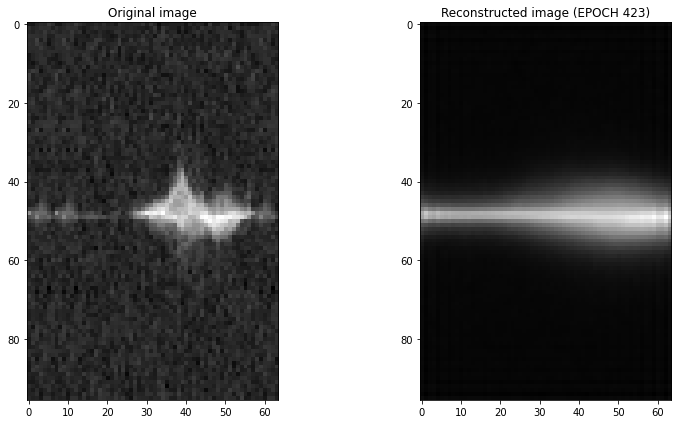

Epoch 424/500, Train Loss: 139263.2005, Validation Loss: 139202.5262
Time for epoch 424 is 8.870328903198242 sec


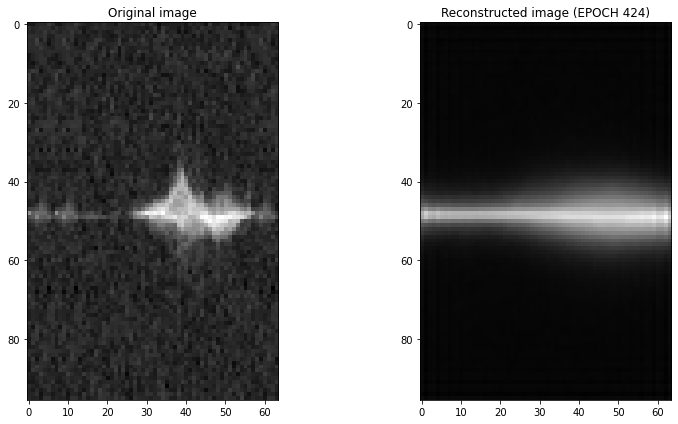

Epoch 425/500, Train Loss: 139260.2704, Validation Loss: 139203.3270
Time for epoch 425 is 9.101107597351074 sec


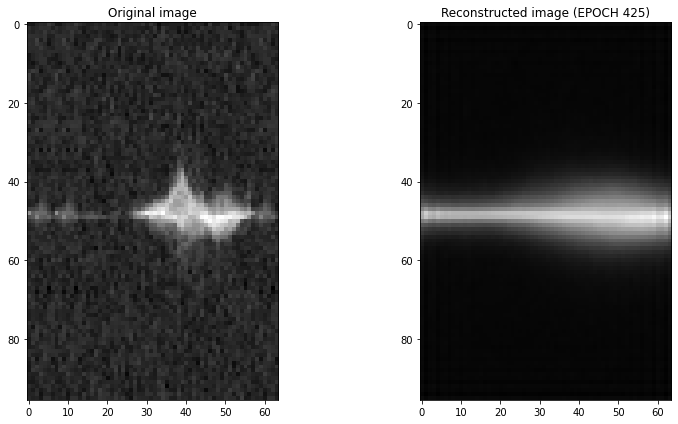

Epoch 426/500, Train Loss: 139259.0688, Validation Loss: 139203.1574
Time for epoch 426 is 9.190385341644287 sec


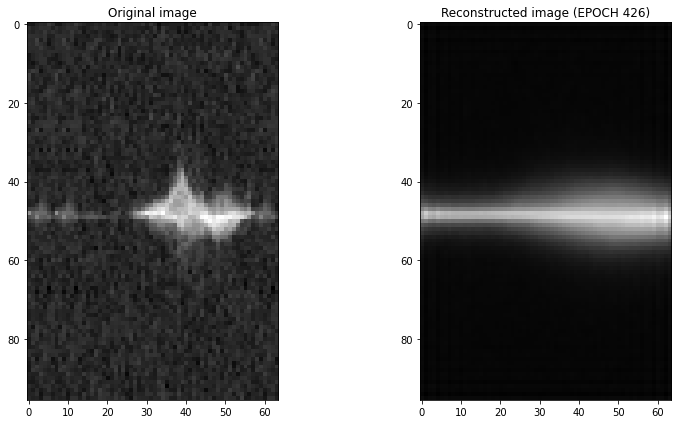

Epoch 427/500, Train Loss: 139259.4002, Validation Loss: 139203.9028
Time for epoch 427 is 8.768750429153442 sec


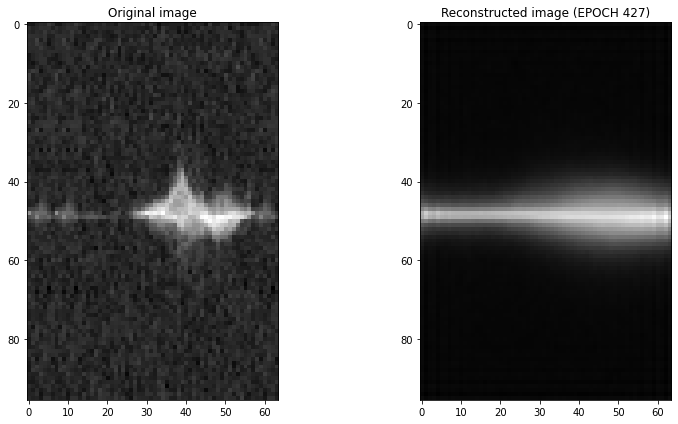

Epoch 428/500, Train Loss: 139259.2411, Validation Loss: 139202.6156
Time for epoch 428 is 8.979439735412598 sec


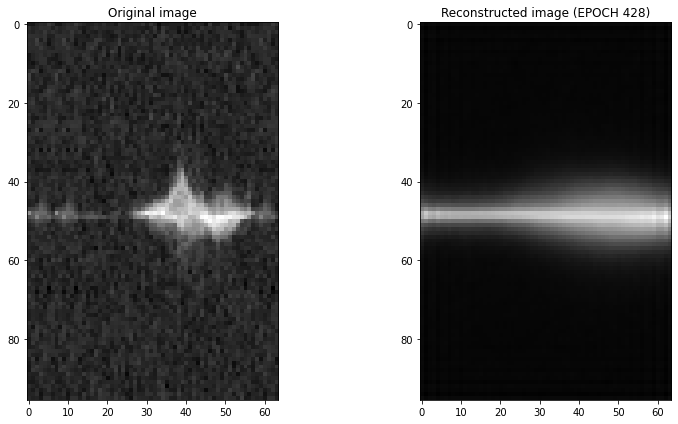

Epoch 429/500, Train Loss: 139259.1597, Validation Loss: 139202.8181
Time for epoch 429 is 9.19539761543274 sec


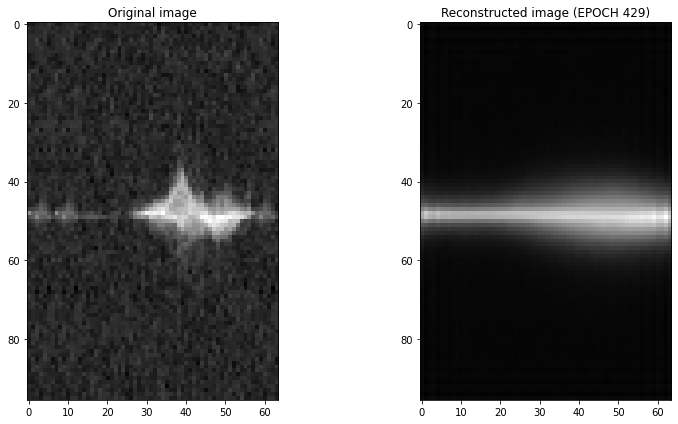

Epoch 430/500, Train Loss: 139259.3077, Validation Loss: 139203.0373
Time for epoch 430 is 9.148208856582642 sec


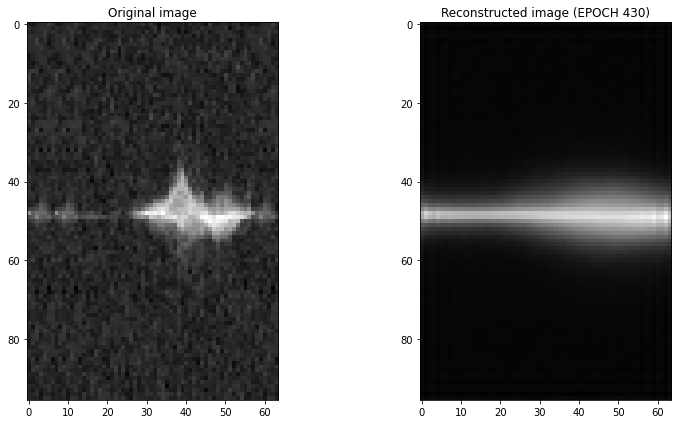

Epoch 431/500, Train Loss: 139258.6323, Validation Loss: 139200.8103
Time for epoch 431 is 8.774980068206787 sec


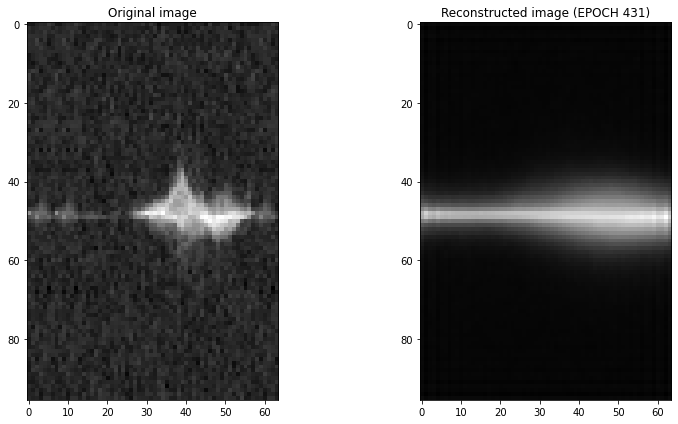

Epoch 432/500, Train Loss: 139257.9756, Validation Loss: 139201.5281
Time for epoch 432 is 9.009076118469238 sec


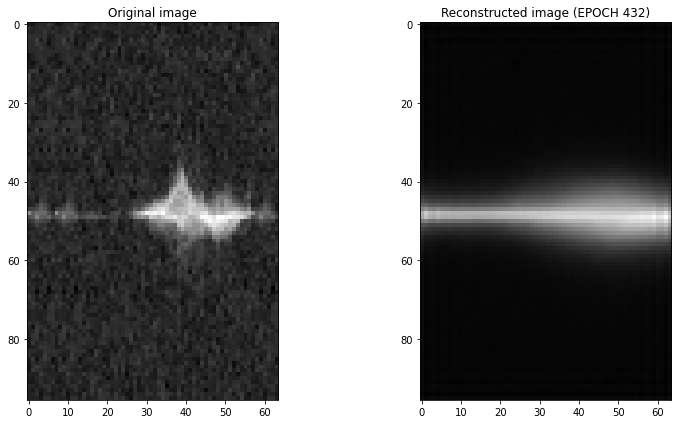

Epoch 433/500, Train Loss: 139259.7779, Validation Loss: 139204.0052
Time for epoch 433 is 9.062910079956055 sec


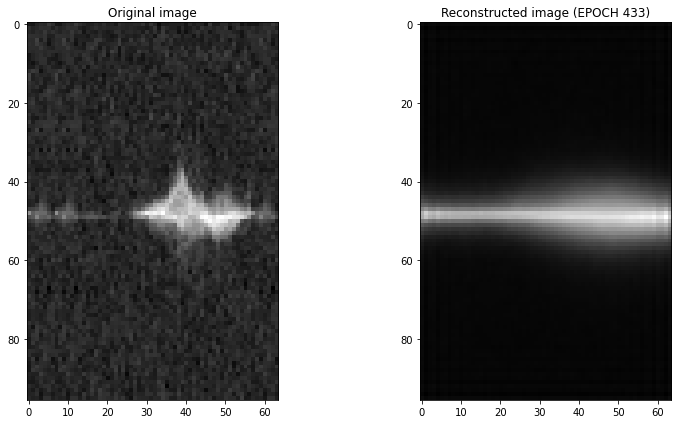

Epoch 434/500, Train Loss: 139260.3608, Validation Loss: 139202.5404
Time for epoch 434 is 10.176878452301025 sec


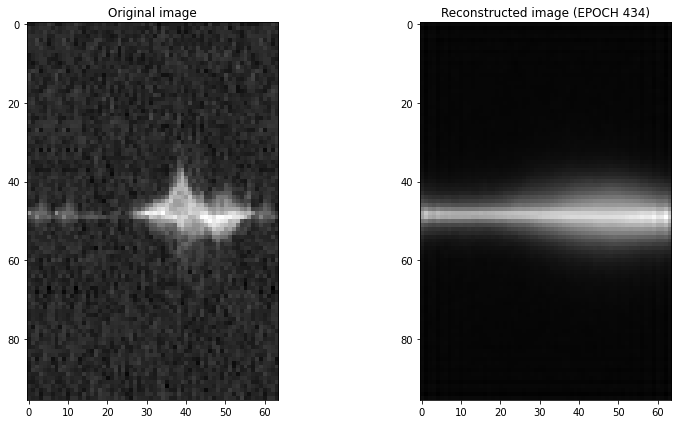

Epoch 435/500, Train Loss: 139259.9372, Validation Loss: 139201.5772
Time for epoch 435 is 8.866207599639893 sec


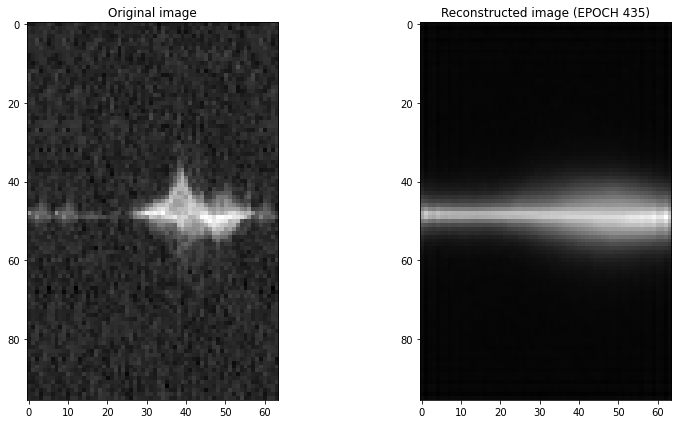

Epoch 436/500, Train Loss: 139258.6754, Validation Loss: 139201.4856
Time for epoch 436 is 9.015912294387817 sec


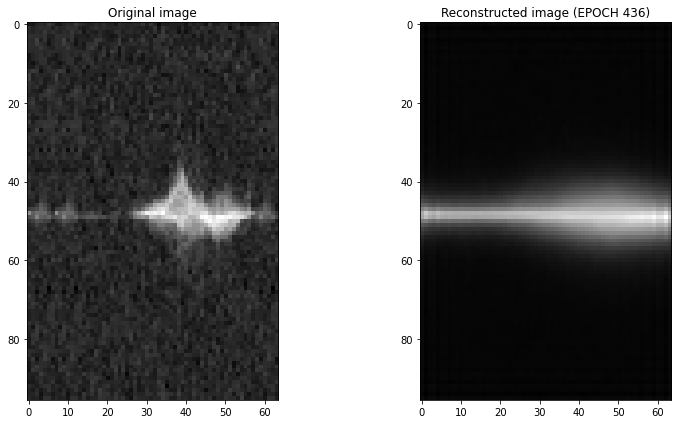

Epoch 437/500, Train Loss: 139258.3570, Validation Loss: 139202.5976
Time for epoch 437 is 9.23033881187439 sec


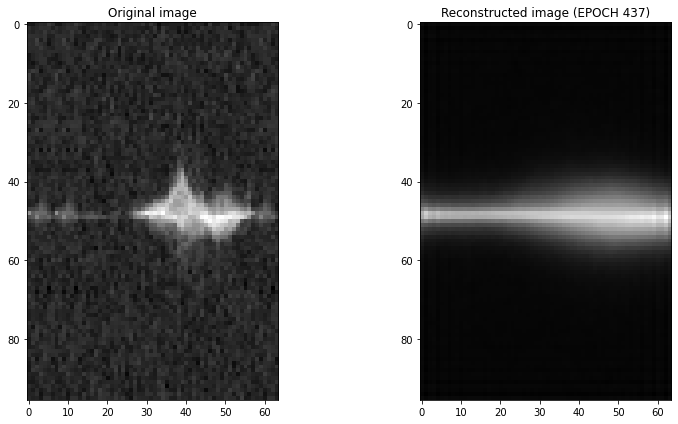

Epoch 438/500, Train Loss: 139259.3974, Validation Loss: 139201.9203
Time for epoch 438 is 9.024679899215698 sec


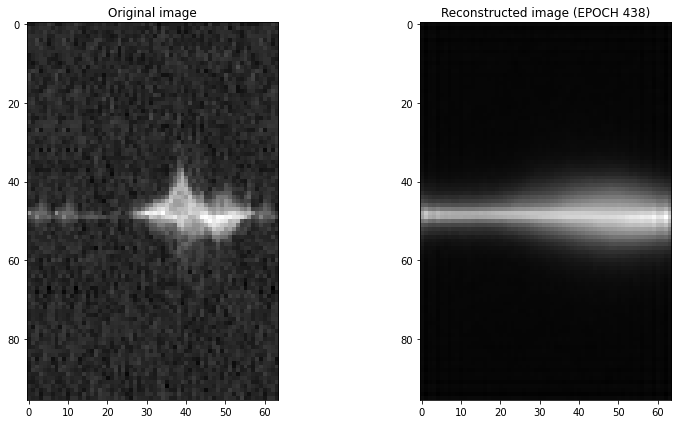

Epoch 439/500, Train Loss: 139256.8356, Validation Loss: 139199.9477
Time for epoch 439 is 8.589885234832764 sec


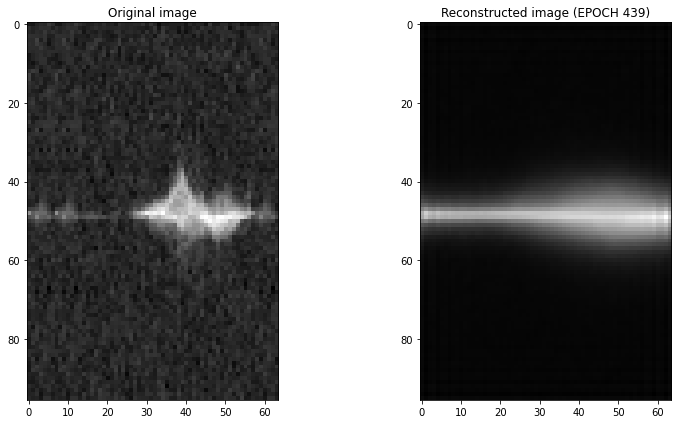

Epoch 440/500, Train Loss: 139258.7358, Validation Loss: 139204.6951
Time for epoch 440 is 9.267691373825073 sec


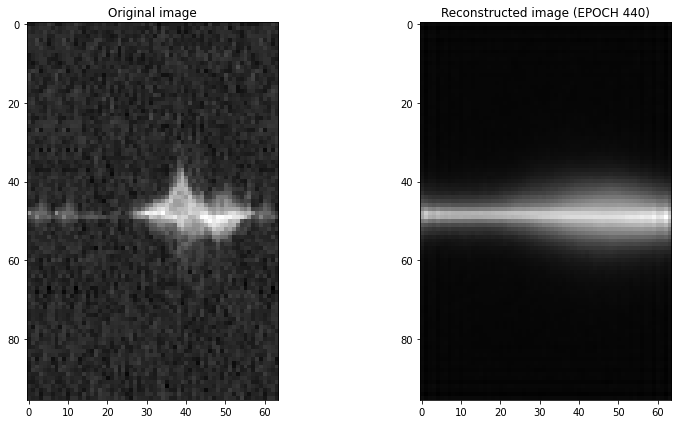

Epoch 441/500, Train Loss: 139267.7028, Validation Loss: 139205.8062
Time for epoch 441 is 9.07981824874878 sec


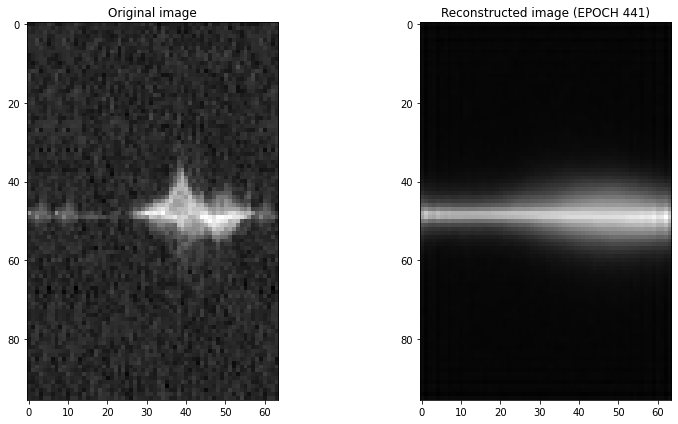

Epoch 442/500, Train Loss: 139281.0341, Validation Loss: 139215.9733
Time for epoch 442 is 9.00312614440918 sec


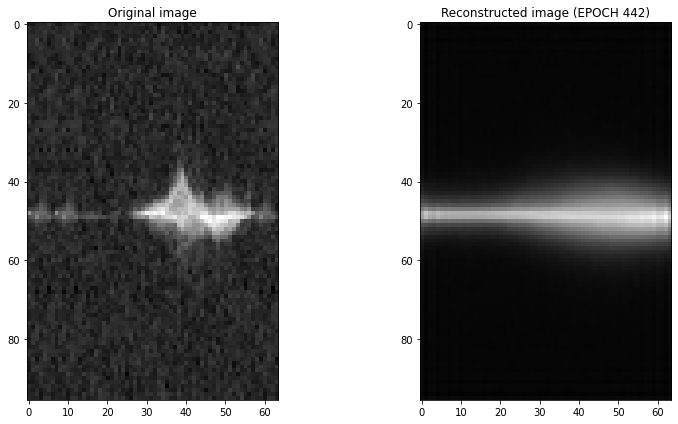

Epoch 443/500, Train Loss: 139262.4122, Validation Loss: 139206.4096
Time for epoch 443 is 8.652062177658081 sec


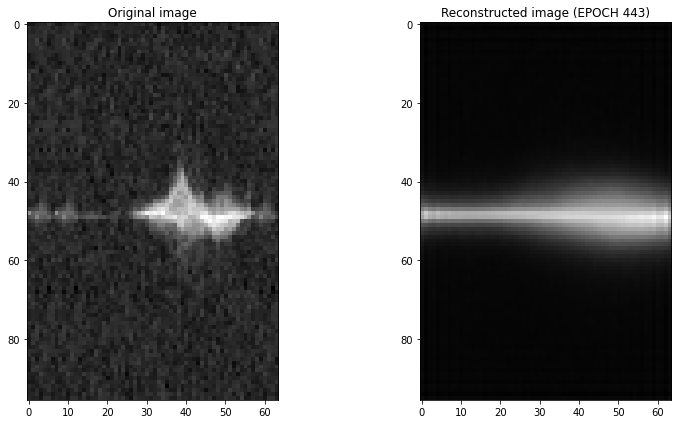

Epoch 444/500, Train Loss: 139259.5993, Validation Loss: 139206.1764
Time for epoch 444 is 8.956531524658203 sec


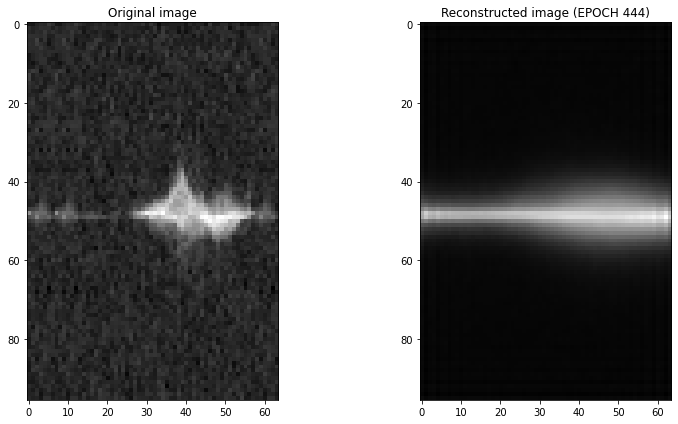

Epoch 445/500, Train Loss: 139258.0257, Validation Loss: 139203.8900
Time for epoch 445 is 9.070342779159546 sec


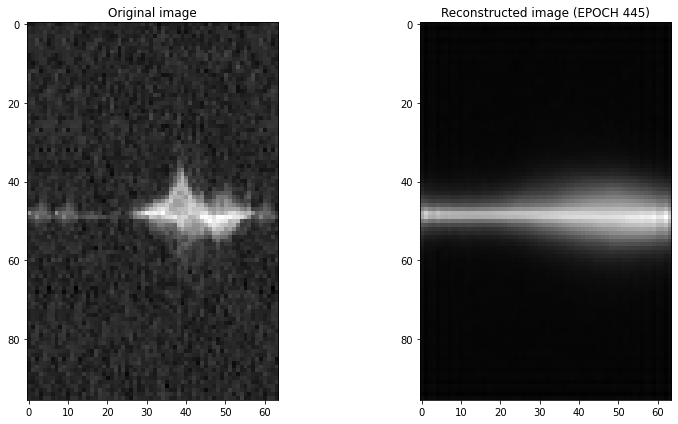

Epoch 446/500, Train Loss: 139258.2635, Validation Loss: 139201.0113
Time for epoch 446 is 8.855637073516846 sec


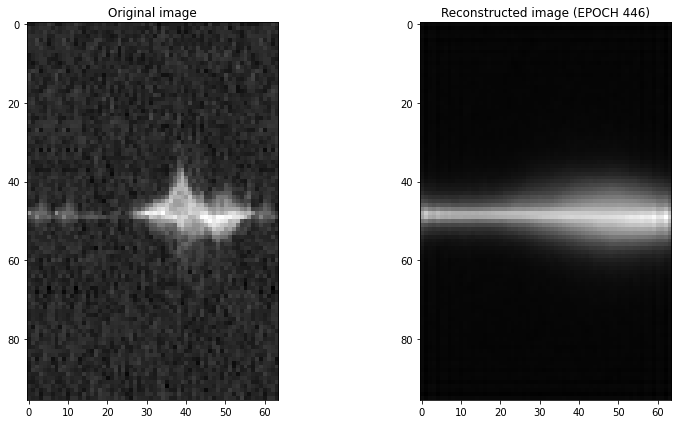

Epoch 447/500, Train Loss: 139257.3145, Validation Loss: 139200.7973
Time for epoch 447 is 8.617073059082031 sec


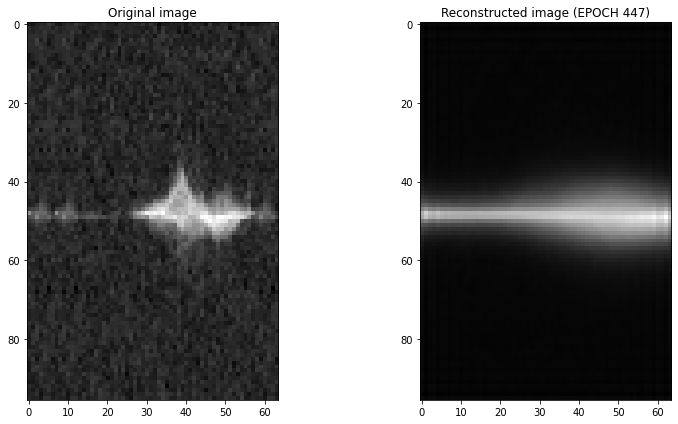

Epoch 448/500, Train Loss: 139256.9688, Validation Loss: 139201.1911
Time for epoch 448 is 9.057701110839844 sec


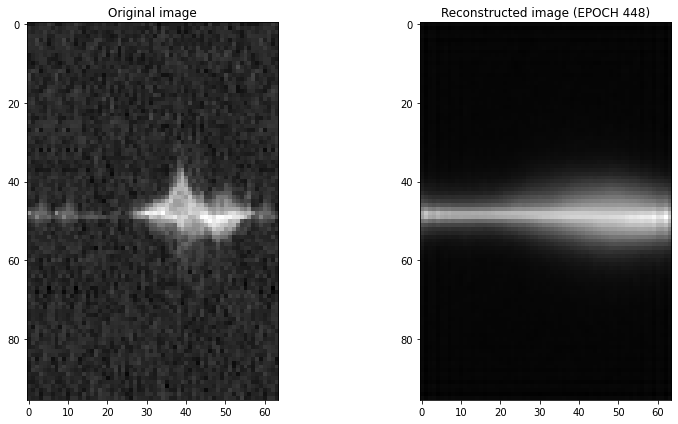

Epoch 449/500, Train Loss: 139254.7942, Validation Loss: 139200.2821
Time for epoch 449 is 9.15955901145935 sec


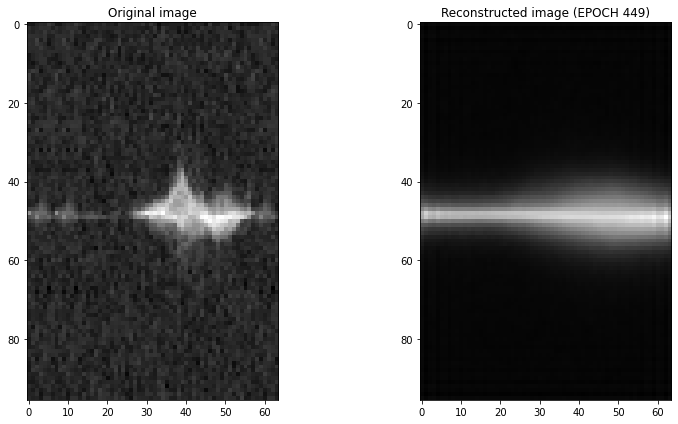

Epoch 450/500, Train Loss: 139255.8425, Validation Loss: 139200.2220
Time for epoch 450 is 8.650139570236206 sec


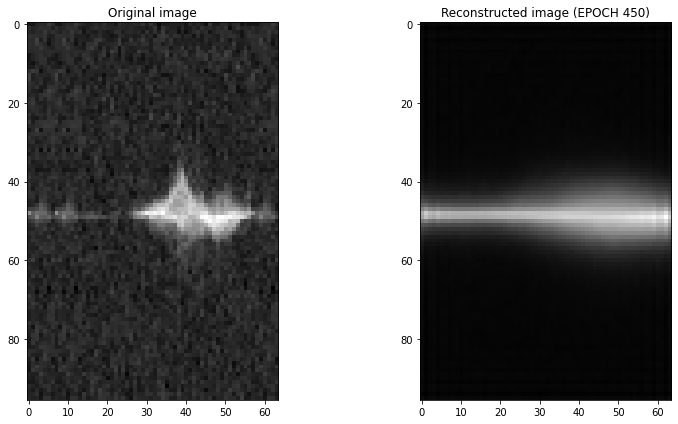

Epoch 451/500, Train Loss: 139256.0737, Validation Loss: 139199.8142
Time for epoch 451 is 8.849308013916016 sec


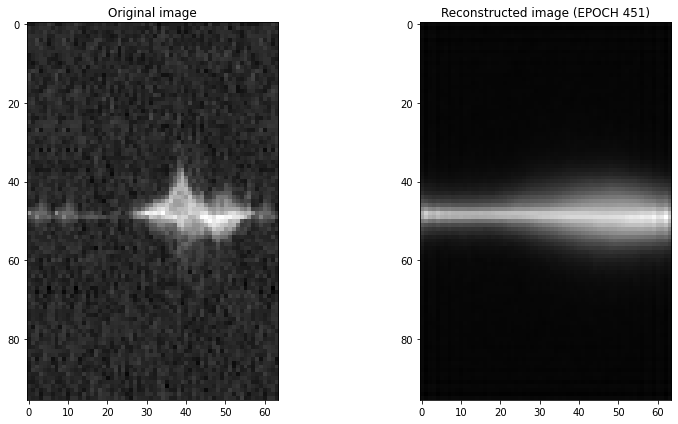

Epoch 452/500, Train Loss: 139256.3935, Validation Loss: 139201.4347
Time for epoch 452 is 9.022481203079224 sec


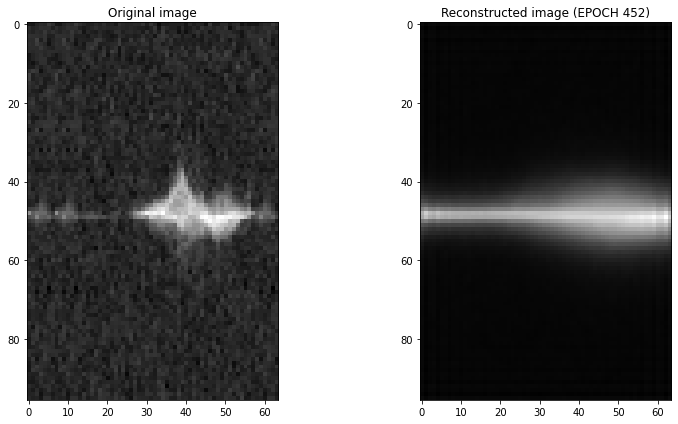

Epoch 453/500, Train Loss: 139256.8552, Validation Loss: 139204.3592
Time for epoch 453 is 9.23960566520691 sec


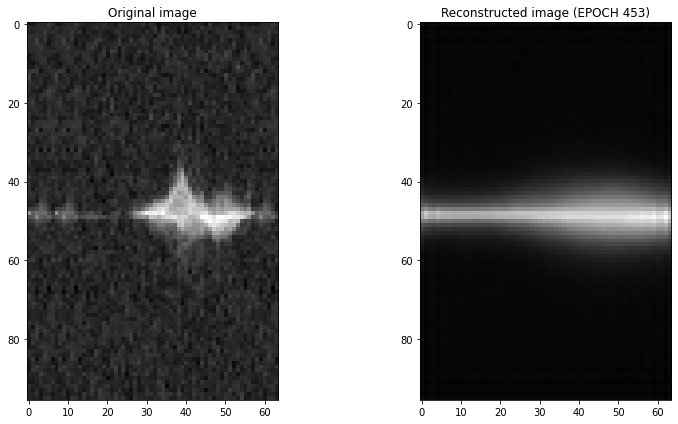

Epoch 454/500, Train Loss: 139264.7598, Validation Loss: 139205.6106
Time for epoch 454 is 9.127079963684082 sec


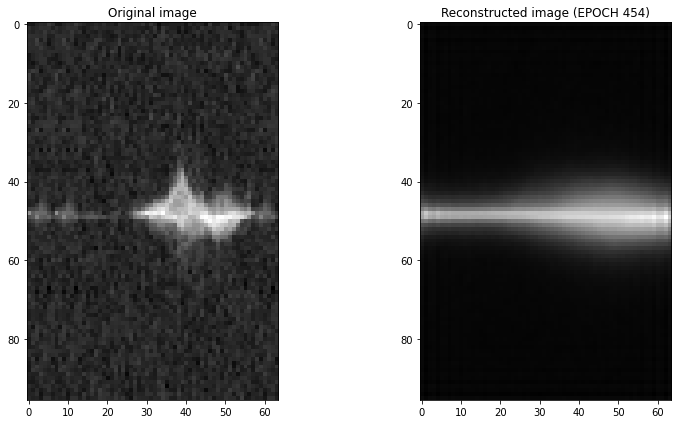

Epoch 455/500, Train Loss: 139257.2828, Validation Loss: 139200.2976
Time for epoch 455 is 8.834937572479248 sec


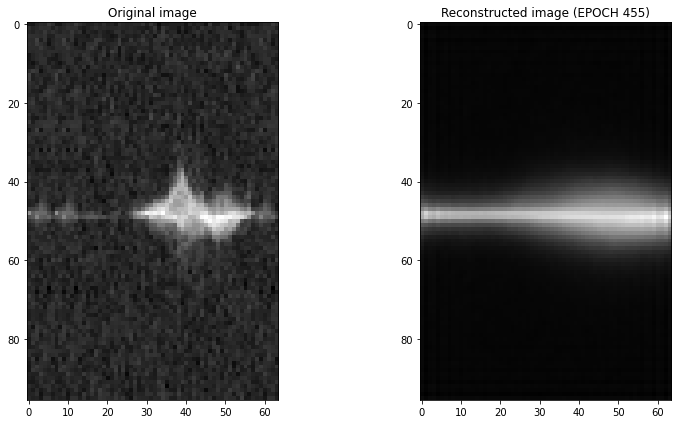

Epoch 456/500, Train Loss: 139255.8300, Validation Loss: 139201.3892
Time for epoch 456 is 9.018446683883667 sec


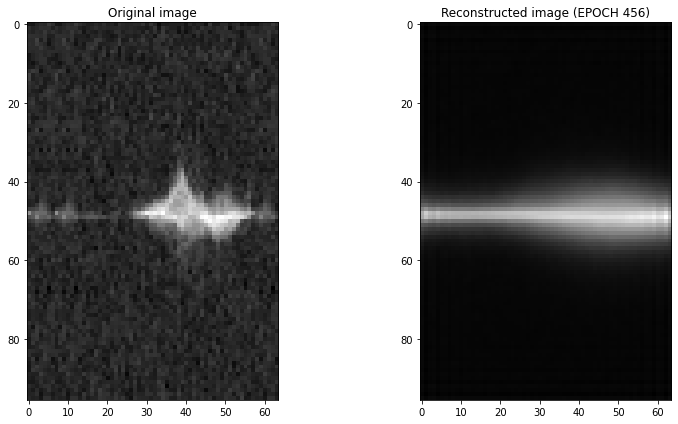

Epoch 457/500, Train Loss: 139254.8781, Validation Loss: 139202.9682
Time for epoch 457 is 9.212353706359863 sec


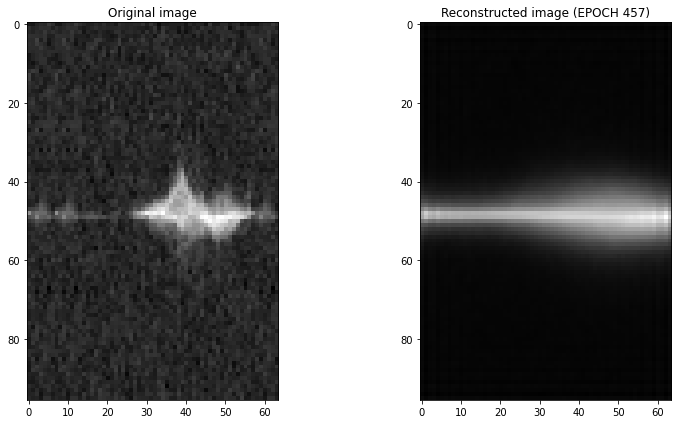

Epoch 458/500, Train Loss: 139256.7330, Validation Loss: 139202.6000
Time for epoch 458 is 8.51992917060852 sec


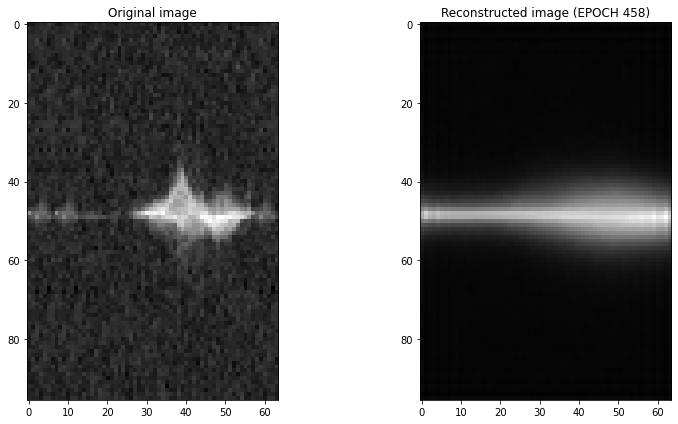

Epoch 459/500, Train Loss: 139274.6553, Validation Loss: 139217.3331
Time for epoch 459 is 9.029585123062134 sec


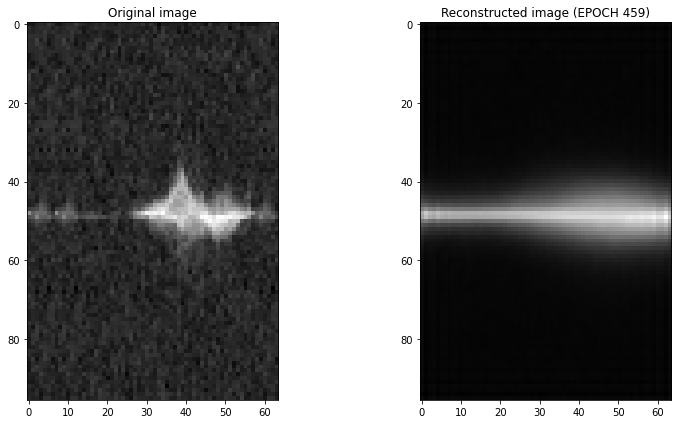

Epoch 460/500, Train Loss: 139262.7316, Validation Loss: 139206.2505
Time for epoch 460 is 9.027472734451294 sec


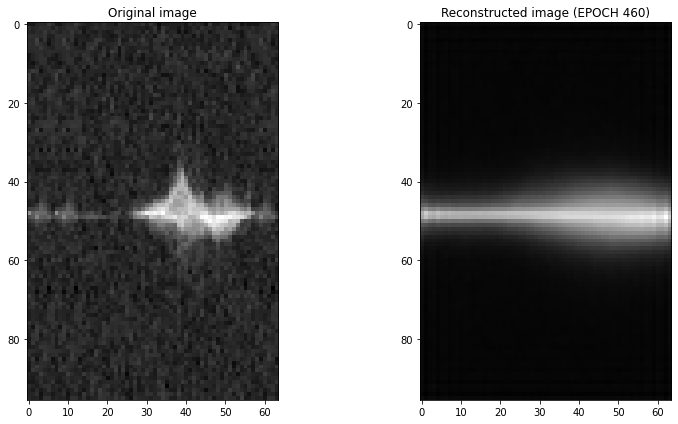

Epoch 461/500, Train Loss: 139260.7399, Validation Loss: 139206.0195
Time for epoch 461 is 9.153766870498657 sec


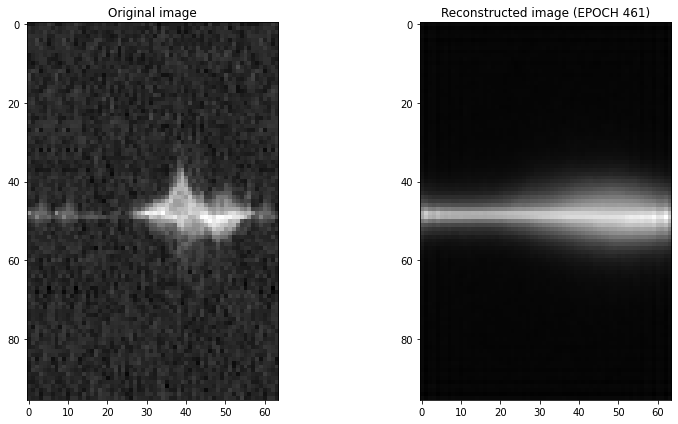

Epoch 462/500, Train Loss: 139255.9940, Validation Loss: 139203.1187
Time for epoch 462 is 8.687687635421753 sec


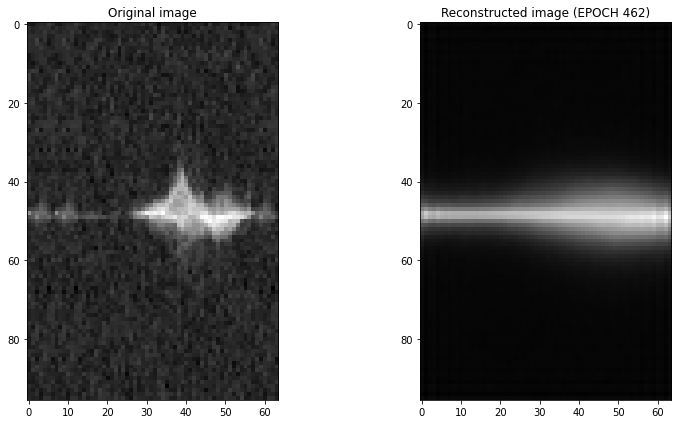

Epoch 463/500, Train Loss: 139254.8541, Validation Loss: 139203.4527
Time for epoch 463 is 9.130224704742432 sec


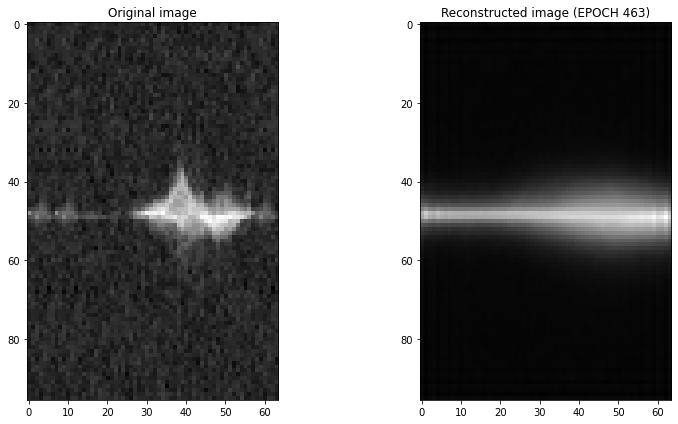

Epoch 464/500, Train Loss: 139255.8093, Validation Loss: 139202.2819
Time for epoch 464 is 9.067963123321533 sec


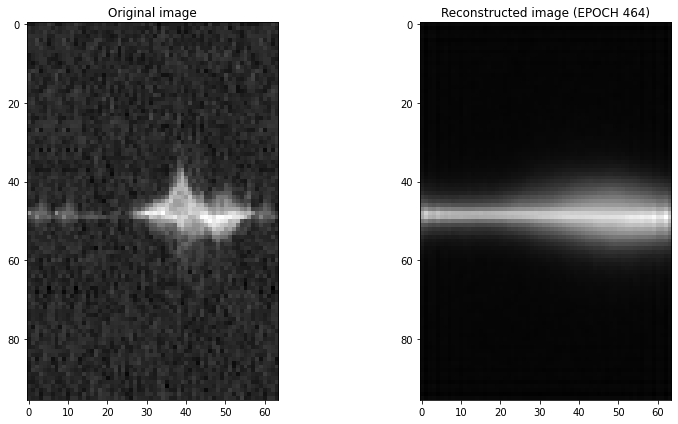

Epoch 465/500, Train Loss: 139256.1172, Validation Loss: 139201.6672
Time for epoch 465 is 9.244313478469849 sec


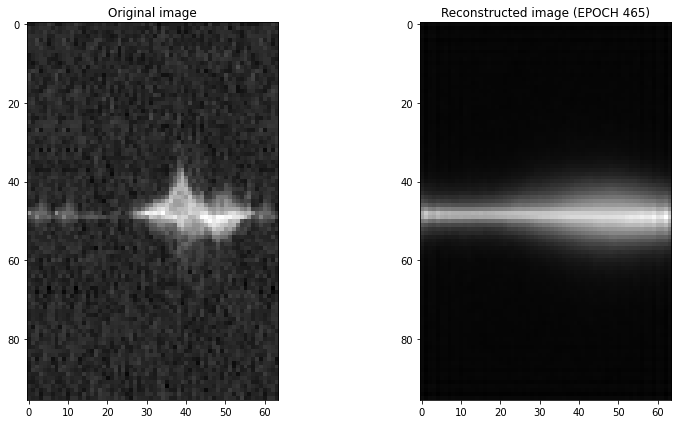

Epoch 466/500, Train Loss: 139254.5297, Validation Loss: 139201.3926
Time for epoch 466 is 8.6187002658844 sec


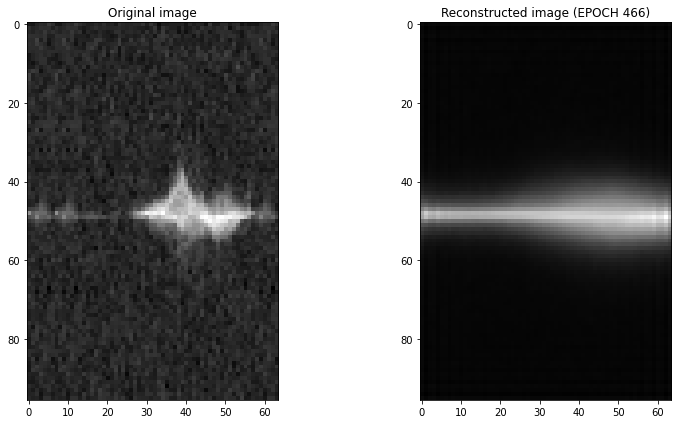

Epoch 467/500, Train Loss: 139257.3621, Validation Loss: 139200.0935
Time for epoch 467 is 9.080180644989014 sec


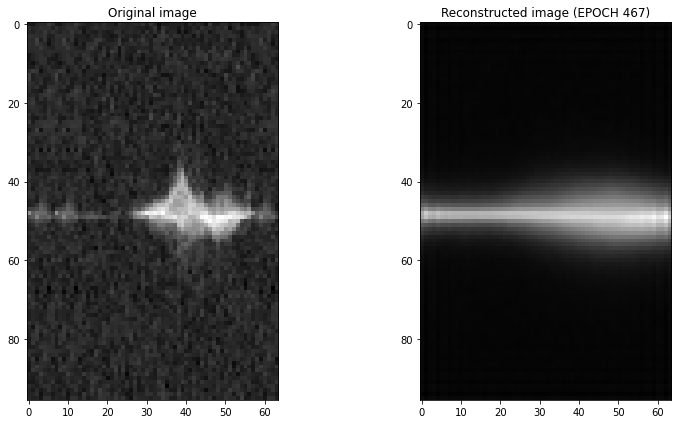

Epoch 468/500, Train Loss: 139254.6749, Validation Loss: 139201.1796
Time for epoch 468 is 9.019479990005493 sec


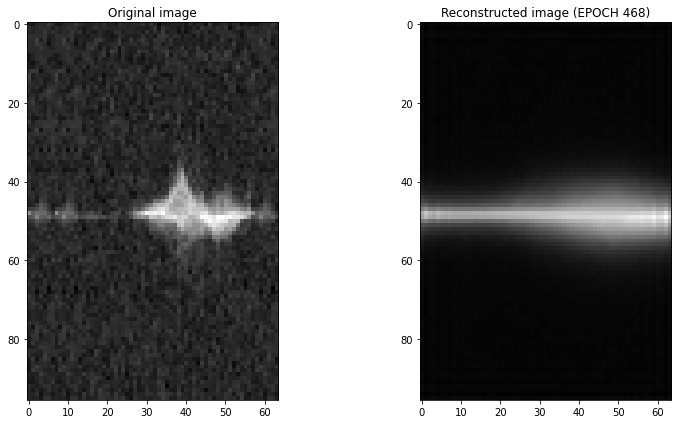

Epoch 469/500, Train Loss: 139255.8789, Validation Loss: 139204.2304
Time for epoch 469 is 8.966556310653687 sec


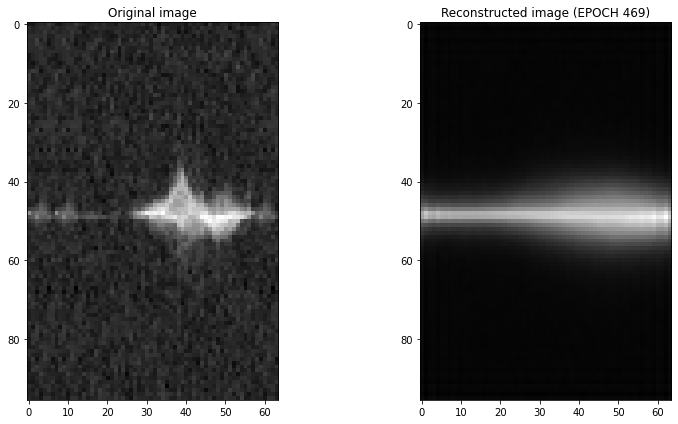

Epoch 470/500, Train Loss: 139253.8276, Validation Loss: 139205.3951
Time for epoch 470 is 8.644549131393433 sec


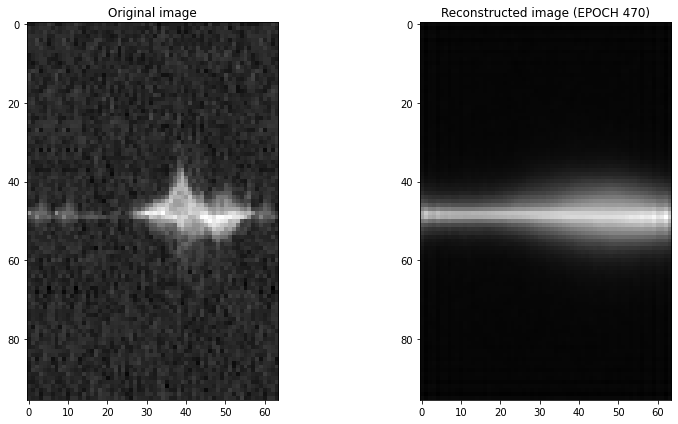

Epoch 471/500, Train Loss: 139253.4704, Validation Loss: 139201.0891
Time for epoch 471 is 9.13378119468689 sec


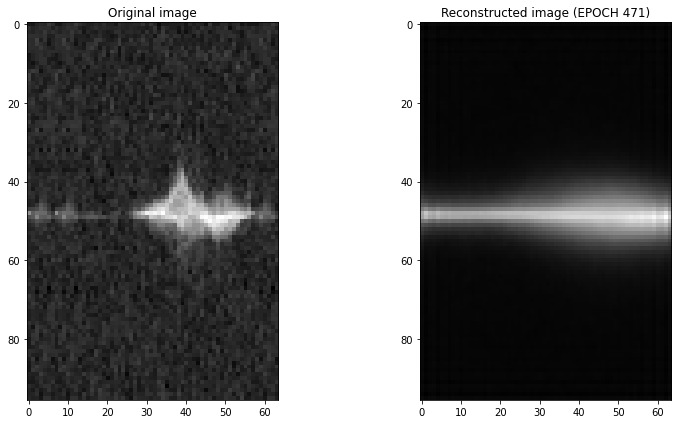

Epoch 472/500, Train Loss: 139256.5458, Validation Loss: 139202.1785
Time for epoch 472 is 9.127650499343872 sec


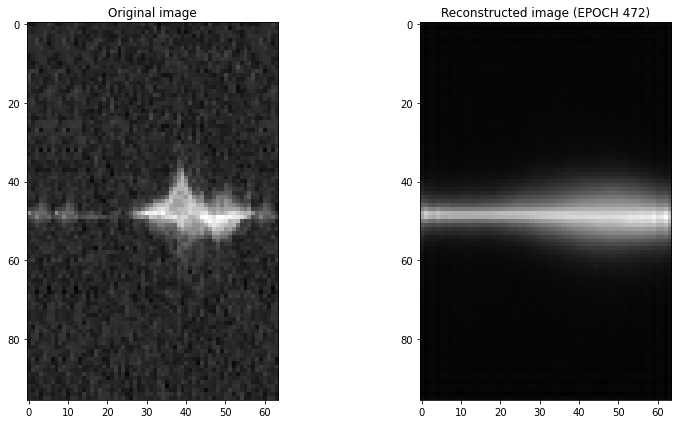

Epoch 473/500, Train Loss: 139254.7084, Validation Loss: 139202.0050
Time for epoch 473 is 9.462087392807007 sec


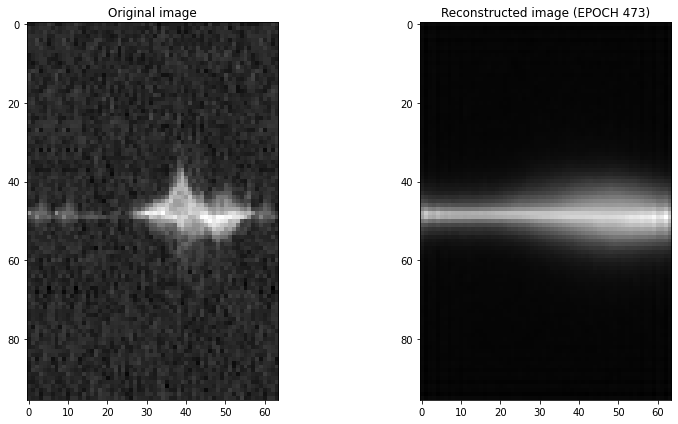

Epoch 474/500, Train Loss: 139256.9117, Validation Loss: 139204.8745
Time for epoch 474 is 9.21162462234497 sec


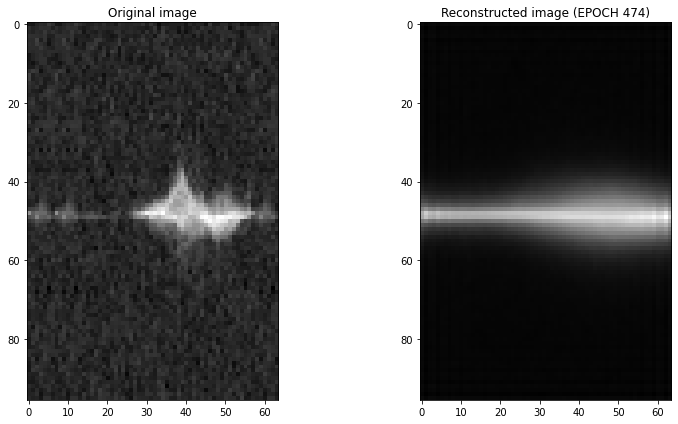

Epoch 475/500, Train Loss: 139253.3325, Validation Loss: 139202.8333
Time for epoch 475 is 9.094934701919556 sec


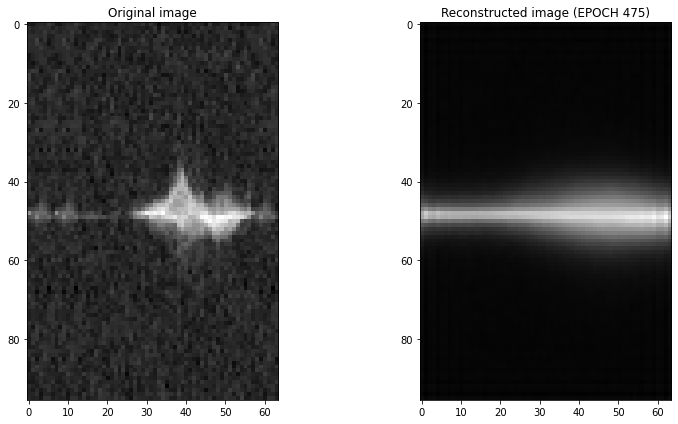

Epoch 476/500, Train Loss: 139254.8763, Validation Loss: 139199.7503
Time for epoch 476 is 9.18889045715332 sec


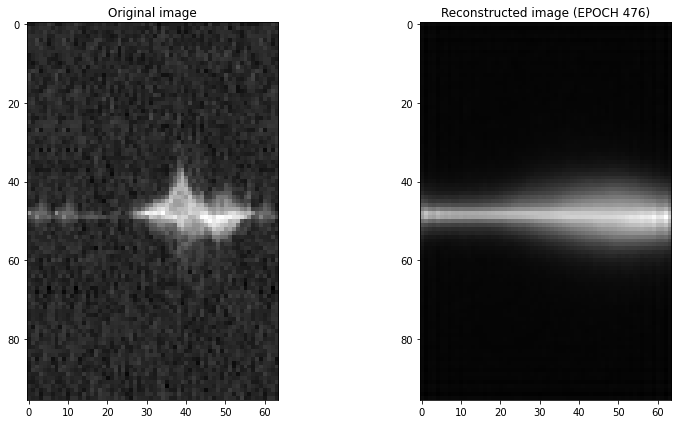

Epoch 477/500, Train Loss: 139253.1715, Validation Loss: 139202.0604
Time for epoch 477 is 8.727879047393799 sec


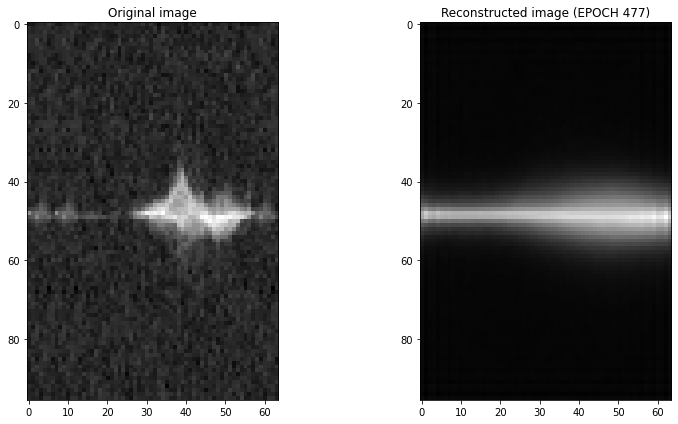

Epoch 478/500, Train Loss: 139253.8873, Validation Loss: 139201.7927
Time for epoch 478 is 8.98308539390564 sec


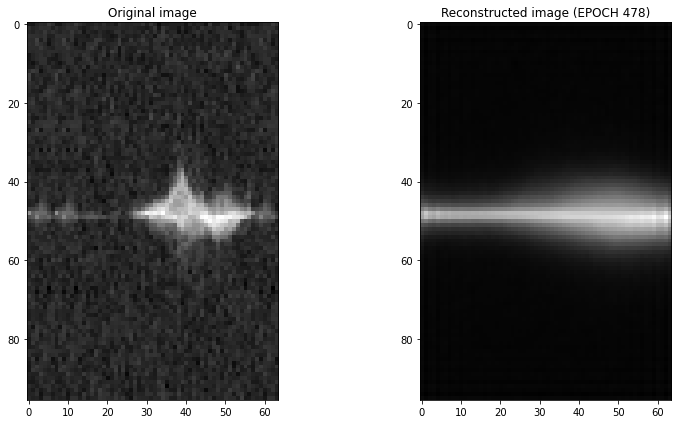

Epoch 479/500, Train Loss: 139253.9850, Validation Loss: 139199.8223
Time for epoch 479 is 9.05266809463501 sec


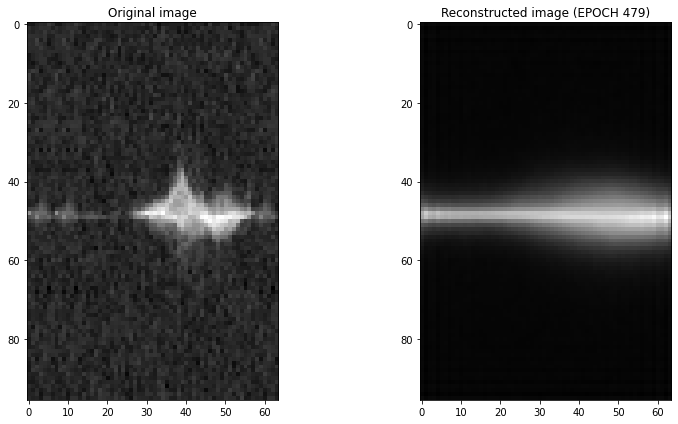

Epoch 480/500, Train Loss: 139253.4890, Validation Loss: 139203.4033
Time for epoch 480 is 9.214372396469116 sec


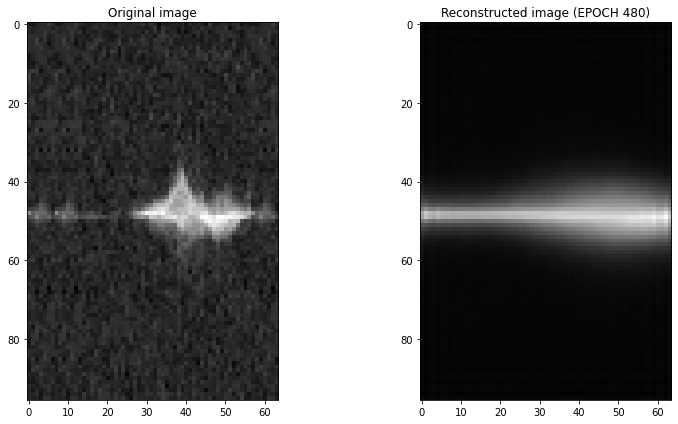

Epoch 481/500, Train Loss: 139252.8681, Validation Loss: 139199.6651
Time for epoch 481 is 8.604390382766724 sec


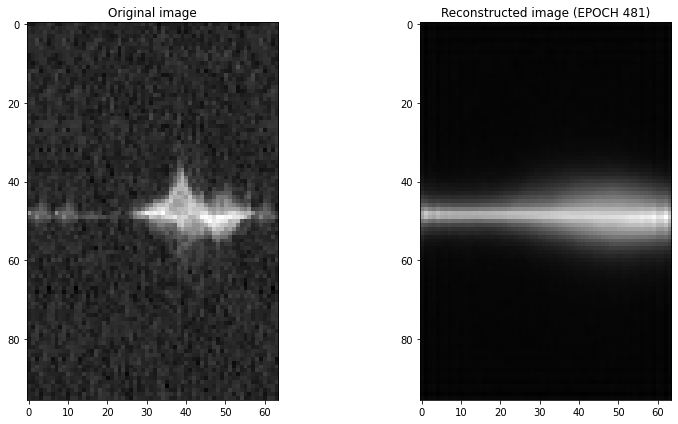

Epoch 482/500, Train Loss: 139251.4457, Validation Loss: 139201.5549
Time for epoch 482 is 9.02937650680542 sec


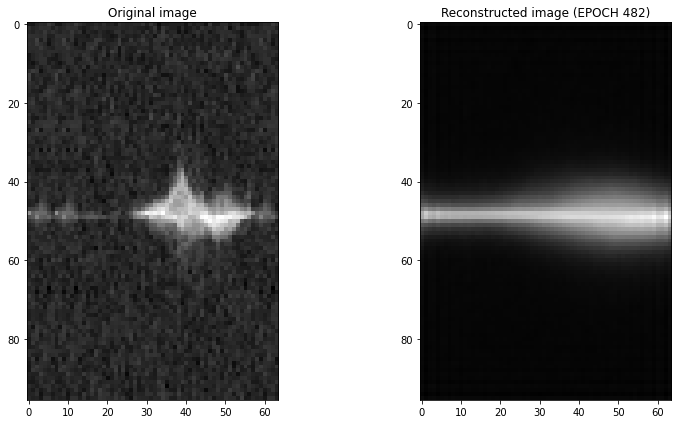

Epoch 483/500, Train Loss: 139253.1504, Validation Loss: 139202.7214
Time for epoch 483 is 9.08976936340332 sec


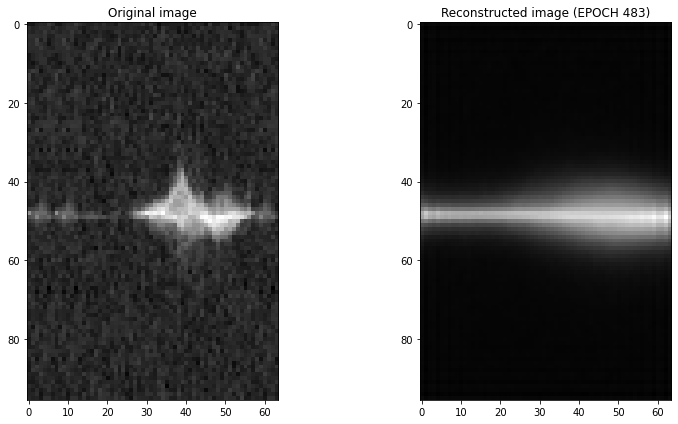

Epoch 484/500, Train Loss: 139253.2480, Validation Loss: 139202.6468
Time for epoch 484 is 9.343580722808838 sec


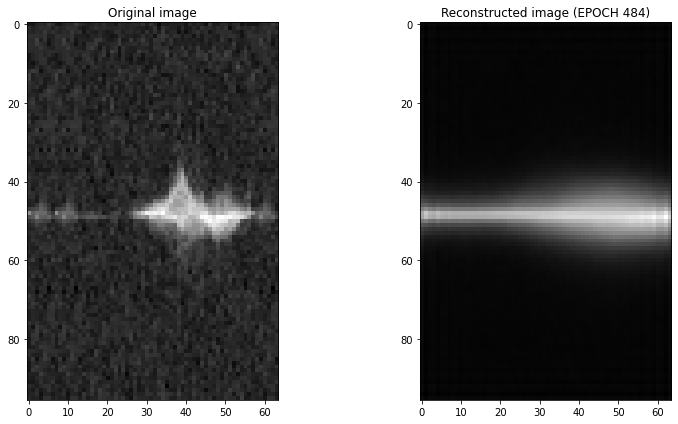

Epoch 485/500, Train Loss: 139252.8446, Validation Loss: 139202.0090
Time for epoch 485 is 8.743381023406982 sec


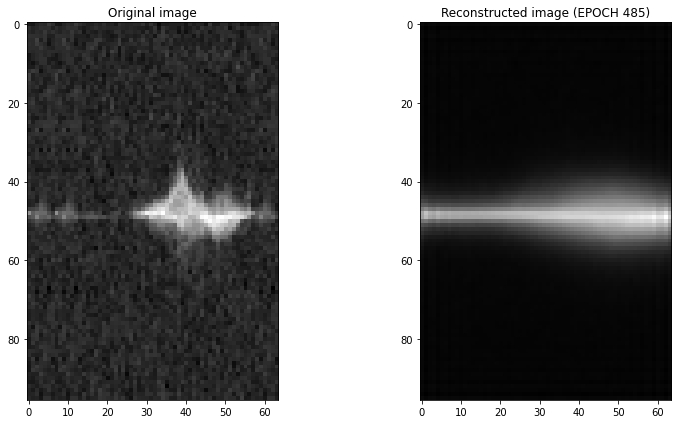

Epoch 486/500, Train Loss: 139252.1311, Validation Loss: 139201.4030
Time for epoch 486 is 9.08677363395691 sec


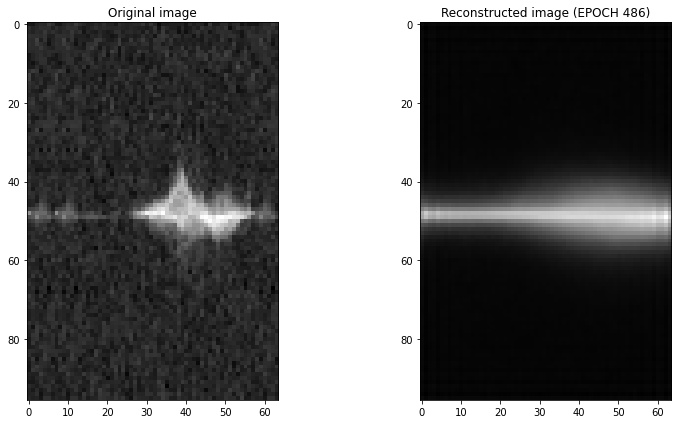

Epoch 487/500, Train Loss: 139251.9050, Validation Loss: 139202.1439
Time for epoch 487 is 9.313525915145874 sec


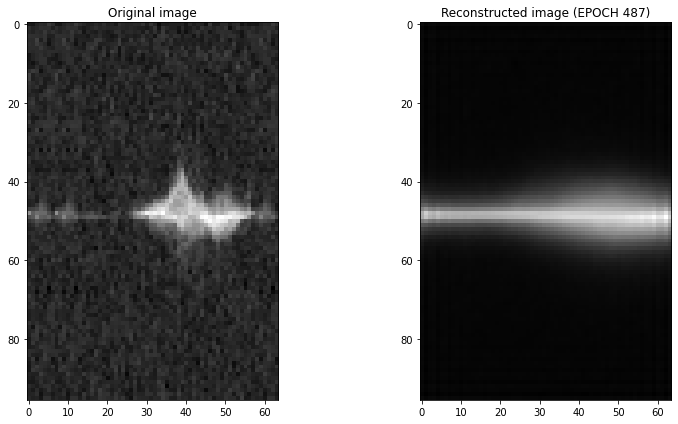

Epoch 488/500, Train Loss: 139253.5589, Validation Loss: 139199.5798
Time for epoch 488 is 9.254595041275024 sec


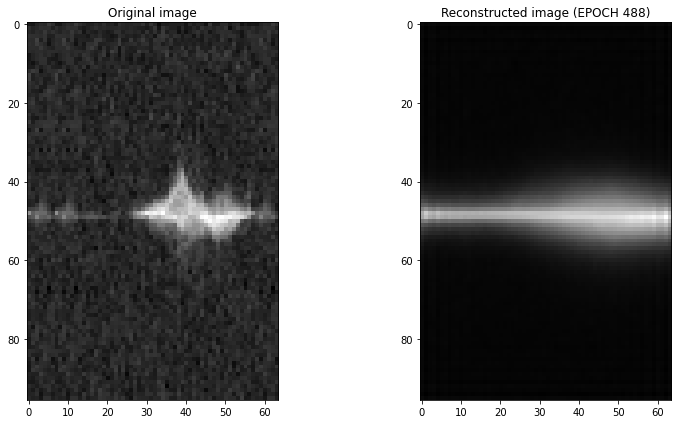

Epoch 489/500, Train Loss: 139251.3993, Validation Loss: 139203.1504
Time for epoch 489 is 8.79444169998169 sec


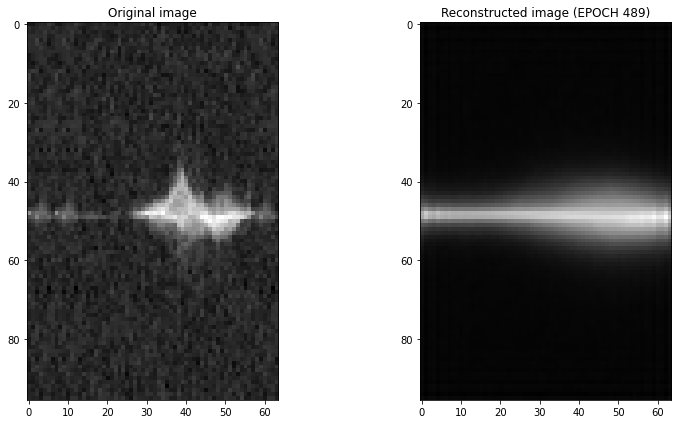

Epoch 490/500, Train Loss: 139254.1030, Validation Loss: 139200.0818
Time for epoch 490 is 9.161030769348145 sec


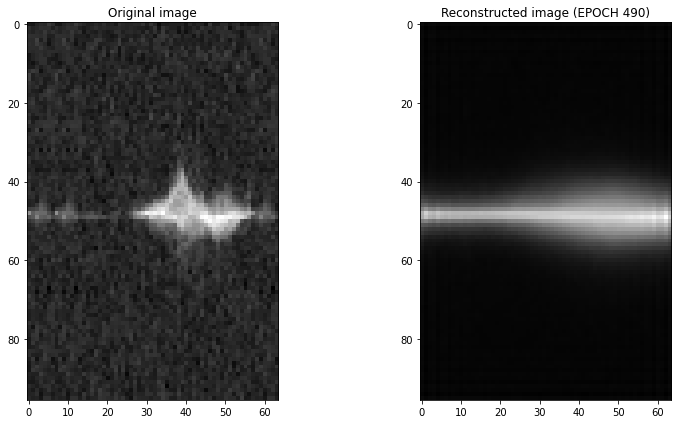

Epoch 491/500, Train Loss: 139252.5573, Validation Loss: 139204.1187
Time for epoch 491 is 9.101501703262329 sec


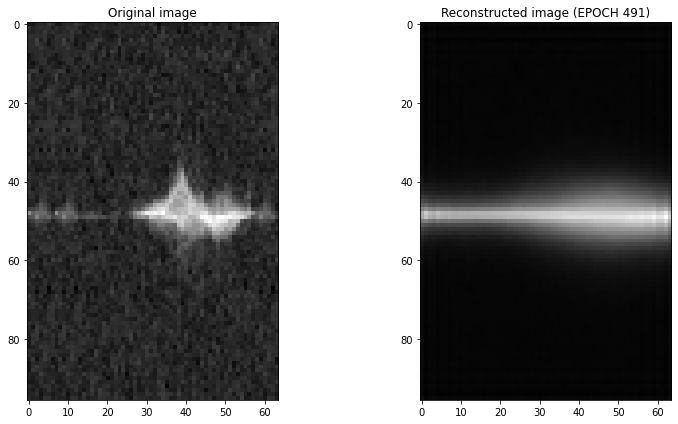

Epoch 492/500, Train Loss: 139251.7439, Validation Loss: 139203.8035
Time for epoch 492 is 9.67373514175415 sec


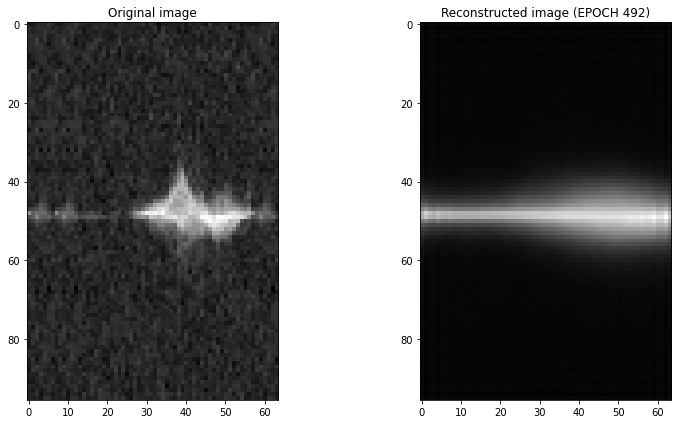

Epoch 493/500, Train Loss: 139252.8177, Validation Loss: 139205.5904
Time for epoch 493 is 9.017796993255615 sec


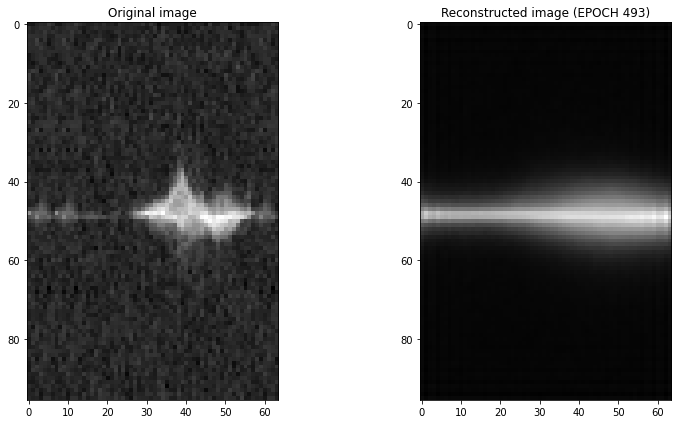

Epoch 494/500, Train Loss: 139253.7862, Validation Loss: 139201.3819
Time for epoch 494 is 9.022530317306519 sec


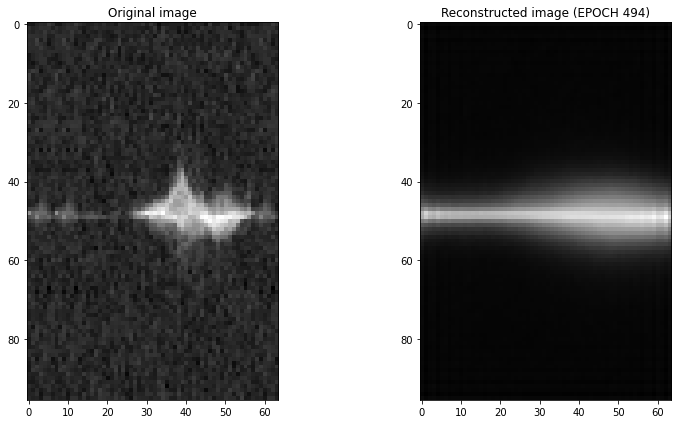

Epoch 495/500, Train Loss: 139253.8481, Validation Loss: 139202.7532
Time for epoch 495 is 9.005629301071167 sec


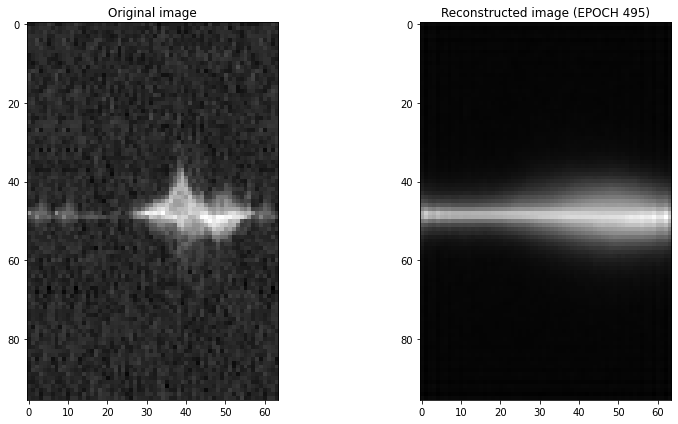

Epoch 496/500, Train Loss: 139252.0873, Validation Loss: 139200.4577
Time for epoch 496 is 9.225093126296997 sec


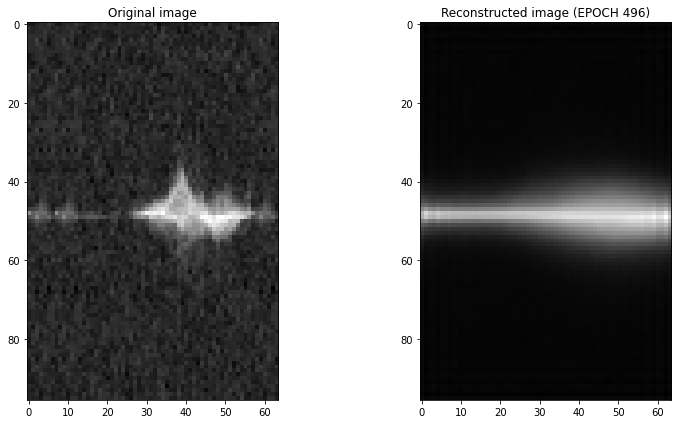

Epoch 497/500, Train Loss: 139251.8517, Validation Loss: 139204.0856
Time for epoch 497 is 8.61764931678772 sec


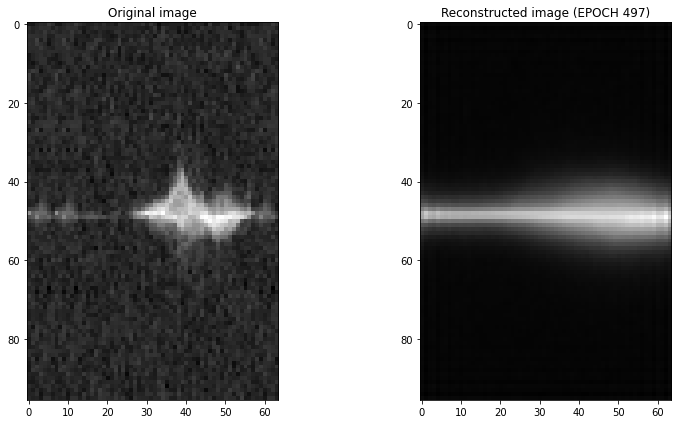

Epoch 498/500, Train Loss: 139253.8323, Validation Loss: 139203.3331
Time for epoch 498 is 8.98603630065918 sec


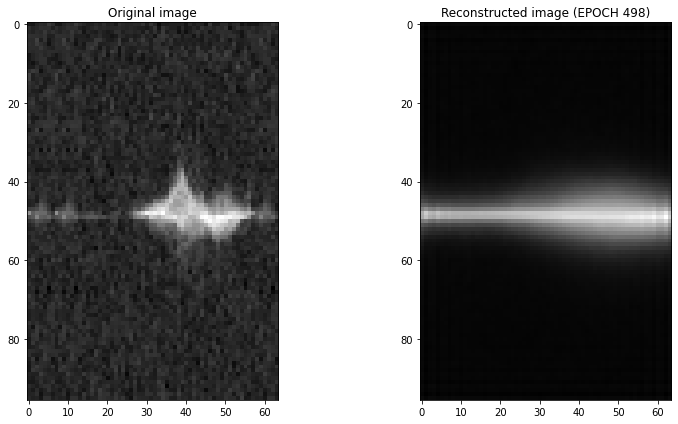

Epoch 499/500, Train Loss: 139251.3821, Validation Loss: 139200.9978
Time for epoch 499 is 9.203158855438232 sec


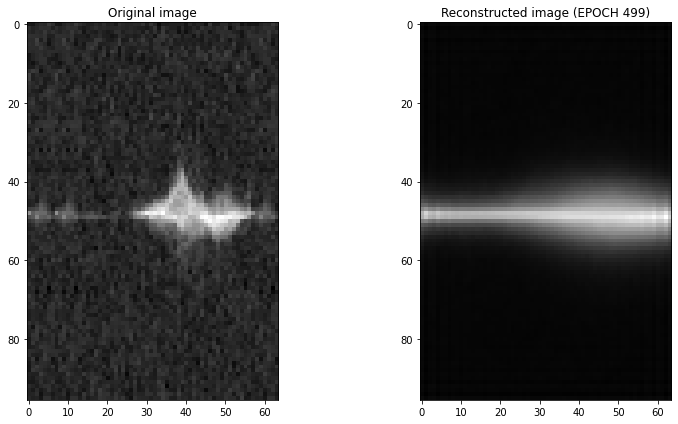

Epoch 500/500, Train Loss: 139251.9140, Validation Loss: 139199.2834
Time for epoch 500 is 8.995590209960938 sec


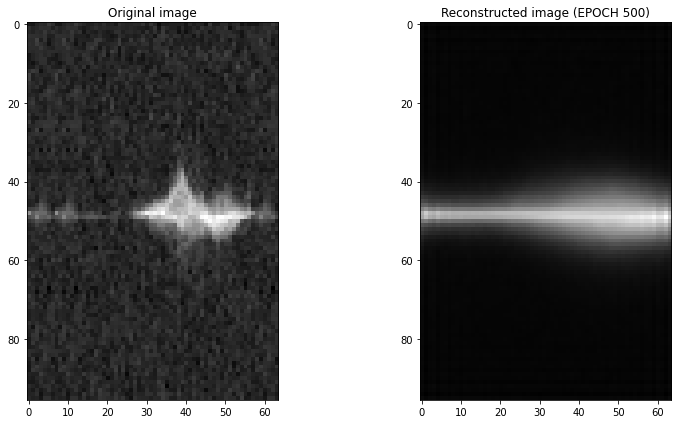

<Figure size 432x288 with 0 Axes>

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.apply(weights_init)
model = model.to(device)
trainl, trainrl, trainkl, vall, valrl, valkl = train_vae(model, dataloader, num_epochs=500, device=device)

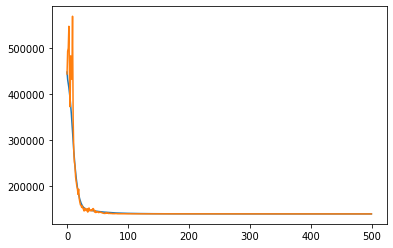

In [13]:
plt.plot(np.arange(500), trainl)
plt.plot(np.arange(500), vall)
plt.show()

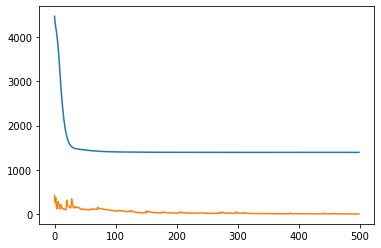

In [14]:
plt.plot(np.arange(500), trainrl)
plt.plot(np.arange(500), trainkl)
plt.show()

In [27]:
# Generate set
import random
from tqdm import tqdm

N = 1000
labels_names = ['fall on floor of room', 'get in  bed', 'get out  bed', 'lie in bed',
                   'roll in bed', 'sit down on bed',
                   'sit down on chair', 'sit in bed',
                   'stand up from bed', 'stand up from chair',
                   'stand up from floor of room', 'walk to bed',
                   'walk to chair', 'walk to room']
labels = [random.randint(0,13) for i in range(N)]
zs = torch.randn([N, z_dim], device=device)
fake_data = np.empty((1,96,64))
for l,z in tqdm(zip(labels, zs)):
  if isinstance(l, int):
    l = torch.tensor(l).to(device)
    z = torch.cat([z, F.one_hot(l,14)], 0)
    fake_dato = model.decoder(z.unsqueeze(0))
    fake_data = np.append(fake_data, fake_dato.detach().cpu()[0], axis=1)
labels_n = [labels_names[l] for l in labels]
fout = h5py.File('cVAEgenerated1000.h5', 'w')
fout.create_dataset('mDoppler', data=fake_data)
fout.create_dataset('label', data=np.array(labels_n, dtype='S'))
fout.close()

1000it [00:09, 108.30it/s]


In [28]:
fout = h5py.File('/content/drive/MyDrive/PatientActivityRecognition/cVAEgenerated1000.h5', 'w')
fout.create_dataset('mDoppler', data=fake_data)
fout.create_dataset('labels', data=np.array(labels_n, dtype='S'))
fout.close()

In [ ]:
import pandas as pd
from tqdm import tqdm
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(trainset):
    img = sample[0].unsqueeze(0).to(device)
    lb = torch.tensor([sample[1]]).to(device)
    label = sample[1]
    # Encode image
    model.encoder.eval()
    with torch.no_grad():
        encoded_img, _ = model.encoder(img, lb)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
encoded_samples_reduced_PCA = pca.fit_transform(encoded_samples)
encoded_samples_reduced_PCA

In [ ]:
pca.explained_variance_ratio_

In [ ]:
pca.components_

In [ ]:
encoded_samples_reduced_PCA[:,0:2]

In [ ]:
np.unique(encoded_samples.label)

In [ ]:
from sklearn.svm import SVC
import matplotlib.pyplot as plt
#from sklearn import svm, datasets


x = encoded_samples_reduced_PCA#[:,0:2]

class_model = SVC(kernel="rbf", gamma=0.7, C=1.0)

clf = class_model.fit(x, encoded_samples.label)

In [ ]:
Z = clf.predict(x)

In [ ]:
np.where(Z != encoded_samples.label)

In [ ]:
unique, counts = np.unique(Z, return_counts=True)
counts

In [ ]:
x

In [ ]:
from sklearn.svm import SVC
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets

X = x  # we only take the first two features.
y = encoded_samples.label

def make_meshgrid(x, y, h=.02):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy

def plot_contours(ax, clf, xx, yy, **params):
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    print(np.unique(Z))
  
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out


fig, ax = plt.subplots()
# title for the plots
title = ('Decision surface of RBF SVC ')
# Set-up grid for plotting.
X0, X1 = X[:, 0], X[:, 1]
xx, yy = make_meshgrid(X0, X1)

plot_contours(ax, clf, xx, yy, cmap='hsv', alpha=0.2)
ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
ax.set_ylabel('y label here')
ax.set_xlabel('x label here')
ax.set_xticks(())
ax.set_yticks(())
ax.set_title(title)
#ax.legend()
plt.show()


In [ ]:
import plotly.express as px

In [ ]:
encoded_samples_reduced_PCA[:,0]

In [ ]:
encoded_samples_reduced_PCA = pd.DataFrame({
    "Enc. Variable 0": encoded_samples_reduced_PCA[:,0],
    "Enc. Variable 1": encoded_samples_reduced_PCA[:,1], 
    "label":encoded_samples.label}
)
px.scatter(encoded_samples_reduced_PCA, x='Enc. Variable 0', y='Enc. Variable 1', color="label", opacity=0.7)

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, init="random", learning_rate="auto", perplexity=300)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples)
encoded_samples_reduced_TSNE = pd.DataFrame({
    "Enc. Variable 0": encoded_samples_reduced_TSNE[:, 0],
    "Enc. Variable 1": encoded_samples_reduced_TSNE[:, 1], 
    "label":encoded_samples.label}
)
px.scatter(encoded_samples_reduced_TSNE, x='Enc. Variable 0', y='Enc. Variable 1', color='label', opacity=0.7)